<table align="center">
  <td align="center"><a target="_blank" href="http://introtodeeplearning.com">
        <img src="https://i.ibb.co/Jr88sn2/mit.png" style="padding-bottom:5px;" />
      Visit MIT Deep Learning</a></td>
  <td align="center"><a target="_blank" href="https://colab.research.google.com/github/aamini/introtodeeplearning/blob/master/lab3/Part2_BiasAndUncertainty.ipynb">
        <img src="https://i.ibb.co/2P3SLwK/colab.png"  style="padding-bottom:5px;" />Run in Google Colab</a></td>
  <td align="center"><a target="_blank" href="https://github.com/aamini/introtodeeplearning/blob/master/lab3/Part2_BiasAndUncertainty.ipynb">
        <img src="https://i.ibb.co/xfJbPmL/github.png"  height="70px" style="padding-bottom:5px;"  />View Source on GitHub</a></td>
</table>

# Copyright Information

In [1]:
# Copyright 2023 MIT Introduction to Deep Learning. All Rights Reserved.
#
# Licensed under the MIT License. You may not use this file except in compliance
# with the License. Use and/or modification of this code outside of MIT Introduction
# to Deep Learning must reference:
#
# © MIT Introduction to Deep Learning
# http://introtodeeplearning.com
#

# Laboratory 3: Debiasing, Uncertainty, and Robustness

# Part 2: Mitigating Bias and Uncertainty in Facial Detection Systems

In Lab 2, we defined a semi-supervised VAE (SS-VAE) to diagnose feature representation disparities and biases in facial detection systems. In Lab 3 Part 1, we gained experience with [Capsa](https://github.com/themis-ai/capsa/) and its ability to build risk-aware models automatically through wrapping. Now in this lab, we will put these two together: using Capsa to build systems that can *automatically* uncover and mitigate bias and uncertainty in facial detection systems.

As we have seen, automatically detecting and mitigating bias and uncertainty is crucial to deploying fair and safe models. Building off our foundation with Capsa, developed by [Themis AI](https://themisai.io/), we will now use Capsa for the facial detection problem, in order to diagnose risks in facial detection models. You will then design and create strategies to mitigate these risks, with goal of improving model performance across the entire facial detection dataset.

**Your goal in this lab -- and the associated competition -- is to design a strategic solution for bias and uncertainty mitigation, using Capsa.** The approaches and solutions with oustanding performance will be recognized with outstanding prizes! Details on the submission process are at the end of this lab.

![Capsa overview](https://raw.githubusercontent.com/aamini/introtodeeplearning/2023/lab3/img/capsa_overview.png)

Let's get started by installing the necessary dependencies:

In [ ]:
# Import Tensorflow 2.0
#%tensorflow_version 2.x
import tensorflow as tf

import IPython
import functools
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# Download and import the MIT 6.S191 package
!pip install git+https://github.com/aamini/introtodeeplearning.git@2023
import mitdeeplearning as mdl

# Download and import capsa
!pip install capsa
import capsa

In [3]:
from google.colab import drive
drive.mount('/content/drive')

import sys
sys.path.insert(0,'/content/drive/My Drive/capsa-0.1.5')

import capsa

/usr/local/lib/python3.10/dist-packages/pexpect/popen_spawn.py:60: DeprecationWarning: setDaemon() is deprecated, set the daemon attribute instead
  self._read_thread.setDaemon(True)


Mounted at /content/drive


/usr/local/lib/python3.10/dist-packages/tensorflow_probability/python/__init__.py:57: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if (distutils.version.LooseVersion(tf.__version__) <


# 3.1 Datasets

Since we are again focusing on the facial detection problem, we will use the same datasets from Lab 2. To remind you, we have a dataset of positive examples (i.e., of faces) and a dataset of negative examples (i.e., of things that are not faces).

1.   **Positive training data**: [CelebA Dataset](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). A large-scale dataset (over 200K images) of celebrity faces.   
2.   **Negative training data**: [ImageNet](http://www.image-net.org/). A large-scale dataset with many images across many different categories. We will take negative examples from a variety of non-human categories.

We will evaluate trained models on an independent test dataset of face images to diagnose and mitigate potential issues with *bias, fairness, and confidence*. This will be a larger test dataset for evaluation purposes.

We begin by importing these datasets. We have defined a `DatasetLoader` class that does a bit of data pre-processing to import the training data in a usable format.

In [4]:
batch_size = 32

# Get the training data: both images from CelebA and ImageNet
path_to_training_data = tf.keras.utils.get_file('train_face_2023_perturbed_small.h5', 'https://www.dropbox.com/s/tbra3danrk5x8h5/train_face_2023_perturbed_small.h5?dl=1')
# Instantiate a DatasetLoader using the downloaded dataset
train_loader = mdl.lab3.DatasetLoader(path_to_training_data, training=True, batch_size=batch_size)
test_loader = mdl.lab3.DatasetLoader(path_to_training_data, training=False, batch_size=batch_size)

675368621/675368621 [==============================] - 40s 0us/step
Opening /root/.keras/datasets/train_face_2023_perturbed_small.h5
Loading data into memory...
Opening /root/.keras/datasets/train_face_2023_perturbed_small.h5
Loading data into memory...


### Building robustness to bias and uncertainty

Remember that we'll be training our facial detection classifiers on the large, well-curated CelebA dataset (and ImageNet), and then evaluating their accuracy by testing them on an independent test dataset. We want to mitigate the effects of unwanted bias and uncertainty on the model's predictions and performance. Your goal is to build the best-performing, most robust model, one that achieves high classification accuracy across the entire test dataset.

To achieve this, you may want to consider the three metrics introduced with Capsa: (1) representation bias, (2) data or aleatoric uncertainty, and (3) model or epistemic uncertainty. Note that all three of these metrics are different! For example, we can have well-represented examples that still have high epistemic uncertainty. Think about how you may use these metrics to improve the performance of your model.

# 3.2 Risk-aware facial detection with Capsa

In Lab 2, we built a semi-supervised variational autoencoder (SS-VAE) to learn the latent structure of our database and to uncover feature representation disparities, inspired by the approach of [uncover hidden biases](http://introtodeeplearning.com/AAAI_MitigatingAlgorithmicBias.pdf). In this lab, we'll show that we can use Capsa to build the same VAE in one line!

This sets the foundation for quantifying a key risk metric -- representation bias -- for the facial detection problem. In working to improve your model's performance, you will want to consider representation bias carefully and think about how you could mitigate the effect of representation bias.

Just like in Lab 2, we begin by defining a standard CNN-based classifier. We will then use Capsa to wrap the model and build the risk-aware VAE variant.

In [5]:
### Define the CNN classifier model ###

'''Function to define a standard CNN model'''
def make_standard_classifier(n_outputs=1, n_filters=12):
  Conv2D = functools.partial(tf.keras.layers.Conv2D, padding='same', activation='relu')
  BatchNormalization = tf.keras.layers.BatchNormalization
  Flatten = tf.keras.layers.Flatten
  Dense = functools.partial(tf.keras.layers.Dense, activation='relu')

  model = tf.keras.Sequential([
    tf.keras.Input(shape=(64,64, 3)),
    Conv2D(filters=1*n_filters, kernel_size=5,  strides=2),
    BatchNormalization(),

    Conv2D(filters=2*n_filters, kernel_size=5,  strides=2),
    BatchNormalization(),

    Conv2D(filters=4*n_filters, kernel_size=3,  strides=2),
    BatchNormalization(),

    Conv2D(filters=6*n_filters, kernel_size=3,  strides=2),
    BatchNormalization(),

    Conv2D(filters=8*n_filters, kernel_size=3,  strides=2),
    BatchNormalization(),

    Flatten(),
    Dense(512),
    Dense(n_outputs, activation=None),
  ])
  return model

### Capsa's `HistogramVAEWrapper`

With our base classifier Capsa allows us to automatically define a VAE implementing that base classifier. Capsa's [`HistogramVAEWrapper`](https://themisai.io/capsa/api_documentation/HistogramVAEWrapper.html) builds this VAE to analyze the latent space distribution, just as we did in Lab 2.

Specifically, `capsa.HistogramVAEWrapper` constructs a histogram with `num_bins` bins across every dimension of the latent space, and then calculates the joint probability of every sample according to the constructed histograms. The samples with the lowest joint probability have the lowest representation; the samples with the highest joint probability have the highest representation.

`capsa.HistogramVAEWrapper` takes in a number of arguments including:
1. `base_model`: the model to be transformed into the risk-aware variant.
2. `num_bins`: the number of bins we want to discretize our distribution into.
2. `queue_size`: the number of samples we want to track at any given point.
3. `decoder`: the decoder architecture for the VAE.

We define the same decoder as in Lab 2:

In [6]:
### Define the decoder architecture for the facial detection VAE ###

def make_face_decoder_network(n_filters=12):
  # Functionally define the different layer types we will use
  Conv2DTranspose = functools.partial(tf.keras.layers.Conv2DTranspose,
                                      padding='same', activation='relu')
  BatchNormalization = tf.keras.layers.BatchNormalization
  Flatten = tf.keras.layers.Flatten
  Dense = functools.partial(tf.keras.layers.Dense, activation='relu')
  Reshape = tf.keras.layers.Reshape

  # Build the decoder network using the Sequential API
  decoder = tf.keras.Sequential([
    # Transform to pre-convolutional generation
    Dense(units=2*2*8*n_filters),  # 4x4 feature maps (with 6N occurances)
    Reshape(target_shape=(2, 2, 8*n_filters)),

    # Upscaling convolutions (inverse of encoder)
    Conv2DTranspose(filters=6*n_filters, kernel_size=3,  strides=2),
    Conv2DTranspose(filters=4*n_filters, kernel_size=3,  strides=2),
    Conv2DTranspose(filters=2*n_filters, kernel_size=3,  strides=2),
    Conv2DTranspose(filters=1*n_filters, kernel_size=5,  strides=2),
    Conv2DTranspose(filters=3, kernel_size=5,  strides=2),
  ])

  return decoder

We are ready to create the wrapped model using `capsa.HistogramVAEWrapper` by passing in the relevant arguments!

Just like in the wrappers in the Introduction to Capsa lab, we can take our standard CNN classifier, wrap it with `capsa.HistogramVAEWrapper`, build the wrapped model. The wrapper then enablings semi-supervised training for the facial detection task. As the wrapped model trains, the classifier weights are updated, and the VAE-wrapped model learns to track feature distributions over the latent space. More details of the `HistogramVAEWrapper` and how it can be used are [available here](https://themisai.io/capsa/api_documentation/HistogramVAEWrapper.html).

We can then evaluate the representation bias of the classifier on the test dataset. By calling the `wrapped_model` on our test data, we can automatically generate representation bias and uncertainty scores that are normally manually calculated. Let's wrap our base CNN classifier using Capsa, train and build the resulting model, and start to process the test data:

In [7]:
### Estimating representation bias with Capsa HistogramVAEWrapper ###

model = make_standard_classifier()
# Wrap the CNN classifier for latent encoding with a VAE wrapper
wrapped_model = capsa.HistogramVAEWrapper(model, num_bins=5, queue_size=20000,
    latent_dim = 32, decoder=make_face_decoder_network())

# Build the model for classification, defining the loss function, optimizer, and metrics
wrapped_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), # for classification
    metrics=[tf.keras.metrics.BinaryAccuracy()], # for classification
    run_eagerly=True
)

# Train the wrapped model for 6 epochs by fitting to the training data
history = wrapped_model.fit(
        train_loader,
        epochs=6,
        batch_size=batch_size,
  )

## Evaluation

# Get all faces from the testing dataset
test_imgs = test_loader.get_all_faces()

# Call the Capsa-wrapped classifier to generate outputs: a RiskTensor dictionary consisting of predictions, uncertainty, and bias!
out = wrapped_model.predict(test_imgs, batch_size=512)


Epoch 1/6


   1/1373 [..............................] - ETA: 2:41:07 - vae_compiled_loss: 0.6838 - vae_compiled_binary_accuracy: 0.6250 - vae_wrapper_loss: 3716.2349

   2/1373 [..............................] - ETA: 6:22 - vae_compiled_loss: 0.6970 - vae_compiled_binary_accuracy: 0.6016 - vae_wrapper_loss: 3681.3784   

   3/1373 [..............................] - ETA: 6:05 - vae_compiled_loss: 0.7021 - vae_compiled_binary_accuracy: 0.5885 - vae_wrapper_loss: 3576.8391

   4/1373 [..............................] - ETA: 5:54 - vae_compiled_loss: 0.6994 - vae_compiled_binary_accuracy: 0.5898 - vae_wrapper_loss: 3564.4224

   5/1373 [..............................] - ETA: 5:49 - vae_compiled_loss: 0.6954 - vae_compiled_binary_accuracy: 0.5931 - vae_wrapper_loss: 3538.8486

   6/1373 [..............................] - ETA: 5:44 - vae_compiled_loss: 0.6926 - vae_compiled_binary_accuracy: 0.5915 - vae_wrapper_loss: 3511.8257

   7/1373 [..............................] - ETA: 5:43 - vae_compiled_loss: 0.6877 - vae_compiled_binary_accuracy: 0.5918 - vae_wrapper_loss: 3451.3274

   8/1373 [..............................] - ETA: 5:40 - vae_compiled_loss: 0.6821 - vae_compiled_binary_accuracy: 0.5930 - vae_wrapper_loss: 3477.0054

   9/1373 [..............................] - ETA: 5:39 - vae_compiled_loss: 0.6788 - vae_compiled_binary_accuracy: 0.5923 - vae_wrapper_loss: 3440.3994

  10/1373 [..............................] - ETA: 5:37 - vae_compiled_loss: 0.6759 - vae_compiled_binary_accuracy: 0.5922 - vae_wrapper_loss: 3390.8872

  11/1373 [..............................] - ETA: 5:40 - vae_compiled_loss: 0.6737 - vae_compiled_binary_accuracy: 0.5910 - vae_wrapper_loss: 3325.6333

  12/1373 [..............................] - ETA: 5:40 - vae_compiled_loss: 0.6718 - vae_compiled_binary_accuracy: 0.5906 - vae_wrapper_loss: 3263.2380

  13/1373 [..............................] - ETA: 5:39 - vae_compiled_loss: 0.6700 - vae_compiled_binary_accuracy: 0.5901 - vae_wrapper_loss: 3208.2852

  14/1373 [..............................] - ETA: 5:38 - vae_compiled_loss: 0.6683 - vae_compiled_binary_accuracy: 0.5900 - vae_wrapper_loss: 3160.6482

  15/1373 [..............................] - ETA: 5:37 - vae_compiled_loss: 0.6670 - vae_compiled_binary_accuracy: 0.5902 - vae_wrapper_loss: 3118.1504

  16/1373 [..............................] - ETA: 5:41 - vae_compiled_loss: 0.6658 - vae_compiled_binary_accuracy: 0.5904 - vae_wrapper_loss: 3073.1016

  17/1373 [..............................] - ETA: 5:41 - vae_compiled_loss: 0.6646 - vae_compiled_binary_accuracy: 0.5906 - vae_wrapper_loss: 3020.0886

  18/1373 [..............................] - ETA: 5:40 - vae_compiled_loss: 0.6633 - vae_compiled_binary_accuracy: 0.5911 - vae_wrapper_loss: 2965.3267

  19/1373 [..............................] - ETA: 5:40 - vae_compiled_loss: 0.6622 - vae_compiled_binary_accuracy: 0.5918 - vae_wrapper_loss: 2912.8862

  20/1373 [..............................] - ETA: 5:39 - vae_compiled_loss: 0.6609 - vae_compiled_binary_accuracy: 0.5928 - vae_wrapper_loss: 2867.5376

  21/1373 [..............................] - ETA: 5:39 - vae_compiled_loss: 0.6598 - vae_compiled_binary_accuracy: 0.5937 - vae_wrapper_loss: 2803.5811

  22/1373 [..............................] - ETA: 5:38 - vae_compiled_loss: 0.6586 - vae_compiled_binary_accuracy: 0.5946 - vae_wrapper_loss: 2768.2241

  23/1373 [..............................] - ETA: 5:37 - vae_compiled_loss: 0.6575 - vae_compiled_binary_accuracy: 0.5955 - vae_wrapper_loss: 2723.6282

  24/1373 [..............................] - ETA: 5:38 - vae_compiled_loss: 0.6564 - vae_compiled_binary_accuracy: 0.5965 - vae_wrapper_loss: 2679.8545

  25/1373 [..............................] - ETA: 5:37 - vae_compiled_loss: 0.6554 - vae_compiled_binary_accuracy: 0.5974 - vae_wrapper_loss: 2640.8174

  26/1373 [..............................] - ETA: 5:36 - vae_compiled_loss: 0.6542 - vae_compiled_binary_accuracy: 0.5984 - vae_wrapper_loss: 2603.2676

  27/1373 [..............................] - ETA: 5:36 - vae_compiled_loss: 0.6530 - vae_compiled_binary_accuracy: 0.5996 - vae_wrapper_loss: 2553.7588

  28/1373 [..............................] - ETA: 5:35 - vae_compiled_loss: 0.6520 - vae_compiled_binary_accuracy: 0.6007 - vae_wrapper_loss: 2512.5591

  29/1373 [..............................] - ETA: 5:35 - vae_compiled_loss: 0.6508 - vae_compiled_binary_accuracy: 0.6019 - vae_wrapper_loss: 2471.2554

  30/1373 [..............................] - ETA: 5:34 - vae_compiled_loss: 0.6496 - vae_compiled_binary_accuracy: 0.6030 - vae_wrapper_loss: 2426.5708

  31/1373 [..............................] - ETA: 5:34 - vae_compiled_loss: 0.6485 - vae_compiled_binary_accuracy: 0.6042 - vae_wrapper_loss: 2385.9124

  32/1373 [..............................] - ETA: 5:34 - vae_compiled_loss: 0.6472 - vae_compiled_binary_accuracy: 0.6055 - vae_wrapper_loss: 2353.4976

  33/1373 [..............................] - ETA: 5:33 - vae_compiled_loss: 0.6458 - vae_compiled_binary_accuracy: 0.6070 - vae_wrapper_loss: 2315.9285

  34/1373 [..............................] - ETA: 5:33 - vae_compiled_loss: 0.6445 - vae_compiled_binary_accuracy: 0.6085 - vae_wrapper_loss: 2276.2156

  35/1373 [..............................] - ETA: 5:32 - vae_compiled_loss: 0.6433 - vae_compiled_binary_accuracy: 0.6099 - vae_wrapper_loss: 2241.0537

  36/1373 [..............................] - ETA: 5:32 - vae_compiled_loss: 0.6421 - vae_compiled_binary_accuracy: 0.6113 - vae_wrapper_loss: 2206.1292

  37/1373 [..............................] - ETA: 5:31 - vae_compiled_loss: 0.6409 - vae_compiled_binary_accuracy: 0.6126 - vae_wrapper_loss: 2169.6902

  38/1373 [..............................] - ETA: 5:31 - vae_compiled_loss: 0.6398 - vae_compiled_binary_accuracy: 0.6139 - vae_wrapper_loss: 2143.8423

  39/1373 [..............................] - ETA: 5:31 - vae_compiled_loss: 0.6387 - vae_compiled_binary_accuracy: 0.6153 - vae_wrapper_loss: 2111.7239

  40/1373 [..............................] - ETA: 5:35 - vae_compiled_loss: 0.6375 - vae_compiled_binary_accuracy: 0.6167 - vae_wrapper_loss: 2081.0537

  41/1373 [..............................] - ETA: 5:37 - vae_compiled_loss: 0.6364 - vae_compiled_binary_accuracy: 0.6181 - vae_wrapper_loss: 2052.7485

  42/1373 [..............................] - ETA: 5:39 - vae_compiled_loss: 0.6353 - vae_compiled_binary_accuracy: 0.6195 - vae_wrapper_loss: 2023.5266

  43/1373 [..............................] - ETA: 5:41 - vae_compiled_loss: 0.6342 - vae_compiled_binary_accuracy: 0.6208 - vae_wrapper_loss: 2000.4060

  44/1373 [..............................] - ETA: 5:42 - vae_compiled_loss: 0.6331 - vae_compiled_binary_accuracy: 0.6221 - vae_wrapper_loss: 1974.8975

  45/1373 [..............................] - ETA: 5:44 - vae_compiled_loss: 0.6320 - vae_compiled_binary_accuracy: 0.6233 - vae_wrapper_loss: 1947.3337

  46/1373 [>.............................] - ETA: 5:45 - vae_compiled_loss: 0.6310 - vae_compiled_binary_accuracy: 0.6245 - vae_wrapper_loss: 1920.4583

  47/1373 [>.............................] - ETA: 5:46 - vae_compiled_loss: 0.6300 - vae_compiled_binary_accuracy: 0.6256 - vae_wrapper_loss: 1893.7966

  48/1373 [>.............................] - ETA: 5:48 - vae_compiled_loss: 0.6290 - vae_compiled_binary_accuracy: 0.6268 - vae_wrapper_loss: 1869.1865

  49/1373 [>.............................] - ETA: 5:50 - vae_compiled_loss: 0.6280 - vae_compiled_binary_accuracy: 0.6280 - vae_wrapper_loss: 1847.2007

  50/1373 [>.............................] - ETA: 5:51 - vae_compiled_loss: 0.6270 - vae_compiled_binary_accuracy: 0.6291 - vae_wrapper_loss: 1823.7169

  51/1373 [>.............................] - ETA: 5:53 - vae_compiled_loss: 0.6261 - vae_compiled_binary_accuracy: 0.6302 - vae_wrapper_loss: 1800.3376

  52/1373 [>.............................] - ETA: 5:54 - vae_compiled_loss: 0.6251 - vae_compiled_binary_accuracy: 0.6312 - vae_wrapper_loss: 1777.4510

  53/1373 [>.............................] - ETA: 5:55 - vae_compiled_loss: 0.6243 - vae_compiled_binary_accuracy: 0.6322 - vae_wrapper_loss: 1756.9552

  54/1373 [>.............................] - ETA: 5:56 - vae_compiled_loss: 0.6234 - vae_compiled_binary_accuracy: 0.6332 - vae_wrapper_loss: 1737.3087

  55/1373 [>.............................] - ETA: 5:56 - vae_compiled_loss: 0.6225 - vae_compiled_binary_accuracy: 0.6341 - vae_wrapper_loss: 1715.9591

  56/1373 [>.............................] - ETA: 5:57 - vae_compiled_loss: 0.6216 - vae_compiled_binary_accuracy: 0.6350 - vae_wrapper_loss: 1696.0884

  57/1373 [>.............................] - ETA: 5:58 - vae_compiled_loss: 0.6207 - vae_compiled_binary_accuracy: 0.6360 - vae_wrapper_loss: 1677.1311

  58/1373 [>.............................] - ETA: 5:59 - vae_compiled_loss: 0.6198 - vae_compiled_binary_accuracy: 0.6369 - vae_wrapper_loss: 1660.6870

  59/1373 [>.............................] - ETA: 5:58 - vae_compiled_loss: 0.6188 - vae_compiled_binary_accuracy: 0.6379 - vae_wrapper_loss: 1645.0894

  60/1373 [>.............................] - ETA: 5:57 - vae_compiled_loss: 0.6179 - vae_compiled_binary_accuracy: 0.6388 - vae_wrapper_loss: 1628.4314

  61/1373 [>.............................] - ETA: 5:56 - vae_compiled_loss: 0.6169 - vae_compiled_binary_accuracy: 0.6397 - vae_wrapper_loss: 1612.3711

  62/1373 [>.............................] - ETA: 5:55 - vae_compiled_loss: 0.6160 - vae_compiled_binary_accuracy: 0.6406 - vae_wrapper_loss: 1595.8259

  63/1373 [>.............................] - ETA: 5:55 - vae_compiled_loss: 0.6151 - vae_compiled_binary_accuracy: 0.6415 - vae_wrapper_loss: 1581.6433

  64/1373 [>.............................] - ETA: 5:54 - vae_compiled_loss: 0.6142 - vae_compiled_binary_accuracy: 0.6424 - vae_wrapper_loss: 1565.9998

  65/1373 [>.............................] - ETA: 5:53 - vae_compiled_loss: 0.6133 - vae_compiled_binary_accuracy: 0.6432 - vae_wrapper_loss: 1551.1586

  66/1373 [>.............................] - ETA: 5:52 - vae_compiled_loss: 0.6124 - vae_compiled_binary_accuracy: 0.6441 - vae_wrapper_loss: 1535.9027

  67/1373 [>.............................] - ETA: 5:52 - vae_compiled_loss: 0.6115 - vae_compiled_binary_accuracy: 0.6449 - vae_wrapper_loss: 1520.9235

  68/1373 [>.............................] - ETA: 5:51 - vae_compiled_loss: 0.6106 - vae_compiled_binary_accuracy: 0.6458 - vae_wrapper_loss: 1507.4148

  69/1373 [>.............................] - ETA: 5:50 - vae_compiled_loss: 0.6097 - vae_compiled_binary_accuracy: 0.6467 - vae_wrapper_loss: 1494.0735

  70/1373 [>.............................] - ETA: 5:49 - vae_compiled_loss: 0.6088 - vae_compiled_binary_accuracy: 0.6475 - vae_wrapper_loss: 1480.2451

  71/1373 [>.............................] - ETA: 5:49 - vae_compiled_loss: 0.6080 - vae_compiled_binary_accuracy: 0.6484 - vae_wrapper_loss: 1466.2720

  72/1373 [>.............................] - ETA: 5:49 - vae_compiled_loss: 0.6071 - vae_compiled_binary_accuracy: 0.6492 - vae_wrapper_loss: 1453.0688

  73/1373 [>.............................] - ETA: 5:48 - vae_compiled_loss: 0.6063 - vae_compiled_binary_accuracy: 0.6501 - vae_wrapper_loss: 1440.6193

  74/1373 [>.............................] - ETA: 5:48 - vae_compiled_loss: 0.6054 - vae_compiled_binary_accuracy: 0.6509 - vae_wrapper_loss: 1428.2996

  75/1373 [>.............................] - ETA: 5:47 - vae_compiled_loss: 0.6046 - vae_compiled_binary_accuracy: 0.6517 - vae_wrapper_loss: 1415.1882

  76/1373 [>.............................] - ETA: 5:47 - vae_compiled_loss: 0.6037 - vae_compiled_binary_accuracy: 0.6525 - vae_wrapper_loss: 1404.3900

  77/1373 [>.............................] - ETA: 5:46 - vae_compiled_loss: 0.6029 - vae_compiled_binary_accuracy: 0.6533 - vae_wrapper_loss: 1393.6572

  78/1373 [>.............................] - ETA: 5:45 - vae_compiled_loss: 0.6020 - vae_compiled_binary_accuracy: 0.6541 - vae_wrapper_loss: 1383.0363

  79/1373 [>.............................] - ETA: 5:45 - vae_compiled_loss: 0.6012 - vae_compiled_binary_accuracy: 0.6550 - vae_wrapper_loss: 1371.4973

  80/1373 [>.............................] - ETA: 5:44 - vae_compiled_loss: 0.6004 - vae_compiled_binary_accuracy: 0.6558 - vae_wrapper_loss: 1360.4053

  81/1373 [>.............................] - ETA: 5:44 - vae_compiled_loss: 0.5995 - vae_compiled_binary_accuracy: 0.6566 - vae_wrapper_loss: 1350.6063

  82/1373 [>.............................] - ETA: 5:43 - vae_compiled_loss: 0.5987 - vae_compiled_binary_accuracy: 0.6574 - vae_wrapper_loss: 1340.5468

  83/1373 [>.............................] - ETA: 5:43 - vae_compiled_loss: 0.5978 - vae_compiled_binary_accuracy: 0.6582 - vae_wrapper_loss: 1330.1484

  84/1373 [>.............................] - ETA: 5:42 - vae_compiled_loss: 0.5970 - vae_compiled_binary_accuracy: 0.6590 - vae_wrapper_loss: 1319.3992

  85/1373 [>.............................] - ETA: 5:42 - vae_compiled_loss: 0.5961 - vae_compiled_binary_accuracy: 0.6598 - vae_wrapper_loss: 1309.7351

  86/1373 [>.............................] - ETA: 5:41 - vae_compiled_loss: 0.5953 - vae_compiled_binary_accuracy: 0.6606 - vae_wrapper_loss: 1300.0682

  87/1373 [>.............................] - ETA: 5:40 - vae_compiled_loss: 0.5945 - vae_compiled_binary_accuracy: 0.6614 - vae_wrapper_loss: 1291.9886

  88/1373 [>.............................] - ETA: 5:40 - vae_compiled_loss: 0.5937 - vae_compiled_binary_accuracy: 0.6622 - vae_wrapper_loss: 1282.9204

  89/1373 [>.............................] - ETA: 5:40 - vae_compiled_loss: 0.5929 - vae_compiled_binary_accuracy: 0.6629 - vae_wrapper_loss: 1274.5591

  90/1373 [>.............................] - ETA: 5:39 - vae_compiled_loss: 0.5921 - vae_compiled_binary_accuracy: 0.6637 - vae_wrapper_loss: 1266.0205

  91/1373 [>.............................] - ETA: 5:38 - vae_compiled_loss: 0.5913 - vae_compiled_binary_accuracy: 0.6644 - vae_wrapper_loss: 1257.4921

  92/1373 [=>............................] - ETA: 5:38 - vae_compiled_loss: 0.5905 - vae_compiled_binary_accuracy: 0.6652 - vae_wrapper_loss: 1248.8518

  93/1373 [=>............................] - ETA: 5:38 - vae_compiled_loss: 0.5897 - vae_compiled_binary_accuracy: 0.6659 - vae_wrapper_loss: 1240.6439

  94/1373 [=>............................] - ETA: 5:37 - vae_compiled_loss: 0.5889 - vae_compiled_binary_accuracy: 0.6667 - vae_wrapper_loss: 1232.2761

  95/1373 [=>............................] - ETA: 5:36 - vae_compiled_loss: 0.5881 - vae_compiled_binary_accuracy: 0.6674 - vae_wrapper_loss: 1224.8462

  96/1373 [=>............................] - ETA: 5:36 - vae_compiled_loss: 0.5873 - vae_compiled_binary_accuracy: 0.6681 - vae_wrapper_loss: 1217.0789

  97/1373 [=>............................] - ETA: 5:35 - vae_compiled_loss: 0.5866 - vae_compiled_binary_accuracy: 0.6688 - vae_wrapper_loss: 1210.3933

  98/1373 [=>............................] - ETA: 5:35 - vae_compiled_loss: 0.5858 - vae_compiled_binary_accuracy: 0.6694 - vae_wrapper_loss: 1204.0259

  99/1373 [=>............................] - ETA: 5:35 - vae_compiled_loss: 0.5851 - vae_compiled_binary_accuracy: 0.6701 - vae_wrapper_loss: 1196.8533

 100/1373 [=>............................] - ETA: 5:36 - vae_compiled_loss: 0.5844 - vae_compiled_binary_accuracy: 0.6708 - vae_wrapper_loss: 1190.1573

 101/1373 [=>............................] - ETA: 5:36 - vae_compiled_loss: 0.5836 - vae_compiled_binary_accuracy: 0.6714 - vae_wrapper_loss: 1182.7599

 102/1373 [=>............................] - ETA: 5:36 - vae_compiled_loss: 0.5829 - vae_compiled_binary_accuracy: 0.6721 - vae_wrapper_loss: 1176.0144

 103/1373 [=>............................] - ETA: 5:37 - vae_compiled_loss: 0.5822 - vae_compiled_binary_accuracy: 0.6727 - vae_wrapper_loss: 1168.6353

 104/1373 [=>............................] - ETA: 5:37 - vae_compiled_loss: 0.5815 - vae_compiled_binary_accuracy: 0.6734 - vae_wrapper_loss: 1163.0459

 105/1373 [=>............................] - ETA: 5:38 - vae_compiled_loss: 0.5809 - vae_compiled_binary_accuracy: 0.6740 - vae_wrapper_loss: 1157.5328

 106/1373 [=>............................] - ETA: 5:38 - vae_compiled_loss: 0.5802 - vae_compiled_binary_accuracy: 0.6746 - vae_wrapper_loss: 1150.7306

 107/1373 [=>............................] - ETA: 5:38 - vae_compiled_loss: 0.5795 - vae_compiled_binary_accuracy: 0.6753 - vae_wrapper_loss: 1144.0111

 108/1373 [=>............................] - ETA: 5:39 - vae_compiled_loss: 0.5788 - vae_compiled_binary_accuracy: 0.6759 - vae_wrapper_loss: 1137.9634

 109/1373 [=>............................] - ETA: 5:39 - vae_compiled_loss: 0.5782 - vae_compiled_binary_accuracy: 0.6765 - vae_wrapper_loss: 1132.0668

 110/1373 [=>............................] - ETA: 5:39 - vae_compiled_loss: 0.5775 - vae_compiled_binary_accuracy: 0.6771 - vae_wrapper_loss: 1125.6293

 111/1373 [=>............................] - ETA: 5:40 - vae_compiled_loss: 0.5768 - vae_compiled_binary_accuracy: 0.6777 - vae_wrapper_loss: 1119.8348

 112/1373 [=>............................] - ETA: 5:40 - vae_compiled_loss: 0.5762 - vae_compiled_binary_accuracy: 0.6783 - vae_wrapper_loss: 1113.7764

 113/1373 [=>............................] - ETA: 5:41 - vae_compiled_loss: 0.5755 - vae_compiled_binary_accuracy: 0.6789 - vae_wrapper_loss: 1107.7664

 114/1373 [=>............................] - ETA: 5:41 - vae_compiled_loss: 0.5749 - vae_compiled_binary_accuracy: 0.6795 - vae_wrapper_loss: 1102.8655

 115/1373 [=>............................] - ETA: 5:41 - vae_compiled_loss: 0.5742 - vae_compiled_binary_accuracy: 0.6801 - vae_wrapper_loss: 1096.6992

 116/1373 [=>............................] - ETA: 5:41 - vae_compiled_loss: 0.5736 - vae_compiled_binary_accuracy: 0.6807 - vae_wrapper_loss: 1091.0565

 117/1373 [=>............................] - ETA: 5:42 - vae_compiled_loss: 0.5730 - vae_compiled_binary_accuracy: 0.6812 - vae_wrapper_loss: 1085.5674

 118/1373 [=>............................] - ETA: 5:41 - vae_compiled_loss: 0.5724 - vae_compiled_binary_accuracy: 0.6818 - vae_wrapper_loss: 1080.5948

 119/1373 [=>............................] - ETA: 5:40 - vae_compiled_loss: 0.5718 - vae_compiled_binary_accuracy: 0.6824 - vae_wrapper_loss: 1075.6613

 120/1373 [=>............................] - ETA: 5:40 - vae_compiled_loss: 0.5712 - vae_compiled_binary_accuracy: 0.6829 - vae_wrapper_loss: 1070.5183

 121/1373 [=>............................] - ETA: 5:39 - vae_compiled_loss: 0.5706 - vae_compiled_binary_accuracy: 0.6834 - vae_wrapper_loss: 1065.2303

 122/1373 [=>............................] - ETA: 5:39 - vae_compiled_loss: 0.5700 - vae_compiled_binary_accuracy: 0.6840 - vae_wrapper_loss: 1060.0927

 123/1373 [=>............................] - ETA: 5:38 - vae_compiled_loss: 0.5694 - vae_compiled_binary_accuracy: 0.6845 - vae_wrapper_loss: 1055.5173

 124/1373 [=>............................] - ETA: 5:37 - vae_compiled_loss: 0.5689 - vae_compiled_binary_accuracy: 0.6850 - vae_wrapper_loss: 1050.6705

 125/1373 [=>............................] - ETA: 5:37 - vae_compiled_loss: 0.5684 - vae_compiled_binary_accuracy: 0.6856 - vae_wrapper_loss: 1045.7991

 126/1373 [=>............................] - ETA: 5:36 - vae_compiled_loss: 0.5678 - vae_compiled_binary_accuracy: 0.6861 - vae_wrapper_loss: 1041.3433

 127/1373 [=>............................] - ETA: 5:36 - vae_compiled_loss: 0.5673 - vae_compiled_binary_accuracy: 0.6866 - vae_wrapper_loss: 1036.1926

 128/1373 [=>............................] - ETA: 5:35 - vae_compiled_loss: 0.5667 - vae_compiled_binary_accuracy: 0.6871 - vae_wrapper_loss: 1031.5393

 129/1373 [=>............................] - ETA: 5:35 - vae_compiled_loss: 0.5662 - vae_compiled_binary_accuracy: 0.6876 - vae_wrapper_loss: 1026.8505

 130/1373 [=>............................] - ETA: 5:34 - vae_compiled_loss: 0.5657 - vae_compiled_binary_accuracy: 0.6881 - vae_wrapper_loss: 1022.2565

 131/1373 [=>............................] - ETA: 5:34 - vae_compiled_loss: 0.5651 - vae_compiled_binary_accuracy: 0.6886 - vae_wrapper_loss: 1018.3417

 132/1373 [=>............................] - ETA: 5:33 - vae_compiled_loss: 0.5646 - vae_compiled_binary_accuracy: 0.6891 - vae_wrapper_loss: 1014.0532

 133/1373 [=>............................] - ETA: 5:32 - vae_compiled_loss: 0.5641 - vae_compiled_binary_accuracy: 0.6895 - vae_wrapper_loss: 1010.1088

 134/1373 [=>............................] - ETA: 5:32 - vae_compiled_loss: 0.5636 - vae_compiled_binary_accuracy: 0.6900 - vae_wrapper_loss: 1005.6669

 135/1373 [=>............................] - ETA: 5:31 - vae_compiled_loss: 0.5631 - vae_compiled_binary_accuracy: 0.6905 - vae_wrapper_loss: 1001.0953

 136/1373 [=>............................] - ETA: 5:31 - vae_compiled_loss: 0.5625 - vae_compiled_binary_accuracy: 0.6910 - vae_wrapper_loss: 996.8930 

 137/1373 [=>............................] - ETA: 5:30 - vae_compiled_loss: 0.5620 - vae_compiled_binary_accuracy: 0.6915 - vae_wrapper_loss: 993.3341

 138/1373 [==>...........................] - ETA: 5:30 - vae_compiled_loss: 0.5615 - vae_compiled_binary_accuracy: 0.6919 - vae_wrapper_loss: 989.2679

 139/1373 [==>...........................] - ETA: 5:29 - vae_compiled_loss: 0.5610 - vae_compiled_binary_accuracy: 0.6924 - vae_wrapper_loss: 985.3323

 140/1373 [==>...........................] - ETA: 5:29 - vae_compiled_loss: 0.5605 - vae_compiled_binary_accuracy: 0.6928 - vae_wrapper_loss: 981.5366

 141/1373 [==>...........................] - ETA: 5:28 - vae_compiled_loss: 0.5600 - vae_compiled_binary_accuracy: 0.6933 - vae_wrapper_loss: 977.4799

 142/1373 [==>...........................] - ETA: 5:28 - vae_compiled_loss: 0.5596 - vae_compiled_binary_accuracy: 0.6937 - vae_wrapper_loss: 973.6012

 143/1373 [==>...........................] - ETA: 5:28 - vae_compiled_loss: 0.5591 - vae_compiled_binary_accuracy: 0.6941 - vae_wrapper_loss: 969.5656

 144/1373 [==>...........................] - ETA: 5:27 - vae_compiled_loss: 0.5586 - vae_compiled_binary_accuracy: 0.6946 - vae_wrapper_loss: 966.0021

 145/1373 [==>...........................] - ETA: 5:27 - vae_compiled_loss: 0.5582 - vae_compiled_binary_accuracy: 0.6950 - vae_wrapper_loss: 962.5060

 146/1373 [==>...........................] - ETA: 5:26 - vae_compiled_loss: 0.5577 - vae_compiled_binary_accuracy: 0.6954 - vae_wrapper_loss: 959.0110

 147/1373 [==>...........................] - ETA: 5:26 - vae_compiled_loss: 0.5573 - vae_compiled_binary_accuracy: 0.6958 - vae_wrapper_loss: 955.5229

 148/1373 [==>...........................] - ETA: 5:26 - vae_compiled_loss: 0.5568 - vae_compiled_binary_accuracy: 0.6963 - vae_wrapper_loss: 951.4457

 149/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5564 - vae_compiled_binary_accuracy: 0.6967 - vae_wrapper_loss: 947.8926

 150/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5560 - vae_compiled_binary_accuracy: 0.6971 - vae_wrapper_loss: 944.3661

 151/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5556 - vae_compiled_binary_accuracy: 0.6975 - vae_wrapper_loss: 940.7052

 152/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5551 - vae_compiled_binary_accuracy: 0.6979 - vae_wrapper_loss: 937.1804

 153/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5547 - vae_compiled_binary_accuracy: 0.6983 - vae_wrapper_loss: 934.0661

 154/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5543 - vae_compiled_binary_accuracy: 0.6986 - vae_wrapper_loss: 930.9115

 155/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5539 - vae_compiled_binary_accuracy: 0.6990 - vae_wrapper_loss: 927.8776

 156/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5535 - vae_compiled_binary_accuracy: 0.6994 - vae_wrapper_loss: 925.4395

 157/1373 [==>...........................] - ETA: 5:22 - vae_compiled_loss: 0.5531 - vae_compiled_binary_accuracy: 0.6998 - vae_wrapper_loss: 922.0376

 158/1373 [==>...........................] - ETA: 5:22 - vae_compiled_loss: 0.5527 - vae_compiled_binary_accuracy: 0.7002 - vae_wrapper_loss: 918.4971

 159/1373 [==>...........................] - ETA: 5:22 - vae_compiled_loss: 0.5523 - vae_compiled_binary_accuracy: 0.7005 - vae_wrapper_loss: 914.9666

 160/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5519 - vae_compiled_binary_accuracy: 0.7009 - vae_wrapper_loss: 911.6863

 161/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5515 - vae_compiled_binary_accuracy: 0.7013 - vae_wrapper_loss: 908.5599

 162/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5511 - vae_compiled_binary_accuracy: 0.7016 - vae_wrapper_loss: 905.2906

 163/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5507 - vae_compiled_binary_accuracy: 0.7020 - vae_wrapper_loss: 902.7249

 164/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5503 - vae_compiled_binary_accuracy: 0.7023 - vae_wrapper_loss: 899.6125

 165/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5500 - vae_compiled_binary_accuracy: 0.7027 - vae_wrapper_loss: 896.2739

 166/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5496 - vae_compiled_binary_accuracy: 0.7030 - vae_wrapper_loss: 893.1219

 167/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5492 - vae_compiled_binary_accuracy: 0.7034 - vae_wrapper_loss: 890.3101

 168/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5488 - vae_compiled_binary_accuracy: 0.7037 - vae_wrapper_loss: 887.5854

 169/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5485 - vae_compiled_binary_accuracy: 0.7041 - vae_wrapper_loss: 884.4813

 170/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5481 - vae_compiled_binary_accuracy: 0.7044 - vae_wrapper_loss: 881.3395

 171/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5478 - vae_compiled_binary_accuracy: 0.7047 - vae_wrapper_loss: 878.0214

 172/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5474 - vae_compiled_binary_accuracy: 0.7050 - vae_wrapper_loss: 875.0829

 173/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5470 - vae_compiled_binary_accuracy: 0.7054 - vae_wrapper_loss: 872.6044

 174/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5467 - vae_compiled_binary_accuracy: 0.7057 - vae_wrapper_loss: 870.1792

 175/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5464 - vae_compiled_binary_accuracy: 0.7060 - vae_wrapper_loss: 867.5057

 176/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5460 - vae_compiled_binary_accuracy: 0.7063 - vae_wrapper_loss: 864.4827

 177/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5457 - vae_compiled_binary_accuracy: 0.7066 - vae_wrapper_loss: 862.4905

 178/1373 [==>...........................] - ETA: 5:25 - vae_compiled_loss: 0.5453 - vae_compiled_binary_accuracy: 0.7069 - vae_wrapper_loss: 860.3202

 179/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5450 - vae_compiled_binary_accuracy: 0.7072 - vae_wrapper_loss: 857.5775

 180/1373 [==>...........................] - ETA: 5:24 - vae_compiled_loss: 0.5447 - vae_compiled_binary_accuracy: 0.7075 - vae_wrapper_loss: 854.8691

 181/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5443 - vae_compiled_binary_accuracy: 0.7078 - vae_wrapper_loss: 852.2032

 182/1373 [==>...........................] - ETA: 5:23 - vae_compiled_loss: 0.5440 - vae_compiled_binary_accuracy: 0.7081 - vae_wrapper_loss: 849.8339

 183/1373 [==>...........................] - ETA: 5:22 - vae_compiled_loss: 0.5437 - vae_compiled_binary_accuracy: 0.7084 - vae_wrapper_loss: 847.3054

 184/1373 [===>..........................] - ETA: 5:22 - vae_compiled_loss: 0.5433 - vae_compiled_binary_accuracy: 0.7087 - vae_wrapper_loss: 844.6617

 185/1373 [===>..........................] - ETA: 5:22 - vae_compiled_loss: 0.5430 - vae_compiled_binary_accuracy: 0.7090 - vae_wrapper_loss: 842.1650

 186/1373 [===>..........................] - ETA: 5:21 - vae_compiled_loss: 0.5427 - vae_compiled_binary_accuracy: 0.7093 - vae_wrapper_loss: 839.7212

 187/1373 [===>..........................] - ETA: 5:21 - vae_compiled_loss: 0.5424 - vae_compiled_binary_accuracy: 0.7096 - vae_wrapper_loss: 837.5457

 188/1373 [===>..........................] - ETA: 5:21 - vae_compiled_loss: 0.5421 - vae_compiled_binary_accuracy: 0.7099 - vae_wrapper_loss: 835.1902

 189/1373 [===>..........................] - ETA: 5:20 - vae_compiled_loss: 0.5417 - vae_compiled_binary_accuracy: 0.7102 - vae_wrapper_loss: 832.5686

 190/1373 [===>..........................] - ETA: 5:20 - vae_compiled_loss: 0.5414 - vae_compiled_binary_accuracy: 0.7105 - vae_wrapper_loss: 830.2434

 191/1373 [===>..........................] - ETA: 5:19 - vae_compiled_loss: 0.5411 - vae_compiled_binary_accuracy: 0.7108 - vae_wrapper_loss: 828.2804

 192/1373 [===>..........................] - ETA: 5:19 - vae_compiled_loss: 0.5408 - vae_compiled_binary_accuracy: 0.7110 - vae_wrapper_loss: 826.0282

 193/1373 [===>..........................] - ETA: 5:19 - vae_compiled_loss: 0.5405 - vae_compiled_binary_accuracy: 0.7113 - vae_wrapper_loss: 823.9545

 194/1373 [===>..........................] - ETA: 5:18 - vae_compiled_loss: 0.5402 - vae_compiled_binary_accuracy: 0.7116 - vae_wrapper_loss: 821.2888

 195/1373 [===>..........................] - ETA: 5:18 - vae_compiled_loss: 0.5399 - vae_compiled_binary_accuracy: 0.7119 - vae_wrapper_loss: 819.5195

 196/1373 [===>..........................] - ETA: 5:17 - vae_compiled_loss: 0.5396 - vae_compiled_binary_accuracy: 0.7121 - vae_wrapper_loss: 817.2625

 197/1373 [===>..........................] - ETA: 5:17 - vae_compiled_loss: 0.5393 - vae_compiled_binary_accuracy: 0.7124 - vae_wrapper_loss: 815.2545

 198/1373 [===>..........................] - ETA: 5:17 - vae_compiled_loss: 0.5390 - vae_compiled_binary_accuracy: 0.7127 - vae_wrapper_loss: 813.3132

 199/1373 [===>..........................] - ETA: 5:16 - vae_compiled_loss: 0.5387 - vae_compiled_binary_accuracy: 0.7130 - vae_wrapper_loss: 811.1593

 200/1373 [===>..........................] - ETA: 5:16 - vae_compiled_loss: 0.5384 - vae_compiled_binary_accuracy: 0.7132 - vae_wrapper_loss: 808.9884

 201/1373 [===>..........................] - ETA: 5:15 - vae_compiled_loss: 0.5381 - vae_compiled_binary_accuracy: 0.7135 - vae_wrapper_loss: 806.6737

 202/1373 [===>..........................] - ETA: 5:15 - vae_compiled_loss: 0.5378 - vae_compiled_binary_accuracy: 0.7138 - vae_wrapper_loss: 804.7538

 203/1373 [===>..........................] - ETA: 5:15 - vae_compiled_loss: 0.5375 - vae_compiled_binary_accuracy: 0.7140 - vae_wrapper_loss: 802.7515

 204/1373 [===>..........................] - ETA: 5:14 - vae_compiled_loss: 0.5372 - vae_compiled_binary_accuracy: 0.7143 - vae_wrapper_loss: 800.6729

 205/1373 [===>..........................] - ETA: 5:14 - vae_compiled_loss: 0.5369 - vae_compiled_binary_accuracy: 0.7146 - vae_wrapper_loss: 798.7451

 206/1373 [===>..........................] - ETA: 5:14 - vae_compiled_loss: 0.5366 - vae_compiled_binary_accuracy: 0.7148 - vae_wrapper_loss: 796.7617

 207/1373 [===>..........................] - ETA: 5:13 - vae_compiled_loss: 0.5363 - vae_compiled_binary_accuracy: 0.7151 - vae_wrapper_loss: 794.7517

 208/1373 [===>..........................] - ETA: 5:13 - vae_compiled_loss: 0.5360 - vae_compiled_binary_accuracy: 0.7153 - vae_wrapper_loss: 792.7972

 209/1373 [===>..........................] - ETA: 5:12 - vae_compiled_loss: 0.5357 - vae_compiled_binary_accuracy: 0.7156 - vae_wrapper_loss: 790.7370

 210/1373 [===>..........................] - ETA: 5:12 - vae_compiled_loss: 0.5355 - vae_compiled_binary_accuracy: 0.7159 - vae_wrapper_loss: 788.5684

 211/1373 [===>..........................] - ETA: 5:12 - vae_compiled_loss: 0.5352 - vae_compiled_binary_accuracy: 0.7161 - vae_wrapper_loss: 786.5634

 212/1373 [===>..........................] - ETA: 5:11 - vae_compiled_loss: 0.5349 - vae_compiled_binary_accuracy: 0.7164 - vae_wrapper_loss: 784.5735

 213/1373 [===>..........................] - ETA: 5:11 - vae_compiled_loss: 0.5346 - vae_compiled_binary_accuracy: 0.7166 - vae_wrapper_loss: 782.6702

 214/1373 [===>..........................] - ETA: 5:11 - vae_compiled_loss: 0.5343 - vae_compiled_binary_accuracy: 0.7169 - vae_wrapper_loss: 780.8104

 215/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5340 - vae_compiled_binary_accuracy: 0.7171 - vae_wrapper_loss: 778.9267

 216/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5337 - vae_compiled_binary_accuracy: 0.7174 - vae_wrapper_loss: 777.0625

 217/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5335 - vae_compiled_binary_accuracy: 0.7176 - vae_wrapper_loss: 774.9397

 218/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5332 - vae_compiled_binary_accuracy: 0.7178 - vae_wrapper_loss: 772.9926

 219/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5329 - vae_compiled_binary_accuracy: 0.7181 - vae_wrapper_loss: 771.0233

 220/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5326 - vae_compiled_binary_accuracy: 0.7183 - vae_wrapper_loss: 769.3149

 221/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5323 - vae_compiled_binary_accuracy: 0.7186 - vae_wrapper_loss: 767.6327

 222/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5321 - vae_compiled_binary_accuracy: 0.7188 - vae_wrapper_loss: 765.7930

 223/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5318 - vae_compiled_binary_accuracy: 0.7191 - vae_wrapper_loss: 764.1329

 224/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5315 - vae_compiled_binary_accuracy: 0.7193 - vae_wrapper_loss: 762.5135

 225/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5312 - vae_compiled_binary_accuracy: 0.7195 - vae_wrapper_loss: 760.6577

 226/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5309 - vae_compiled_binary_accuracy: 0.7198 - vae_wrapper_loss: 758.8929

 227/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5307 - vae_compiled_binary_accuracy: 0.7200 - vae_wrapper_loss: 757.4323

 228/1373 [===>..........................] - ETA: 5:10 - vae_compiled_loss: 0.5304 - vae_compiled_binary_accuracy: 0.7203 - vae_wrapper_loss: 755.7997

 229/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5301 - vae_compiled_binary_accuracy: 0.7205 - vae_wrapper_loss: 754.1683

 230/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5298 - vae_compiled_binary_accuracy: 0.7207 - vae_wrapper_loss: 752.4168

 231/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5296 - vae_compiled_binary_accuracy: 0.7210 - vae_wrapper_loss: 750.7091

 232/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5293 - vae_compiled_binary_accuracy: 0.7212 - vae_wrapper_loss: 749.2181

 233/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5290 - vae_compiled_binary_accuracy: 0.7214 - vae_wrapper_loss: 747.6776

 234/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5287 - vae_compiled_binary_accuracy: 0.7217 - vae_wrapper_loss: 746.0128

 235/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5285 - vae_compiled_binary_accuracy: 0.7219 - vae_wrapper_loss: 744.2322

 236/1373 [====>.........................] - ETA: 5:10 - vae_compiled_loss: 0.5282 - vae_compiled_binary_accuracy: 0.7221 - vae_wrapper_loss: 742.7577

 237/1373 [====>.........................] - ETA: 5:09 - vae_compiled_loss: 0.5279 - vae_compiled_binary_accuracy: 0.7223 - vae_wrapper_loss: 740.9940

 238/1373 [====>.........................] - ETA: 5:09 - vae_compiled_loss: 0.5277 - vae_compiled_binary_accuracy: 0.7226 - vae_wrapper_loss: 739.3015

 239/1373 [====>.........................] - ETA: 5:09 - vae_compiled_loss: 0.5274 - vae_compiled_binary_accuracy: 0.7228 - vae_wrapper_loss: 737.8075

 240/1373 [====>.........................] - ETA: 5:09 - vae_compiled_loss: 0.5271 - vae_compiled_binary_accuracy: 0.7230 - vae_wrapper_loss: 736.0745

 241/1373 [====>.........................] - ETA: 5:09 - vae_compiled_loss: 0.5269 - vae_compiled_binary_accuracy: 0.7232 - vae_wrapper_loss: 734.5499

 242/1373 [====>.........................] - ETA: 5:08 - vae_compiled_loss: 0.5266 - vae_compiled_binary_accuracy: 0.7235 - vae_wrapper_loss: 732.9131

 243/1373 [====>.........................] - ETA: 5:08 - vae_compiled_loss: 0.5264 - vae_compiled_binary_accuracy: 0.7237 - vae_wrapper_loss: 731.2829

 244/1373 [====>.........................] - ETA: 5:08 - vae_compiled_loss: 0.5261 - vae_compiled_binary_accuracy: 0.7239 - vae_wrapper_loss: 729.7788

 245/1373 [====>.........................] - ETA: 5:07 - vae_compiled_loss: 0.5258 - vae_compiled_binary_accuracy: 0.7241 - vae_wrapper_loss: 728.1184

 246/1373 [====>.........................] - ETA: 5:07 - vae_compiled_loss: 0.5256 - vae_compiled_binary_accuracy: 0.7244 - vae_wrapper_loss: 726.6287

 247/1373 [====>.........................] - ETA: 5:06 - vae_compiled_loss: 0.5253 - vae_compiled_binary_accuracy: 0.7246 - vae_wrapper_loss: 725.1104

 248/1373 [====>.........................] - ETA: 5:06 - vae_compiled_loss: 0.5251 - vae_compiled_binary_accuracy: 0.7248 - vae_wrapper_loss: 724.0487

 249/1373 [====>.........................] - ETA: 5:06 - vae_compiled_loss: 0.5248 - vae_compiled_binary_accuracy: 0.7250 - vae_wrapper_loss: 722.5757

 250/1373 [====>.........................] - ETA: 5:05 - vae_compiled_loss: 0.5246 - vae_compiled_binary_accuracy: 0.7252 - vae_wrapper_loss: 721.4191

 251/1373 [====>.........................] - ETA: 5:05 - vae_compiled_loss: 0.5243 - vae_compiled_binary_accuracy: 0.7254 - vae_wrapper_loss: 719.9344

 252/1373 [====>.........................] - ETA: 5:05 - vae_compiled_loss: 0.5241 - vae_compiled_binary_accuracy: 0.7256 - vae_wrapper_loss: 718.4908

 253/1373 [====>.........................] - ETA: 5:04 - vae_compiled_loss: 0.5239 - vae_compiled_binary_accuracy: 0.7258 - vae_wrapper_loss: 717.2084

 254/1373 [====>.........................] - ETA: 5:04 - vae_compiled_loss: 0.5236 - vae_compiled_binary_accuracy: 0.7260 - vae_wrapper_loss: 715.8376

 255/1373 [====>.........................] - ETA: 5:04 - vae_compiled_loss: 0.5234 - vae_compiled_binary_accuracy: 0.7262 - vae_wrapper_loss: 714.3409

 256/1373 [====>.........................] - ETA: 5:03 - vae_compiled_loss: 0.5231 - vae_compiled_binary_accuracy: 0.7264 - vae_wrapper_loss: 713.3270

 257/1373 [====>.........................] - ETA: 5:03 - vae_compiled_loss: 0.5229 - vae_compiled_binary_accuracy: 0.7266 - vae_wrapper_loss: 711.9608

 258/1373 [====>.........................] - ETA: 5:03 - vae_compiled_loss: 0.5227 - vae_compiled_binary_accuracy: 0.7268 - vae_wrapper_loss: 710.5969

 259/1373 [====>.........................] - ETA: 5:02 - vae_compiled_loss: 0.5224 - vae_compiled_binary_accuracy: 0.7270 - vae_wrapper_loss: 709.3244

 260/1373 [====>.........................] - ETA: 5:02 - vae_compiled_loss: 0.5222 - vae_compiled_binary_accuracy: 0.7272 - vae_wrapper_loss: 708.0608

 261/1373 [====>.........................] - ETA: 5:02 - vae_compiled_loss: 0.5220 - vae_compiled_binary_accuracy: 0.7274 - vae_wrapper_loss: 706.6534

 262/1373 [====>.........................] - ETA: 5:01 - vae_compiled_loss: 0.5218 - vae_compiled_binary_accuracy: 0.7276 - vae_wrapper_loss: 705.6040

 263/1373 [====>.........................] - ETA: 5:01 - vae_compiled_loss: 0.5215 - vae_compiled_binary_accuracy: 0.7278 - vae_wrapper_loss: 704.7671

 264/1373 [====>.........................] - ETA: 5:01 - vae_compiled_loss: 0.5213 - vae_compiled_binary_accuracy: 0.7280 - vae_wrapper_loss: 703.6194

 265/1373 [====>.........................] - ETA: 5:00 - vae_compiled_loss: 0.5211 - vae_compiled_binary_accuracy: 0.7282 - vae_wrapper_loss: 702.2501

 266/1373 [====>.........................] - ETA: 5:00 - vae_compiled_loss: 0.5208 - vae_compiled_binary_accuracy: 0.7284 - vae_wrapper_loss: 701.0546

 267/1373 [====>.........................] - ETA: 5:00 - vae_compiled_loss: 0.5206 - vae_compiled_binary_accuracy: 0.7286 - vae_wrapper_loss: 699.9061

 268/1373 [====>.........................] - ETA: 4:59 - vae_compiled_loss: 0.5204 - vae_compiled_binary_accuracy: 0.7287 - vae_wrapper_loss: 698.6121

 269/1373 [====>.........................] - ETA: 4:59 - vae_compiled_loss: 0.5202 - vae_compiled_binary_accuracy: 0.7289 - vae_wrapper_loss: 697.2430

 270/1373 [====>.........................] - ETA: 4:59 - vae_compiled_loss: 0.5199 - vae_compiled_binary_accuracy: 0.7291 - vae_wrapper_loss: 696.2112

 271/1373 [====>.........................] - ETA: 4:58 - vae_compiled_loss: 0.5197 - vae_compiled_binary_accuracy: 0.7293 - vae_wrapper_loss: 694.9181

 272/1373 [====>.........................] - ETA: 4:58 - vae_compiled_loss: 0.5195 - vae_compiled_binary_accuracy: 0.7295 - vae_wrapper_loss: 693.5978

 273/1373 [====>.........................] - ETA: 4:57 - vae_compiled_loss: 0.5193 - vae_compiled_binary_accuracy: 0.7297 - vae_wrapper_loss: 692.5535

 274/1373 [====>.........................] - ETA: 4:57 - vae_compiled_loss: 0.5190 - vae_compiled_binary_accuracy: 0.7299 - vae_wrapper_loss: 691.0896

 275/1373 [=====>........................] - ETA: 4:57 - vae_compiled_loss: 0.5188 - vae_compiled_binary_accuracy: 0.7301 - vae_wrapper_loss: 689.7659

 276/1373 [=====>........................] - ETA: 4:57 - vae_compiled_loss: 0.5186 - vae_compiled_binary_accuracy: 0.7302 - vae_wrapper_loss: 688.6903

 277/1373 [=====>........................] - ETA: 4:57 - vae_compiled_loss: 0.5184 - vae_compiled_binary_accuracy: 0.7304 - vae_wrapper_loss: 687.3352

 278/1373 [=====>........................] - ETA: 4:57 - vae_compiled_loss: 0.5181 - vae_compiled_binary_accuracy: 0.7306 - vae_wrapper_loss: 686.5236

 279/1373 [=====>........................] - ETA: 4:57 - vae_compiled_loss: 0.5179 - vae_compiled_binary_accuracy: 0.7308 - vae_wrapper_loss: 685.4388

 280/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5177 - vae_compiled_binary_accuracy: 0.7310 - vae_wrapper_loss: 684.1934

 281/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5175 - vae_compiled_binary_accuracy: 0.7312 - vae_wrapper_loss: 682.9749

 282/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5173 - vae_compiled_binary_accuracy: 0.7313 - vae_wrapper_loss: 682.0235

 283/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5170 - vae_compiled_binary_accuracy: 0.7315 - vae_wrapper_loss: 680.9308

 284/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5168 - vae_compiled_binary_accuracy: 0.7317 - vae_wrapper_loss: 679.6608

 285/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5166 - vae_compiled_binary_accuracy: 0.7319 - vae_wrapper_loss: 678.4475

 286/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5164 - vae_compiled_binary_accuracy: 0.7321 - vae_wrapper_loss: 677.3251

 287/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5162 - vae_compiled_binary_accuracy: 0.7322 - vae_wrapper_loss: 676.2880

 288/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5159 - vae_compiled_binary_accuracy: 0.7324 - vae_wrapper_loss: 675.0385

 289/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5157 - vae_compiled_binary_accuracy: 0.7326 - vae_wrapper_loss: 674.0408

 290/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5155 - vae_compiled_binary_accuracy: 0.7328 - vae_wrapper_loss: 672.9496

 291/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5153 - vae_compiled_binary_accuracy: 0.7330 - vae_wrapper_loss: 672.0742

 292/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5151 - vae_compiled_binary_accuracy: 0.7331 - vae_wrapper_loss: 670.7861

 293/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5149 - vae_compiled_binary_accuracy: 0.7333 - vae_wrapper_loss: 669.6488

 294/1373 [=====>........................] - ETA: 4:56 - vae_compiled_loss: 0.5146 - vae_compiled_binary_accuracy: 0.7335 - vae_wrapper_loss: 668.4787

 295/1373 [=====>........................] - ETA: 4:55 - vae_compiled_loss: 0.5144 - vae_compiled_binary_accuracy: 0.7337 - vae_wrapper_loss: 667.3990

 296/1373 [=====>........................] - ETA: 4:55 - vae_compiled_loss: 0.5142 - vae_compiled_binary_accuracy: 0.7338 - vae_wrapper_loss: 666.1945

 297/1373 [=====>........................] - ETA: 4:55 - vae_compiled_loss: 0.5140 - vae_compiled_binary_accuracy: 0.7340 - vae_wrapper_loss: 665.1075

 298/1373 [=====>........................] - ETA: 4:54 - vae_compiled_loss: 0.5138 - vae_compiled_binary_accuracy: 0.7342 - vae_wrapper_loss: 664.1338

 299/1373 [=====>........................] - ETA: 4:54 - vae_compiled_loss: 0.5136 - vae_compiled_binary_accuracy: 0.7344 - vae_wrapper_loss: 663.0965

 300/1373 [=====>........................] - ETA: 4:54 - vae_compiled_loss: 0.5133 - vae_compiled_binary_accuracy: 0.7345 - vae_wrapper_loss: 662.1440

 301/1373 [=====>........................] - ETA: 4:53 - vae_compiled_loss: 0.5131 - vae_compiled_binary_accuracy: 0.7347 - vae_wrapper_loss: 661.0979

 302/1373 [=====>........................] - ETA: 4:53 - vae_compiled_loss: 0.5129 - vae_compiled_binary_accuracy: 0.7349 - vae_wrapper_loss: 659.8828

 303/1373 [=====>........................] - ETA: 4:53 - vae_compiled_loss: 0.5127 - vae_compiled_binary_accuracy: 0.7350 - vae_wrapper_loss: 658.5818

 304/1373 [=====>........................] - ETA: 4:52 - vae_compiled_loss: 0.5125 - vae_compiled_binary_accuracy: 0.7352 - vae_wrapper_loss: 657.5123

 305/1373 [=====>........................] - ETA: 4:52 - vae_compiled_loss: 0.5123 - vae_compiled_binary_accuracy: 0.7354 - vae_wrapper_loss: 656.7461

 306/1373 [=====>........................] - ETA: 4:52 - vae_compiled_loss: 0.5121 - vae_compiled_binary_accuracy: 0.7355 - vae_wrapper_loss: 655.8911

 307/1373 [=====>........................] - ETA: 4:51 - vae_compiled_loss: 0.5119 - vae_compiled_binary_accuracy: 0.7357 - vae_wrapper_loss: 654.8195

 308/1373 [=====>........................] - ETA: 4:51 - vae_compiled_loss: 0.5117 - vae_compiled_binary_accuracy: 0.7359 - vae_wrapper_loss: 653.9821

 309/1373 [=====>........................] - ETA: 4:51 - vae_compiled_loss: 0.5115 - vae_compiled_binary_accuracy: 0.7360 - vae_wrapper_loss: 652.9138

 310/1373 [=====>........................] - ETA: 4:50 - vae_compiled_loss: 0.5113 - vae_compiled_binary_accuracy: 0.7362 - vae_wrapper_loss: 651.8402

 311/1373 [=====>........................] - ETA: 4:50 - vae_compiled_loss: 0.5111 - vae_compiled_binary_accuracy: 0.7364 - vae_wrapper_loss: 650.9153

 312/1373 [=====>........................] - ETA: 4:50 - vae_compiled_loss: 0.5109 - vae_compiled_binary_accuracy: 0.7365 - vae_wrapper_loss: 650.0353

 313/1373 [=====>........................] - ETA: 4:49 - vae_compiled_loss: 0.5106 - vae_compiled_binary_accuracy: 0.7367 - vae_wrapper_loss: 648.9899

 314/1373 [=====>........................] - ETA: 4:49 - vae_compiled_loss: 0.5104 - vae_compiled_binary_accuracy: 0.7368 - vae_wrapper_loss: 648.0214

 315/1373 [=====>........................] - ETA: 4:49 - vae_compiled_loss: 0.5102 - vae_compiled_binary_accuracy: 0.7370 - vae_wrapper_loss: 647.1651

 316/1373 [=====>........................] - ETA: 4:48 - vae_compiled_loss: 0.5100 - vae_compiled_binary_accuracy: 0.7372 - vae_wrapper_loss: 646.3185

 317/1373 [=====>........................] - ETA: 4:48 - vae_compiled_loss: 0.5098 - vae_compiled_binary_accuracy: 0.7373 - vae_wrapper_loss: 645.4600

 318/1373 [=====>........................] - ETA: 4:48 - vae_compiled_loss: 0.5096 - vae_compiled_binary_accuracy: 0.7375 - vae_wrapper_loss: 644.5340

 319/1373 [=====>........................] - ETA: 4:47 - vae_compiled_loss: 0.5094 - vae_compiled_binary_accuracy: 0.7377 - vae_wrapper_loss: 643.5328

 320/1373 [=====>........................] - ETA: 4:47 - vae_compiled_loss: 0.5092 - vae_compiled_binary_accuracy: 0.7378 - vae_wrapper_loss: 642.8334

 321/1373 [======>.......................] - ETA: 4:47 - vae_compiled_loss: 0.5090 - vae_compiled_binary_accuracy: 0.7380 - vae_wrapper_loss: 641.9778

 322/1373 [======>.......................] - ETA: 4:46 - vae_compiled_loss: 0.5088 - vae_compiled_binary_accuracy: 0.7381 - vae_wrapper_loss: 641.2264

 323/1373 [======>.......................] - ETA: 4:46 - vae_compiled_loss: 0.5086 - vae_compiled_binary_accuracy: 0.7383 - vae_wrapper_loss: 640.1072

 324/1373 [======>.......................] - ETA: 4:46 - vae_compiled_loss: 0.5084 - vae_compiled_binary_accuracy: 0.7385 - vae_wrapper_loss: 639.0190

 325/1373 [======>.......................] - ETA: 4:45 - vae_compiled_loss: 0.5082 - vae_compiled_binary_accuracy: 0.7386 - vae_wrapper_loss: 638.2055

 326/1373 [======>.......................] - ETA: 4:45 - vae_compiled_loss: 0.5080 - vae_compiled_binary_accuracy: 0.7388 - vae_wrapper_loss: 637.3909

 327/1373 [======>.......................] - ETA: 4:45 - vae_compiled_loss: 0.5078 - vae_compiled_binary_accuracy: 0.7389 - vae_wrapper_loss: 636.3639

 328/1373 [======>.......................] - ETA: 4:44 - vae_compiled_loss: 0.5076 - vae_compiled_binary_accuracy: 0.7391 - vae_wrapper_loss: 635.4157

 329/1373 [======>.......................] - ETA: 4:44 - vae_compiled_loss: 0.5074 - vae_compiled_binary_accuracy: 0.7392 - vae_wrapper_loss: 634.6093

 330/1373 [======>.......................] - ETA: 4:44 - vae_compiled_loss: 0.5072 - vae_compiled_binary_accuracy: 0.7394 - vae_wrapper_loss: 633.6808

 331/1373 [======>.......................] - ETA: 4:43 - vae_compiled_loss: 0.5070 - vae_compiled_binary_accuracy: 0.7396 - vae_wrapper_loss: 632.6462

 332/1373 [======>.......................] - ETA: 4:43 - vae_compiled_loss: 0.5068 - vae_compiled_binary_accuracy: 0.7397 - vae_wrapper_loss: 631.6356

 333/1373 [======>.......................] - ETA: 4:43 - vae_compiled_loss: 0.5066 - vae_compiled_binary_accuracy: 0.7399 - vae_wrapper_loss: 630.5548

 334/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5064 - vae_compiled_binary_accuracy: 0.7400 - vae_wrapper_loss: 629.5209

 335/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5062 - vae_compiled_binary_accuracy: 0.7402 - vae_wrapper_loss: 628.5598

 336/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5060 - vae_compiled_binary_accuracy: 0.7403 - vae_wrapper_loss: 627.5256

 337/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5058 - vae_compiled_binary_accuracy: 0.7405 - vae_wrapper_loss: 626.6036

 338/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5056 - vae_compiled_binary_accuracy: 0.7406 - vae_wrapper_loss: 625.7610

 339/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5055 - vae_compiled_binary_accuracy: 0.7408 - vae_wrapper_loss: 624.6687

 340/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5053 - vae_compiled_binary_accuracy: 0.7409 - vae_wrapper_loss: 623.6324

 341/1373 [======>.......................] - ETA: 4:42 - vae_compiled_loss: 0.5051 - vae_compiled_binary_accuracy: 0.7411 - vae_wrapper_loss: 623.2087

 342/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5049 - vae_compiled_binary_accuracy: 0.7412 - vae_wrapper_loss: 622.4960

 343/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5047 - vae_compiled_binary_accuracy: 0.7414 - vae_wrapper_loss: 621.6023

 344/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5045 - vae_compiled_binary_accuracy: 0.7415 - vae_wrapper_loss: 620.7245

 345/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5043 - vae_compiled_binary_accuracy: 0.7417 - vae_wrapper_loss: 619.9382

 346/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5041 - vae_compiled_binary_accuracy: 0.7418 - vae_wrapper_loss: 619.2247

 347/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5039 - vae_compiled_binary_accuracy: 0.7420 - vae_wrapper_loss: 618.3143

 348/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5038 - vae_compiled_binary_accuracy: 0.7421 - vae_wrapper_loss: 617.6149

 349/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5036 - vae_compiled_binary_accuracy: 0.7423 - vae_wrapper_loss: 616.8915

 350/1373 [======>.......................] - ETA: 4:41 - vae_compiled_loss: 0.5034 - vae_compiled_binary_accuracy: 0.7424 - vae_wrapper_loss: 615.9738

 351/1373 [======>.......................] - ETA: 4:40 - vae_compiled_loss: 0.5032 - vae_compiled_binary_accuracy: 0.7426 - vae_wrapper_loss: 614.9769

 352/1373 [======>.......................] - ETA: 4:40 - vae_compiled_loss: 0.5030 - vae_compiled_binary_accuracy: 0.7427 - vae_wrapper_loss: 614.1158

 353/1373 [======>.......................] - ETA: 4:40 - vae_compiled_loss: 0.5028 - vae_compiled_binary_accuracy: 0.7428 - vae_wrapper_loss: 613.4321

 354/1373 [======>.......................] - ETA: 4:40 - vae_compiled_loss: 0.5027 - vae_compiled_binary_accuracy: 0.7430 - vae_wrapper_loss: 612.6781

 355/1373 [======>.......................] - ETA: 4:40 - vae_compiled_loss: 0.5025 - vae_compiled_binary_accuracy: 0.7431 - vae_wrapper_loss: 611.7340

 356/1373 [======>.......................] - ETA: 4:39 - vae_compiled_loss: 0.5023 - vae_compiled_binary_accuracy: 0.7433 - vae_wrapper_loss: 610.8496

 357/1373 [======>.......................] - ETA: 4:39 - vae_compiled_loss: 0.5021 - vae_compiled_binary_accuracy: 0.7434 - vae_wrapper_loss: 609.9409

 358/1373 [======>.......................] - ETA: 4:39 - vae_compiled_loss: 0.5019 - vae_compiled_binary_accuracy: 0.7435 - vae_wrapper_loss: 609.2564

 359/1373 [======>.......................] - ETA: 4:38 - vae_compiled_loss: 0.5018 - vae_compiled_binary_accuracy: 0.7437 - vae_wrapper_loss: 608.3953

 360/1373 [======>.......................] - ETA: 4:38 - vae_compiled_loss: 0.5016 - vae_compiled_binary_accuracy: 0.7438 - vae_wrapper_loss: 607.6385

 361/1373 [======>.......................] - ETA: 4:38 - vae_compiled_loss: 0.5014 - vae_compiled_binary_accuracy: 0.7440 - vae_wrapper_loss: 606.7322

 362/1373 [======>.......................] - ETA: 4:37 - vae_compiled_loss: 0.5012 - vae_compiled_binary_accuracy: 0.7441 - vae_wrapper_loss: 605.9481

 363/1373 [======>.......................] - ETA: 4:37 - vae_compiled_loss: 0.5011 - vae_compiled_binary_accuracy: 0.7442 - vae_wrapper_loss: 605.1122

 364/1373 [======>.......................] - ETA: 4:37 - vae_compiled_loss: 0.5009 - vae_compiled_binary_accuracy: 0.7444 - vae_wrapper_loss: 604.3053

 365/1373 [======>.......................] - ETA: 4:36 - vae_compiled_loss: 0.5007 - vae_compiled_binary_accuracy: 0.7445 - vae_wrapper_loss: 603.7050

 366/1373 [======>.......................] - ETA: 4:36 - vae_compiled_loss: 0.5005 - vae_compiled_binary_accuracy: 0.7446 - vae_wrapper_loss: 602.9755

 367/1373 [=======>......................] - ETA: 4:36 - vae_compiled_loss: 0.5004 - vae_compiled_binary_accuracy: 0.7448 - vae_wrapper_loss: 602.1522

 368/1373 [=======>......................] - ETA: 4:35 - vae_compiled_loss: 0.5002 - vae_compiled_binary_accuracy: 0.7449 - vae_wrapper_loss: 601.4492

 369/1373 [=======>......................] - ETA: 4:35 - vae_compiled_loss: 0.5000 - vae_compiled_binary_accuracy: 0.7450 - vae_wrapper_loss: 600.6184

 370/1373 [=======>......................] - ETA: 4:35 - vae_compiled_loss: 0.4999 - vae_compiled_binary_accuracy: 0.7452 - vae_wrapper_loss: 599.8105

 371/1373 [=======>......................] - ETA: 4:34 - vae_compiled_loss: 0.4997 - vae_compiled_binary_accuracy: 0.7453 - vae_wrapper_loss: 599.2418

 372/1373 [=======>......................] - ETA: 4:34 - vae_compiled_loss: 0.4995 - vae_compiled_binary_accuracy: 0.7454 - vae_wrapper_loss: 598.5309

 373/1373 [=======>......................] - ETA: 4:34 - vae_compiled_loss: 0.4993 - vae_compiled_binary_accuracy: 0.7456 - vae_wrapper_loss: 597.6955

 374/1373 [=======>......................] - ETA: 4:33 - vae_compiled_loss: 0.4992 - vae_compiled_binary_accuracy: 0.7457 - vae_wrapper_loss: 596.9583

 375/1373 [=======>......................] - ETA: 4:33 - vae_compiled_loss: 0.4990 - vae_compiled_binary_accuracy: 0.7458 - vae_wrapper_loss: 596.3005

 376/1373 [=======>......................] - ETA: 4:33 - vae_compiled_loss: 0.4988 - vae_compiled_binary_accuracy: 0.7459 - vae_wrapper_loss: 595.7886

 377/1373 [=======>......................] - ETA: 4:32 - vae_compiled_loss: 0.4987 - vae_compiled_binary_accuracy: 0.7461 - vae_wrapper_loss: 595.0379

 378/1373 [=======>......................] - ETA: 4:32 - vae_compiled_loss: 0.4985 - vae_compiled_binary_accuracy: 0.7462 - vae_wrapper_loss: 594.2816

 379/1373 [=======>......................] - ETA: 4:32 - vae_compiled_loss: 0.4983 - vae_compiled_binary_accuracy: 0.7463 - vae_wrapper_loss: 593.6265

 380/1373 [=======>......................] - ETA: 4:32 - vae_compiled_loss: 0.4982 - vae_compiled_binary_accuracy: 0.7465 - vae_wrapper_loss: 593.0594

 381/1373 [=======>......................] - ETA: 4:31 - vae_compiled_loss: 0.4980 - vae_compiled_binary_accuracy: 0.7466 - vae_wrapper_loss: 592.5059

 382/1373 [=======>......................] - ETA: 4:31 - vae_compiled_loss: 0.4978 - vae_compiled_binary_accuracy: 0.7467 - vae_wrapper_loss: 591.7467

 383/1373 [=======>......................] - ETA: 4:31 - vae_compiled_loss: 0.4977 - vae_compiled_binary_accuracy: 0.7468 - vae_wrapper_loss: 590.9383

 384/1373 [=======>......................] - ETA: 4:30 - vae_compiled_loss: 0.4975 - vae_compiled_binary_accuracy: 0.7470 - vae_wrapper_loss: 590.3858

 385/1373 [=======>......................] - ETA: 4:30 - vae_compiled_loss: 0.4974 - vae_compiled_binary_accuracy: 0.7471 - vae_wrapper_loss: 589.6905

 386/1373 [=======>......................] - ETA: 4:30 - vae_compiled_loss: 0.4972 - vae_compiled_binary_accuracy: 0.7472 - vae_wrapper_loss: 588.9264

 387/1373 [=======>......................] - ETA: 4:29 - vae_compiled_loss: 0.4970 - vae_compiled_binary_accuracy: 0.7473 - vae_wrapper_loss: 588.1193

 388/1373 [=======>......................] - ETA: 4:29 - vae_compiled_loss: 0.4969 - vae_compiled_binary_accuracy: 0.7475 - vae_wrapper_loss: 587.3654

 389/1373 [=======>......................] - ETA: 4:29 - vae_compiled_loss: 0.4967 - vae_compiled_binary_accuracy: 0.7476 - vae_wrapper_loss: 586.6685

 390/1373 [=======>......................] - ETA: 4:28 - vae_compiled_loss: 0.4965 - vae_compiled_binary_accuracy: 0.7477 - vae_wrapper_loss: 586.3023

 391/1373 [=======>......................] - ETA: 4:28 - vae_compiled_loss: 0.4964 - vae_compiled_binary_accuracy: 0.7478 - vae_wrapper_loss: 585.6469

 392/1373 [=======>......................] - ETA: 4:27 - vae_compiled_loss: 0.4962 - vae_compiled_binary_accuracy: 0.7480 - vae_wrapper_loss: 584.9272

 393/1373 [=======>......................] - ETA: 4:27 - vae_compiled_loss: 0.4961 - vae_compiled_binary_accuracy: 0.7481 - vae_wrapper_loss: 584.2692

 394/1373 [=======>......................] - ETA: 4:27 - vae_compiled_loss: 0.4959 - vae_compiled_binary_accuracy: 0.7482 - vae_wrapper_loss: 583.5052

 395/1373 [=======>......................] - ETA: 4:27 - vae_compiled_loss: 0.4957 - vae_compiled_binary_accuracy: 0.7483 - vae_wrapper_loss: 582.9004

 396/1373 [=======>......................] - ETA: 4:27 - vae_compiled_loss: 0.4956 - vae_compiled_binary_accuracy: 0.7485 - vae_wrapper_loss: 582.1989

 397/1373 [=======>......................] - ETA: 4:27 - vae_compiled_loss: 0.4954 - vae_compiled_binary_accuracy: 0.7486 - vae_wrapper_loss: 581.5873

 398/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4953 - vae_compiled_binary_accuracy: 0.7487 - vae_wrapper_loss: 580.9778

 399/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4951 - vae_compiled_binary_accuracy: 0.7488 - vae_wrapper_loss: 580.3580

 400/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4950 - vae_compiled_binary_accuracy: 0.7490 - vae_wrapper_loss: 579.9226

 401/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4948 - vae_compiled_binary_accuracy: 0.7491 - vae_wrapper_loss: 579.2372

 402/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4946 - vae_compiled_binary_accuracy: 0.7492 - vae_wrapper_loss: 578.5746

 403/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4945 - vae_compiled_binary_accuracy: 0.7493 - vae_wrapper_loss: 577.9874

 404/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4943 - vae_compiled_binary_accuracy: 0.7494 - vae_wrapper_loss: 577.3408

 405/1373 [=======>......................] - ETA: 4:26 - vae_compiled_loss: 0.4942 - vae_compiled_binary_accuracy: 0.7496 - vae_wrapper_loss: 576.6812

 406/1373 [=======>......................] - ETA: 4:25 - vae_compiled_loss: 0.4940 - vae_compiled_binary_accuracy: 0.7497 - vae_wrapper_loss: 576.0590

 407/1373 [=======>......................] - ETA: 4:25 - vae_compiled_loss: 0.4939 - vae_compiled_binary_accuracy: 0.7498 - vae_wrapper_loss: 575.6578

 408/1373 [=======>......................] - ETA: 4:25 - vae_compiled_loss: 0.4937 - vae_compiled_binary_accuracy: 0.7499 - vae_wrapper_loss: 575.1047

 409/1373 [=======>......................] - ETA: 4:25 - vae_compiled_loss: 0.4936 - vae_compiled_binary_accuracy: 0.7500 - vae_wrapper_loss: 574.4396

 410/1373 [=======>......................] - ETA: 4:25 - vae_compiled_loss: 0.4934 - vae_compiled_binary_accuracy: 0.7502 - vae_wrapper_loss: 573.8073

 411/1373 [=======>......................] - ETA: 4:25 - vae_compiled_loss: 0.4933 - vae_compiled_binary_accuracy: 0.7503 - vae_wrapper_loss: 573.3990

 412/1373 [========>.....................] - ETA: 4:25 - vae_compiled_loss: 0.4931 - vae_compiled_binary_accuracy: 0.7504 - vae_wrapper_loss: 572.7993

 413/1373 [========>.....................] - ETA: 4:24 - vae_compiled_loss: 0.4929 - vae_compiled_binary_accuracy: 0.7505 - vae_wrapper_loss: 572.1243

 414/1373 [========>.....................] - ETA: 4:24 - vae_compiled_loss: 0.4928 - vae_compiled_binary_accuracy: 0.7506 - vae_wrapper_loss: 571.4570

 415/1373 [========>.....................] - ETA: 4:24 - vae_compiled_loss: 0.4926 - vae_compiled_binary_accuracy: 0.7507 - vae_wrapper_loss: 570.7776

 416/1373 [========>.....................] - ETA: 4:23 - vae_compiled_loss: 0.4925 - vae_compiled_binary_accuracy: 0.7509 - vae_wrapper_loss: 570.1218

 417/1373 [========>.....................] - ETA: 4:23 - vae_compiled_loss: 0.4923 - vae_compiled_binary_accuracy: 0.7510 - vae_wrapper_loss: 569.5237

 418/1373 [========>.....................] - ETA: 4:23 - vae_compiled_loss: 0.4922 - vae_compiled_binary_accuracy: 0.7511 - vae_wrapper_loss: 568.9318

 419/1373 [========>.....................] - ETA: 4:22 - vae_compiled_loss: 0.4920 - vae_compiled_binary_accuracy: 0.7512 - vae_wrapper_loss: 568.1958

 420/1373 [========>.....................] - ETA: 4:22 - vae_compiled_loss: 0.4919 - vae_compiled_binary_accuracy: 0.7513 - vae_wrapper_loss: 567.7646

 421/1373 [========>.....................] - ETA: 4:22 - vae_compiled_loss: 0.4917 - vae_compiled_binary_accuracy: 0.7514 - vae_wrapper_loss: 567.1253

 422/1373 [========>.....................] - ETA: 4:21 - vae_compiled_loss: 0.4916 - vae_compiled_binary_accuracy: 0.7515 - vae_wrapper_loss: 566.7981

 423/1373 [========>.....................] - ETA: 4:21 - vae_compiled_loss: 0.4914 - vae_compiled_binary_accuracy: 0.7517 - vae_wrapper_loss: 566.1558

 424/1373 [========>.....................] - ETA: 4:21 - vae_compiled_loss: 0.4913 - vae_compiled_binary_accuracy: 0.7518 - vae_wrapper_loss: 565.6324

 425/1373 [========>.....................] - ETA: 4:21 - vae_compiled_loss: 0.4911 - vae_compiled_binary_accuracy: 0.7519 - vae_wrapper_loss: 564.9984

 426/1373 [========>.....................] - ETA: 4:20 - vae_compiled_loss: 0.4910 - vae_compiled_binary_accuracy: 0.7520 - vae_wrapper_loss: 564.3188

 427/1373 [========>.....................] - ETA: 4:20 - vae_compiled_loss: 0.4908 - vae_compiled_binary_accuracy: 0.7521 - vae_wrapper_loss: 563.7456

 428/1373 [========>.....................] - ETA: 4:20 - vae_compiled_loss: 0.4907 - vae_compiled_binary_accuracy: 0.7522 - vae_wrapper_loss: 563.0499

 429/1373 [========>.....................] - ETA: 4:19 - vae_compiled_loss: 0.4905 - vae_compiled_binary_accuracy: 0.7523 - vae_wrapper_loss: 562.4873

 430/1373 [========>.....................] - ETA: 4:19 - vae_compiled_loss: 0.4904 - vae_compiled_binary_accuracy: 0.7525 - vae_wrapper_loss: 562.0154

 431/1373 [========>.....................] - ETA: 4:19 - vae_compiled_loss: 0.4902 - vae_compiled_binary_accuracy: 0.7526 - vae_wrapper_loss: 561.4508

 432/1373 [========>.....................] - ETA: 4:18 - vae_compiled_loss: 0.4901 - vae_compiled_binary_accuracy: 0.7527 - vae_wrapper_loss: 560.8307

 433/1373 [========>.....................] - ETA: 4:18 - vae_compiled_loss: 0.4900 - vae_compiled_binary_accuracy: 0.7528 - vae_wrapper_loss: 560.1898

 434/1373 [========>.....................] - ETA: 4:18 - vae_compiled_loss: 0.4898 - vae_compiled_binary_accuracy: 0.7529 - vae_wrapper_loss: 559.5953

 435/1373 [========>.....................] - ETA: 4:17 - vae_compiled_loss: 0.4897 - vae_compiled_binary_accuracy: 0.7530 - vae_wrapper_loss: 559.0817

 436/1373 [========>.....................] - ETA: 4:17 - vae_compiled_loss: 0.4895 - vae_compiled_binary_accuracy: 0.7531 - vae_wrapper_loss: 558.3966

 437/1373 [========>.....................] - ETA: 4:17 - vae_compiled_loss: 0.4894 - vae_compiled_binary_accuracy: 0.7532 - vae_wrapper_loss: 557.8565

 438/1373 [========>.....................] - ETA: 4:16 - vae_compiled_loss: 0.4892 - vae_compiled_binary_accuracy: 0.7533 - vae_wrapper_loss: 557.1796

 439/1373 [========>.....................] - ETA: 4:16 - vae_compiled_loss: 0.4891 - vae_compiled_binary_accuracy: 0.7535 - vae_wrapper_loss: 556.5902

 440/1373 [========>.....................] - ETA: 4:16 - vae_compiled_loss: 0.4889 - vae_compiled_binary_accuracy: 0.7536 - vae_wrapper_loss: 556.0519

 441/1373 [========>.....................] - ETA: 4:16 - vae_compiled_loss: 0.4888 - vae_compiled_binary_accuracy: 0.7537 - vae_wrapper_loss: 555.5168

 442/1373 [========>.....................] - ETA: 4:15 - vae_compiled_loss: 0.4886 - vae_compiled_binary_accuracy: 0.7538 - vae_wrapper_loss: 555.0519

 443/1373 [========>.....................] - ETA: 4:15 - vae_compiled_loss: 0.4885 - vae_compiled_binary_accuracy: 0.7539 - vae_wrapper_loss: 554.4675

 444/1373 [========>.....................] - ETA: 4:15 - vae_compiled_loss: 0.4883 - vae_compiled_binary_accuracy: 0.7540 - vae_wrapper_loss: 553.9085

 445/1373 [========>.....................] - ETA: 4:14 - vae_compiled_loss: 0.4882 - vae_compiled_binary_accuracy: 0.7541 - vae_wrapper_loss: 553.3040

 446/1373 [========>.....................] - ETA: 4:14 - vae_compiled_loss: 0.4880 - vae_compiled_binary_accuracy: 0.7542 - vae_wrapper_loss: 552.8563

 447/1373 [========>.....................] - ETA: 4:14 - vae_compiled_loss: 0.4879 - vae_compiled_binary_accuracy: 0.7543 - vae_wrapper_loss: 552.3339

 448/1373 [========>.....................] - ETA: 4:13 - vae_compiled_loss: 0.4878 - vae_compiled_binary_accuracy: 0.7544 - vae_wrapper_loss: 551.9451

 449/1373 [========>.....................] - ETA: 4:13 - vae_compiled_loss: 0.4876 - vae_compiled_binary_accuracy: 0.7545 - vae_wrapper_loss: 551.4266

 450/1373 [========>.....................] - ETA: 4:13 - vae_compiled_loss: 0.4875 - vae_compiled_binary_accuracy: 0.7546 - vae_wrapper_loss: 550.8513

 451/1373 [========>.....................] - ETA: 4:12 - vae_compiled_loss: 0.4873 - vae_compiled_binary_accuracy: 0.7548 - vae_wrapper_loss: 550.3558

 452/1373 [========>.....................] - ETA: 4:12 - vae_compiled_loss: 0.4872 - vae_compiled_binary_accuracy: 0.7549 - vae_wrapper_loss: 549.7620

 453/1373 [========>.....................] - ETA: 4:12 - vae_compiled_loss: 0.4870 - vae_compiled_binary_accuracy: 0.7550 - vae_wrapper_loss: 549.2013

 454/1373 [========>.....................] - ETA: 4:12 - vae_compiled_loss: 0.4869 - vae_compiled_binary_accuracy: 0.7551 - vae_wrapper_loss: 548.6759

 455/1373 [========>.....................] - ETA: 4:12 - vae_compiled_loss: 0.4867 - vae_compiled_binary_accuracy: 0.7552 - vae_wrapper_loss: 548.1033

 456/1373 [========>.....................] - ETA: 4:12 - vae_compiled_loss: 0.4866 - vae_compiled_binary_accuracy: 0.7553 - vae_wrapper_loss: 547.4598

 457/1373 [========>.....................] - ETA: 4:11 - vae_compiled_loss: 0.4865 - vae_compiled_binary_accuracy: 0.7554 - vae_wrapper_loss: 547.0078

 458/1373 [=========>....................] - ETA: 4:11 - vae_compiled_loss: 0.4863 - vae_compiled_binary_accuracy: 0.7555 - vae_wrapper_loss: 546.5536

 459/1373 [=========>....................] - ETA: 4:11 - vae_compiled_loss: 0.4862 - vae_compiled_binary_accuracy: 0.7556 - vae_wrapper_loss: 546.0201

 460/1373 [=========>....................] - ETA: 4:11 - vae_compiled_loss: 0.4861 - vae_compiled_binary_accuracy: 0.7557 - vae_wrapper_loss: 545.4446

 461/1373 [=========>....................] - ETA: 4:11 - vae_compiled_loss: 0.4859 - vae_compiled_binary_accuracy: 0.7558 - vae_wrapper_loss: 545.0161

 462/1373 [=========>....................] - ETA: 4:11 - vae_compiled_loss: 0.4858 - vae_compiled_binary_accuracy: 0.7559 - vae_wrapper_loss: 544.5989

 463/1373 [=========>....................] - ETA: 4:10 - vae_compiled_loss: 0.4856 - vae_compiled_binary_accuracy: 0.7560 - vae_wrapper_loss: 544.0860

 464/1373 [=========>....................] - ETA: 4:10 - vae_compiled_loss: 0.4855 - vae_compiled_binary_accuracy: 0.7561 - vae_wrapper_loss: 543.5630

 465/1373 [=========>....................] - ETA: 4:10 - vae_compiled_loss: 0.4854 - vae_compiled_binary_accuracy: 0.7562 - vae_wrapper_loss: 543.0471

 466/1373 [=========>....................] - ETA: 4:10 - vae_compiled_loss: 0.4852 - vae_compiled_binary_accuracy: 0.7563 - vae_wrapper_loss: 542.5245

 467/1373 [=========>....................] - ETA: 4:10 - vae_compiled_loss: 0.4851 - vae_compiled_binary_accuracy: 0.7564 - vae_wrapper_loss: 541.9661

 468/1373 [=========>....................] - ETA: 4:09 - vae_compiled_loss: 0.4850 - vae_compiled_binary_accuracy: 0.7565 - vae_wrapper_loss: 541.4945

 469/1373 [=========>....................] - ETA: 4:09 - vae_compiled_loss: 0.4848 - vae_compiled_binary_accuracy: 0.7566 - vae_wrapper_loss: 541.0580

 470/1373 [=========>....................] - ETA: 4:09 - vae_compiled_loss: 0.4847 - vae_compiled_binary_accuracy: 0.7567 - vae_wrapper_loss: 540.5435

 471/1373 [=========>....................] - ETA: 4:09 - vae_compiled_loss: 0.4845 - vae_compiled_binary_accuracy: 0.7568 - vae_wrapper_loss: 539.9989

 472/1373 [=========>....................] - ETA: 4:09 - vae_compiled_loss: 0.4844 - vae_compiled_binary_accuracy: 0.7569 - vae_wrapper_loss: 539.6615

 473/1373 [=========>....................] - ETA: 4:08 - vae_compiled_loss: 0.4843 - vae_compiled_binary_accuracy: 0.7570 - vae_wrapper_loss: 539.1160

 474/1373 [=========>....................] - ETA: 4:08 - vae_compiled_loss: 0.4841 - vae_compiled_binary_accuracy: 0.7571 - vae_wrapper_loss: 538.6846

 475/1373 [=========>....................] - ETA: 4:08 - vae_compiled_loss: 0.4840 - vae_compiled_binary_accuracy: 0.7572 - vae_wrapper_loss: 538.3013

 476/1373 [=========>....................] - ETA: 4:08 - vae_compiled_loss: 0.4839 - vae_compiled_binary_accuracy: 0.7573 - vae_wrapper_loss: 537.7787

 477/1373 [=========>....................] - ETA: 4:07 - vae_compiled_loss: 0.4837 - vae_compiled_binary_accuracy: 0.7574 - vae_wrapper_loss: 537.3447

 478/1373 [=========>....................] - ETA: 4:07 - vae_compiled_loss: 0.4836 - vae_compiled_binary_accuracy: 0.7575 - vae_wrapper_loss: 536.9046

 479/1373 [=========>....................] - ETA: 4:07 - vae_compiled_loss: 0.4835 - vae_compiled_binary_accuracy: 0.7576 - vae_wrapper_loss: 536.4002

 480/1373 [=========>....................] - ETA: 4:06 - vae_compiled_loss: 0.4833 - vae_compiled_binary_accuracy: 0.7577 - vae_wrapper_loss: 535.9713

 481/1373 [=========>....................] - ETA: 4:06 - vae_compiled_loss: 0.4832 - vae_compiled_binary_accuracy: 0.7578 - vae_wrapper_loss: 535.4330

 482/1373 [=========>....................] - ETA: 4:06 - vae_compiled_loss: 0.4831 - vae_compiled_binary_accuracy: 0.7579 - vae_wrapper_loss: 534.9630

 483/1373 [=========>....................] - ETA: 4:06 - vae_compiled_loss: 0.4830 - vae_compiled_binary_accuracy: 0.7580 - vae_wrapper_loss: 534.5109

 484/1373 [=========>....................] - ETA: 4:05 - vae_compiled_loss: 0.4828 - vae_compiled_binary_accuracy: 0.7581 - vae_wrapper_loss: 534.0082

 485/1373 [=========>....................] - ETA: 4:05 - vae_compiled_loss: 0.4827 - vae_compiled_binary_accuracy: 0.7582 - vae_wrapper_loss: 533.5710

 486/1373 [=========>....................] - ETA: 4:05 - vae_compiled_loss: 0.4826 - vae_compiled_binary_accuracy: 0.7583 - vae_wrapper_loss: 533.1943

 487/1373 [=========>....................] - ETA: 4:04 - vae_compiled_loss: 0.4824 - vae_compiled_binary_accuracy: 0.7583 - vae_wrapper_loss: 532.6965

 488/1373 [=========>....................] - ETA: 4:04 - vae_compiled_loss: 0.4823 - vae_compiled_binary_accuracy: 0.7584 - vae_wrapper_loss: 532.3130

 489/1373 [=========>....................] - ETA: 4:04 - vae_compiled_loss: 0.4822 - vae_compiled_binary_accuracy: 0.7585 - vae_wrapper_loss: 531.8746

 490/1373 [=========>....................] - ETA: 4:03 - vae_compiled_loss: 0.4821 - vae_compiled_binary_accuracy: 0.7586 - vae_wrapper_loss: 531.3411

 491/1373 [=========>....................] - ETA: 4:03 - vae_compiled_loss: 0.4819 - vae_compiled_binary_accuracy: 0.7587 - vae_wrapper_loss: 531.0129

 492/1373 [=========>....................] - ETA: 4:03 - vae_compiled_loss: 0.4818 - vae_compiled_binary_accuracy: 0.7588 - vae_wrapper_loss: 530.6387

 493/1373 [=========>....................] - ETA: 4:03 - vae_compiled_loss: 0.4817 - vae_compiled_binary_accuracy: 0.7589 - vae_wrapper_loss: 530.1235

 494/1373 [=========>....................] - ETA: 4:02 - vae_compiled_loss: 0.4816 - vae_compiled_binary_accuracy: 0.7590 - vae_wrapper_loss: 529.6167

 495/1373 [=========>....................] - ETA: 4:02 - vae_compiled_loss: 0.4814 - vae_compiled_binary_accuracy: 0.7591 - vae_wrapper_loss: 529.1301

 496/1373 [=========>....................] - ETA: 4:02 - vae_compiled_loss: 0.4813 - vae_compiled_binary_accuracy: 0.7592 - vae_wrapper_loss: 528.5972

 497/1373 [=========>....................] - ETA: 4:01 - vae_compiled_loss: 0.4812 - vae_compiled_binary_accuracy: 0.7593 - vae_wrapper_loss: 528.0955

 498/1373 [=========>....................] - ETA: 4:01 - vae_compiled_loss: 0.4811 - vae_compiled_binary_accuracy: 0.7594 - vae_wrapper_loss: 527.6580

 499/1373 [=========>....................] - ETA: 4:01 - vae_compiled_loss: 0.4809 - vae_compiled_binary_accuracy: 0.7595 - vae_wrapper_loss: 527.1068

 500/1373 [=========>....................] - ETA: 4:00 - vae_compiled_loss: 0.4808 - vae_compiled_binary_accuracy: 0.7596 - vae_wrapper_loss: 526.7173

 501/1373 [=========>....................] - ETA: 4:00 - vae_compiled_loss: 0.4807 - vae_compiled_binary_accuracy: 0.7596 - vae_wrapper_loss: 526.2710

 502/1373 [=========>....................] - ETA: 4:00 - vae_compiled_loss: 0.4806 - vae_compiled_binary_accuracy: 0.7597 - vae_wrapper_loss: 525.9543

 503/1373 [=========>....................] - ETA: 3:59 - vae_compiled_loss: 0.4804 - vae_compiled_binary_accuracy: 0.7598 - vae_wrapper_loss: 525.5610

 504/1373 [==========>...................] - ETA: 3:59 - vae_compiled_loss: 0.4803 - vae_compiled_binary_accuracy: 0.7599 - vae_wrapper_loss: 525.1135

 505/1373 [==========>...................] - ETA: 3:59 - vae_compiled_loss: 0.4802 - vae_compiled_binary_accuracy: 0.7600 - vae_wrapper_loss: 524.5302

 506/1373 [==========>...................] - ETA: 3:59 - vae_compiled_loss: 0.4801 - vae_compiled_binary_accuracy: 0.7601 - vae_wrapper_loss: 524.1932

 507/1373 [==========>...................] - ETA: 3:58 - vae_compiled_loss: 0.4799 - vae_compiled_binary_accuracy: 0.7602 - vae_wrapper_loss: 523.7697

 508/1373 [==========>...................] - ETA: 3:58 - vae_compiled_loss: 0.4798 - vae_compiled_binary_accuracy: 0.7603 - vae_wrapper_loss: 523.3607

 509/1373 [==========>...................] - ETA: 3:58 - vae_compiled_loss: 0.4797 - vae_compiled_binary_accuracy: 0.7604 - vae_wrapper_loss: 523.0128

 510/1373 [==========>...................] - ETA: 3:57 - vae_compiled_loss: 0.4796 - vae_compiled_binary_accuracy: 0.7605 - vae_wrapper_loss: 522.5698

 511/1373 [==========>...................] - ETA: 3:57 - vae_compiled_loss: 0.4794 - vae_compiled_binary_accuracy: 0.7605 - vae_wrapper_loss: 522.1105

 512/1373 [==========>...................] - ETA: 3:57 - vae_compiled_loss: 0.4793 - vae_compiled_binary_accuracy: 0.7606 - vae_wrapper_loss: 521.7173

 513/1373 [==========>...................] - ETA: 3:57 - vae_compiled_loss: 0.4792 - vae_compiled_binary_accuracy: 0.7607 - vae_wrapper_loss: 521.2234

 514/1373 [==========>...................] - ETA: 3:57 - vae_compiled_loss: 0.4791 - vae_compiled_binary_accuracy: 0.7608 - vae_wrapper_loss: 520.7905

 515/1373 [==========>...................] - ETA: 3:57 - vae_compiled_loss: 0.4790 - vae_compiled_binary_accuracy: 0.7609 - vae_wrapper_loss: 520.2910

 516/1373 [==========>...................] - ETA: 3:56 - vae_compiled_loss: 0.4788 - vae_compiled_binary_accuracy: 0.7610 - vae_wrapper_loss: 519.8956

 517/1373 [==========>...................] - ETA: 3:56 - vae_compiled_loss: 0.4787 - vae_compiled_binary_accuracy: 0.7611 - vae_wrapper_loss: 519.4567

 518/1373 [==========>...................] - ETA: 3:56 - vae_compiled_loss: 0.4786 - vae_compiled_binary_accuracy: 0.7612 - vae_wrapper_loss: 519.1609

 519/1373 [==========>...................] - ETA: 3:56 - vae_compiled_loss: 0.4785 - vae_compiled_binary_accuracy: 0.7613 - vae_wrapper_loss: 518.7719

 520/1373 [==========>...................] - ETA: 3:56 - vae_compiled_loss: 0.4783 - vae_compiled_binary_accuracy: 0.7614 - vae_wrapper_loss: 518.3158

 521/1373 [==========>...................] - ETA: 3:56 - vae_compiled_loss: 0.4782 - vae_compiled_binary_accuracy: 0.7614 - vae_wrapper_loss: 517.8812

 522/1373 [==========>...................] - ETA: 3:55 - vae_compiled_loss: 0.4781 - vae_compiled_binary_accuracy: 0.7615 - vae_wrapper_loss: 517.5195

 523/1373 [==========>...................] - ETA: 3:55 - vae_compiled_loss: 0.4780 - vae_compiled_binary_accuracy: 0.7616 - vae_wrapper_loss: 517.0496

 524/1373 [==========>...................] - ETA: 3:55 - vae_compiled_loss: 0.4779 - vae_compiled_binary_accuracy: 0.7617 - vae_wrapper_loss: 516.7010

 525/1373 [==========>...................] - ETA: 3:55 - vae_compiled_loss: 0.4778 - vae_compiled_binary_accuracy: 0.7618 - vae_wrapper_loss: 516.2706

 526/1373 [==========>...................] - ETA: 3:55 - vae_compiled_loss: 0.4776 - vae_compiled_binary_accuracy: 0.7619 - vae_wrapper_loss: 515.9391

 527/1373 [==========>...................] - ETA: 3:54 - vae_compiled_loss: 0.4775 - vae_compiled_binary_accuracy: 0.7620 - vae_wrapper_loss: 515.5327

 528/1373 [==========>...................] - ETA: 3:54 - vae_compiled_loss: 0.4774 - vae_compiled_binary_accuracy: 0.7620 - vae_wrapper_loss: 515.0773

 529/1373 [==========>...................] - ETA: 3:54 - vae_compiled_loss: 0.4773 - vae_compiled_binary_accuracy: 0.7621 - vae_wrapper_loss: 514.7380

 530/1373 [==========>...................] - ETA: 3:54 - vae_compiled_loss: 0.4772 - vae_compiled_binary_accuracy: 0.7622 - vae_wrapper_loss: 514.4199

 531/1373 [==========>...................] - ETA: 3:54 - vae_compiled_loss: 0.4770 - vae_compiled_binary_accuracy: 0.7623 - vae_wrapper_loss: 514.0228

 532/1373 [==========>...................] - ETA: 3:53 - vae_compiled_loss: 0.4769 - vae_compiled_binary_accuracy: 0.7624 - vae_wrapper_loss: 513.5942

 533/1373 [==========>...................] - ETA: 3:53 - vae_compiled_loss: 0.4768 - vae_compiled_binary_accuracy: 0.7625 - vae_wrapper_loss: 513.1539

 534/1373 [==========>...................] - ETA: 3:53 - vae_compiled_loss: 0.4767 - vae_compiled_binary_accuracy: 0.7626 - vae_wrapper_loss: 512.7308

 535/1373 [==========>...................] - ETA: 3:52 - vae_compiled_loss: 0.4766 - vae_compiled_binary_accuracy: 0.7627 - vae_wrapper_loss: 512.4702

 536/1373 [==========>...................] - ETA: 3:52 - vae_compiled_loss: 0.4764 - vae_compiled_binary_accuracy: 0.7627 - vae_wrapper_loss: 512.0197

 537/1373 [==========>...................] - ETA: 3:52 - vae_compiled_loss: 0.4763 - vae_compiled_binary_accuracy: 0.7628 - vae_wrapper_loss: 511.4838

 538/1373 [==========>...................] - ETA: 3:51 - vae_compiled_loss: 0.4762 - vae_compiled_binary_accuracy: 0.7629 - vae_wrapper_loss: 511.0297

 539/1373 [==========>...................] - ETA: 3:51 - vae_compiled_loss: 0.4761 - vae_compiled_binary_accuracy: 0.7630 - vae_wrapper_loss: 510.5507

 540/1373 [==========>...................] - ETA: 3:51 - vae_compiled_loss: 0.4760 - vae_compiled_binary_accuracy: 0.7631 - vae_wrapper_loss: 510.1235

 541/1373 [==========>...................] - ETA: 3:50 - vae_compiled_loss: 0.4759 - vae_compiled_binary_accuracy: 0.7632 - vae_wrapper_loss: 509.6637

 542/1373 [==========>...................] - ETA: 3:50 - vae_compiled_loss: 0.4757 - vae_compiled_binary_accuracy: 0.7633 - vae_wrapper_loss: 509.2910

 543/1373 [==========>...................] - ETA: 3:50 - vae_compiled_loss: 0.4756 - vae_compiled_binary_accuracy: 0.7633 - vae_wrapper_loss: 508.8637

 544/1373 [==========>...................] - ETA: 3:49 - vae_compiled_loss: 0.4755 - vae_compiled_binary_accuracy: 0.7634 - vae_wrapper_loss: 508.4852

 545/1373 [==========>...................] - ETA: 3:49 - vae_compiled_loss: 0.4754 - vae_compiled_binary_accuracy: 0.7635 - vae_wrapper_loss: 508.0819

 546/1373 [==========>...................] - ETA: 3:49 - vae_compiled_loss: 0.4753 - vae_compiled_binary_accuracy: 0.7636 - vae_wrapper_loss: 507.7250

 547/1373 [==========>...................] - ETA: 3:49 - vae_compiled_loss: 0.4752 - vae_compiled_binary_accuracy: 0.7637 - vae_wrapper_loss: 507.2906

 548/1373 [==========>...................] - ETA: 3:48 - vae_compiled_loss: 0.4751 - vae_compiled_binary_accuracy: 0.7638 - vae_wrapper_loss: 507.0273

 549/1373 [==========>...................] - ETA: 3:48 - vae_compiled_loss: 0.4749 - vae_compiled_binary_accuracy: 0.7638 - vae_wrapper_loss: 506.6103

 550/1373 [===========>..................] - ETA: 3:48 - vae_compiled_loss: 0.4748 - vae_compiled_binary_accuracy: 0.7639 - vae_wrapper_loss: 506.2257

 551/1373 [===========>..................] - ETA: 3:47 - vae_compiled_loss: 0.4747 - vae_compiled_binary_accuracy: 0.7640 - vae_wrapper_loss: 505.8316

 552/1373 [===========>..................] - ETA: 3:47 - vae_compiled_loss: 0.4746 - vae_compiled_binary_accuracy: 0.7641 - vae_wrapper_loss: 505.4912

 553/1373 [===========>..................] - ETA: 3:47 - vae_compiled_loss: 0.4745 - vae_compiled_binary_accuracy: 0.7642 - vae_wrapper_loss: 505.0745

 554/1373 [===========>..................] - ETA: 3:46 - vae_compiled_loss: 0.4744 - vae_compiled_binary_accuracy: 0.7642 - vae_wrapper_loss: 504.7115

 555/1373 [===========>..................] - ETA: 3:46 - vae_compiled_loss: 0.4743 - vae_compiled_binary_accuracy: 0.7643 - vae_wrapper_loss: 504.3359

 556/1373 [===========>..................] - ETA: 3:46 - vae_compiled_loss: 0.4742 - vae_compiled_binary_accuracy: 0.7644 - vae_wrapper_loss: 503.9352

 557/1373 [===========>..................] - ETA: 3:45 - vae_compiled_loss: 0.4741 - vae_compiled_binary_accuracy: 0.7645 - vae_wrapper_loss: 503.6503

 558/1373 [===========>..................] - ETA: 3:45 - vae_compiled_loss: 0.4739 - vae_compiled_binary_accuracy: 0.7646 - vae_wrapper_loss: 503.3169

 559/1373 [===========>..................] - ETA: 3:45 - vae_compiled_loss: 0.4738 - vae_compiled_binary_accuracy: 0.7646 - vae_wrapper_loss: 502.9194

 560/1373 [===========>..................] - ETA: 3:45 - vae_compiled_loss: 0.4737 - vae_compiled_binary_accuracy: 0.7647 - vae_wrapper_loss: 502.5806

 561/1373 [===========>..................] - ETA: 3:44 - vae_compiled_loss: 0.4736 - vae_compiled_binary_accuracy: 0.7648 - vae_wrapper_loss: 502.2202

 562/1373 [===========>..................] - ETA: 3:44 - vae_compiled_loss: 0.4735 - vae_compiled_binary_accuracy: 0.7649 - vae_wrapper_loss: 501.8079

 563/1373 [===========>..................] - ETA: 3:44 - vae_compiled_loss: 0.4734 - vae_compiled_binary_accuracy: 0.7650 - vae_wrapper_loss: 501.5009

 564/1373 [===========>..................] - ETA: 3:43 - vae_compiled_loss: 0.4733 - vae_compiled_binary_accuracy: 0.7650 - vae_wrapper_loss: 501.0612

 565/1373 [===========>..................] - ETA: 3:43 - vae_compiled_loss: 0.4732 - vae_compiled_binary_accuracy: 0.7651 - vae_wrapper_loss: 500.7311

 566/1373 [===========>..................] - ETA: 3:43 - vae_compiled_loss: 0.4731 - vae_compiled_binary_accuracy: 0.7652 - vae_wrapper_loss: 500.4324

 567/1373 [===========>..................] - ETA: 3:42 - vae_compiled_loss: 0.4730 - vae_compiled_binary_accuracy: 0.7653 - vae_wrapper_loss: 500.0573

 568/1373 [===========>..................] - ETA: 3:42 - vae_compiled_loss: 0.4729 - vae_compiled_binary_accuracy: 0.7653 - vae_wrapper_loss: 499.6438

 569/1373 [===========>..................] - ETA: 3:42 - vae_compiled_loss: 0.4728 - vae_compiled_binary_accuracy: 0.7654 - vae_wrapper_loss: 499.3774

 570/1373 [===========>..................] - ETA: 3:42 - vae_compiled_loss: 0.4726 - vae_compiled_binary_accuracy: 0.7655 - vae_wrapper_loss: 499.0583

 571/1373 [===========>..................] - ETA: 3:42 - vae_compiled_loss: 0.4725 - vae_compiled_binary_accuracy: 0.7656 - vae_wrapper_loss: 498.7062

 572/1373 [===========>..................] - ETA: 3:41 - vae_compiled_loss: 0.4724 - vae_compiled_binary_accuracy: 0.7657 - vae_wrapper_loss: 498.4841

 573/1373 [===========>..................] - ETA: 3:41 - vae_compiled_loss: 0.4723 - vae_compiled_binary_accuracy: 0.7657 - vae_wrapper_loss: 498.1352

 574/1373 [===========>..................] - ETA: 3:41 - vae_compiled_loss: 0.4722 - vae_compiled_binary_accuracy: 0.7658 - vae_wrapper_loss: 497.9247

 575/1373 [===========>..................] - ETA: 3:41 - vae_compiled_loss: 0.4721 - vae_compiled_binary_accuracy: 0.7659 - vae_wrapper_loss: 497.6459

 576/1373 [===========>..................] - ETA: 3:41 - vae_compiled_loss: 0.4720 - vae_compiled_binary_accuracy: 0.7660 - vae_wrapper_loss: 497.3036

 577/1373 [===========>..................] - ETA: 3:40 - vae_compiled_loss: 0.4719 - vae_compiled_binary_accuracy: 0.7660 - vae_wrapper_loss: 496.8840

 578/1373 [===========>..................] - ETA: 3:40 - vae_compiled_loss: 0.4718 - vae_compiled_binary_accuracy: 0.7661 - vae_wrapper_loss: 496.5829

 579/1373 [===========>..................] - ETA: 3:40 - vae_compiled_loss: 0.4717 - vae_compiled_binary_accuracy: 0.7662 - vae_wrapper_loss: 496.3907

 580/1373 [===========>..................] - ETA: 3:40 - vae_compiled_loss: 0.4716 - vae_compiled_binary_accuracy: 0.7663 - vae_wrapper_loss: 496.3145

 581/1373 [===========>..................] - ETA: 3:40 - vae_compiled_loss: 0.4715 - vae_compiled_binary_accuracy: 0.7663 - vae_wrapper_loss: 495.9589

 582/1373 [===========>..................] - ETA: 3:40 - vae_compiled_loss: 0.4714 - vae_compiled_binary_accuracy: 0.7664 - vae_wrapper_loss: 495.6810

 583/1373 [===========>..................] - ETA: 3:39 - vae_compiled_loss: 0.4713 - vae_compiled_binary_accuracy: 0.7665 - vae_wrapper_loss: 495.4990

 584/1373 [===========>..................] - ETA: 3:39 - vae_compiled_loss: 0.4712 - vae_compiled_binary_accuracy: 0.7666 - vae_wrapper_loss: 495.3326

 585/1373 [===========>..................] - ETA: 3:39 - vae_compiled_loss: 0.4711 - vae_compiled_binary_accuracy: 0.7666 - vae_wrapper_loss: 495.0613

 586/1373 [===========>..................] - ETA: 3:39 - vae_compiled_loss: 0.4710 - vae_compiled_binary_accuracy: 0.7667 - vae_wrapper_loss: 494.6469

 587/1373 [===========>..................] - ETA: 3:38 - vae_compiled_loss: 0.4709 - vae_compiled_binary_accuracy: 0.7668 - vae_wrapper_loss: 494.4261

 588/1373 [===========>..................] - ETA: 3:38 - vae_compiled_loss: 0.4708 - vae_compiled_binary_accuracy: 0.7669 - vae_wrapper_loss: 494.2671

 589/1373 [===========>..................] - ETA: 3:38 - vae_compiled_loss: 0.4707 - vae_compiled_binary_accuracy: 0.7669 - vae_wrapper_loss: 494.0941

 590/1373 [===========>..................] - ETA: 3:38 - vae_compiled_loss: 0.4706 - vae_compiled_binary_accuracy: 0.7670 - vae_wrapper_loss: 493.7907

 591/1373 [===========>..................] - ETA: 3:37 - vae_compiled_loss: 0.4705 - vae_compiled_binary_accuracy: 0.7671 - vae_wrapper_loss: 493.6100

 592/1373 [===========>..................] - ETA: 3:37 - vae_compiled_loss: 0.4704 - vae_compiled_binary_accuracy: 0.7672 - vae_wrapper_loss: 493.3916

 593/1373 [===========>..................] - ETA: 3:37 - vae_compiled_loss: 0.4703 - vae_compiled_binary_accuracy: 0.7672 - vae_wrapper_loss: 493.2406

 594/1373 [===========>..................] - ETA: 3:37 - vae_compiled_loss: 0.4702 - vae_compiled_binary_accuracy: 0.7673 - vae_wrapper_loss: 492.9240

 595/1373 [============>.................] - ETA: 3:37 - vae_compiled_loss: 0.4701 - vae_compiled_binary_accuracy: 0.7674 - vae_wrapper_loss: 492.6979

 596/1373 [============>.................] - ETA: 3:36 - vae_compiled_loss: 0.4700 - vae_compiled_binary_accuracy: 0.7675 - vae_wrapper_loss: 492.5183

 597/1373 [============>.................] - ETA: 3:36 - vae_compiled_loss: 0.4699 - vae_compiled_binary_accuracy: 0.7675 - vae_wrapper_loss: 492.3572

 598/1373 [============>.................] - ETA: 3:36 - vae_compiled_loss: 0.4698 - vae_compiled_binary_accuracy: 0.7676 - vae_wrapper_loss: 492.0555

 599/1373 [============>.................] - ETA: 3:36 - vae_compiled_loss: 0.4697 - vae_compiled_binary_accuracy: 0.7677 - vae_wrapper_loss: 491.6792

 600/1373 [============>.................] - ETA: 3:35 - vae_compiled_loss: 0.4696 - vae_compiled_binary_accuracy: 0.7677 - vae_wrapper_loss: 491.2920

 601/1373 [============>.................] - ETA: 3:35 - vae_compiled_loss: 0.4694 - vae_compiled_binary_accuracy: 0.7678 - vae_wrapper_loss: 491.0407

 602/1373 [============>.................] - ETA: 3:35 - vae_compiled_loss: 0.4693 - vae_compiled_binary_accuracy: 0.7679 - vae_wrapper_loss: 491.0362

 603/1373 [============>.................] - ETA: 3:35 - vae_compiled_loss: 0.4692 - vae_compiled_binary_accuracy: 0.7680 - vae_wrapper_loss: 490.8139

 604/1373 [============>.................] - ETA: 3:35 - vae_compiled_loss: 0.4691 - vae_compiled_binary_accuracy: 0.7680 - vae_wrapper_loss: 490.5255

 605/1373 [============>.................] - ETA: 3:34 - vae_compiled_loss: 0.4690 - vae_compiled_binary_accuracy: 0.7681 - vae_wrapper_loss: 490.3748

 606/1373 [============>.................] - ETA: 3:34 - vae_compiled_loss: 0.4689 - vae_compiled_binary_accuracy: 0.7682 - vae_wrapper_loss: 490.3995

 607/1373 [============>.................] - ETA: 3:34 - vae_compiled_loss: 0.4688 - vae_compiled_binary_accuracy: 0.7683 - vae_wrapper_loss: 490.3106

 608/1373 [============>.................] - ETA: 3:34 - vae_compiled_loss: 0.4688 - vae_compiled_binary_accuracy: 0.7683 - vae_wrapper_loss: 490.1604

 609/1373 [============>.................] - ETA: 3:34 - vae_compiled_loss: 0.4687 - vae_compiled_binary_accuracy: 0.7684 - vae_wrapper_loss: 489.8151

 610/1373 [============>.................] - ETA: 3:34 - vae_compiled_loss: 0.4686 - vae_compiled_binary_accuracy: 0.7685 - vae_wrapper_loss: 489.7572

 611/1373 [============>.................] - ETA: 3:33 - vae_compiled_loss: 0.4685 - vae_compiled_binary_accuracy: 0.7685 - vae_wrapper_loss: 489.4819

 612/1373 [============>.................] - ETA: 3:33 - vae_compiled_loss: 0.4684 - vae_compiled_binary_accuracy: 0.7686 - vae_wrapper_loss: 489.2177

 613/1373 [============>.................] - ETA: 3:33 - vae_compiled_loss: 0.4683 - vae_compiled_binary_accuracy: 0.7687 - vae_wrapper_loss: 488.8787

 614/1373 [============>.................] - ETA: 3:32 - vae_compiled_loss: 0.4682 - vae_compiled_binary_accuracy: 0.7688 - vae_wrapper_loss: 488.6419

 615/1373 [============>.................] - ETA: 3:32 - vae_compiled_loss: 0.4681 - vae_compiled_binary_accuracy: 0.7688 - vae_wrapper_loss: 488.4053

 616/1373 [============>.................] - ETA: 3:32 - vae_compiled_loss: 0.4680 - vae_compiled_binary_accuracy: 0.7689 - vae_wrapper_loss: 488.3246

 617/1373 [============>.................] - ETA: 3:31 - vae_compiled_loss: 0.4679 - vae_compiled_binary_accuracy: 0.7690 - vae_wrapper_loss: 488.0087

 618/1373 [============>.................] - ETA: 3:31 - vae_compiled_loss: 0.4678 - vae_compiled_binary_accuracy: 0.7690 - vae_wrapper_loss: 487.6834

 619/1373 [============>.................] - ETA: 3:31 - vae_compiled_loss: 0.4677 - vae_compiled_binary_accuracy: 0.7691 - vae_wrapper_loss: 487.3753

 620/1373 [============>.................] - ETA: 3:30 - vae_compiled_loss: 0.4676 - vae_compiled_binary_accuracy: 0.7692 - vae_wrapper_loss: 487.0684

 621/1373 [============>.................] - ETA: 3:30 - vae_compiled_loss: 0.4675 - vae_compiled_binary_accuracy: 0.7692 - vae_wrapper_loss: 486.7913

 622/1373 [============>.................] - ETA: 3:30 - vae_compiled_loss: 0.4674 - vae_compiled_binary_accuracy: 0.7693 - vae_wrapper_loss: 486.5819

 623/1373 [============>.................] - ETA: 3:30 - vae_compiled_loss: 0.4673 - vae_compiled_binary_accuracy: 0.7694 - vae_wrapper_loss: 486.2376

 624/1373 [============>.................] - ETA: 3:29 - vae_compiled_loss: 0.4672 - vae_compiled_binary_accuracy: 0.7695 - vae_wrapper_loss: 485.8988

 625/1373 [============>.................] - ETA: 3:29 - vae_compiled_loss: 0.4671 - vae_compiled_binary_accuracy: 0.7695 - vae_wrapper_loss: 485.6354

 626/1373 [============>.................] - ETA: 3:29 - vae_compiled_loss: 0.4670 - vae_compiled_binary_accuracy: 0.7696 - vae_wrapper_loss: 485.3574

 627/1373 [============>.................] - ETA: 3:29 - vae_compiled_loss: 0.4669 - vae_compiled_binary_accuracy: 0.7697 - vae_wrapper_loss: 485.0667

 628/1373 [============>.................] - ETA: 3:29 - vae_compiled_loss: 0.4668 - vae_compiled_binary_accuracy: 0.7697 - vae_wrapper_loss: 484.7452

 629/1373 [============>.................] - ETA: 3:28 - vae_compiled_loss: 0.4667 - vae_compiled_binary_accuracy: 0.7698 - vae_wrapper_loss: 484.3898

 630/1373 [============>.................] - ETA: 3:28 - vae_compiled_loss: 0.4666 - vae_compiled_binary_accuracy: 0.7699 - vae_wrapper_loss: 484.0873

 631/1373 [============>.................] - ETA: 3:28 - vae_compiled_loss: 0.4665 - vae_compiled_binary_accuracy: 0.7699 - vae_wrapper_loss: 483.8090

 632/1373 [============>.................] - ETA: 3:28 - vae_compiled_loss: 0.4664 - vae_compiled_binary_accuracy: 0.7700 - vae_wrapper_loss: 483.5314

 633/1373 [============>.................] - ETA: 3:27 - vae_compiled_loss: 0.4663 - vae_compiled_binary_accuracy: 0.7701 - vae_wrapper_loss: 483.2275

 634/1373 [============>.................] - ETA: 3:27 - vae_compiled_loss: 0.4662 - vae_compiled_binary_accuracy: 0.7701 - vae_wrapper_loss: 482.8871

 635/1373 [============>.................] - ETA: 3:27 - vae_compiled_loss: 0.4661 - vae_compiled_binary_accuracy: 0.7702 - vae_wrapper_loss: 482.6401

 636/1373 [============>.................] - ETA: 3:27 - vae_compiled_loss: 0.4660 - vae_compiled_binary_accuracy: 0.7703 - vae_wrapper_loss: 482.3184

 637/1373 [============>.................] - ETA: 3:27 - vae_compiled_loss: 0.4659 - vae_compiled_binary_accuracy: 0.7703 - vae_wrapper_loss: 481.9770

 638/1373 [============>.................] - ETA: 3:26 - vae_compiled_loss: 0.4658 - vae_compiled_binary_accuracy: 0.7704 - vae_wrapper_loss: 481.7072

 639/1373 [============>.................] - ETA: 3:26 - vae_compiled_loss: 0.4658 - vae_compiled_binary_accuracy: 0.7705 - vae_wrapper_loss: 481.3632

 640/1373 [============>.................] - ETA: 3:26 - vae_compiled_loss: 0.4657 - vae_compiled_binary_accuracy: 0.7705 - vae_wrapper_loss: 481.0476

 641/1373 [=============>................] - ETA: 3:26 - vae_compiled_loss: 0.4656 - vae_compiled_binary_accuracy: 0.7706 - vae_wrapper_loss: 480.7040

 642/1373 [=============>................] - ETA: 3:25 - vae_compiled_loss: 0.4655 - vae_compiled_binary_accuracy: 0.7707 - vae_wrapper_loss: 480.3885

 643/1373 [=============>................] - ETA: 3:25 - vae_compiled_loss: 0.4654 - vae_compiled_binary_accuracy: 0.7707 - vae_wrapper_loss: 480.1483

 644/1373 [=============>................] - ETA: 3:25 - vae_compiled_loss: 0.4653 - vae_compiled_binary_accuracy: 0.7708 - vae_wrapper_loss: 479.8696

 645/1373 [=============>................] - ETA: 3:25 - vae_compiled_loss: 0.4652 - vae_compiled_binary_accuracy: 0.7709 - vae_wrapper_loss: 479.5575

 646/1373 [=============>................] - ETA: 3:24 - vae_compiled_loss: 0.4651 - vae_compiled_binary_accuracy: 0.7709 - vae_wrapper_loss: 479.2114

 647/1373 [=============>................] - ETA: 3:24 - vae_compiled_loss: 0.4650 - vae_compiled_binary_accuracy: 0.7710 - vae_wrapper_loss: 478.8589

 648/1373 [=============>................] - ETA: 3:24 - vae_compiled_loss: 0.4649 - vae_compiled_binary_accuracy: 0.7711 - vae_wrapper_loss: 478.6389

 649/1373 [=============>................] - ETA: 3:23 - vae_compiled_loss: 0.4648 - vae_compiled_binary_accuracy: 0.7711 - vae_wrapper_loss: 478.3009

 650/1373 [=============>................] - ETA: 3:23 - vae_compiled_loss: 0.4647 - vae_compiled_binary_accuracy: 0.7712 - vae_wrapper_loss: 478.0081

 651/1373 [=============>................] - ETA: 3:23 - vae_compiled_loss: 0.4646 - vae_compiled_binary_accuracy: 0.7713 - vae_wrapper_loss: 477.6815

 652/1373 [=============>................] - ETA: 3:22 - vae_compiled_loss: 0.4645 - vae_compiled_binary_accuracy: 0.7713 - vae_wrapper_loss: 477.4280

 653/1373 [=============>................] - ETA: 3:22 - vae_compiled_loss: 0.4644 - vae_compiled_binary_accuracy: 0.7714 - vae_wrapper_loss: 477.2332

 654/1373 [=============>................] - ETA: 3:22 - vae_compiled_loss: 0.4643 - vae_compiled_binary_accuracy: 0.7715 - vae_wrapper_loss: 476.9754

 655/1373 [=============>................] - ETA: 3:22 - vae_compiled_loss: 0.4643 - vae_compiled_binary_accuracy: 0.7715 - vae_wrapper_loss: 476.6877

 656/1373 [=============>................] - ETA: 3:21 - vae_compiled_loss: 0.4642 - vae_compiled_binary_accuracy: 0.7716 - vae_wrapper_loss: 476.3772

 657/1373 [=============>................] - ETA: 3:21 - vae_compiled_loss: 0.4641 - vae_compiled_binary_accuracy: 0.7717 - vae_wrapper_loss: 476.0818

 658/1373 [=============>................] - ETA: 3:21 - vae_compiled_loss: 0.4640 - vae_compiled_binary_accuracy: 0.7717 - vae_wrapper_loss: 475.7737

 659/1373 [=============>................] - ETA: 3:20 - vae_compiled_loss: 0.4639 - vae_compiled_binary_accuracy: 0.7718 - vae_wrapper_loss: 475.4680

 660/1373 [=============>................] - ETA: 3:20 - vae_compiled_loss: 0.4638 - vae_compiled_binary_accuracy: 0.7719 - vae_wrapper_loss: 475.2477

 661/1373 [=============>................] - ETA: 3:20 - vae_compiled_loss: 0.4637 - vae_compiled_binary_accuracy: 0.7719 - vae_wrapper_loss: 474.9789

 662/1373 [=============>................] - ETA: 3:19 - vae_compiled_loss: 0.4636 - vae_compiled_binary_accuracy: 0.7720 - vae_wrapper_loss: 474.7041

 663/1373 [=============>................] - ETA: 3:19 - vae_compiled_loss: 0.4635 - vae_compiled_binary_accuracy: 0.7721 - vae_wrapper_loss: 474.5463

 664/1373 [=============>................] - ETA: 3:19 - vae_compiled_loss: 0.4634 - vae_compiled_binary_accuracy: 0.7721 - vae_wrapper_loss: 474.3184

 665/1373 [=============>................] - ETA: 3:18 - vae_compiled_loss: 0.4633 - vae_compiled_binary_accuracy: 0.7722 - vae_wrapper_loss: 474.0111

 666/1373 [=============>................] - ETA: 3:18 - vae_compiled_loss: 0.4632 - vae_compiled_binary_accuracy: 0.7723 - vae_wrapper_loss: 473.7392

 667/1373 [=============>................] - ETA: 3:18 - vae_compiled_loss: 0.4631 - vae_compiled_binary_accuracy: 0.7723 - vae_wrapper_loss: 473.4514

 668/1373 [=============>................] - ETA: 3:18 - vae_compiled_loss: 0.4631 - vae_compiled_binary_accuracy: 0.7724 - vae_wrapper_loss: 473.2744

 669/1373 [=============>................] - ETA: 3:17 - vae_compiled_loss: 0.4630 - vae_compiled_binary_accuracy: 0.7725 - vae_wrapper_loss: 472.9886

 670/1373 [=============>................] - ETA: 3:17 - vae_compiled_loss: 0.4629 - vae_compiled_binary_accuracy: 0.7725 - vae_wrapper_loss: 472.6619

 671/1373 [=============>................] - ETA: 3:17 - vae_compiled_loss: 0.4628 - vae_compiled_binary_accuracy: 0.7726 - vae_wrapper_loss: 472.4159

 672/1373 [=============>................] - ETA: 3:16 - vae_compiled_loss: 0.4627 - vae_compiled_binary_accuracy: 0.7726 - vae_wrapper_loss: 472.1712

 673/1373 [=============>................] - ETA: 3:16 - vae_compiled_loss: 0.4626 - vae_compiled_binary_accuracy: 0.7727 - vae_wrapper_loss: 471.9119

 674/1373 [=============>................] - ETA: 3:16 - vae_compiled_loss: 0.4625 - vae_compiled_binary_accuracy: 0.7728 - vae_wrapper_loss: 471.6212

 675/1373 [=============>................] - ETA: 3:15 - vae_compiled_loss: 0.4624 - vae_compiled_binary_accuracy: 0.7728 - vae_wrapper_loss: 471.3848

 676/1373 [=============>................] - ETA: 3:15 - vae_compiled_loss: 0.4623 - vae_compiled_binary_accuracy: 0.7729 - vae_wrapper_loss: 471.0952

 677/1373 [=============>................] - ETA: 3:15 - vae_compiled_loss: 0.4622 - vae_compiled_binary_accuracy: 0.7730 - vae_wrapper_loss: 470.8194

 678/1373 [=============>................] - ETA: 3:15 - vae_compiled_loss: 0.4622 - vae_compiled_binary_accuracy: 0.7730 - vae_wrapper_loss: 470.6481

 679/1373 [=============>................] - ETA: 3:14 - vae_compiled_loss: 0.4621 - vae_compiled_binary_accuracy: 0.7731 - vae_wrapper_loss: 470.3537

 680/1373 [=============>................] - ETA: 3:14 - vae_compiled_loss: 0.4620 - vae_compiled_binary_accuracy: 0.7732 - vae_wrapper_loss: 470.1286

 681/1373 [=============>................] - ETA: 3:14 - vae_compiled_loss: 0.4619 - vae_compiled_binary_accuracy: 0.7732 - vae_wrapper_loss: 469.8550

 682/1373 [=============>................] - ETA: 3:13 - vae_compiled_loss: 0.4618 - vae_compiled_binary_accuracy: 0.7733 - vae_wrapper_loss: 469.6046

 683/1373 [=============>................] - ETA: 3:13 - vae_compiled_loss: 0.4617 - vae_compiled_binary_accuracy: 0.7733 - vae_wrapper_loss: 469.4198

 684/1373 [=============>................] - ETA: 3:13 - vae_compiled_loss: 0.4616 - vae_compiled_binary_accuracy: 0.7734 - vae_wrapper_loss: 469.2712

 685/1373 [=============>................] - ETA: 3:13 - vae_compiled_loss: 0.4615 - vae_compiled_binary_accuracy: 0.7735 - vae_wrapper_loss: 469.0425

 686/1373 [=============>................] - ETA: 3:12 - vae_compiled_loss: 0.4614 - vae_compiled_binary_accuracy: 0.7735 - vae_wrapper_loss: 468.8301

 687/1373 [==============>...............] - ETA: 3:12 - vae_compiled_loss: 0.4614 - vae_compiled_binary_accuracy: 0.7736 - vae_wrapper_loss: 468.6711

 688/1373 [==============>...............] - ETA: 3:12 - vae_compiled_loss: 0.4613 - vae_compiled_binary_accuracy: 0.7736 - vae_wrapper_loss: 468.4369

 689/1373 [==============>...............] - ETA: 3:12 - vae_compiled_loss: 0.4612 - vae_compiled_binary_accuracy: 0.7737 - vae_wrapper_loss: 468.1810

 690/1373 [==============>...............] - ETA: 3:11 - vae_compiled_loss: 0.4611 - vae_compiled_binary_accuracy: 0.7738 - vae_wrapper_loss: 468.0127

 691/1373 [==============>...............] - ETA: 3:11 - vae_compiled_loss: 0.4610 - vae_compiled_binary_accuracy: 0.7738 - vae_wrapper_loss: 467.7677

 692/1373 [==============>...............] - ETA: 3:11 - vae_compiled_loss: 0.4609 - vae_compiled_binary_accuracy: 0.7739 - vae_wrapper_loss: 467.4874

 693/1373 [==============>...............] - ETA: 3:11 - vae_compiled_loss: 0.4608 - vae_compiled_binary_accuracy: 0.7740 - vae_wrapper_loss: 467.1664

 694/1373 [==============>...............] - ETA: 3:10 - vae_compiled_loss: 0.4607 - vae_compiled_binary_accuracy: 0.7740 - vae_wrapper_loss: 466.9368

 695/1373 [==============>...............] - ETA: 3:10 - vae_compiled_loss: 0.4607 - vae_compiled_binary_accuracy: 0.7741 - vae_wrapper_loss: 466.7539

 696/1373 [==============>...............] - ETA: 3:10 - vae_compiled_loss: 0.4606 - vae_compiled_binary_accuracy: 0.7741 - vae_wrapper_loss: 466.4738

 697/1373 [==============>...............] - ETA: 3:10 - vae_compiled_loss: 0.4605 - vae_compiled_binary_accuracy: 0.7742 - vae_wrapper_loss: 466.2105

 698/1373 [==============>...............] - ETA: 3:10 - vae_compiled_loss: 0.4604 - vae_compiled_binary_accuracy: 0.7743 - vae_wrapper_loss: 465.9660

 699/1373 [==============>...............] - ETA: 3:09 - vae_compiled_loss: 0.4603 - vae_compiled_binary_accuracy: 0.7743 - vae_wrapper_loss: 465.7570

 700/1373 [==============>...............] - ETA: 3:09 - vae_compiled_loss: 0.4602 - vae_compiled_binary_accuracy: 0.7744 - vae_wrapper_loss: 465.5516

 701/1373 [==============>...............] - ETA: 3:09 - vae_compiled_loss: 0.4601 - vae_compiled_binary_accuracy: 0.7744 - vae_wrapper_loss: 465.3260

 702/1373 [==============>...............] - ETA: 3:09 - vae_compiled_loss: 0.4601 - vae_compiled_binary_accuracy: 0.7745 - vae_wrapper_loss: 465.0971

 703/1373 [==============>...............] - ETA: 3:08 - vae_compiled_loss: 0.4600 - vae_compiled_binary_accuracy: 0.7746 - vae_wrapper_loss: 464.8787

 704/1373 [==============>...............] - ETA: 3:08 - vae_compiled_loss: 0.4599 - vae_compiled_binary_accuracy: 0.7746 - vae_wrapper_loss: 464.7374

 705/1373 [==============>...............] - ETA: 3:08 - vae_compiled_loss: 0.4598 - vae_compiled_binary_accuracy: 0.7747 - vae_wrapper_loss: 464.6001

 706/1373 [==============>...............] - ETA: 3:07 - vae_compiled_loss: 0.4597 - vae_compiled_binary_accuracy: 0.7747 - vae_wrapper_loss: 464.3424

 707/1373 [==============>...............] - ETA: 3:07 - vae_compiled_loss: 0.4596 - vae_compiled_binary_accuracy: 0.7748 - vae_wrapper_loss: 464.1440

 708/1373 [==============>...............] - ETA: 3:07 - vae_compiled_loss: 0.4596 - vae_compiled_binary_accuracy: 0.7748 - vae_wrapper_loss: 463.9019

 709/1373 [==============>...............] - ETA: 3:07 - vae_compiled_loss: 0.4595 - vae_compiled_binary_accuracy: 0.7749 - vae_wrapper_loss: 463.7863

 710/1373 [==============>...............] - ETA: 3:06 - vae_compiled_loss: 0.4594 - vae_compiled_binary_accuracy: 0.7750 - vae_wrapper_loss: 463.4799

 711/1373 [==============>...............] - ETA: 3:06 - vae_compiled_loss: 0.4593 - vae_compiled_binary_accuracy: 0.7750 - vae_wrapper_loss: 463.2000

 712/1373 [==============>...............] - ETA: 3:06 - vae_compiled_loss: 0.4592 - vae_compiled_binary_accuracy: 0.7751 - vae_wrapper_loss: 463.0262

 713/1373 [==============>...............] - ETA: 3:05 - vae_compiled_loss: 0.4591 - vae_compiled_binary_accuracy: 0.7751 - vae_wrapper_loss: 462.7501

 714/1373 [==============>...............] - ETA: 3:05 - vae_compiled_loss: 0.4591 - vae_compiled_binary_accuracy: 0.7752 - vae_wrapper_loss: 462.5011

 715/1373 [==============>...............] - ETA: 3:05 - vae_compiled_loss: 0.4590 - vae_compiled_binary_accuracy: 0.7753 - vae_wrapper_loss: 462.2299

 716/1373 [==============>...............] - ETA: 3:04 - vae_compiled_loss: 0.4589 - vae_compiled_binary_accuracy: 0.7753 - vae_wrapper_loss: 461.9971

 717/1373 [==============>...............] - ETA: 3:04 - vae_compiled_loss: 0.4588 - vae_compiled_binary_accuracy: 0.7754 - vae_wrapper_loss: 461.7554

 718/1373 [==============>...............] - ETA: 3:04 - vae_compiled_loss: 0.4587 - vae_compiled_binary_accuracy: 0.7754 - vae_wrapper_loss: 461.5071

 719/1373 [==============>...............] - ETA: 3:04 - vae_compiled_loss: 0.4586 - vae_compiled_binary_accuracy: 0.7755 - vae_wrapper_loss: 461.3328

 720/1373 [==============>...............] - ETA: 3:03 - vae_compiled_loss: 0.4586 - vae_compiled_binary_accuracy: 0.7755 - vae_wrapper_loss: 461.1407

 721/1373 [==============>...............] - ETA: 3:03 - vae_compiled_loss: 0.4585 - vae_compiled_binary_accuracy: 0.7756 - vae_wrapper_loss: 460.9286

 722/1373 [==============>...............] - ETA: 3:03 - vae_compiled_loss: 0.4584 - vae_compiled_binary_accuracy: 0.7757 - vae_wrapper_loss: 460.7838

 723/1373 [==============>...............] - ETA: 3:02 - vae_compiled_loss: 0.4583 - vae_compiled_binary_accuracy: 0.7757 - vae_wrapper_loss: 460.5312

 724/1373 [==============>...............] - ETA: 3:02 - vae_compiled_loss: 0.4582 - vae_compiled_binary_accuracy: 0.7758 - vae_wrapper_loss: 460.2985

 725/1373 [==============>...............] - ETA: 3:02 - vae_compiled_loss: 0.4581 - vae_compiled_binary_accuracy: 0.7758 - vae_wrapper_loss: 460.0242

 726/1373 [==============>...............] - ETA: 3:01 - vae_compiled_loss: 0.4581 - vae_compiled_binary_accuracy: 0.7759 - vae_wrapper_loss: 459.8391

 727/1373 [==============>...............] - ETA: 3:01 - vae_compiled_loss: 0.4580 - vae_compiled_binary_accuracy: 0.7759 - vae_wrapper_loss: 459.6626

 728/1373 [==============>...............] - ETA: 3:01 - vae_compiled_loss: 0.4579 - vae_compiled_binary_accuracy: 0.7760 - vae_wrapper_loss: 459.4328

 729/1373 [==============>...............] - ETA: 3:01 - vae_compiled_loss: 0.4578 - vae_compiled_binary_accuracy: 0.7761 - vae_wrapper_loss: 459.1595

 730/1373 [==============>...............] - ETA: 3:00 - vae_compiled_loss: 0.4577 - vae_compiled_binary_accuracy: 0.7761 - vae_wrapper_loss: 458.9236

 731/1373 [==============>...............] - ETA: 3:00 - vae_compiled_loss: 0.4577 - vae_compiled_binary_accuracy: 0.7762 - vae_wrapper_loss: 458.6465

 732/1373 [==============>...............] - ETA: 3:00 - vae_compiled_loss: 0.4576 - vae_compiled_binary_accuracy: 0.7762 - vae_wrapper_loss: 458.4223

 733/1373 [===============>..............] - ETA: 2:59 - vae_compiled_loss: 0.4575 - vae_compiled_binary_accuracy: 0.7763 - vae_wrapper_loss: 458.2734

 734/1373 [===============>..............] - ETA: 2:59 - vae_compiled_loss: 0.4574 - vae_compiled_binary_accuracy: 0.7763 - vae_wrapper_loss: 458.0443

 735/1373 [===============>..............] - ETA: 2:59 - vae_compiled_loss: 0.4573 - vae_compiled_binary_accuracy: 0.7764 - vae_wrapper_loss: 457.7850

 736/1373 [===============>..............] - ETA: 2:58 - vae_compiled_loss: 0.4573 - vae_compiled_binary_accuracy: 0.7764 - vae_wrapper_loss: 457.6070

 737/1373 [===============>..............] - ETA: 2:58 - vae_compiled_loss: 0.4572 - vae_compiled_binary_accuracy: 0.7765 - vae_wrapper_loss: 457.4750

 738/1373 [===============>..............] - ETA: 2:58 - vae_compiled_loss: 0.4571 - vae_compiled_binary_accuracy: 0.7766 - vae_wrapper_loss: 457.2830

 739/1373 [===============>..............] - ETA: 2:58 - vae_compiled_loss: 0.4570 - vae_compiled_binary_accuracy: 0.7766 - vae_wrapper_loss: 457.0472

 740/1373 [===============>..............] - ETA: 2:57 - vae_compiled_loss: 0.4569 - vae_compiled_binary_accuracy: 0.7767 - vae_wrapper_loss: 456.8491

 741/1373 [===============>..............] - ETA: 2:57 - vae_compiled_loss: 0.4569 - vae_compiled_binary_accuracy: 0.7767 - vae_wrapper_loss: 456.6865

 742/1373 [===============>..............] - ETA: 2:57 - vae_compiled_loss: 0.4568 - vae_compiled_binary_accuracy: 0.7768 - vae_wrapper_loss: 456.4541

 743/1373 [===============>..............] - ETA: 2:57 - vae_compiled_loss: 0.4567 - vae_compiled_binary_accuracy: 0.7768 - vae_wrapper_loss: 456.1411

 744/1373 [===============>..............] - ETA: 2:56 - vae_compiled_loss: 0.4566 - vae_compiled_binary_accuracy: 0.7769 - vae_wrapper_loss: 455.9282

 745/1373 [===============>..............] - ETA: 2:56 - vae_compiled_loss: 0.4565 - vae_compiled_binary_accuracy: 0.7769 - vae_wrapper_loss: 455.6362

 746/1373 [===============>..............] - ETA: 2:56 - vae_compiled_loss: 0.4565 - vae_compiled_binary_accuracy: 0.7770 - vae_wrapper_loss: 455.3341

 747/1373 [===============>..............] - ETA: 2:56 - vae_compiled_loss: 0.4564 - vae_compiled_binary_accuracy: 0.7770 - vae_wrapper_loss: 455.1219

 748/1373 [===============>..............] - ETA: 2:55 - vae_compiled_loss: 0.4563 - vae_compiled_binary_accuracy: 0.7771 - vae_wrapper_loss: 454.9465

 749/1373 [===============>..............] - ETA: 2:55 - vae_compiled_loss: 0.4562 - vae_compiled_binary_accuracy: 0.7771 - vae_wrapper_loss: 454.6896

 750/1373 [===============>..............] - ETA: 2:55 - vae_compiled_loss: 0.4561 - vae_compiled_binary_accuracy: 0.7772 - vae_wrapper_loss: 454.4298

 751/1373 [===============>..............] - ETA: 2:55 - vae_compiled_loss: 0.4561 - vae_compiled_binary_accuracy: 0.7773 - vae_wrapper_loss: 454.1597

 752/1373 [===============>..............] - ETA: 2:54 - vae_compiled_loss: 0.4560 - vae_compiled_binary_accuracy: 0.7773 - vae_wrapper_loss: 453.8622

 753/1373 [===============>..............] - ETA: 2:54 - vae_compiled_loss: 0.4559 - vae_compiled_binary_accuracy: 0.7774 - vae_wrapper_loss: 453.7410

 754/1373 [===============>..............] - ETA: 2:54 - vae_compiled_loss: 0.4558 - vae_compiled_binary_accuracy: 0.7774 - vae_wrapper_loss: 453.4969

 755/1373 [===============>..............] - ETA: 2:54 - vae_compiled_loss: 0.4558 - vae_compiled_binary_accuracy: 0.7775 - vae_wrapper_loss: 453.2236

 756/1373 [===============>..............] - ETA: 2:54 - vae_compiled_loss: 0.4557 - vae_compiled_binary_accuracy: 0.7775 - vae_wrapper_loss: 452.9930

 757/1373 [===============>..............] - ETA: 2:53 - vae_compiled_loss: 0.4556 - vae_compiled_binary_accuracy: 0.7776 - vae_wrapper_loss: 452.8538

 758/1373 [===============>..............] - ETA: 2:53 - vae_compiled_loss: 0.4555 - vae_compiled_binary_accuracy: 0.7776 - vae_wrapper_loss: 452.6624

 759/1373 [===============>..............] - ETA: 2:53 - vae_compiled_loss: 0.4555 - vae_compiled_binary_accuracy: 0.7777 - vae_wrapper_loss: 452.4724

 760/1373 [===============>..............] - ETA: 2:53 - vae_compiled_loss: 0.4554 - vae_compiled_binary_accuracy: 0.7777 - vae_wrapper_loss: 452.3118

 761/1373 [===============>..............] - ETA: 2:52 - vae_compiled_loss: 0.4553 - vae_compiled_binary_accuracy: 0.7778 - vae_wrapper_loss: 452.1180

 762/1373 [===============>..............] - ETA: 2:52 - vae_compiled_loss: 0.4552 - vae_compiled_binary_accuracy: 0.7778 - vae_wrapper_loss: 451.9233

 763/1373 [===============>..............] - ETA: 2:52 - vae_compiled_loss: 0.4551 - vae_compiled_binary_accuracy: 0.7779 - vae_wrapper_loss: 451.6772

 764/1373 [===============>..............] - ETA: 2:51 - vae_compiled_loss: 0.4551 - vae_compiled_binary_accuracy: 0.7780 - vae_wrapper_loss: 451.3894

 765/1373 [===============>..............] - ETA: 2:51 - vae_compiled_loss: 0.4550 - vae_compiled_binary_accuracy: 0.7780 - vae_wrapper_loss: 451.1221

 766/1373 [===============>..............] - ETA: 2:51 - vae_compiled_loss: 0.4549 - vae_compiled_binary_accuracy: 0.7781 - vae_wrapper_loss: 450.8951

 767/1373 [===============>..............] - ETA: 2:51 - vae_compiled_loss: 0.4548 - vae_compiled_binary_accuracy: 0.7781 - vae_wrapper_loss: 450.6432

 768/1373 [===============>..............] - ETA: 2:50 - vae_compiled_loss: 0.4548 - vae_compiled_binary_accuracy: 0.7782 - vae_wrapper_loss: 450.4205

 769/1373 [===============>..............] - ETA: 2:50 - vae_compiled_loss: 0.4547 - vae_compiled_binary_accuracy: 0.7782 - vae_wrapper_loss: 450.1976

 770/1373 [===============>..............] - ETA: 2:50 - vae_compiled_loss: 0.4546 - vae_compiled_binary_accuracy: 0.7783 - vae_wrapper_loss: 449.9694

 771/1373 [===============>..............] - ETA: 2:49 - vae_compiled_loss: 0.4545 - vae_compiled_binary_accuracy: 0.7783 - vae_wrapper_loss: 449.7786

 772/1373 [===============>..............] - ETA: 2:49 - vae_compiled_loss: 0.4545 - vae_compiled_binary_accuracy: 0.7784 - vae_wrapper_loss: 449.5322

 773/1373 [===============>..............] - ETA: 2:49 - vae_compiled_loss: 0.4544 - vae_compiled_binary_accuracy: 0.7784 - vae_wrapper_loss: 449.3556

 774/1373 [===============>..............] - ETA: 2:48 - vae_compiled_loss: 0.4543 - vae_compiled_binary_accuracy: 0.7785 - vae_wrapper_loss: 449.1395

 775/1373 [===============>..............] - ETA: 2:48 - vae_compiled_loss: 0.4542 - vae_compiled_binary_accuracy: 0.7785 - vae_wrapper_loss: 448.9012

 776/1373 [===============>..............] - ETA: 2:48 - vae_compiled_loss: 0.4542 - vae_compiled_binary_accuracy: 0.7786 - vae_wrapper_loss: 448.6852

 777/1373 [===============>..............] - ETA: 2:48 - vae_compiled_loss: 0.4541 - vae_compiled_binary_accuracy: 0.7786 - vae_wrapper_loss: 448.5078

 778/1373 [===============>..............] - ETA: 2:47 - vae_compiled_loss: 0.4540 - vae_compiled_binary_accuracy: 0.7787 - vae_wrapper_loss: 448.3736

 779/1373 [================>.............] - ETA: 2:47 - vae_compiled_loss: 0.4539 - vae_compiled_binary_accuracy: 0.7787 - vae_wrapper_loss: 448.1563

 780/1373 [================>.............] - ETA: 2:47 - vae_compiled_loss: 0.4538 - vae_compiled_binary_accuracy: 0.7788 - vae_wrapper_loss: 447.9323

 781/1373 [================>.............] - ETA: 2:46 - vae_compiled_loss: 0.4538 - vae_compiled_binary_accuracy: 0.7788 - vae_wrapper_loss: 447.6636

 782/1373 [================>.............] - ETA: 2:46 - vae_compiled_loss: 0.4537 - vae_compiled_binary_accuracy: 0.7789 - vae_wrapper_loss: 447.5042

 783/1373 [================>.............] - ETA: 2:46 - vae_compiled_loss: 0.4536 - vae_compiled_binary_accuracy: 0.7789 - vae_wrapper_loss: 447.3470

 784/1373 [================>.............] - ETA: 2:45 - vae_compiled_loss: 0.4535 - vae_compiled_binary_accuracy: 0.7790 - vae_wrapper_loss: 447.1733

 785/1373 [================>.............] - ETA: 2:45 - vae_compiled_loss: 0.4535 - vae_compiled_binary_accuracy: 0.7790 - vae_wrapper_loss: 446.9217

 786/1373 [================>.............] - ETA: 2:45 - vae_compiled_loss: 0.4534 - vae_compiled_binary_accuracy: 0.7791 - vae_wrapper_loss: 446.6696

 787/1373 [================>.............] - ETA: 2:45 - vae_compiled_loss: 0.4533 - vae_compiled_binary_accuracy: 0.7791 - vae_wrapper_loss: 446.5280

 788/1373 [================>.............] - ETA: 2:44 - vae_compiled_loss: 0.4532 - vae_compiled_binary_accuracy: 0.7792 - vae_wrapper_loss: 446.2886

 789/1373 [================>.............] - ETA: 2:44 - vae_compiled_loss: 0.4532 - vae_compiled_binary_accuracy: 0.7793 - vae_wrapper_loss: 446.0665

 790/1373 [================>.............] - ETA: 2:44 - vae_compiled_loss: 0.4531 - vae_compiled_binary_accuracy: 0.7793 - vae_wrapper_loss: 445.8703

 791/1373 [================>.............] - ETA: 2:43 - vae_compiled_loss: 0.4530 - vae_compiled_binary_accuracy: 0.7794 - vae_wrapper_loss: 445.6339

 792/1373 [================>.............] - ETA: 2:43 - vae_compiled_loss: 0.4529 - vae_compiled_binary_accuracy: 0.7794 - vae_wrapper_loss: 445.4341

 793/1373 [================>.............] - ETA: 2:43 - vae_compiled_loss: 0.4529 - vae_compiled_binary_accuracy: 0.7795 - vae_wrapper_loss: 445.2285

 794/1373 [================>.............] - ETA: 2:43 - vae_compiled_loss: 0.4528 - vae_compiled_binary_accuracy: 0.7795 - vae_wrapper_loss: 444.9744

 795/1373 [================>.............] - ETA: 2:42 - vae_compiled_loss: 0.4527 - vae_compiled_binary_accuracy: 0.7796 - vae_wrapper_loss: 444.7423

 796/1373 [================>.............] - ETA: 2:42 - vae_compiled_loss: 0.4527 - vae_compiled_binary_accuracy: 0.7796 - vae_wrapper_loss: 444.5899

 797/1373 [================>.............] - ETA: 2:42 - vae_compiled_loss: 0.4526 - vae_compiled_binary_accuracy: 0.7797 - vae_wrapper_loss: 444.3560

 798/1373 [================>.............] - ETA: 2:41 - vae_compiled_loss: 0.4525 - vae_compiled_binary_accuracy: 0.7797 - vae_wrapper_loss: 444.0721

 799/1373 [================>.............] - ETA: 2:41 - vae_compiled_loss: 0.4524 - vae_compiled_binary_accuracy: 0.7798 - vae_wrapper_loss: 443.8321

 800/1373 [================>.............] - ETA: 2:41 - vae_compiled_loss: 0.4524 - vae_compiled_binary_accuracy: 0.7798 - vae_wrapper_loss: 443.6399

 801/1373 [================>.............] - ETA: 2:41 - vae_compiled_loss: 0.4523 - vae_compiled_binary_accuracy: 0.7799 - vae_wrapper_loss: 443.3829

 802/1373 [================>.............] - ETA: 2:40 - vae_compiled_loss: 0.4522 - vae_compiled_binary_accuracy: 0.7799 - vae_wrapper_loss: 443.2381

 803/1373 [================>.............] - ETA: 2:40 - vae_compiled_loss: 0.4521 - vae_compiled_binary_accuracy: 0.7800 - vae_wrapper_loss: 443.0487

 804/1373 [================>.............] - ETA: 2:40 - vae_compiled_loss: 0.4521 - vae_compiled_binary_accuracy: 0.7800 - vae_wrapper_loss: 442.8544

 805/1373 [================>.............] - ETA: 2:40 - vae_compiled_loss: 0.4520 - vae_compiled_binary_accuracy: 0.7801 - vae_wrapper_loss: 442.6923

 806/1373 [================>.............] - ETA: 2:39 - vae_compiled_loss: 0.4519 - vae_compiled_binary_accuracy: 0.7801 - vae_wrapper_loss: 442.4769

 807/1373 [================>.............] - ETA: 2:39 - vae_compiled_loss: 0.4519 - vae_compiled_binary_accuracy: 0.7802 - vae_wrapper_loss: 442.2459

 808/1373 [================>.............] - ETA: 2:39 - vae_compiled_loss: 0.4518 - vae_compiled_binary_accuracy: 0.7802 - vae_wrapper_loss: 442.0194

 809/1373 [================>.............] - ETA: 2:39 - vae_compiled_loss: 0.4517 - vae_compiled_binary_accuracy: 0.7803 - vae_wrapper_loss: 441.8674

 810/1373 [================>.............] - ETA: 2:38 - vae_compiled_loss: 0.4516 - vae_compiled_binary_accuracy: 0.7803 - vae_wrapper_loss: 441.6911

 811/1373 [================>.............] - ETA: 2:38 - vae_compiled_loss: 0.4516 - vae_compiled_binary_accuracy: 0.7804 - vae_wrapper_loss: 441.4654

 812/1373 [================>.............] - ETA: 2:38 - vae_compiled_loss: 0.4515 - vae_compiled_binary_accuracy: 0.7804 - vae_wrapper_loss: 441.2352

 813/1373 [================>.............] - ETA: 2:38 - vae_compiled_loss: 0.4514 - vae_compiled_binary_accuracy: 0.7805 - vae_wrapper_loss: 441.0921

 814/1373 [================>.............] - ETA: 2:37 - vae_compiled_loss: 0.4513 - vae_compiled_binary_accuracy: 0.7805 - vae_wrapper_loss: 440.9686

 815/1373 [================>.............] - ETA: 2:37 - vae_compiled_loss: 0.4513 - vae_compiled_binary_accuracy: 0.7805 - vae_wrapper_loss: 440.7166

 816/1373 [================>.............] - ETA: 2:37 - vae_compiled_loss: 0.4512 - vae_compiled_binary_accuracy: 0.7806 - vae_wrapper_loss: 440.5255

 817/1373 [================>.............] - ETA: 2:37 - vae_compiled_loss: 0.4511 - vae_compiled_binary_accuracy: 0.7806 - vae_wrapper_loss: 440.3279

 818/1373 [================>.............] - ETA: 2:36 - vae_compiled_loss: 0.4511 - vae_compiled_binary_accuracy: 0.7807 - vae_wrapper_loss: 440.1586

 819/1373 [================>.............] - ETA: 2:36 - vae_compiled_loss: 0.4510 - vae_compiled_binary_accuracy: 0.7807 - vae_wrapper_loss: 439.9884

 820/1373 [================>.............] - ETA: 2:36 - vae_compiled_loss: 0.4509 - vae_compiled_binary_accuracy: 0.7808 - vae_wrapper_loss: 439.8009

 821/1373 [================>.............] - ETA: 2:36 - vae_compiled_loss: 0.4508 - vae_compiled_binary_accuracy: 0.7808 - vae_wrapper_loss: 439.5794

 822/1373 [================>.............] - ETA: 2:35 - vae_compiled_loss: 0.4508 - vae_compiled_binary_accuracy: 0.7809 - vae_wrapper_loss: 439.3441

 823/1373 [================>.............] - ETA: 2:35 - vae_compiled_loss: 0.4507 - vae_compiled_binary_accuracy: 0.7809 - vae_wrapper_loss: 439.1580

 824/1373 [=================>............] - ETA: 2:35 - vae_compiled_loss: 0.4506 - vae_compiled_binary_accuracy: 0.7810 - vae_wrapper_loss: 438.9642

 825/1373 [=================>............] - ETA: 2:34 - vae_compiled_loss: 0.4506 - vae_compiled_binary_accuracy: 0.7810 - vae_wrapper_loss: 438.7754

 826/1373 [=================>............] - ETA: 2:34 - vae_compiled_loss: 0.4505 - vae_compiled_binary_accuracy: 0.7811 - vae_wrapper_loss: 438.5480

 827/1373 [=================>............] - ETA: 2:34 - vae_compiled_loss: 0.4504 - vae_compiled_binary_accuracy: 0.7811 - vae_wrapper_loss: 438.3520

 828/1373 [=================>............] - ETA: 2:34 - vae_compiled_loss: 0.4503 - vae_compiled_binary_accuracy: 0.7812 - vae_wrapper_loss: 438.1670

 829/1373 [=================>............] - ETA: 2:33 - vae_compiled_loss: 0.4503 - vae_compiled_binary_accuracy: 0.7812 - vae_wrapper_loss: 437.9711

 830/1373 [=================>............] - ETA: 2:33 - vae_compiled_loss: 0.4502 - vae_compiled_binary_accuracy: 0.7813 - vae_wrapper_loss: 437.8246

 831/1373 [=================>............] - ETA: 2:33 - vae_compiled_loss: 0.4501 - vae_compiled_binary_accuracy: 0.7813 - vae_wrapper_loss: 437.6550

 832/1373 [=================>............] - ETA: 2:32 - vae_compiled_loss: 0.4501 - vae_compiled_binary_accuracy: 0.7814 - vae_wrapper_loss: 437.4852

 833/1373 [=================>............] - ETA: 2:32 - vae_compiled_loss: 0.4500 - vae_compiled_binary_accuracy: 0.7814 - vae_wrapper_loss: 437.2815

 834/1373 [=================>............] - ETA: 2:32 - vae_compiled_loss: 0.4499 - vae_compiled_binary_accuracy: 0.7815 - vae_wrapper_loss: 437.0930

 835/1373 [=================>............] - ETA: 2:31 - vae_compiled_loss: 0.4498 - vae_compiled_binary_accuracy: 0.7815 - vae_wrapper_loss: 436.8649

 836/1373 [=================>............] - ETA: 2:31 - vae_compiled_loss: 0.4498 - vae_compiled_binary_accuracy: 0.7816 - vae_wrapper_loss: 436.6754

 837/1373 [=================>............] - ETA: 2:31 - vae_compiled_loss: 0.4497 - vae_compiled_binary_accuracy: 0.7816 - vae_wrapper_loss: 436.5832

 838/1373 [=================>............] - ETA: 2:31 - vae_compiled_loss: 0.4496 - vae_compiled_binary_accuracy: 0.7817 - vae_wrapper_loss: 436.4904

 839/1373 [=================>............] - ETA: 2:30 - vae_compiled_loss: 0.4496 - vae_compiled_binary_accuracy: 0.7817 - vae_wrapper_loss: 436.3354

 840/1373 [=================>............] - ETA: 2:30 - vae_compiled_loss: 0.4495 - vae_compiled_binary_accuracy: 0.7818 - vae_wrapper_loss: 436.1328

 841/1373 [=================>............] - ETA: 2:30 - vae_compiled_loss: 0.4494 - vae_compiled_binary_accuracy: 0.7818 - vae_wrapper_loss: 435.9318

 842/1373 [=================>............] - ETA: 2:29 - vae_compiled_loss: 0.4494 - vae_compiled_binary_accuracy: 0.7819 - vae_wrapper_loss: 435.7664

 843/1373 [=================>............] - ETA: 2:29 - vae_compiled_loss: 0.4493 - vae_compiled_binary_accuracy: 0.7819 - vae_wrapper_loss: 435.6138

 844/1373 [=================>............] - ETA: 2:29 - vae_compiled_loss: 0.4492 - vae_compiled_binary_accuracy: 0.7820 - vae_wrapper_loss: 435.4333

 845/1373 [=================>............] - ETA: 2:29 - vae_compiled_loss: 0.4491 - vae_compiled_binary_accuracy: 0.7820 - vae_wrapper_loss: 435.2266

 846/1373 [=================>............] - ETA: 2:28 - vae_compiled_loss: 0.4491 - vae_compiled_binary_accuracy: 0.7820 - vae_wrapper_loss: 435.0826

 847/1373 [=================>............] - ETA: 2:28 - vae_compiled_loss: 0.4490 - vae_compiled_binary_accuracy: 0.7821 - vae_wrapper_loss: 434.9311

 848/1373 [=================>............] - ETA: 2:28 - vae_compiled_loss: 0.4489 - vae_compiled_binary_accuracy: 0.7821 - vae_wrapper_loss: 434.7486

 849/1373 [=================>............] - ETA: 2:27 - vae_compiled_loss: 0.4489 - vae_compiled_binary_accuracy: 0.7822 - vae_wrapper_loss: 434.6234

 850/1373 [=================>............] - ETA: 2:27 - vae_compiled_loss: 0.4488 - vae_compiled_binary_accuracy: 0.7822 - vae_wrapper_loss: 434.4310

 851/1373 [=================>............] - ETA: 2:27 - vae_compiled_loss: 0.4487 - vae_compiled_binary_accuracy: 0.7823 - vae_wrapper_loss: 434.2313

 852/1373 [=================>............] - ETA: 2:26 - vae_compiled_loss: 0.4487 - vae_compiled_binary_accuracy: 0.7823 - vae_wrapper_loss: 434.1170

 853/1373 [=================>............] - ETA: 2:26 - vae_compiled_loss: 0.4486 - vae_compiled_binary_accuracy: 0.7824 - vae_wrapper_loss: 433.9682

 854/1373 [=================>............] - ETA: 2:26 - vae_compiled_loss: 0.4485 - vae_compiled_binary_accuracy: 0.7824 - vae_wrapper_loss: 433.8147

 855/1373 [=================>............] - ETA: 2:26 - vae_compiled_loss: 0.4485 - vae_compiled_binary_accuracy: 0.7825 - vae_wrapper_loss: 433.5674

 856/1373 [=================>............] - ETA: 2:25 - vae_compiled_loss: 0.4484 - vae_compiled_binary_accuracy: 0.7825 - vae_wrapper_loss: 433.3397

 857/1373 [=================>............] - ETA: 2:25 - vae_compiled_loss: 0.4483 - vae_compiled_binary_accuracy: 0.7826 - vae_wrapper_loss: 433.1936

 858/1373 [=================>............] - ETA: 2:25 - vae_compiled_loss: 0.4483 - vae_compiled_binary_accuracy: 0.7826 - vae_wrapper_loss: 433.0703

 859/1373 [=================>............] - ETA: 2:24 - vae_compiled_loss: 0.4482 - vae_compiled_binary_accuracy: 0.7827 - vae_wrapper_loss: 432.8511

 860/1373 [=================>............] - ETA: 2:24 - vae_compiled_loss: 0.4481 - vae_compiled_binary_accuracy: 0.7827 - vae_wrapper_loss: 432.6450

 861/1373 [=================>............] - ETA: 2:24 - vae_compiled_loss: 0.4480 - vae_compiled_binary_accuracy: 0.7827 - vae_wrapper_loss: 432.5205

 862/1373 [=================>............] - ETA: 2:24 - vae_compiled_loss: 0.4480 - vae_compiled_binary_accuracy: 0.7828 - vae_wrapper_loss: 432.3089

 863/1373 [=================>............] - ETA: 2:23 - vae_compiled_loss: 0.4479 - vae_compiled_binary_accuracy: 0.7828 - vae_wrapper_loss: 432.1875

 864/1373 [=================>............] - ETA: 2:23 - vae_compiled_loss: 0.4478 - vae_compiled_binary_accuracy: 0.7829 - vae_wrapper_loss: 432.0942

 865/1373 [=================>............] - ETA: 2:23 - vae_compiled_loss: 0.4478 - vae_compiled_binary_accuracy: 0.7829 - vae_wrapper_loss: 431.9335

 866/1373 [=================>............] - ETA: 2:23 - vae_compiled_loss: 0.4477 - vae_compiled_binary_accuracy: 0.7830 - vae_wrapper_loss: 431.7563

 867/1373 [=================>............] - ETA: 2:22 - vae_compiled_loss: 0.4476 - vae_compiled_binary_accuracy: 0.7830 - vae_wrapper_loss: 431.5893

 868/1373 [=================>............] - ETA: 2:22 - vae_compiled_loss: 0.4476 - vae_compiled_binary_accuracy: 0.7831 - vae_wrapper_loss: 431.3807

 869/1373 [=================>............] - ETA: 2:22 - vae_compiled_loss: 0.4475 - vae_compiled_binary_accuracy: 0.7831 - vae_wrapper_loss: 431.2027

 870/1373 [==================>...........] - ETA: 2:22 - vae_compiled_loss: 0.4474 - vae_compiled_binary_accuracy: 0.7832 - vae_wrapper_loss: 431.0096

 871/1373 [==================>...........] - ETA: 2:22 - vae_compiled_loss: 0.4474 - vae_compiled_binary_accuracy: 0.7832 - vae_wrapper_loss: 430.8077

 872/1373 [==================>...........] - ETA: 2:21 - vae_compiled_loss: 0.4473 - vae_compiled_binary_accuracy: 0.7833 - vae_wrapper_loss: 430.5802

 873/1373 [==================>...........] - ETA: 2:21 - vae_compiled_loss: 0.4472 - vae_compiled_binary_accuracy: 0.7833 - vae_wrapper_loss: 430.3993

 874/1373 [==================>...........] - ETA: 2:21 - vae_compiled_loss: 0.4472 - vae_compiled_binary_accuracy: 0.7833 - vae_wrapper_loss: 430.1991

 875/1373 [==================>...........] - ETA: 2:21 - vae_compiled_loss: 0.4471 - vae_compiled_binary_accuracy: 0.7834 - vae_wrapper_loss: 430.0228

 876/1373 [==================>...........] - ETA: 2:20 - vae_compiled_loss: 0.4470 - vae_compiled_binary_accuracy: 0.7834 - vae_wrapper_loss: 429.7892

 877/1373 [==================>...........] - ETA: 2:20 - vae_compiled_loss: 0.4470 - vae_compiled_binary_accuracy: 0.7835 - vae_wrapper_loss: 429.6195

 878/1373 [==================>...........] - ETA: 2:20 - vae_compiled_loss: 0.4469 - vae_compiled_binary_accuracy: 0.7835 - vae_wrapper_loss: 429.4233

 879/1373 [==================>...........] - ETA: 2:19 - vae_compiled_loss: 0.4468 - vae_compiled_binary_accuracy: 0.7836 - vae_wrapper_loss: 429.2451

 880/1373 [==================>...........] - ETA: 2:19 - vae_compiled_loss: 0.4468 - vae_compiled_binary_accuracy: 0.7836 - vae_wrapper_loss: 429.0497

 881/1373 [==================>...........] - ETA: 2:19 - vae_compiled_loss: 0.4467 - vae_compiled_binary_accuracy: 0.7837 - vae_wrapper_loss: 428.8665

 882/1373 [==================>...........] - ETA: 2:19 - vae_compiled_loss: 0.4466 - vae_compiled_binary_accuracy: 0.7837 - vae_wrapper_loss: 428.6947

 883/1373 [==================>...........] - ETA: 2:18 - vae_compiled_loss: 0.4466 - vae_compiled_binary_accuracy: 0.7838 - vae_wrapper_loss: 428.5613

 884/1373 [==================>...........] - ETA: 2:18 - vae_compiled_loss: 0.4465 - vae_compiled_binary_accuracy: 0.7838 - vae_wrapper_loss: 428.4279

 885/1373 [==================>...........] - ETA: 2:18 - vae_compiled_loss: 0.4464 - vae_compiled_binary_accuracy: 0.7838 - vae_wrapper_loss: 428.2255

 886/1373 [==================>...........] - ETA: 2:17 - vae_compiled_loss: 0.4464 - vae_compiled_binary_accuracy: 0.7839 - vae_wrapper_loss: 428.0856

 887/1373 [==================>...........] - ETA: 2:17 - vae_compiled_loss: 0.4463 - vae_compiled_binary_accuracy: 0.7839 - vae_wrapper_loss: 427.8904

 888/1373 [==================>...........] - ETA: 2:17 - vae_compiled_loss: 0.4462 - vae_compiled_binary_accuracy: 0.7840 - vae_wrapper_loss: 427.6772

 889/1373 [==================>...........] - ETA: 2:17 - vae_compiled_loss: 0.4462 - vae_compiled_binary_accuracy: 0.7840 - vae_wrapper_loss: 427.5257

 890/1373 [==================>...........] - ETA: 2:16 - vae_compiled_loss: 0.4461 - vae_compiled_binary_accuracy: 0.7841 - vae_wrapper_loss: 427.3782

 891/1373 [==================>...........] - ETA: 2:16 - vae_compiled_loss: 0.4460 - vae_compiled_binary_accuracy: 0.7841 - vae_wrapper_loss: 427.2321

 892/1373 [==================>...........] - ETA: 2:16 - vae_compiled_loss: 0.4460 - vae_compiled_binary_accuracy: 0.7842 - vae_wrapper_loss: 427.0535

 893/1373 [==================>...........] - ETA: 2:15 - vae_compiled_loss: 0.4459 - vae_compiled_binary_accuracy: 0.7842 - vae_wrapper_loss: 426.9079

 894/1373 [==================>...........] - ETA: 2:15 - vae_compiled_loss: 0.4458 - vae_compiled_binary_accuracy: 0.7842 - vae_wrapper_loss: 426.7062

 895/1373 [==================>...........] - ETA: 2:15 - vae_compiled_loss: 0.4458 - vae_compiled_binary_accuracy: 0.7843 - vae_wrapper_loss: 426.4932

 896/1373 [==================>...........] - ETA: 2:14 - vae_compiled_loss: 0.4457 - vae_compiled_binary_accuracy: 0.7843 - vae_wrapper_loss: 426.3606

 897/1373 [==================>...........] - ETA: 2:14 - vae_compiled_loss: 0.4456 - vae_compiled_binary_accuracy: 0.7844 - vae_wrapper_loss: 426.2147

 898/1373 [==================>...........] - ETA: 2:14 - vae_compiled_loss: 0.4456 - vae_compiled_binary_accuracy: 0.7844 - vae_wrapper_loss: 426.0449

 899/1373 [==================>...........] - ETA: 2:14 - vae_compiled_loss: 0.4455 - vae_compiled_binary_accuracy: 0.7845 - vae_wrapper_loss: 425.8608

 900/1373 [==================>...........] - ETA: 2:13 - vae_compiled_loss: 0.4454 - vae_compiled_binary_accuracy: 0.7845 - vae_wrapper_loss: 425.7068

 901/1373 [==================>...........] - ETA: 2:13 - vae_compiled_loss: 0.4454 - vae_compiled_binary_accuracy: 0.7845 - vae_wrapper_loss: 425.5303

 902/1373 [==================>...........] - ETA: 2:13 - vae_compiled_loss: 0.4453 - vae_compiled_binary_accuracy: 0.7846 - vae_wrapper_loss: 425.3761

 903/1373 [==================>...........] - ETA: 2:12 - vae_compiled_loss: 0.4453 - vae_compiled_binary_accuracy: 0.7846 - vae_wrapper_loss: 425.1255

 904/1373 [==================>...........] - ETA: 2:12 - vae_compiled_loss: 0.4452 - vae_compiled_binary_accuracy: 0.7847 - vae_wrapper_loss: 424.9699

 905/1373 [==================>...........] - ETA: 2:12 - vae_compiled_loss: 0.4451 - vae_compiled_binary_accuracy: 0.7847 - vae_wrapper_loss: 424.7966

 906/1373 [==================>...........] - ETA: 2:12 - vae_compiled_loss: 0.4451 - vae_compiled_binary_accuracy: 0.7848 - vae_wrapper_loss: 424.6655

 907/1373 [==================>...........] - ETA: 2:11 - vae_compiled_loss: 0.4450 - vae_compiled_binary_accuracy: 0.7848 - vae_wrapper_loss: 424.4894

 908/1373 [==================>...........] - ETA: 2:11 - vae_compiled_loss: 0.4449 - vae_compiled_binary_accuracy: 0.7849 - vae_wrapper_loss: 424.3652

 909/1373 [==================>...........] - ETA: 2:11 - vae_compiled_loss: 0.4449 - vae_compiled_binary_accuracy: 0.7849 - vae_wrapper_loss: 424.2122

 910/1373 [==================>...........] - ETA: 2:10 - vae_compiled_loss: 0.4448 - vae_compiled_binary_accuracy: 0.7849 - vae_wrapper_loss: 424.1019

 911/1373 [==================>...........] - ETA: 2:10 - vae_compiled_loss: 0.4447 - vae_compiled_binary_accuracy: 0.7850 - vae_wrapper_loss: 423.9317

 912/1373 [==================>...........] - ETA: 2:10 - vae_compiled_loss: 0.4447 - vae_compiled_binary_accuracy: 0.7850 - vae_wrapper_loss: 423.7269

 913/1373 [==================>...........] - ETA: 2:10 - vae_compiled_loss: 0.4446 - vae_compiled_binary_accuracy: 0.7851 - vae_wrapper_loss: 423.6219

 914/1373 [==================>...........] - ETA: 2:09 - vae_compiled_loss: 0.4445 - vae_compiled_binary_accuracy: 0.7851 - vae_wrapper_loss: 423.4744

 915/1373 [==================>...........] - ETA: 2:09 - vae_compiled_loss: 0.4445 - vae_compiled_binary_accuracy: 0.7852 - vae_wrapper_loss: 423.3032

 916/1373 [===================>..........] - ETA: 2:09 - vae_compiled_loss: 0.4444 - vae_compiled_binary_accuracy: 0.7852 - vae_wrapper_loss: 423.1943

 917/1373 [===================>..........] - ETA: 2:08 - vae_compiled_loss: 0.4443 - vae_compiled_binary_accuracy: 0.7852 - vae_wrapper_loss: 423.0442

 918/1373 [===================>..........] - ETA: 2:08 - vae_compiled_loss: 0.4443 - vae_compiled_binary_accuracy: 0.7853 - vae_wrapper_loss: 422.8830

 919/1373 [===================>..........] - ETA: 2:08 - vae_compiled_loss: 0.4442 - vae_compiled_binary_accuracy: 0.7853 - vae_wrapper_loss: 422.7383

 920/1373 [===================>..........] - ETA: 2:08 - vae_compiled_loss: 0.4442 - vae_compiled_binary_accuracy: 0.7854 - vae_wrapper_loss: 422.5598

 921/1373 [===================>..........] - ETA: 2:07 - vae_compiled_loss: 0.4441 - vae_compiled_binary_accuracy: 0.7854 - vae_wrapper_loss: 422.4384

 922/1373 [===================>..........] - ETA: 2:07 - vae_compiled_loss: 0.4440 - vae_compiled_binary_accuracy: 0.7855 - vae_wrapper_loss: 422.2816

 923/1373 [===================>..........] - ETA: 2:07 - vae_compiled_loss: 0.4440 - vae_compiled_binary_accuracy: 0.7855 - vae_wrapper_loss: 422.0716

 924/1373 [===================>..........] - ETA: 2:07 - vae_compiled_loss: 0.4439 - vae_compiled_binary_accuracy: 0.7855 - vae_wrapper_loss: 421.9056

 925/1373 [===================>..........] - ETA: 2:06 - vae_compiled_loss: 0.4438 - vae_compiled_binary_accuracy: 0.7856 - vae_wrapper_loss: 421.7787

 926/1373 [===================>..........] - ETA: 2:06 - vae_compiled_loss: 0.4438 - vae_compiled_binary_accuracy: 0.7856 - vae_wrapper_loss: 421.6818

 927/1373 [===================>..........] - ETA: 2:06 - vae_compiled_loss: 0.4437 - vae_compiled_binary_accuracy: 0.7857 - vae_wrapper_loss: 421.4981

 928/1373 [===================>..........] - ETA: 2:06 - vae_compiled_loss: 0.4436 - vae_compiled_binary_accuracy: 0.7857 - vae_wrapper_loss: 421.3721

 929/1373 [===================>..........] - ETA: 2:05 - vae_compiled_loss: 0.4436 - vae_compiled_binary_accuracy: 0.7858 - vae_wrapper_loss: 421.2143

 930/1373 [===================>..........] - ETA: 2:05 - vae_compiled_loss: 0.4435 - vae_compiled_binary_accuracy: 0.7858 - vae_wrapper_loss: 420.9972

 931/1373 [===================>..........] - ETA: 2:05 - vae_compiled_loss: 0.4435 - vae_compiled_binary_accuracy: 0.7858 - vae_wrapper_loss: 420.8729

 932/1373 [===================>..........] - ETA: 2:05 - vae_compiled_loss: 0.4434 - vae_compiled_binary_accuracy: 0.7859 - vae_wrapper_loss: 420.7159

 933/1373 [===================>..........] - ETA: 2:04 - vae_compiled_loss: 0.4433 - vae_compiled_binary_accuracy: 0.7859 - vae_wrapper_loss: 420.5365

 934/1373 [===================>..........] - ETA: 2:04 - vae_compiled_loss: 0.4433 - vae_compiled_binary_accuracy: 0.7860 - vae_wrapper_loss: 420.4599

 935/1373 [===================>..........] - ETA: 2:04 - vae_compiled_loss: 0.4432 - vae_compiled_binary_accuracy: 0.7860 - vae_wrapper_loss: 420.2648

 936/1373 [===================>..........] - ETA: 2:04 - vae_compiled_loss: 0.4431 - vae_compiled_binary_accuracy: 0.7861 - vae_wrapper_loss: 420.0581

 937/1373 [===================>..........] - ETA: 2:03 - vae_compiled_loss: 0.4431 - vae_compiled_binary_accuracy: 0.7861 - vae_wrapper_loss: 419.8471

 938/1373 [===================>..........] - ETA: 2:03 - vae_compiled_loss: 0.4430 - vae_compiled_binary_accuracy: 0.7861 - vae_wrapper_loss: 419.7325

 939/1373 [===================>..........] - ETA: 2:03 - vae_compiled_loss: 0.4430 - vae_compiled_binary_accuracy: 0.7862 - vae_wrapper_loss: 419.5670

 940/1373 [===================>..........] - ETA: 2:02 - vae_compiled_loss: 0.4429 - vae_compiled_binary_accuracy: 0.7862 - vae_wrapper_loss: 419.4385

 941/1373 [===================>..........] - ETA: 2:02 - vae_compiled_loss: 0.4428 - vae_compiled_binary_accuracy: 0.7863 - vae_wrapper_loss: 419.3312

 942/1373 [===================>..........] - ETA: 2:02 - vae_compiled_loss: 0.4428 - vae_compiled_binary_accuracy: 0.7863 - vae_wrapper_loss: 419.1486

 943/1373 [===================>..........] - ETA: 2:02 - vae_compiled_loss: 0.4427 - vae_compiled_binary_accuracy: 0.7863 - vae_wrapper_loss: 418.9975

 944/1373 [===================>..........] - ETA: 2:01 - vae_compiled_loss: 0.4426 - vae_compiled_binary_accuracy: 0.7864 - vae_wrapper_loss: 418.8266

 945/1373 [===================>..........] - ETA: 2:01 - vae_compiled_loss: 0.4426 - vae_compiled_binary_accuracy: 0.7864 - vae_wrapper_loss: 418.6773

 946/1373 [===================>..........] - ETA: 2:01 - vae_compiled_loss: 0.4425 - vae_compiled_binary_accuracy: 0.7865 - vae_wrapper_loss: 418.5251

 947/1373 [===================>..........] - ETA: 2:00 - vae_compiled_loss: 0.4425 - vae_compiled_binary_accuracy: 0.7865 - vae_wrapper_loss: 418.3513

 948/1373 [===================>..........] - ETA: 2:00 - vae_compiled_loss: 0.4424 - vae_compiled_binary_accuracy: 0.7865 - vae_wrapper_loss: 418.1777

 949/1373 [===================>..........] - ETA: 2:00 - vae_compiled_loss: 0.4423 - vae_compiled_binary_accuracy: 0.7866 - vae_wrapper_loss: 418.0076

 950/1373 [===================>..........] - ETA: 2:00 - vae_compiled_loss: 0.4423 - vae_compiled_binary_accuracy: 0.7866 - vae_wrapper_loss: 417.8672

 951/1373 [===================>..........] - ETA: 1:59 - vae_compiled_loss: 0.4422 - vae_compiled_binary_accuracy: 0.7867 - vae_wrapper_loss: 417.6796

 952/1373 [===================>..........] - ETA: 1:59 - vae_compiled_loss: 0.4422 - vae_compiled_binary_accuracy: 0.7867 - vae_wrapper_loss: 417.4872

 953/1373 [===================>..........] - ETA: 1:59 - vae_compiled_loss: 0.4421 - vae_compiled_binary_accuracy: 0.7868 - vae_wrapper_loss: 417.3181

 954/1373 [===================>..........] - ETA: 1:58 - vae_compiled_loss: 0.4420 - vae_compiled_binary_accuracy: 0.7868 - vae_wrapper_loss: 417.1490

 955/1373 [===================>..........] - ETA: 1:58 - vae_compiled_loss: 0.4420 - vae_compiled_binary_accuracy: 0.7868 - vae_wrapper_loss: 416.9809

 956/1373 [===================>..........] - ETA: 1:58 - vae_compiled_loss: 0.4419 - vae_compiled_binary_accuracy: 0.7869 - vae_wrapper_loss: 416.8410

 957/1373 [===================>..........] - ETA: 1:58 - vae_compiled_loss: 0.4418 - vae_compiled_binary_accuracy: 0.7869 - vae_wrapper_loss: 416.6897

 958/1373 [===================>..........] - ETA: 1:57 - vae_compiled_loss: 0.4418 - vae_compiled_binary_accuracy: 0.7870 - vae_wrapper_loss: 416.5130

 959/1373 [===================>..........] - ETA: 1:57 - vae_compiled_loss: 0.4417 - vae_compiled_binary_accuracy: 0.7870 - vae_wrapper_loss: 416.3281

 960/1373 [===================>..........] - ETA: 1:57 - vae_compiled_loss: 0.4417 - vae_compiled_binary_accuracy: 0.7870 - vae_wrapper_loss: 416.1758

 961/1373 [===================>..........] - ETA: 1:56 - vae_compiled_loss: 0.4416 - vae_compiled_binary_accuracy: 0.7871 - vae_wrapper_loss: 415.9947

 962/1373 [====================>.........] - ETA: 1:56 - vae_compiled_loss: 0.4415 - vae_compiled_binary_accuracy: 0.7871 - vae_wrapper_loss: 415.8406

 963/1373 [====================>.........] - ETA: 1:56 - vae_compiled_loss: 0.4415 - vae_compiled_binary_accuracy: 0.7872 - vae_wrapper_loss: 415.7705

 964/1373 [====================>.........] - ETA: 1:56 - vae_compiled_loss: 0.4414 - vae_compiled_binary_accuracy: 0.7872 - vae_wrapper_loss: 415.6320

 965/1373 [====================>.........] - ETA: 1:55 - vae_compiled_loss: 0.4414 - vae_compiled_binary_accuracy: 0.7872 - vae_wrapper_loss: 415.5185

 966/1373 [====================>.........] - ETA: 1:55 - vae_compiled_loss: 0.4413 - vae_compiled_binary_accuracy: 0.7873 - vae_wrapper_loss: 415.3177

 967/1373 [====================>.........] - ETA: 1:55 - vae_compiled_loss: 0.4412 - vae_compiled_binary_accuracy: 0.7873 - vae_wrapper_loss: 415.1975

 968/1373 [====================>.........] - ETA: 1:54 - vae_compiled_loss: 0.4412 - vae_compiled_binary_accuracy: 0.7874 - vae_wrapper_loss: 415.1210

 969/1373 [====================>.........] - ETA: 1:54 - vae_compiled_loss: 0.4411 - vae_compiled_binary_accuracy: 0.7874 - vae_wrapper_loss: 414.9730

 970/1373 [====================>.........] - ETA: 1:54 - vae_compiled_loss: 0.4411 - vae_compiled_binary_accuracy: 0.7874 - vae_wrapper_loss: 414.7939

 971/1373 [====================>.........] - ETA: 1:53 - vae_compiled_loss: 0.4410 - vae_compiled_binary_accuracy: 0.7875 - vae_wrapper_loss: 414.7369

 972/1373 [====================>.........] - ETA: 1:53 - vae_compiled_loss: 0.4409 - vae_compiled_binary_accuracy: 0.7875 - vae_wrapper_loss: 414.5898

 973/1373 [====================>.........] - ETA: 1:53 - vae_compiled_loss: 0.4409 - vae_compiled_binary_accuracy: 0.7876 - vae_wrapper_loss: 414.4735

 974/1373 [====================>.........] - ETA: 1:53 - vae_compiled_loss: 0.4408 - vae_compiled_binary_accuracy: 0.7876 - vae_wrapper_loss: 414.3580

 975/1373 [====================>.........] - ETA: 1:52 - vae_compiled_loss: 0.4408 - vae_compiled_binary_accuracy: 0.7876 - vae_wrapper_loss: 414.2175

 976/1373 [====================>.........] - ETA: 1:52 - vae_compiled_loss: 0.4407 - vae_compiled_binary_accuracy: 0.7877 - vae_wrapper_loss: 414.1190

 977/1373 [====================>.........] - ETA: 1:52 - vae_compiled_loss: 0.4406 - vae_compiled_binary_accuracy: 0.7877 - vae_wrapper_loss: 413.9906

 978/1373 [====================>.........] - ETA: 1:52 - vae_compiled_loss: 0.4406 - vae_compiled_binary_accuracy: 0.7878 - vae_wrapper_loss: 413.8363

 979/1373 [====================>.........] - ETA: 1:51 - vae_compiled_loss: 0.4405 - vae_compiled_binary_accuracy: 0.7878 - vae_wrapper_loss: 413.6819

 980/1373 [====================>.........] - ETA: 1:51 - vae_compiled_loss: 0.4405 - vae_compiled_binary_accuracy: 0.7878 - vae_wrapper_loss: 413.5151

 981/1373 [====================>.........] - ETA: 1:51 - vae_compiled_loss: 0.4404 - vae_compiled_binary_accuracy: 0.7879 - vae_wrapper_loss: 413.3971

 982/1373 [====================>.........] - ETA: 1:51 - vae_compiled_loss: 0.4403 - vae_compiled_binary_accuracy: 0.7879 - vae_wrapper_loss: 413.2534

 983/1373 [====================>.........] - ETA: 1:50 - vae_compiled_loss: 0.4403 - vae_compiled_binary_accuracy: 0.7880 - vae_wrapper_loss: 413.1284

 984/1373 [====================>.........] - ETA: 1:50 - vae_compiled_loss: 0.4402 - vae_compiled_binary_accuracy: 0.7880 - vae_wrapper_loss: 412.9369

 985/1373 [====================>.........] - ETA: 1:50 - vae_compiled_loss: 0.4402 - vae_compiled_binary_accuracy: 0.7880 - vae_wrapper_loss: 412.7408

 986/1373 [====================>.........] - ETA: 1:50 - vae_compiled_loss: 0.4401 - vae_compiled_binary_accuracy: 0.7881 - vae_wrapper_loss: 412.5466

 987/1373 [====================>.........] - ETA: 1:49 - vae_compiled_loss: 0.4400 - vae_compiled_binary_accuracy: 0.7881 - vae_wrapper_loss: 412.4170

 988/1373 [====================>.........] - ETA: 1:49 - vae_compiled_loss: 0.4400 - vae_compiled_binary_accuracy: 0.7882 - vae_wrapper_loss: 412.3044

 989/1373 [====================>.........] - ETA: 1:49 - vae_compiled_loss: 0.4399 - vae_compiled_binary_accuracy: 0.7882 - vae_wrapper_loss: 412.2154

 990/1373 [====================>.........] - ETA: 1:48 - vae_compiled_loss: 0.4399 - vae_compiled_binary_accuracy: 0.7882 - vae_wrapper_loss: 412.0603

 991/1373 [====================>.........] - ETA: 1:48 - vae_compiled_loss: 0.4398 - vae_compiled_binary_accuracy: 0.7883 - vae_wrapper_loss: 411.9614

 992/1373 [====================>.........] - ETA: 1:48 - vae_compiled_loss: 0.4397 - vae_compiled_binary_accuracy: 0.7883 - vae_wrapper_loss: 411.7975

 993/1373 [====================>.........] - ETA: 1:48 - vae_compiled_loss: 0.4397 - vae_compiled_binary_accuracy: 0.7884 - vae_wrapper_loss: 411.6735

 994/1373 [====================>.........] - ETA: 1:47 - vae_compiled_loss: 0.4396 - vae_compiled_binary_accuracy: 0.7884 - vae_wrapper_loss: 411.5874

 995/1373 [====================>.........] - ETA: 1:47 - vae_compiled_loss: 0.4396 - vae_compiled_binary_accuracy: 0.7884 - vae_wrapper_loss: 411.4340

 996/1373 [====================>.........] - ETA: 1:47 - vae_compiled_loss: 0.4395 - vae_compiled_binary_accuracy: 0.7885 - vae_wrapper_loss: 411.2749

 997/1373 [====================>.........] - ETA: 1:47 - vae_compiled_loss: 0.4394 - vae_compiled_binary_accuracy: 0.7885 - vae_wrapper_loss: 411.1126

 998/1373 [====================>.........] - ETA: 1:46 - vae_compiled_loss: 0.4394 - vae_compiled_binary_accuracy: 0.7885 - vae_wrapper_loss: 410.9255

 999/1373 [====================>.........] - ETA: 1:46 - vae_compiled_loss: 0.4393 - vae_compiled_binary_accuracy: 0.7886 - vae_wrapper_loss: 410.7355

1000/1373 [====================>.........] - ETA: 1:46 - vae_compiled_loss: 0.4393 - vae_compiled_binary_accuracy: 0.7886 - vae_wrapper_loss: 410.5526

1001/1373 [====================>.........] - ETA: 1:45 - vae_compiled_loss: 0.4392 - vae_compiled_binary_accuracy: 0.7887 - vae_wrapper_loss: 410.4458

1002/1373 [====================>.........] - ETA: 1:45 - vae_compiled_loss: 0.4392 - vae_compiled_binary_accuracy: 0.7887 - vae_wrapper_loss: 410.3201

1003/1373 [====================>.........] - ETA: 1:45 - vae_compiled_loss: 0.4391 - vae_compiled_binary_accuracy: 0.7887 - vae_wrapper_loss: 410.1524

1004/1373 [====================>.........] - ETA: 1:45 - vae_compiled_loss: 0.4390 - vae_compiled_binary_accuracy: 0.7888 - vae_wrapper_loss: 409.9666

1005/1373 [====================>.........] - ETA: 1:44 - vae_compiled_loss: 0.4390 - vae_compiled_binary_accuracy: 0.7888 - vae_wrapper_loss: 409.8470

1006/1373 [====================>.........] - ETA: 1:44 - vae_compiled_loss: 0.4389 - vae_compiled_binary_accuracy: 0.7889 - vae_wrapper_loss: 409.6500

1007/1373 [=====================>........] - ETA: 1:44 - vae_compiled_loss: 0.4389 - vae_compiled_binary_accuracy: 0.7889 - vae_wrapper_loss: 409.5109

1008/1373 [=====================>........] - ETA: 1:43 - vae_compiled_loss: 0.4388 - vae_compiled_binary_accuracy: 0.7889 - vae_wrapper_loss: 409.3246

1009/1373 [=====================>........] - ETA: 1:43 - vae_compiled_loss: 0.4387 - vae_compiled_binary_accuracy: 0.7890 - vae_wrapper_loss: 409.1521

1010/1373 [=====================>........] - ETA: 1:43 - vae_compiled_loss: 0.4387 - vae_compiled_binary_accuracy: 0.7890 - vae_wrapper_loss: 409.0032

1011/1373 [=====================>........] - ETA: 1:42 - vae_compiled_loss: 0.4386 - vae_compiled_binary_accuracy: 0.7891 - vae_wrapper_loss: 408.8779

1012/1373 [=====================>........] - ETA: 1:42 - vae_compiled_loss: 0.4386 - vae_compiled_binary_accuracy: 0.7891 - vae_wrapper_loss: 408.7261

1013/1373 [=====================>........] - ETA: 1:42 - vae_compiled_loss: 0.4385 - vae_compiled_binary_accuracy: 0.7891 - vae_wrapper_loss: 408.5461

1014/1373 [=====================>........] - ETA: 1:42 - vae_compiled_loss: 0.4385 - vae_compiled_binary_accuracy: 0.7892 - vae_wrapper_loss: 408.3964

1015/1373 [=====================>........] - ETA: 1:41 - vae_compiled_loss: 0.4384 - vae_compiled_binary_accuracy: 0.7892 - vae_wrapper_loss: 408.2559

1016/1373 [=====================>........] - ETA: 1:41 - vae_compiled_loss: 0.4383 - vae_compiled_binary_accuracy: 0.7892 - vae_wrapper_loss: 408.1582

1017/1373 [=====================>........] - ETA: 1:41 - vae_compiled_loss: 0.4383 - vae_compiled_binary_accuracy: 0.7893 - vae_wrapper_loss: 408.0120

1018/1373 [=====================>........] - ETA: 1:40 - vae_compiled_loss: 0.4382 - vae_compiled_binary_accuracy: 0.7893 - vae_wrapper_loss: 407.9049

1019/1373 [=====================>........] - ETA: 1:40 - vae_compiled_loss: 0.4382 - vae_compiled_binary_accuracy: 0.7894 - vae_wrapper_loss: 407.7856

1020/1373 [=====================>........] - ETA: 1:40 - vae_compiled_loss: 0.4381 - vae_compiled_binary_accuracy: 0.7894 - vae_wrapper_loss: 407.6490

1021/1373 [=====================>........] - ETA: 1:40 - vae_compiled_loss: 0.4381 - vae_compiled_binary_accuracy: 0.7894 - vae_wrapper_loss: 407.5451

1022/1373 [=====================>........] - ETA: 1:39 - vae_compiled_loss: 0.4380 - vae_compiled_binary_accuracy: 0.7895 - vae_wrapper_loss: 407.4000

1023/1373 [=====================>........] - ETA: 1:39 - vae_compiled_loss: 0.4379 - vae_compiled_binary_accuracy: 0.7895 - vae_wrapper_loss: 407.2163

1024/1373 [=====================>........] - ETA: 1:39 - vae_compiled_loss: 0.4379 - vae_compiled_binary_accuracy: 0.7896 - vae_wrapper_loss: 407.0408

1025/1373 [=====================>........] - ETA: 1:38 - vae_compiled_loss: 0.4378 - vae_compiled_binary_accuracy: 0.7896 - vae_wrapper_loss: 406.8905

1026/1373 [=====================>........] - ETA: 1:38 - vae_compiled_loss: 0.4378 - vae_compiled_binary_accuracy: 0.7896 - vae_wrapper_loss: 406.7530

1027/1373 [=====================>........] - ETA: 1:38 - vae_compiled_loss: 0.4377 - vae_compiled_binary_accuracy: 0.7897 - vae_wrapper_loss: 406.5526

1028/1373 [=====================>........] - ETA: 1:38 - vae_compiled_loss: 0.4377 - vae_compiled_binary_accuracy: 0.7897 - vae_wrapper_loss: 406.4142

1029/1373 [=====================>........] - ETA: 1:37 - vae_compiled_loss: 0.4376 - vae_compiled_binary_accuracy: 0.7897 - vae_wrapper_loss: 406.2514

1030/1373 [=====================>........] - ETA: 1:37 - vae_compiled_loss: 0.4375 - vae_compiled_binary_accuracy: 0.7898 - vae_wrapper_loss: 406.1119

1031/1373 [=====================>........] - ETA: 1:37 - vae_compiled_loss: 0.4375 - vae_compiled_binary_accuracy: 0.7898 - vae_wrapper_loss: 405.9688

1032/1373 [=====================>........] - ETA: 1:36 - vae_compiled_loss: 0.4374 - vae_compiled_binary_accuracy: 0.7899 - vae_wrapper_loss: 405.8222

1033/1373 [=====================>........] - ETA: 1:36 - vae_compiled_loss: 0.4374 - vae_compiled_binary_accuracy: 0.7899 - vae_wrapper_loss: 405.6417

1034/1373 [=====================>........] - ETA: 1:36 - vae_compiled_loss: 0.4373 - vae_compiled_binary_accuracy: 0.7899 - vae_wrapper_loss: 405.5483

1035/1373 [=====================>........] - ETA: 1:36 - vae_compiled_loss: 0.4373 - vae_compiled_binary_accuracy: 0.7900 - vae_wrapper_loss: 405.3996

1036/1373 [=====================>........] - ETA: 1:35 - vae_compiled_loss: 0.4372 - vae_compiled_binary_accuracy: 0.7900 - vae_wrapper_loss: 405.2408

1037/1373 [=====================>........] - ETA: 1:35 - vae_compiled_loss: 0.4371 - vae_compiled_binary_accuracy: 0.7900 - vae_wrapper_loss: 405.1370

1038/1373 [=====================>........] - ETA: 1:35 - vae_compiled_loss: 0.4371 - vae_compiled_binary_accuracy: 0.7901 - vae_wrapper_loss: 405.0222

1039/1373 [=====================>........] - ETA: 1:35 - vae_compiled_loss: 0.4370 - vae_compiled_binary_accuracy: 0.7901 - vae_wrapper_loss: 404.8946

1040/1373 [=====================>........] - ETA: 1:34 - vae_compiled_loss: 0.4370 - vae_compiled_binary_accuracy: 0.7902 - vae_wrapper_loss: 404.7283

1041/1373 [=====================>........] - ETA: 1:34 - vae_compiled_loss: 0.4369 - vae_compiled_binary_accuracy: 0.7902 - vae_wrapper_loss: 404.6144

1042/1373 [=====================>........] - ETA: 1:34 - vae_compiled_loss: 0.4369 - vae_compiled_binary_accuracy: 0.7902 - vae_wrapper_loss: 404.4783

1043/1373 [=====================>........] - ETA: 1:33 - vae_compiled_loss: 0.4368 - vae_compiled_binary_accuracy: 0.7903 - vae_wrapper_loss: 404.3543

1044/1373 [=====================>........] - ETA: 1:33 - vae_compiled_loss: 0.4367 - vae_compiled_binary_accuracy: 0.7903 - vae_wrapper_loss: 404.2864

1045/1373 [=====================>........] - ETA: 1:33 - vae_compiled_loss: 0.4367 - vae_compiled_binary_accuracy: 0.7903 - vae_wrapper_loss: 404.1425

1046/1373 [=====================>........] - ETA: 1:33 - vae_compiled_loss: 0.4366 - vae_compiled_binary_accuracy: 0.7904 - vae_wrapper_loss: 404.0084

1047/1373 [=====================>........] - ETA: 1:32 - vae_compiled_loss: 0.4366 - vae_compiled_binary_accuracy: 0.7904 - vae_wrapper_loss: 403.9492

1048/1373 [=====================>........] - ETA: 1:32 - vae_compiled_loss: 0.4365 - vae_compiled_binary_accuracy: 0.7905 - vae_wrapper_loss: 403.8504

1049/1373 [=====================>........] - ETA: 1:32 - vae_compiled_loss: 0.4365 - vae_compiled_binary_accuracy: 0.7905 - vae_wrapper_loss: 403.7163

1050/1373 [=====================>........] - ETA: 1:32 - vae_compiled_loss: 0.4364 - vae_compiled_binary_accuracy: 0.7905 - vae_wrapper_loss: 403.6163

1051/1373 [=====================>........] - ETA: 1:31 - vae_compiled_loss: 0.4364 - vae_compiled_binary_accuracy: 0.7906 - vae_wrapper_loss: 403.4897

1052/1373 [=====================>........] - ETA: 1:31 - vae_compiled_loss: 0.4363 - vae_compiled_binary_accuracy: 0.7906 - vae_wrapper_loss: 403.3772

1053/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.4362 - vae_compiled_binary_accuracy: 0.7906 - vae_wrapper_loss: 403.2656

1054/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.4362 - vae_compiled_binary_accuracy: 0.7907 - vae_wrapper_loss: 403.1680

1055/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.4361 - vae_compiled_binary_accuracy: 0.7907 - vae_wrapper_loss: 403.0569

1056/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.4361 - vae_compiled_binary_accuracy: 0.7907 - vae_wrapper_loss: 402.9045

1057/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.4360 - vae_compiled_binary_accuracy: 0.7908 - vae_wrapper_loss: 402.7481

1058/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.4360 - vae_compiled_binary_accuracy: 0.7908 - vae_wrapper_loss: 402.6103

1059/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.4359 - vae_compiled_binary_accuracy: 0.7909 - vae_wrapper_loss: 402.4639

1060/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.4358 - vae_compiled_binary_accuracy: 0.7909 - vae_wrapper_loss: 402.3609

1061/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.4358 - vae_compiled_binary_accuracy: 0.7909 - vae_wrapper_loss: 402.2478

1062/1373 [======================>.......] - ETA: 1:28 - vae_compiled_loss: 0.4357 - vae_compiled_binary_accuracy: 0.7910 - vae_wrapper_loss: 402.0778

1063/1373 [======================>.......] - ETA: 1:28 - vae_compiled_loss: 0.4357 - vae_compiled_binary_accuracy: 0.7910 - vae_wrapper_loss: 401.9783

1064/1373 [======================>.......] - ETA: 1:28 - vae_compiled_loss: 0.4356 - vae_compiled_binary_accuracy: 0.7910 - vae_wrapper_loss: 401.9719

1065/1373 [======================>.......] - ETA: 1:27 - vae_compiled_loss: 0.4356 - vae_compiled_binary_accuracy: 0.7911 - vae_wrapper_loss: 401.8441

1066/1373 [======================>.......] - ETA: 1:27 - vae_compiled_loss: 0.4355 - vae_compiled_binary_accuracy: 0.7911 - vae_wrapper_loss: 401.6927

1067/1373 [======================>.......] - ETA: 1:27 - vae_compiled_loss: 0.4355 - vae_compiled_binary_accuracy: 0.7912 - vae_wrapper_loss: 401.6213

1068/1373 [======================>.......] - ETA: 1:26 - vae_compiled_loss: 0.4354 - vae_compiled_binary_accuracy: 0.7912 - vae_wrapper_loss: 401.5405

1069/1373 [======================>.......] - ETA: 1:26 - vae_compiled_loss: 0.4353 - vae_compiled_binary_accuracy: 0.7912 - vae_wrapper_loss: 401.4532

1070/1373 [======================>.......] - ETA: 1:26 - vae_compiled_loss: 0.4353 - vae_compiled_binary_accuracy: 0.7913 - vae_wrapper_loss: 401.3604

1071/1373 [======================>.......] - ETA: 1:26 - vae_compiled_loss: 0.4352 - vae_compiled_binary_accuracy: 0.7913 - vae_wrapper_loss: 401.2188

1072/1373 [======================>.......] - ETA: 1:25 - vae_compiled_loss: 0.4352 - vae_compiled_binary_accuracy: 0.7913 - vae_wrapper_loss: 401.0843

1073/1373 [======================>.......] - ETA: 1:25 - vae_compiled_loss: 0.4351 - vae_compiled_binary_accuracy: 0.7914 - vae_wrapper_loss: 400.9831

1074/1373 [======================>.......] - ETA: 1:25 - vae_compiled_loss: 0.4351 - vae_compiled_binary_accuracy: 0.7914 - vae_wrapper_loss: 400.8849

1075/1373 [======================>.......] - ETA: 1:24 - vae_compiled_loss: 0.4350 - vae_compiled_binary_accuracy: 0.7914 - vae_wrapper_loss: 400.7982

1076/1373 [======================>.......] - ETA: 1:24 - vae_compiled_loss: 0.4350 - vae_compiled_binary_accuracy: 0.7915 - vae_wrapper_loss: 400.7200

1077/1373 [======================>.......] - ETA: 1:24 - vae_compiled_loss: 0.4349 - vae_compiled_binary_accuracy: 0.7915 - vae_wrapper_loss: 400.6172

1078/1373 [======================>.......] - ETA: 1:24 - vae_compiled_loss: 0.4348 - vae_compiled_binary_accuracy: 0.7916 - vae_wrapper_loss: 400.5101

1079/1373 [======================>.......] - ETA: 1:23 - vae_compiled_loss: 0.4348 - vae_compiled_binary_accuracy: 0.7916 - vae_wrapper_loss: 400.3716

1080/1373 [======================>.......] - ETA: 1:23 - vae_compiled_loss: 0.4347 - vae_compiled_binary_accuracy: 0.7916 - vae_wrapper_loss: 400.2260

1081/1373 [======================>.......] - ETA: 1:23 - vae_compiled_loss: 0.4347 - vae_compiled_binary_accuracy: 0.7917 - vae_wrapper_loss: 400.0765

1082/1373 [======================>.......] - ETA: 1:22 - vae_compiled_loss: 0.4346 - vae_compiled_binary_accuracy: 0.7917 - vae_wrapper_loss: 399.9690

1083/1373 [======================>.......] - ETA: 1:22 - vae_compiled_loss: 0.4346 - vae_compiled_binary_accuracy: 0.7917 - vae_wrapper_loss: 399.8777

1084/1373 [======================>.......] - ETA: 1:22 - vae_compiled_loss: 0.4345 - vae_compiled_binary_accuracy: 0.7918 - vae_wrapper_loss: 399.7422

1085/1373 [======================>.......] - ETA: 1:22 - vae_compiled_loss: 0.4345 - vae_compiled_binary_accuracy: 0.7918 - vae_wrapper_loss: 399.5894

1086/1373 [======================>.......] - ETA: 1:21 - vae_compiled_loss: 0.4344 - vae_compiled_binary_accuracy: 0.7918 - vae_wrapper_loss: 399.4384

1087/1373 [======================>.......] - ETA: 1:21 - vae_compiled_loss: 0.4344 - vae_compiled_binary_accuracy: 0.7919 - vae_wrapper_loss: 399.3121

1088/1373 [======================>.......] - ETA: 1:21 - vae_compiled_loss: 0.4343 - vae_compiled_binary_accuracy: 0.7919 - vae_wrapper_loss: 399.2121

1089/1373 [======================>.......] - ETA: 1:20 - vae_compiled_loss: 0.4342 - vae_compiled_binary_accuracy: 0.7919 - vae_wrapper_loss: 399.0869

1090/1373 [======================>.......] - ETA: 1:20 - vae_compiled_loss: 0.4342 - vae_compiled_binary_accuracy: 0.7920 - vae_wrapper_loss: 398.9524

1091/1373 [======================>.......] - ETA: 1:20 - vae_compiled_loss: 0.4341 - vae_compiled_binary_accuracy: 0.7920 - vae_wrapper_loss: 398.8103

1092/1373 [======================>.......] - ETA: 1:20 - vae_compiled_loss: 0.4341 - vae_compiled_binary_accuracy: 0.7921 - vae_wrapper_loss: 398.7667

1093/1373 [======================>.......] - ETA: 1:19 - vae_compiled_loss: 0.4340 - vae_compiled_binary_accuracy: 0.7921 - vae_wrapper_loss: 398.6521

1094/1373 [======================>.......] - ETA: 1:19 - vae_compiled_loss: 0.4340 - vae_compiled_binary_accuracy: 0.7921 - vae_wrapper_loss: 398.5770

1095/1373 [======================>.......] - ETA: 1:19 - vae_compiled_loss: 0.4339 - vae_compiled_binary_accuracy: 0.7922 - vae_wrapper_loss: 398.4870

1096/1373 [======================>.......] - ETA: 1:18 - vae_compiled_loss: 0.4339 - vae_compiled_binary_accuracy: 0.7922 - vae_wrapper_loss: 398.3622

1097/1373 [======================>.......] - ETA: 1:18 - vae_compiled_loss: 0.4338 - vae_compiled_binary_accuracy: 0.7922 - vae_wrapper_loss: 398.2351

1098/1373 [======================>.......] - ETA: 1:18 - vae_compiled_loss: 0.4338 - vae_compiled_binary_accuracy: 0.7923 - vae_wrapper_loss: 398.1247

1099/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.4337 - vae_compiled_binary_accuracy: 0.7923 - vae_wrapper_loss: 398.0045

1100/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.4337 - vae_compiled_binary_accuracy: 0.7923 - vae_wrapper_loss: 397.8965

1101/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.4336 - vae_compiled_binary_accuracy: 0.7924 - vae_wrapper_loss: 397.7675

1102/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.4335 - vae_compiled_binary_accuracy: 0.7924 - vae_wrapper_loss: 397.6141

1103/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.4335 - vae_compiled_binary_accuracy: 0.7924 - vae_wrapper_loss: 397.4937

1104/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.4334 - vae_compiled_binary_accuracy: 0.7925 - vae_wrapper_loss: 397.3521

1105/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.4334 - vae_compiled_binary_accuracy: 0.7925 - vae_wrapper_loss: 397.1892

1106/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.4333 - vae_compiled_binary_accuracy: 0.7926 - vae_wrapper_loss: 397.0834

1107/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.4333 - vae_compiled_binary_accuracy: 0.7926 - vae_wrapper_loss: 396.9461

1108/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.4332 - vae_compiled_binary_accuracy: 0.7926 - vae_wrapper_loss: 396.8227

1109/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.4332 - vae_compiled_binary_accuracy: 0.7927 - vae_wrapper_loss: 396.7369

1110/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.4331 - vae_compiled_binary_accuracy: 0.7927 - vae_wrapper_loss: 396.6580

1111/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.4331 - vae_compiled_binary_accuracy: 0.7927 - vae_wrapper_loss: 396.5262

1112/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.4330 - vae_compiled_binary_accuracy: 0.7928 - vae_wrapper_loss: 396.4101

1113/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.4330 - vae_compiled_binary_accuracy: 0.7928 - vae_wrapper_loss: 396.3111

1114/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.4329 - vae_compiled_binary_accuracy: 0.7928 - vae_wrapper_loss: 396.2344

1115/1373 [=======================>......] - ETA: 1:13 - vae_compiled_loss: 0.4329 - vae_compiled_binary_accuracy: 0.7929 - vae_wrapper_loss: 396.1162

1116/1373 [=======================>......] - ETA: 1:13 - vae_compiled_loss: 0.4328 - vae_compiled_binary_accuracy: 0.7929 - vae_wrapper_loss: 396.0248

1117/1373 [=======================>......] - ETA: 1:13 - vae_compiled_loss: 0.4327 - vae_compiled_binary_accuracy: 0.7929 - vae_wrapper_loss: 395.8966

1118/1373 [=======================>......] - ETA: 1:12 - vae_compiled_loss: 0.4327 - vae_compiled_binary_accuracy: 0.7930 - vae_wrapper_loss: 395.7643

1119/1373 [=======================>......] - ETA: 1:12 - vae_compiled_loss: 0.4326 - vae_compiled_binary_accuracy: 0.7930 - vae_wrapper_loss: 395.6635

1120/1373 [=======================>......] - ETA: 1:12 - vae_compiled_loss: 0.4326 - vae_compiled_binary_accuracy: 0.7930 - vae_wrapper_loss: 395.5120

1121/1373 [=======================>......] - ETA: 1:12 - vae_compiled_loss: 0.4325 - vae_compiled_binary_accuracy: 0.7931 - vae_wrapper_loss: 395.3803

1122/1373 [=======================>......] - ETA: 1:11 - vae_compiled_loss: 0.4325 - vae_compiled_binary_accuracy: 0.7931 - vae_wrapper_loss: 395.2588

1123/1373 [=======================>......] - ETA: 1:11 - vae_compiled_loss: 0.4324 - vae_compiled_binary_accuracy: 0.7931 - vae_wrapper_loss: 395.1416

1124/1373 [=======================>......] - ETA: 1:11 - vae_compiled_loss: 0.4324 - vae_compiled_binary_accuracy: 0.7932 - vae_wrapper_loss: 394.9991

1125/1373 [=======================>......] - ETA: 1:10 - vae_compiled_loss: 0.4323 - vae_compiled_binary_accuracy: 0.7932 - vae_wrapper_loss: 394.9234

1126/1373 [=======================>......] - ETA: 1:10 - vae_compiled_loss: 0.4323 - vae_compiled_binary_accuracy: 0.7932 - vae_wrapper_loss: 394.7742

1127/1373 [=======================>......] - ETA: 1:10 - vae_compiled_loss: 0.4322 - vae_compiled_binary_accuracy: 0.7933 - vae_wrapper_loss: 394.6561

1128/1373 [=======================>......] - ETA: 1:09 - vae_compiled_loss: 0.4322 - vae_compiled_binary_accuracy: 0.7933 - vae_wrapper_loss: 394.5950

1129/1373 [=======================>......] - ETA: 1:09 - vae_compiled_loss: 0.4321 - vae_compiled_binary_accuracy: 0.7934 - vae_wrapper_loss: 394.4652

1130/1373 [=======================>......] - ETA: 1:09 - vae_compiled_loss: 0.4321 - vae_compiled_binary_accuracy: 0.7934 - vae_wrapper_loss: 394.3183

1131/1373 [=======================>......] - ETA: 1:09 - vae_compiled_loss: 0.4320 - vae_compiled_binary_accuracy: 0.7934 - vae_wrapper_loss: 394.2076

1132/1373 [=======================>......] - ETA: 1:08 - vae_compiled_loss: 0.4320 - vae_compiled_binary_accuracy: 0.7935 - vae_wrapper_loss: 394.0915

1133/1373 [=======================>......] - ETA: 1:08 - vae_compiled_loss: 0.4319 - vae_compiled_binary_accuracy: 0.7935 - vae_wrapper_loss: 393.9253

1134/1373 [=======================>......] - ETA: 1:08 - vae_compiled_loss: 0.4319 - vae_compiled_binary_accuracy: 0.7935 - vae_wrapper_loss: 393.8976

1135/1373 [=======================>......] - ETA: 1:07 - vae_compiled_loss: 0.4318 - vae_compiled_binary_accuracy: 0.7936 - vae_wrapper_loss: 393.7988

1136/1373 [=======================>......] - ETA: 1:07 - vae_compiled_loss: 0.4318 - vae_compiled_binary_accuracy: 0.7936 - vae_wrapper_loss: 393.6549

1137/1373 [=======================>......] - ETA: 1:07 - vae_compiled_loss: 0.4317 - vae_compiled_binary_accuracy: 0.7936 - vae_wrapper_loss: 393.5183

1138/1373 [=======================>......] - ETA: 1:07 - vae_compiled_loss: 0.4317 - vae_compiled_binary_accuracy: 0.7937 - vae_wrapper_loss: 393.4071

1139/1373 [=======================>......] - ETA: 1:06 - vae_compiled_loss: 0.4316 - vae_compiled_binary_accuracy: 0.7937 - vae_wrapper_loss: 393.2969

1140/1373 [=======================>......] - ETA: 1:06 - vae_compiled_loss: 0.4316 - vae_compiled_binary_accuracy: 0.7937 - vae_wrapper_loss: 393.2464

1141/1373 [=======================>......] - ETA: 1:06 - vae_compiled_loss: 0.4315 - vae_compiled_binary_accuracy: 0.7938 - vae_wrapper_loss: 393.1285

1142/1373 [=======================>......] - ETA: 1:05 - vae_compiled_loss: 0.4315 - vae_compiled_binary_accuracy: 0.7938 - vae_wrapper_loss: 393.0240

1143/1373 [=======================>......] - ETA: 1:05 - vae_compiled_loss: 0.4314 - vae_compiled_binary_accuracy: 0.7938 - vae_wrapper_loss: 392.9988

1144/1373 [=======================>......] - ETA: 1:05 - vae_compiled_loss: 0.4314 - vae_compiled_binary_accuracy: 0.7939 - vae_wrapper_loss: 392.8965

1145/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.4313 - vae_compiled_binary_accuracy: 0.7939 - vae_wrapper_loss: 392.8107

1146/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.4312 - vae_compiled_binary_accuracy: 0.7939 - vae_wrapper_loss: 392.7034

1147/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.4312 - vae_compiled_binary_accuracy: 0.7940 - vae_wrapper_loss: 392.6028

1148/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.4311 - vae_compiled_binary_accuracy: 0.7940 - vae_wrapper_loss: 392.4897

1149/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.4311 - vae_compiled_binary_accuracy: 0.7940 - vae_wrapper_loss: 392.3439

1150/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.4310 - vae_compiled_binary_accuracy: 0.7941 - vae_wrapper_loss: 392.2188

1151/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.4310 - vae_compiled_binary_accuracy: 0.7941 - vae_wrapper_loss: 392.1109

1152/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.4309 - vae_compiled_binary_accuracy: 0.7941 - vae_wrapper_loss: 392.0179

1153/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.4309 - vae_compiled_binary_accuracy: 0.7942 - vae_wrapper_loss: 391.9339

1154/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.4308 - vae_compiled_binary_accuracy: 0.7942 - vae_wrapper_loss: 391.8145

1155/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.4308 - vae_compiled_binary_accuracy: 0.7942 - vae_wrapper_loss: 391.7075

1156/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.4307 - vae_compiled_binary_accuracy: 0.7943 - vae_wrapper_loss: 391.5989

1157/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.4307 - vae_compiled_binary_accuracy: 0.7943 - vae_wrapper_loss: 391.5037

1158/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.4306 - vae_compiled_binary_accuracy: 0.7943 - vae_wrapper_loss: 391.4281

1159/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.4306 - vae_compiled_binary_accuracy: 0.7944 - vae_wrapper_loss: 391.2985

1160/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.4305 - vae_compiled_binary_accuracy: 0.7944 - vae_wrapper_loss: 391.1815

1161/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.4305 - vae_compiled_binary_accuracy: 0.7944 - vae_wrapper_loss: 391.1011

1162/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.4304 - vae_compiled_binary_accuracy: 0.7945 - vae_wrapper_loss: 390.9533

1163/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.4304 - vae_compiled_binary_accuracy: 0.7945 - vae_wrapper_loss: 390.8188

1164/1373 [========================>.....] - ETA: 59s - vae_compiled_loss: 0.4303 - vae_compiled_binary_accuracy: 0.7945 - vae_wrapper_loss: 390.7330 

1165/1373 [========================>.....] - ETA: 59s - vae_compiled_loss: 0.4303 - vae_compiled_binary_accuracy: 0.7945 - vae_wrapper_loss: 390.6035

1166/1373 [========================>.....] - ETA: 59s - vae_compiled_loss: 0.4302 - vae_compiled_binary_accuracy: 0.7946 - vae_wrapper_loss: 390.5027

1167/1373 [========================>.....] - ETA: 58s - vae_compiled_loss: 0.4302 - vae_compiled_binary_accuracy: 0.7946 - vae_wrapper_loss: 390.3862

1168/1373 [========================>.....] - ETA: 58s - vae_compiled_loss: 0.4301 - vae_compiled_binary_accuracy: 0.7946 - vae_wrapper_loss: 390.2802

1169/1373 [========================>.....] - ETA: 58s - vae_compiled_loss: 0.4301 - vae_compiled_binary_accuracy: 0.7947 - vae_wrapper_loss: 390.2148

1170/1373 [========================>.....] - ETA: 58s - vae_compiled_loss: 0.4300 - vae_compiled_binary_accuracy: 0.7947 - vae_wrapper_loss: 390.1483

1171/1373 [========================>.....] - ETA: 57s - vae_compiled_loss: 0.4300 - vae_compiled_binary_accuracy: 0.7947 - vae_wrapper_loss: 390.0400

1172/1373 [========================>.....] - ETA: 57s - vae_compiled_loss: 0.4299 - vae_compiled_binary_accuracy: 0.7948 - vae_wrapper_loss: 389.9139

1173/1373 [========================>.....] - ETA: 57s - vae_compiled_loss: 0.4299 - vae_compiled_binary_accuracy: 0.7948 - vae_wrapper_loss: 389.8141

1174/1373 [========================>.....] - ETA: 56s - vae_compiled_loss: 0.4299 - vae_compiled_binary_accuracy: 0.7948 - vae_wrapper_loss: 389.6875

1175/1373 [========================>.....] - ETA: 56s - vae_compiled_loss: 0.4298 - vae_compiled_binary_accuracy: 0.7949 - vae_wrapper_loss: 389.6115

1176/1373 [========================>.....] - ETA: 56s - vae_compiled_loss: 0.4298 - vae_compiled_binary_accuracy: 0.7949 - vae_wrapper_loss: 389.4877

1177/1373 [========================>.....] - ETA: 56s - vae_compiled_loss: 0.4297 - vae_compiled_binary_accuracy: 0.7949 - vae_wrapper_loss: 389.3830

1178/1373 [========================>.....] - ETA: 55s - vae_compiled_loss: 0.4297 - vae_compiled_binary_accuracy: 0.7950 - vae_wrapper_loss: 389.3060

1179/1373 [========================>.....] - ETA: 55s - vae_compiled_loss: 0.4296 - vae_compiled_binary_accuracy: 0.7950 - vae_wrapper_loss: 389.1921

1180/1373 [========================>.....] - ETA: 55s - vae_compiled_loss: 0.4296 - vae_compiled_binary_accuracy: 0.7950 - vae_wrapper_loss: 389.1122

1181/1373 [========================>.....] - ETA: 54s - vae_compiled_loss: 0.4295 - vae_compiled_binary_accuracy: 0.7951 - vae_wrapper_loss: 388.9976

1182/1373 [========================>.....] - ETA: 54s - vae_compiled_loss: 0.4295 - vae_compiled_binary_accuracy: 0.7951 - vae_wrapper_loss: 388.9287

1183/1373 [========================>.....] - ETA: 54s - vae_compiled_loss: 0.4294 - vae_compiled_binary_accuracy: 0.7951 - vae_wrapper_loss: 388.8271

1184/1373 [========================>.....] - ETA: 54s - vae_compiled_loss: 0.4294 - vae_compiled_binary_accuracy: 0.7952 - vae_wrapper_loss: 388.7387

1185/1373 [========================>.....] - ETA: 53s - vae_compiled_loss: 0.4293 - vae_compiled_binary_accuracy: 0.7952 - vae_wrapper_loss: 388.6119

1186/1373 [========================>.....] - ETA: 53s - vae_compiled_loss: 0.4293 - vae_compiled_binary_accuracy: 0.7952 - vae_wrapper_loss: 388.5121

1187/1373 [========================>.....] - ETA: 53s - vae_compiled_loss: 0.4292 - vae_compiled_binary_accuracy: 0.7953 - vae_wrapper_loss: 388.4048

1188/1373 [========================>.....] - ETA: 52s - vae_compiled_loss: 0.4292 - vae_compiled_binary_accuracy: 0.7953 - vae_wrapper_loss: 388.2885

1189/1373 [========================>.....] - ETA: 52s - vae_compiled_loss: 0.4291 - vae_compiled_binary_accuracy: 0.7953 - vae_wrapper_loss: 388.1917

1190/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.4291 - vae_compiled_binary_accuracy: 0.7954 - vae_wrapper_loss: 388.1032

1191/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.4290 - vae_compiled_binary_accuracy: 0.7954 - vae_wrapper_loss: 388.0220

1192/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.4290 - vae_compiled_binary_accuracy: 0.7954 - vae_wrapper_loss: 387.9789

1193/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.4289 - vae_compiled_binary_accuracy: 0.7955 - vae_wrapper_loss: 387.9590

1194/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.4289 - vae_compiled_binary_accuracy: 0.7955 - vae_wrapper_loss: 387.8746

1195/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.4288 - vae_compiled_binary_accuracy: 0.7955 - vae_wrapper_loss: 387.7702

1196/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.4288 - vae_compiled_binary_accuracy: 0.7955 - vae_wrapper_loss: 387.6430

1197/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.4287 - vae_compiled_binary_accuracy: 0.7956 - vae_wrapper_loss: 387.5197

1198/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.4287 - vae_compiled_binary_accuracy: 0.7956 - vae_wrapper_loss: 387.3919

1199/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.4286 - vae_compiled_binary_accuracy: 0.7956 - vae_wrapper_loss: 387.2781

1200/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.4286 - vae_compiled_binary_accuracy: 0.7957 - vae_wrapper_loss: 387.2171

1201/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.4285 - vae_compiled_binary_accuracy: 0.7957 - vae_wrapper_loss: 387.1349

1202/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.4285 - vae_compiled_binary_accuracy: 0.7957 - vae_wrapper_loss: 387.0236

1203/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.4284 - vae_compiled_binary_accuracy: 0.7958 - vae_wrapper_loss: 386.9006

1204/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.4284 - vae_compiled_binary_accuracy: 0.7958 - vae_wrapper_loss: 386.7667

1205/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.4283 - vae_compiled_binary_accuracy: 0.7958 - vae_wrapper_loss: 386.6475

1206/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.4283 - vae_compiled_binary_accuracy: 0.7959 - vae_wrapper_loss: 386.4999

1207/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.4282 - vae_compiled_binary_accuracy: 0.7959 - vae_wrapper_loss: 386.3602

1208/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.4282 - vae_compiled_binary_accuracy: 0.7959 - vae_wrapper_loss: 386.2484

1209/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.4282 - vae_compiled_binary_accuracy: 0.7960 - vae_wrapper_loss: 386.1231

1210/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.4281 - vae_compiled_binary_accuracy: 0.7960 - vae_wrapper_loss: 386.0098

1211/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.4281 - vae_compiled_binary_accuracy: 0.7960 - vae_wrapper_loss: 385.8967

1212/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.4280 - vae_compiled_binary_accuracy: 0.7960 - vae_wrapper_loss: 385.7996

1213/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.4280 - vae_compiled_binary_accuracy: 0.7961 - vae_wrapper_loss: 385.6829

1214/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.4279 - vae_compiled_binary_accuracy: 0.7961 - vae_wrapper_loss: 385.5606

1215/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.4279 - vae_compiled_binary_accuracy: 0.7961 - vae_wrapper_loss: 385.5049

1216/1373 [=========================>....] - ETA: 44s - vae_compiled_loss: 0.4278 - vae_compiled_binary_accuracy: 0.7962 - vae_wrapper_loss: 385.3908

1217/1373 [=========================>....] - ETA: 44s - vae_compiled_loss: 0.4278 - vae_compiled_binary_accuracy: 0.7962 - vae_wrapper_loss: 385.2507

1218/1373 [=========================>....] - ETA: 44s - vae_compiled_loss: 0.4277 - vae_compiled_binary_accuracy: 0.7962 - vae_wrapper_loss: 385.1451

1219/1373 [=========================>....] - ETA: 44s - vae_compiled_loss: 0.4277 - vae_compiled_binary_accuracy: 0.7963 - vae_wrapper_loss: 385.0208

1220/1373 [=========================>....] - ETA: 43s - vae_compiled_loss: 0.4276 - vae_compiled_binary_accuracy: 0.7963 - vae_wrapper_loss: 384.9509

1221/1373 [=========================>....] - ETA: 43s - vae_compiled_loss: 0.4276 - vae_compiled_binary_accuracy: 0.7963 - vae_wrapper_loss: 384.8643

1222/1373 [=========================>....] - ETA: 43s - vae_compiled_loss: 0.4275 - vae_compiled_binary_accuracy: 0.7964 - vae_wrapper_loss: 384.7945

1223/1373 [=========================>....] - ETA: 42s - vae_compiled_loss: 0.4275 - vae_compiled_binary_accuracy: 0.7964 - vae_wrapper_loss: 384.6832

1224/1373 [=========================>....] - ETA: 42s - vae_compiled_loss: 0.4274 - vae_compiled_binary_accuracy: 0.7964 - vae_wrapper_loss: 384.5974

1225/1373 [=========================>....] - ETA: 42s - vae_compiled_loss: 0.4274 - vae_compiled_binary_accuracy: 0.7965 - vae_wrapper_loss: 384.5097

1226/1373 [=========================>....] - ETA: 42s - vae_compiled_loss: 0.4273 - vae_compiled_binary_accuracy: 0.7965 - vae_wrapper_loss: 384.3764

1227/1373 [=========================>....] - ETA: 41s - vae_compiled_loss: 0.4273 - vae_compiled_binary_accuracy: 0.7965 - vae_wrapper_loss: 384.2742

1228/1373 [=========================>....] - ETA: 41s - vae_compiled_loss: 0.4272 - vae_compiled_binary_accuracy: 0.7965 - vae_wrapper_loss: 384.2046

1229/1373 [=========================>....] - ETA: 41s - vae_compiled_loss: 0.4272 - vae_compiled_binary_accuracy: 0.7966 - vae_wrapper_loss: 384.1035

1230/1373 [=========================>....] - ETA: 41s - vae_compiled_loss: 0.4272 - vae_compiled_binary_accuracy: 0.7966 - vae_wrapper_loss: 384.0556

1231/1373 [=========================>....] - ETA: 40s - vae_compiled_loss: 0.4271 - vae_compiled_binary_accuracy: 0.7966 - vae_wrapper_loss: 383.9374

1232/1373 [=========================>....] - ETA: 40s - vae_compiled_loss: 0.4271 - vae_compiled_binary_accuracy: 0.7967 - vae_wrapper_loss: 383.8237

1233/1373 [=========================>....] - ETA: 40s - vae_compiled_loss: 0.4270 - vae_compiled_binary_accuracy: 0.7967 - vae_wrapper_loss: 383.7026

1234/1373 [=========================>....] - ETA: 39s - vae_compiled_loss: 0.4270 - vae_compiled_binary_accuracy: 0.7967 - vae_wrapper_loss: 383.5909

1235/1373 [=========================>....] - ETA: 39s - vae_compiled_loss: 0.4269 - vae_compiled_binary_accuracy: 0.7968 - vae_wrapper_loss: 383.4929

1236/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.4269 - vae_compiled_binary_accuracy: 0.7968 - vae_wrapper_loss: 383.3670

1237/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.4268 - vae_compiled_binary_accuracy: 0.7968 - vae_wrapper_loss: 383.2592

1238/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.4268 - vae_compiled_binary_accuracy: 0.7969 - vae_wrapper_loss: 383.1607

1239/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.4267 - vae_compiled_binary_accuracy: 0.7969 - vae_wrapper_loss: 383.0257

1240/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.4267 - vae_compiled_binary_accuracy: 0.7969 - vae_wrapper_loss: 382.9179

1241/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.4266 - vae_compiled_binary_accuracy: 0.7969 - vae_wrapper_loss: 382.8491

1242/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.4266 - vae_compiled_binary_accuracy: 0.7970 - vae_wrapper_loss: 382.7343

1243/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.4265 - vae_compiled_binary_accuracy: 0.7970 - vae_wrapper_loss: 382.6370

1244/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.4265 - vae_compiled_binary_accuracy: 0.7970 - vae_wrapper_loss: 382.5225

1245/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.4265 - vae_compiled_binary_accuracy: 0.7971 - vae_wrapper_loss: 382.4217

1246/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.4264 - vae_compiled_binary_accuracy: 0.7971 - vae_wrapper_loss: 382.3570

1247/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.4264 - vae_compiled_binary_accuracy: 0.7971 - vae_wrapper_loss: 382.2711

1248/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.4263 - vae_compiled_binary_accuracy: 0.7972 - vae_wrapper_loss: 382.1990

1249/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.4263 - vae_compiled_binary_accuracy: 0.7972 - vae_wrapper_loss: 382.0867

1250/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.4262 - vae_compiled_binary_accuracy: 0.7972 - vae_wrapper_loss: 381.9496

1251/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.4262 - vae_compiled_binary_accuracy: 0.7973 - vae_wrapper_loss: 381.8271

1252/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.4261 - vae_compiled_binary_accuracy: 0.7973 - vae_wrapper_loss: 381.7414

1253/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.4261 - vae_compiled_binary_accuracy: 0.7973 - vae_wrapper_loss: 381.6389

1254/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.4260 - vae_compiled_binary_accuracy: 0.7973 - vae_wrapper_loss: 381.5495

1255/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.4260 - vae_compiled_binary_accuracy: 0.7974 - vae_wrapper_loss: 381.4324

1256/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.4259 - vae_compiled_binary_accuracy: 0.7974 - vae_wrapper_loss: 381.3073

1257/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.4259 - vae_compiled_binary_accuracy: 0.7974 - vae_wrapper_loss: 381.2221

1258/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.4259 - vae_compiled_binary_accuracy: 0.7975 - vae_wrapper_loss: 381.1000

1259/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.4258 - vae_compiled_binary_accuracy: 0.7975 - vae_wrapper_loss: 381.0295

1260/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.4258 - vae_compiled_binary_accuracy: 0.7975 - vae_wrapper_loss: 380.9545

1261/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.4257 - vae_compiled_binary_accuracy: 0.7976 - vae_wrapper_loss: 380.8435

1262/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.4257 - vae_compiled_binary_accuracy: 0.7976 - vae_wrapper_loss: 380.7416

1263/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.4256 - vae_compiled_binary_accuracy: 0.7976 - vae_wrapper_loss: 380.6456

1264/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.4256 - vae_compiled_binary_accuracy: 0.7976 - vae_wrapper_loss: 380.5670

1265/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.4255 - vae_compiled_binary_accuracy: 0.7977 - vae_wrapper_loss: 380.4596

1266/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.4255 - vae_compiled_binary_accuracy: 0.7977 - vae_wrapper_loss: 380.3743

1267/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.4254 - vae_compiled_binary_accuracy: 0.7977 - vae_wrapper_loss: 380.2664

1268/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.4254 - vae_compiled_binary_accuracy: 0.7978 - vae_wrapper_loss: 380.1724

1269/1373 [==========================>...] - ETA: 29s - vae_compiled_loss: 0.4253 - vae_compiled_binary_accuracy: 0.7978 - vae_wrapper_loss: 380.1120

1270/1373 [==========================>...] - ETA: 29s - vae_compiled_loss: 0.4253 - vae_compiled_binary_accuracy: 0.7978 - vae_wrapper_loss: 379.9902

1271/1373 [==========================>...] - ETA: 29s - vae_compiled_loss: 0.4253 - vae_compiled_binary_accuracy: 0.7979 - vae_wrapper_loss: 379.9197

1272/1373 [==========================>...] - ETA: 28s - vae_compiled_loss: 0.4252 - vae_compiled_binary_accuracy: 0.7979 - vae_wrapper_loss: 379.8473

1273/1373 [==========================>...] - ETA: 28s - vae_compiled_loss: 0.4252 - vae_compiled_binary_accuracy: 0.7979 - vae_wrapper_loss: 379.7513

1274/1373 [==========================>...] - ETA: 28s - vae_compiled_loss: 0.4251 - vae_compiled_binary_accuracy: 0.7979 - vae_wrapper_loss: 379.6299

1275/1373 [==========================>...] - ETA: 28s - vae_compiled_loss: 0.4251 - vae_compiled_binary_accuracy: 0.7980 - vae_wrapper_loss: 379.5801

1276/1373 [==========================>...] - ETA: 27s - vae_compiled_loss: 0.4250 - vae_compiled_binary_accuracy: 0.7980 - vae_wrapper_loss: 379.5010

1277/1373 [==========================>...] - ETA: 27s - vae_compiled_loss: 0.4250 - vae_compiled_binary_accuracy: 0.7980 - vae_wrapper_loss: 379.4320

1278/1373 [==========================>...] - ETA: 27s - vae_compiled_loss: 0.4249 - vae_compiled_binary_accuracy: 0.7981 - vae_wrapper_loss: 379.3348

1279/1373 [==========================>...] - ETA: 26s - vae_compiled_loss: 0.4249 - vae_compiled_binary_accuracy: 0.7981 - vae_wrapper_loss: 379.2742

1280/1373 [==========================>...] - ETA: 26s - vae_compiled_loss: 0.4248 - vae_compiled_binary_accuracy: 0.7981 - vae_wrapper_loss: 379.1673

1281/1373 [==========================>...] - ETA: 26s - vae_compiled_loss: 0.4248 - vae_compiled_binary_accuracy: 0.7981 - vae_wrapper_loss: 379.0906

1282/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.4248 - vae_compiled_binary_accuracy: 0.7982 - vae_wrapper_loss: 378.9900

1283/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.4247 - vae_compiled_binary_accuracy: 0.7982 - vae_wrapper_loss: 378.8646

1284/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.4247 - vae_compiled_binary_accuracy: 0.7982 - vae_wrapper_loss: 378.7408

1285/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.4246 - vae_compiled_binary_accuracy: 0.7983 - vae_wrapper_loss: 378.6768

1286/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.4246 - vae_compiled_binary_accuracy: 0.7983 - vae_wrapper_loss: 378.5471

1287/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.4245 - vae_compiled_binary_accuracy: 0.7983 - vae_wrapper_loss: 378.4088

1288/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.4245 - vae_compiled_binary_accuracy: 0.7984 - vae_wrapper_loss: 378.2917

1289/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.4244 - vae_compiled_binary_accuracy: 0.7984 - vae_wrapper_loss: 378.2067

1290/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.4244 - vae_compiled_binary_accuracy: 0.7984 - vae_wrapper_loss: 378.0909

1291/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.4244 - vae_compiled_binary_accuracy: 0.7984 - vae_wrapper_loss: 377.9802

1292/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.4243 - vae_compiled_binary_accuracy: 0.7985 - vae_wrapper_loss: 377.8769

1293/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.4243 - vae_compiled_binary_accuracy: 0.7985 - vae_wrapper_loss: 377.7851

1294/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.4242 - vae_compiled_binary_accuracy: 0.7985 - vae_wrapper_loss: 377.7159

1295/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.4242 - vae_compiled_binary_accuracy: 0.7986 - vae_wrapper_loss: 377.6191

1296/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.4241 - vae_compiled_binary_accuracy: 0.7986 - vae_wrapper_loss: 377.5748

1297/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.4241 - vae_compiled_binary_accuracy: 0.7986 - vae_wrapper_loss: 377.4597

1298/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.4240 - vae_compiled_binary_accuracy: 0.7986 - vae_wrapper_loss: 377.3604

1299/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.4240 - vae_compiled_binary_accuracy: 0.7987 - vae_wrapper_loss: 377.3059

1300/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.4240 - vae_compiled_binary_accuracy: 0.7987 - vae_wrapper_loss: 377.2276

1301/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.4239 - vae_compiled_binary_accuracy: 0.7987 - vae_wrapper_loss: 377.1656

1302/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.4239 - vae_compiled_binary_accuracy: 0.7988 - vae_wrapper_loss: 377.0845

1303/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.4238 - vae_compiled_binary_accuracy: 0.7988 - vae_wrapper_loss: 377.0005

1304/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.4238 - vae_compiled_binary_accuracy: 0.7988 - vae_wrapper_loss: 376.9153

1305/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.4237 - vae_compiled_binary_accuracy: 0.7988 - vae_wrapper_loss: 376.7827

1306/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.4237 - vae_compiled_binary_accuracy: 0.7989 - vae_wrapper_loss: 376.6488

1307/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.4236 - vae_compiled_binary_accuracy: 0.7989 - vae_wrapper_loss: 376.5437

1308/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.4236 - vae_compiled_binary_accuracy: 0.7989 - vae_wrapper_loss: 376.4155

1309/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.4236 - vae_compiled_binary_accuracy: 0.7990 - vae_wrapper_loss: 376.3572

1310/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.4235 - vae_compiled_binary_accuracy: 0.7990 - vae_wrapper_loss: 376.2728

1311/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.4235 - vae_compiled_binary_accuracy: 0.7990 - vae_wrapper_loss: 376.1732

1312/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.4234 - vae_compiled_binary_accuracy: 0.7990 - vae_wrapper_loss: 376.0676

1313/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.4234 - vae_compiled_binary_accuracy: 0.7991 - vae_wrapper_loss: 376.0441

1314/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.4233 - vae_compiled_binary_accuracy: 0.7991 - vae_wrapper_loss: 375.9534

1315/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.4233 - vae_compiled_binary_accuracy: 0.7991 - vae_wrapper_loss: 375.8281

1316/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.4233 - vae_compiled_binary_accuracy: 0.7992 - vae_wrapper_loss: 375.8040

1317/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.4232 - vae_compiled_binary_accuracy: 0.7992 - vae_wrapper_loss: 375.8124

1318/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.4232 - vae_compiled_binary_accuracy: 0.7992 - vae_wrapper_loss: 375.7352

1319/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.4231 - vae_compiled_binary_accuracy: 0.7992 - vae_wrapper_loss: 375.6536

1320/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.4231 - vae_compiled_binary_accuracy: 0.7993 - vae_wrapper_loss: 375.5803

1321/1373 [===========================>..] - ETA: 14s - vae_compiled_loss: 0.4230 - vae_compiled_binary_accuracy: 0.7993 - vae_wrapper_loss: 375.5303

1322/1373 [===========================>..] - ETA: 14s - vae_compiled_loss: 0.4230 - vae_compiled_binary_accuracy: 0.7993 - vae_wrapper_loss: 375.4276

1323/1373 [===========================>..] - ETA: 14s - vae_compiled_loss: 0.4229 - vae_compiled_binary_accuracy: 0.7994 - vae_wrapper_loss: 375.3107

1324/1373 [===========================>..] - ETA: 14s - vae_compiled_loss: 0.4229 - vae_compiled_binary_accuracy: 0.7994 - vae_wrapper_loss: 375.1961

1325/1373 [===========================>..] - ETA: 13s - vae_compiled_loss: 0.4229 - vae_compiled_binary_accuracy: 0.7994 - vae_wrapper_loss: 375.0517

1326/1373 [===========================>..] - ETA: 13s - vae_compiled_loss: 0.4228 - vae_compiled_binary_accuracy: 0.7994 - vae_wrapper_loss: 375.0106

1327/1373 [===========================>..] - ETA: 13s - vae_compiled_loss: 0.4228 - vae_compiled_binary_accuracy: 0.7995 - vae_wrapper_loss: 374.9026

1328/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.4227 - vae_compiled_binary_accuracy: 0.7995 - vae_wrapper_loss: 374.8433

1329/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.4227 - vae_compiled_binary_accuracy: 0.7995 - vae_wrapper_loss: 374.7953

1330/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.4226 - vae_compiled_binary_accuracy: 0.7996 - vae_wrapper_loss: 374.7437

1331/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.4226 - vae_compiled_binary_accuracy: 0.7996 - vae_wrapper_loss: 374.6542

1332/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.4225 - vae_compiled_binary_accuracy: 0.7996 - vae_wrapper_loss: 374.5776

1333/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.4225 - vae_compiled_binary_accuracy: 0.7996 - vae_wrapper_loss: 374.4770

1334/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.4225 - vae_compiled_binary_accuracy: 0.7997 - vae_wrapper_loss: 374.3651

1335/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.4224 - vae_compiled_binary_accuracy: 0.7997 - vae_wrapper_loss: 374.2672

1336/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.4224 - vae_compiled_binary_accuracy: 0.7997 - vae_wrapper_loss: 374.1850

1337/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.4223 - vae_compiled_binary_accuracy: 0.7998 - vae_wrapper_loss: 374.1049

1338/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.4223 - vae_compiled_binary_accuracy: 0.7998 - vae_wrapper_loss: 374.0107

1339/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.4222 - vae_compiled_binary_accuracy: 0.7998 - vae_wrapper_loss: 373.9402 

1340/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.4222 - vae_compiled_binary_accuracy: 0.7998 - vae_wrapper_loss: 373.8246

1341/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.4222 - vae_compiled_binary_accuracy: 0.7999 - vae_wrapper_loss: 373.7566

1342/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.4221 - vae_compiled_binary_accuracy: 0.7999 - vae_wrapper_loss: 373.6536

1343/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.4221 - vae_compiled_binary_accuracy: 0.7999 - vae_wrapper_loss: 373.5761

1344/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.4220 - vae_compiled_binary_accuracy: 0.8000 - vae_wrapper_loss: 373.5078

1345/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.4220 - vae_compiled_binary_accuracy: 0.8000 - vae_wrapper_loss: 373.3974

1346/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.4219 - vae_compiled_binary_accuracy: 0.8000 - vae_wrapper_loss: 373.3220

1347/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.4219 - vae_compiled_binary_accuracy: 0.8000 - vae_wrapper_loss: 373.2153

1348/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.4219 - vae_compiled_binary_accuracy: 0.8001 - vae_wrapper_loss: 373.1233

1349/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.4218 - vae_compiled_binary_accuracy: 0.8001 - vae_wrapper_loss: 373.0185

1350/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.4218 - vae_compiled_binary_accuracy: 0.8001 - vae_wrapper_loss: 372.9294

1351/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.4217 - vae_compiled_binary_accuracy: 0.8002 - vae_wrapper_loss: 372.8910

1352/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.4217 - vae_compiled_binary_accuracy: 0.8002 - vae_wrapper_loss: 372.8157

1353/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.4216 - vae_compiled_binary_accuracy: 0.8002 - vae_wrapper_loss: 372.7162

1354/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.4216 - vae_compiled_binary_accuracy: 0.8002 - vae_wrapper_loss: 372.6029

1355/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.4216 - vae_compiled_binary_accuracy: 0.8003 - vae_wrapper_loss: 372.5056

1356/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.4215 - vae_compiled_binary_accuracy: 0.8003 - vae_wrapper_loss: 372.4648

1357/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.4215 - vae_compiled_binary_accuracy: 0.8003 - vae_wrapper_loss: 372.3772

1358/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.4214 - vae_compiled_binary_accuracy: 0.8004 - vae_wrapper_loss: 372.2696

1359/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.4214 - vae_compiled_binary_accuracy: 0.8004 - vae_wrapper_loss: 372.1655

1360/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.4213 - vae_compiled_binary_accuracy: 0.8004 - vae_wrapper_loss: 372.0968

1361/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.4213 - vae_compiled_binary_accuracy: 0.8004 - vae_wrapper_loss: 372.0123

1362/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.4213 - vae_compiled_binary_accuracy: 0.8005 - vae_wrapper_loss: 371.9635

1363/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.4212 - vae_compiled_binary_accuracy: 0.8005 - vae_wrapper_loss: 371.8730

1364/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.4212 - vae_compiled_binary_accuracy: 0.8005 - vae_wrapper_loss: 371.7629

1365/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.4211 - vae_compiled_binary_accuracy: 0.8005 - vae_wrapper_loss: 371.6796

1366/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.4211 - vae_compiled_binary_accuracy: 0.8006 - vae_wrapper_loss: 371.5977

1367/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.4210 - vae_compiled_binary_accuracy: 0.8006 - vae_wrapper_loss: 371.5130

1368/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.4210 - vae_compiled_binary_accuracy: 0.8006 - vae_wrapper_loss: 371.4516

1369/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.4210 - vae_compiled_binary_accuracy: 0.8007 - vae_wrapper_loss: 371.3820

1370/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.4209 - vae_compiled_binary_accuracy: 0.8007 - vae_wrapper_loss: 371.3385

1371/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.4209 - vae_compiled_binary_accuracy: 0.8007 - vae_wrapper_loss: 371.2673

1372/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.4208 - vae_compiled_binary_accuracy: 0.8007 - vae_wrapper_loss: 371.2204

1373/1373 [==============================] - 402s 288ms/step - vae_compiled_loss: 0.4207 - vae_compiled_binary_accuracy: 0.8008 - vae_wrapper_loss: 371.0471
Epoch 2/6


   1/1373 [..............................] - ETA: 6:28 - vae_compiled_loss: 0.3365 - vae_compiled_binary_accuracy: 0.8438 - vae_wrapper_loss: 215.8784

   2/1373 [..............................] - ETA: 6:04 - vae_compiled_loss: 0.3463 - vae_compiled_binary_accuracy: 0.8438 - vae_wrapper_loss: 231.2746

   3/1373 [..............................] - ETA: 6:06 - vae_compiled_loss: 0.3357 - vae_compiled_binary_accuracy: 0.8507 - vae_wrapper_loss: 264.2040

   4/1373 [..............................] - ETA: 6:12 - vae_compiled_loss: 0.3370 - vae_compiled_binary_accuracy: 0.8529 - vae_wrapper_loss: 274.4742

   5/1373 [..............................] - ETA: 6:09 - vae_compiled_loss: 0.3397 - vae_compiled_binary_accuracy: 0.8548 - vae_wrapper_loss: 267.1325

   6/1373 [..............................] - ETA: 6:07 - vae_compiled_loss: 0.3425 - vae_compiled_binary_accuracy: 0.8547 - vae_wrapper_loss: 258.8237

   7/1373 [..............................] - ETA: 6:06 - vae_compiled_loss: 0.3420 - vae_compiled_binary_accuracy: 0.8557 - vae_wrapper_loss: 258.5967

   8/1373 [..............................] - ETA: 6:08 - vae_compiled_loss: 0.3406 - vae_compiled_binary_accuracy: 0.8576 - vae_wrapper_loss: 267.6728

   9/1373 [..............................] - ETA: 6:06 - vae_compiled_loss: 0.3401 - vae_compiled_binary_accuracy: 0.8584 - vae_wrapper_loss: 268.1918

  10/1373 [..............................] - ETA: 6:09 - vae_compiled_loss: 0.3391 - vae_compiled_binary_accuracy: 0.8597 - vae_wrapper_loss: 266.8616

  11/1373 [..............................] - ETA: 6:08 - vae_compiled_loss: 0.3388 - vae_compiled_binary_accuracy: 0.8603 - vae_wrapper_loss: 267.0846

  12/1373 [..............................] - ETA: 6:08 - vae_compiled_loss: 0.3383 - vae_compiled_binary_accuracy: 0.8609 - vae_wrapper_loss: 266.6064

  13/1373 [..............................] - ETA: 6:09 - vae_compiled_loss: 0.3380 - vae_compiled_binary_accuracy: 0.8611 - vae_wrapper_loss: 269.2390

  14/1373 [..............................] - ETA: 6:07 - vae_compiled_loss: 0.3375 - vae_compiled_binary_accuracy: 0.8613 - vae_wrapper_loss: 269.9011

  15/1373 [..............................] - ETA: 6:07 - vae_compiled_loss: 0.3372 - vae_compiled_binary_accuracy: 0.8615 - vae_wrapper_loss: 268.2405

  16/1373 [..............................] - ETA: 6:07 - vae_compiled_loss: 0.3364 - vae_compiled_binary_accuracy: 0.8620 - vae_wrapper_loss: 265.3899

  17/1373 [..............................] - ETA: 6:07 - vae_compiled_loss: 0.3356 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 262.6678

  18/1373 [..............................] - ETA: 6:14 - vae_compiled_loss: 0.3351 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 262.9344

  19/1373 [..............................] - ETA: 6:19 - vae_compiled_loss: 0.3350 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 261.9370

  20/1373 [..............................] - ETA: 6:21 - vae_compiled_loss: 0.3348 - vae_compiled_binary_accuracy: 0.8617 - vae_wrapper_loss: 259.0433

  21/1373 [..............................] - ETA: 6:23 - vae_compiled_loss: 0.3350 - vae_compiled_binary_accuracy: 0.8612 - vae_wrapper_loss: 261.7597

  22/1373 [..............................] - ETA: 6:25 - vae_compiled_loss: 0.3352 - vae_compiled_binary_accuracy: 0.8607 - vae_wrapper_loss: 262.6775

  23/1373 [..............................] - ETA: 6:27 - vae_compiled_loss: 0.3352 - vae_compiled_binary_accuracy: 0.8604 - vae_wrapper_loss: 264.4380

  24/1373 [..............................] - ETA: 6:28 - vae_compiled_loss: 0.3355 - vae_compiled_binary_accuracy: 0.8599 - vae_wrapper_loss: 263.0452

  25/1373 [..............................] - ETA: 6:31 - vae_compiled_loss: 0.3359 - vae_compiled_binary_accuracy: 0.8597 - vae_wrapper_loss: 264.4697

  26/1373 [..............................] - ETA: 6:33 - vae_compiled_loss: 0.3363 - vae_compiled_binary_accuracy: 0.8593 - vae_wrapper_loss: 263.7158

  27/1373 [..............................] - ETA: 6:35 - vae_compiled_loss: 0.3370 - vae_compiled_binary_accuracy: 0.8587 - vae_wrapper_loss: 261.1024

  28/1373 [..............................] - ETA: 6:36 - vae_compiled_loss: 0.3376 - vae_compiled_binary_accuracy: 0.8582 - vae_wrapper_loss: 260.3701

  29/1373 [..............................] - ETA: 6:38 - vae_compiled_loss: 0.3383 - vae_compiled_binary_accuracy: 0.8577 - vae_wrapper_loss: 259.9538

  30/1373 [..............................] - ETA: 6:40 - vae_compiled_loss: 0.3388 - vae_compiled_binary_accuracy: 0.8573 - vae_wrapper_loss: 258.6201

  31/1373 [..............................] - ETA: 6:42 - vae_compiled_loss: 0.3392 - vae_compiled_binary_accuracy: 0.8569 - vae_wrapper_loss: 257.9871

  32/1373 [..............................] - ETA: 6:44 - vae_compiled_loss: 0.3395 - vae_compiled_binary_accuracy: 0.8566 - vae_wrapper_loss: 256.3278

  33/1373 [..............................] - ETA: 6:47 - vae_compiled_loss: 0.3397 - vae_compiled_binary_accuracy: 0.8564 - vae_wrapper_loss: 256.0939

  34/1373 [..............................] - ETA: 6:48 - vae_compiled_loss: 0.3398 - vae_compiled_binary_accuracy: 0.8562 - vae_wrapper_loss: 255.4720

  35/1373 [..............................] - ETA: 6:51 - vae_compiled_loss: 0.3399 - vae_compiled_binary_accuracy: 0.8560 - vae_wrapper_loss: 256.1771

  36/1373 [..............................] - ETA: 6:51 - vae_compiled_loss: 0.3401 - vae_compiled_binary_accuracy: 0.8557 - vae_wrapper_loss: 256.1740

  37/1373 [..............................] - ETA: 6:53 - vae_compiled_loss: 0.3402 - vae_compiled_binary_accuracy: 0.8555 - vae_wrapper_loss: 256.7733

  38/1373 [..............................] - ETA: 6:54 - vae_compiled_loss: 0.3403 - vae_compiled_binary_accuracy: 0.8554 - vae_wrapper_loss: 256.7805

  39/1373 [..............................] - ETA: 6:55 - vae_compiled_loss: 0.3402 - vae_compiled_binary_accuracy: 0.8552 - vae_wrapper_loss: 256.6121

  40/1373 [..............................] - ETA: 6:55 - vae_compiled_loss: 0.3404 - vae_compiled_binary_accuracy: 0.8550 - vae_wrapper_loss: 256.6127

  41/1373 [..............................] - ETA: 6:55 - vae_compiled_loss: 0.3405 - vae_compiled_binary_accuracy: 0.8549 - vae_wrapper_loss: 256.7591

  42/1373 [..............................] - ETA: 6:57 - vae_compiled_loss: 0.3405 - vae_compiled_binary_accuracy: 0.8548 - vae_wrapper_loss: 256.5752

  43/1373 [..............................] - ETA: 6:57 - vae_compiled_loss: 0.3405 - vae_compiled_binary_accuracy: 0.8547 - vae_wrapper_loss: 257.1496

  44/1373 [..............................] - ETA: 6:58 - vae_compiled_loss: 0.3406 - vae_compiled_binary_accuracy: 0.8546 - vae_wrapper_loss: 256.4569

  45/1373 [..............................] - ETA: 6:59 - vae_compiled_loss: 0.3405 - vae_compiled_binary_accuracy: 0.8546 - vae_wrapper_loss: 256.6981

  46/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3404 - vae_compiled_binary_accuracy: 0.8546 - vae_wrapper_loss: 256.5654

  47/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3403 - vae_compiled_binary_accuracy: 0.8546 - vae_wrapper_loss: 255.9462

  48/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3403 - vae_compiled_binary_accuracy: 0.8545 - vae_wrapper_loss: 255.9080

  49/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3403 - vae_compiled_binary_accuracy: 0.8545 - vae_wrapper_loss: 256.6370

  50/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3402 - vae_compiled_binary_accuracy: 0.8544 - vae_wrapper_loss: 256.6263

  51/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3402 - vae_compiled_binary_accuracy: 0.8544 - vae_wrapper_loss: 256.1380

  52/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3402 - vae_compiled_binary_accuracy: 0.8544 - vae_wrapper_loss: 256.7408

  53/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3401 - vae_compiled_binary_accuracy: 0.8544 - vae_wrapper_loss: 256.3222

  54/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3401 - vae_compiled_binary_accuracy: 0.8544 - vae_wrapper_loss: 255.6467

  55/1373 [>.............................] - ETA: 6:58 - vae_compiled_loss: 0.3400 - vae_compiled_binary_accuracy: 0.8545 - vae_wrapper_loss: 255.4547

  56/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3400 - vae_compiled_binary_accuracy: 0.8545 - vae_wrapper_loss: 255.2358

  57/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3400 - vae_compiled_binary_accuracy: 0.8545 - vae_wrapper_loss: 255.4671

  58/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3400 - vae_compiled_binary_accuracy: 0.8545 - vae_wrapper_loss: 255.0106

  59/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3399 - vae_compiled_binary_accuracy: 0.8546 - vae_wrapper_loss: 254.3805

  60/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.3398 - vae_compiled_binary_accuracy: 0.8546 - vae_wrapper_loss: 254.4955

  61/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.3398 - vae_compiled_binary_accuracy: 0.8546 - vae_wrapper_loss: 254.5962

  62/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.3397 - vae_compiled_binary_accuracy: 0.8547 - vae_wrapper_loss: 254.6960

  63/1373 [>.............................] - ETA: 7:03 - vae_compiled_loss: 0.3396 - vae_compiled_binary_accuracy: 0.8548 - vae_wrapper_loss: 255.4240

  64/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.3395 - vae_compiled_binary_accuracy: 0.8549 - vae_wrapper_loss: 256.6115

  65/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.3393 - vae_compiled_binary_accuracy: 0.8549 - vae_wrapper_loss: 256.6532

  66/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3392 - vae_compiled_binary_accuracy: 0.8550 - vae_wrapper_loss: 256.2308

  67/1373 [>.............................] - ETA: 6:58 - vae_compiled_loss: 0.3391 - vae_compiled_binary_accuracy: 0.8551 - vae_wrapper_loss: 255.7564

  68/1373 [>.............................] - ETA: 6:57 - vae_compiled_loss: 0.3390 - vae_compiled_binary_accuracy: 0.8551 - vae_wrapper_loss: 255.3708

  69/1373 [>.............................] - ETA: 6:56 - vae_compiled_loss: 0.3388 - vae_compiled_binary_accuracy: 0.8552 - vae_wrapper_loss: 255.4019

  70/1373 [>.............................] - ETA: 6:55 - vae_compiled_loss: 0.3387 - vae_compiled_binary_accuracy: 0.8553 - vae_wrapper_loss: 255.3427

  71/1373 [>.............................] - ETA: 6:55 - vae_compiled_loss: 0.3386 - vae_compiled_binary_accuracy: 0.8554 - vae_wrapper_loss: 256.3974

  72/1373 [>.............................] - ETA: 6:56 - vae_compiled_loss: 0.3385 - vae_compiled_binary_accuracy: 0.8554 - vae_wrapper_loss: 257.2780

  73/1373 [>.............................] - ETA: 6:56 - vae_compiled_loss: 0.3384 - vae_compiled_binary_accuracy: 0.8555 - vae_wrapper_loss: 257.3435

  74/1373 [>.............................] - ETA: 6:57 - vae_compiled_loss: 0.3383 - vae_compiled_binary_accuracy: 0.8556 - vae_wrapper_loss: 257.4822

  75/1373 [>.............................] - ETA: 6:57 - vae_compiled_loss: 0.3382 - vae_compiled_binary_accuracy: 0.8556 - vae_wrapper_loss: 257.5834

  76/1373 [>.............................] - ETA: 6:57 - vae_compiled_loss: 0.3382 - vae_compiled_binary_accuracy: 0.8557 - vae_wrapper_loss: 257.5056

  77/1373 [>.............................] - ETA: 6:57 - vae_compiled_loss: 0.3381 - vae_compiled_binary_accuracy: 0.8557 - vae_wrapper_loss: 257.2733

  78/1373 [>.............................] - ETA: 6:58 - vae_compiled_loss: 0.3381 - vae_compiled_binary_accuracy: 0.8557 - vae_wrapper_loss: 256.7057

  79/1373 [>.............................] - ETA: 6:58 - vae_compiled_loss: 0.3380 - vae_compiled_binary_accuracy: 0.8557 - vae_wrapper_loss: 256.4334

  80/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3380 - vae_compiled_binary_accuracy: 0.8558 - vae_wrapper_loss: 256.0923

  81/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3379 - vae_compiled_binary_accuracy: 0.8558 - vae_wrapper_loss: 255.6705

  82/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3378 - vae_compiled_binary_accuracy: 0.8559 - vae_wrapper_loss: 255.1320

  83/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3377 - vae_compiled_binary_accuracy: 0.8559 - vae_wrapper_loss: 254.6412

  84/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3377 - vae_compiled_binary_accuracy: 0.8560 - vae_wrapper_loss: 255.0040

  85/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3376 - vae_compiled_binary_accuracy: 0.8560 - vae_wrapper_loss: 254.6306

  86/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3375 - vae_compiled_binary_accuracy: 0.8560 - vae_wrapper_loss: 254.5833

  87/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3374 - vae_compiled_binary_accuracy: 0.8561 - vae_wrapper_loss: 253.9190

  88/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3373 - vae_compiled_binary_accuracy: 0.8561 - vae_wrapper_loss: 254.0939

  89/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3372 - vae_compiled_binary_accuracy: 0.8562 - vae_wrapper_loss: 254.2838

  90/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3371 - vae_compiled_binary_accuracy: 0.8562 - vae_wrapper_loss: 253.6841

  91/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3370 - vae_compiled_binary_accuracy: 0.8563 - vae_wrapper_loss: 253.6491

  92/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3369 - vae_compiled_binary_accuracy: 0.8563 - vae_wrapper_loss: 253.3806

  93/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.3368 - vae_compiled_binary_accuracy: 0.8564 - vae_wrapper_loss: 253.7946

  94/1373 [=>............................] - ETA: 6:57 - vae_compiled_loss: 0.3367 - vae_compiled_binary_accuracy: 0.8565 - vae_wrapper_loss: 254.2693

  95/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.3366 - vae_compiled_binary_accuracy: 0.8565 - vae_wrapper_loss: 254.1911

  96/1373 [=>............................] - ETA: 6:54 - vae_compiled_loss: 0.3365 - vae_compiled_binary_accuracy: 0.8566 - vae_wrapper_loss: 254.4464

  97/1373 [=>............................] - ETA: 6:53 - vae_compiled_loss: 0.3364 - vae_compiled_binary_accuracy: 0.8566 - vae_wrapper_loss: 254.4719

  98/1373 [=>............................] - ETA: 6:52 - vae_compiled_loss: 0.3363 - vae_compiled_binary_accuracy: 0.8567 - vae_wrapper_loss: 254.3121

  99/1373 [=>............................] - ETA: 6:51 - vae_compiled_loss: 0.3362 - vae_compiled_binary_accuracy: 0.8567 - vae_wrapper_loss: 253.9179

 100/1373 [=>............................] - ETA: 6:50 - vae_compiled_loss: 0.3361 - vae_compiled_binary_accuracy: 0.8568 - vae_wrapper_loss: 254.1382

 101/1373 [=>............................] - ETA: 6:50 - vae_compiled_loss: 0.3359 - vae_compiled_binary_accuracy: 0.8569 - vae_wrapper_loss: 253.8956

 102/1373 [=>............................] - ETA: 6:49 - vae_compiled_loss: 0.3358 - vae_compiled_binary_accuracy: 0.8570 - vae_wrapper_loss: 253.6679

 103/1373 [=>............................] - ETA: 6:48 - vae_compiled_loss: 0.3356 - vae_compiled_binary_accuracy: 0.8571 - vae_wrapper_loss: 253.9169

 104/1373 [=>............................] - ETA: 6:47 - vae_compiled_loss: 0.3355 - vae_compiled_binary_accuracy: 0.8571 - vae_wrapper_loss: 254.2954

 105/1373 [=>............................] - ETA: 6:46 - vae_compiled_loss: 0.3354 - vae_compiled_binary_accuracy: 0.8572 - vae_wrapper_loss: 254.6593

 106/1373 [=>............................] - ETA: 6:45 - vae_compiled_loss: 0.3353 - vae_compiled_binary_accuracy: 0.8573 - vae_wrapper_loss: 254.2930

 107/1373 [=>............................] - ETA: 6:44 - vae_compiled_loss: 0.3352 - vae_compiled_binary_accuracy: 0.8574 - vae_wrapper_loss: 254.8806

 108/1373 [=>............................] - ETA: 6:44 - vae_compiled_loss: 0.3350 - vae_compiled_binary_accuracy: 0.8575 - vae_wrapper_loss: 255.4402

 109/1373 [=>............................] - ETA: 6:43 - vae_compiled_loss: 0.3349 - vae_compiled_binary_accuracy: 0.8576 - vae_wrapper_loss: 255.6088

 110/1373 [=>............................] - ETA: 6:42 - vae_compiled_loss: 0.3348 - vae_compiled_binary_accuracy: 0.8576 - vae_wrapper_loss: 255.5886

 111/1373 [=>............................] - ETA: 6:41 - vae_compiled_loss: 0.3346 - vae_compiled_binary_accuracy: 0.8577 - vae_wrapper_loss: 255.5865

 112/1373 [=>............................] - ETA: 6:40 - vae_compiled_loss: 0.3345 - vae_compiled_binary_accuracy: 0.8578 - vae_wrapper_loss: 255.7340

 113/1373 [=>............................] - ETA: 6:40 - vae_compiled_loss: 0.3344 - vae_compiled_binary_accuracy: 0.8579 - vae_wrapper_loss: 255.5297

 114/1373 [=>............................] - ETA: 6:39 - vae_compiled_loss: 0.3343 - vae_compiled_binary_accuracy: 0.8579 - vae_wrapper_loss: 255.5203

 115/1373 [=>............................] - ETA: 6:38 - vae_compiled_loss: 0.3342 - vae_compiled_binary_accuracy: 0.8580 - vae_wrapper_loss: 255.9175

 116/1373 [=>............................] - ETA: 6:37 - vae_compiled_loss: 0.3341 - vae_compiled_binary_accuracy: 0.8581 - vae_wrapper_loss: 255.9824

 117/1373 [=>............................] - ETA: 6:37 - vae_compiled_loss: 0.3340 - vae_compiled_binary_accuracy: 0.8581 - vae_wrapper_loss: 256.0225

 118/1373 [=>............................] - ETA: 6:36 - vae_compiled_loss: 0.3339 - vae_compiled_binary_accuracy: 0.8582 - vae_wrapper_loss: 255.6582

 119/1373 [=>............................] - ETA: 6:35 - vae_compiled_loss: 0.3338 - vae_compiled_binary_accuracy: 0.8582 - vae_wrapper_loss: 255.4556

 120/1373 [=>............................] - ETA: 6:35 - vae_compiled_loss: 0.3337 - vae_compiled_binary_accuracy: 0.8583 - vae_wrapper_loss: 255.6896

 121/1373 [=>............................] - ETA: 6:34 - vae_compiled_loss: 0.3336 - vae_compiled_binary_accuracy: 0.8583 - vae_wrapper_loss: 256.1151

 122/1373 [=>............................] - ETA: 6:33 - vae_compiled_loss: 0.3335 - vae_compiled_binary_accuracy: 0.8584 - vae_wrapper_loss: 255.8877

 123/1373 [=>............................] - ETA: 6:32 - vae_compiled_loss: 0.3334 - vae_compiled_binary_accuracy: 0.8585 - vae_wrapper_loss: 255.7482

 124/1373 [=>............................] - ETA: 6:32 - vae_compiled_loss: 0.3333 - vae_compiled_binary_accuracy: 0.8586 - vae_wrapper_loss: 256.0293

 125/1373 [=>............................] - ETA: 6:31 - vae_compiled_loss: 0.3332 - vae_compiled_binary_accuracy: 0.8586 - vae_wrapper_loss: 255.6727

 126/1373 [=>............................] - ETA: 6:31 - vae_compiled_loss: 0.3331 - vae_compiled_binary_accuracy: 0.8587 - vae_wrapper_loss: 255.7806

 127/1373 [=>............................] - ETA: 6:30 - vae_compiled_loss: 0.3330 - vae_compiled_binary_accuracy: 0.8588 - vae_wrapper_loss: 255.8010

 128/1373 [=>............................] - ETA: 6:30 - vae_compiled_loss: 0.3329 - vae_compiled_binary_accuracy: 0.8588 - vae_wrapper_loss: 255.7622

 129/1373 [=>............................] - ETA: 6:30 - vae_compiled_loss: 0.3328 - vae_compiled_binary_accuracy: 0.8589 - vae_wrapper_loss: 255.9291

 130/1373 [=>............................] - ETA: 6:30 - vae_compiled_loss: 0.3327 - vae_compiled_binary_accuracy: 0.8589 - vae_wrapper_loss: 255.6495

 131/1373 [=>............................] - ETA: 6:30 - vae_compiled_loss: 0.3326 - vae_compiled_binary_accuracy: 0.8590 - vae_wrapper_loss: 255.6247

 132/1373 [=>............................] - ETA: 6:32 - vae_compiled_loss: 0.3326 - vae_compiled_binary_accuracy: 0.8590 - vae_wrapper_loss: 255.5419

 133/1373 [=>............................] - ETA: 6:32 - vae_compiled_loss: 0.3325 - vae_compiled_binary_accuracy: 0.8591 - vae_wrapper_loss: 255.4837

 134/1373 [=>............................] - ETA: 6:31 - vae_compiled_loss: 0.3324 - vae_compiled_binary_accuracy: 0.8592 - vae_wrapper_loss: 255.6371

 135/1373 [=>............................] - ETA: 6:31 - vae_compiled_loss: 0.3324 - vae_compiled_binary_accuracy: 0.8592 - vae_wrapper_loss: 255.5487

 136/1373 [=>............................] - ETA: 6:31 - vae_compiled_loss: 0.3323 - vae_compiled_binary_accuracy: 0.8593 - vae_wrapper_loss: 255.6809

 137/1373 [=>............................] - ETA: 6:31 - vae_compiled_loss: 0.3323 - vae_compiled_binary_accuracy: 0.8593 - vae_wrapper_loss: 255.6307

 138/1373 [==>...........................] - ETA: 6:31 - vae_compiled_loss: 0.3322 - vae_compiled_binary_accuracy: 0.8594 - vae_wrapper_loss: 255.4007

 139/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.3322 - vae_compiled_binary_accuracy: 0.8594 - vae_wrapper_loss: 255.3876

 140/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.3321 - vae_compiled_binary_accuracy: 0.8594 - vae_wrapper_loss: 255.2127

 141/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.3321 - vae_compiled_binary_accuracy: 0.8595 - vae_wrapper_loss: 255.0785

 142/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.3320 - vae_compiled_binary_accuracy: 0.8595 - vae_wrapper_loss: 255.1687

 143/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.3320 - vae_compiled_binary_accuracy: 0.8596 - vae_wrapper_loss: 254.9741

 144/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.3319 - vae_compiled_binary_accuracy: 0.8596 - vae_wrapper_loss: 254.8673

 145/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.3319 - vae_compiled_binary_accuracy: 0.8596 - vae_wrapper_loss: 254.8044

 146/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.3318 - vae_compiled_binary_accuracy: 0.8597 - vae_wrapper_loss: 254.7873

 147/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.3318 - vae_compiled_binary_accuracy: 0.8597 - vae_wrapper_loss: 255.0034

 148/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.3317 - vae_compiled_binary_accuracy: 0.8597 - vae_wrapper_loss: 255.1307

 149/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.3316 - vae_compiled_binary_accuracy: 0.8598 - vae_wrapper_loss: 255.2380

 150/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.3316 - vae_compiled_binary_accuracy: 0.8598 - vae_wrapper_loss: 255.1003

 151/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.3315 - vae_compiled_binary_accuracy: 0.8598 - vae_wrapper_loss: 255.2233

 152/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.3315 - vae_compiled_binary_accuracy: 0.8599 - vae_wrapper_loss: 255.0113

 153/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.3314 - vae_compiled_binary_accuracy: 0.8599 - vae_wrapper_loss: 254.8503

 154/1373 [==>...........................] - ETA: 6:27 - vae_compiled_loss: 0.3314 - vae_compiled_binary_accuracy: 0.8599 - vae_wrapper_loss: 254.7201

 155/1373 [==>...........................] - ETA: 6:26 - vae_compiled_loss: 0.3313 - vae_compiled_binary_accuracy: 0.8600 - vae_wrapper_loss: 254.8203

 156/1373 [==>...........................] - ETA: 6:26 - vae_compiled_loss: 0.3313 - vae_compiled_binary_accuracy: 0.8600 - vae_wrapper_loss: 254.4881

 157/1373 [==>...........................] - ETA: 6:25 - vae_compiled_loss: 0.3312 - vae_compiled_binary_accuracy: 0.8600 - vae_wrapper_loss: 254.2789

 158/1373 [==>...........................] - ETA: 6:24 - vae_compiled_loss: 0.3312 - vae_compiled_binary_accuracy: 0.8601 - vae_wrapper_loss: 254.4484

 159/1373 [==>...........................] - ETA: 6:24 - vae_compiled_loss: 0.3311 - vae_compiled_binary_accuracy: 0.8601 - vae_wrapper_loss: 254.2581

 160/1373 [==>...........................] - ETA: 6:23 - vae_compiled_loss: 0.3311 - vae_compiled_binary_accuracy: 0.8601 - vae_wrapper_loss: 253.9164

 161/1373 [==>...........................] - ETA: 6:22 - vae_compiled_loss: 0.3311 - vae_compiled_binary_accuracy: 0.8602 - vae_wrapper_loss: 253.8093

 162/1373 [==>...........................] - ETA: 6:22 - vae_compiled_loss: 0.3310 - vae_compiled_binary_accuracy: 0.8602 - vae_wrapper_loss: 254.0017

 163/1373 [==>...........................] - ETA: 6:21 - vae_compiled_loss: 0.3310 - vae_compiled_binary_accuracy: 0.8602 - vae_wrapper_loss: 254.1887

 164/1373 [==>...........................] - ETA: 6:20 - vae_compiled_loss: 0.3309 - vae_compiled_binary_accuracy: 0.8603 - vae_wrapper_loss: 254.2408

 165/1373 [==>...........................] - ETA: 6:20 - vae_compiled_loss: 0.3309 - vae_compiled_binary_accuracy: 0.8603 - vae_wrapper_loss: 254.5129

 166/1373 [==>...........................] - ETA: 6:19 - vae_compiled_loss: 0.3308 - vae_compiled_binary_accuracy: 0.8603 - vae_wrapper_loss: 254.2662

 167/1373 [==>...........................] - ETA: 6:18 - vae_compiled_loss: 0.3308 - vae_compiled_binary_accuracy: 0.8604 - vae_wrapper_loss: 254.2682

 168/1373 [==>...........................] - ETA: 6:18 - vae_compiled_loss: 0.3307 - vae_compiled_binary_accuracy: 0.8604 - vae_wrapper_loss: 254.5592

 169/1373 [==>...........................] - ETA: 6:17 - vae_compiled_loss: 0.3307 - vae_compiled_binary_accuracy: 0.8604 - vae_wrapper_loss: 254.4554

 170/1373 [==>...........................] - ETA: 6:17 - vae_compiled_loss: 0.3306 - vae_compiled_binary_accuracy: 0.8605 - vae_wrapper_loss: 254.6282

 171/1373 [==>...........................] - ETA: 6:16 - vae_compiled_loss: 0.3306 - vae_compiled_binary_accuracy: 0.8605 - vae_wrapper_loss: 254.4698

 172/1373 [==>...........................] - ETA: 6:15 - vae_compiled_loss: 0.3305 - vae_compiled_binary_accuracy: 0.8605 - vae_wrapper_loss: 254.3475

 173/1373 [==>...........................] - ETA: 6:15 - vae_compiled_loss: 0.3305 - vae_compiled_binary_accuracy: 0.8606 - vae_wrapper_loss: 254.0906

 174/1373 [==>...........................] - ETA: 6:14 - vae_compiled_loss: 0.3304 - vae_compiled_binary_accuracy: 0.8606 - vae_wrapper_loss: 254.0852

 175/1373 [==>...........................] - ETA: 6:14 - vae_compiled_loss: 0.3304 - vae_compiled_binary_accuracy: 0.8606 - vae_wrapper_loss: 253.9677

 176/1373 [==>...........................] - ETA: 6:13 - vae_compiled_loss: 0.3303 - vae_compiled_binary_accuracy: 0.8607 - vae_wrapper_loss: 254.0961

 177/1373 [==>...........................] - ETA: 6:12 - vae_compiled_loss: 0.3302 - vae_compiled_binary_accuracy: 0.8607 - vae_wrapper_loss: 254.0718

 178/1373 [==>...........................] - ETA: 6:12 - vae_compiled_loss: 0.3302 - vae_compiled_binary_accuracy: 0.8607 - vae_wrapper_loss: 253.8945

 179/1373 [==>...........................] - ETA: 6:11 - vae_compiled_loss: 0.3301 - vae_compiled_binary_accuracy: 0.8608 - vae_wrapper_loss: 253.6580

 180/1373 [==>...........................] - ETA: 6:11 - vae_compiled_loss: 0.3301 - vae_compiled_binary_accuracy: 0.8608 - vae_wrapper_loss: 253.5670

 181/1373 [==>...........................] - ETA: 6:10 - vae_compiled_loss: 0.3300 - vae_compiled_binary_accuracy: 0.8608 - vae_wrapper_loss: 253.5594

 182/1373 [==>...........................] - ETA: 6:10 - vae_compiled_loss: 0.3299 - vae_compiled_binary_accuracy: 0.8609 - vae_wrapper_loss: 253.3589

 183/1373 [==>...........................] - ETA: 6:09 - vae_compiled_loss: 0.3299 - vae_compiled_binary_accuracy: 0.8609 - vae_wrapper_loss: 253.2407

 184/1373 [===>..........................] - ETA: 6:09 - vae_compiled_loss: 0.3298 - vae_compiled_binary_accuracy: 0.8610 - vae_wrapper_loss: 253.0517

 185/1373 [===>..........................] - ETA: 6:08 - vae_compiled_loss: 0.3298 - vae_compiled_binary_accuracy: 0.8610 - vae_wrapper_loss: 253.0899

 186/1373 [===>..........................] - ETA: 6:08 - vae_compiled_loss: 0.3297 - vae_compiled_binary_accuracy: 0.8610 - vae_wrapper_loss: 253.0041

 187/1373 [===>..........................] - ETA: 6:07 - vae_compiled_loss: 0.3296 - vae_compiled_binary_accuracy: 0.8611 - vae_wrapper_loss: 252.8750

 188/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3296 - vae_compiled_binary_accuracy: 0.8611 - vae_wrapper_loss: 252.5894

 189/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3295 - vae_compiled_binary_accuracy: 0.8611 - vae_wrapper_loss: 252.5672

 190/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3295 - vae_compiled_binary_accuracy: 0.8612 - vae_wrapper_loss: 252.6723

 191/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3294 - vae_compiled_binary_accuracy: 0.8612 - vae_wrapper_loss: 252.4180

 192/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3293 - vae_compiled_binary_accuracy: 0.8612 - vae_wrapper_loss: 252.5639

 193/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3293 - vae_compiled_binary_accuracy: 0.8613 - vae_wrapper_loss: 252.4388

 194/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3292 - vae_compiled_binary_accuracy: 0.8613 - vae_wrapper_loss: 252.3571

 195/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3292 - vae_compiled_binary_accuracy: 0.8613 - vae_wrapper_loss: 252.3086

 196/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3291 - vae_compiled_binary_accuracy: 0.8614 - vae_wrapper_loss: 252.5057

 197/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3291 - vae_compiled_binary_accuracy: 0.8614 - vae_wrapper_loss: 252.4077

 198/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3290 - vae_compiled_binary_accuracy: 0.8614 - vae_wrapper_loss: 252.3849

 199/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3289 - vae_compiled_binary_accuracy: 0.8615 - vae_wrapper_loss: 252.8995

 200/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3289 - vae_compiled_binary_accuracy: 0.8615 - vae_wrapper_loss: 252.9460

 201/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3289 - vae_compiled_binary_accuracy: 0.8615 - vae_wrapper_loss: 253.0236

 202/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3288 - vae_compiled_binary_accuracy: 0.8615 - vae_wrapper_loss: 253.0664

 203/1373 [===>..........................] - ETA: 6:06 - vae_compiled_loss: 0.3288 - vae_compiled_binary_accuracy: 0.8616 - vae_wrapper_loss: 253.0719

 204/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3287 - vae_compiled_binary_accuracy: 0.8616 - vae_wrapper_loss: 253.0822

 205/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3287 - vae_compiled_binary_accuracy: 0.8616 - vae_wrapper_loss: 252.9347

 206/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3286 - vae_compiled_binary_accuracy: 0.8616 - vae_wrapper_loss: 252.9028

 207/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3286 - vae_compiled_binary_accuracy: 0.8616 - vae_wrapper_loss: 252.8843

 208/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3286 - vae_compiled_binary_accuracy: 0.8617 - vae_wrapper_loss: 252.8060

 209/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3285 - vae_compiled_binary_accuracy: 0.8617 - vae_wrapper_loss: 253.0911

 210/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3285 - vae_compiled_binary_accuracy: 0.8617 - vae_wrapper_loss: 253.0385

 211/1373 [===>..........................] - ETA: 6:05 - vae_compiled_loss: 0.3285 - vae_compiled_binary_accuracy: 0.8617 - vae_wrapper_loss: 253.1689

 212/1373 [===>..........................] - ETA: 6:04 - vae_compiled_loss: 0.3284 - vae_compiled_binary_accuracy: 0.8618 - vae_wrapper_loss: 253.0667

 213/1373 [===>..........................] - ETA: 6:03 - vae_compiled_loss: 0.3284 - vae_compiled_binary_accuracy: 0.8618 - vae_wrapper_loss: 253.5058

 214/1373 [===>..........................] - ETA: 6:03 - vae_compiled_loss: 0.3284 - vae_compiled_binary_accuracy: 0.8618 - vae_wrapper_loss: 253.4894

 215/1373 [===>..........................] - ETA: 6:02 - vae_compiled_loss: 0.3283 - vae_compiled_binary_accuracy: 0.8618 - vae_wrapper_loss: 253.6135

 216/1373 [===>..........................] - ETA: 6:02 - vae_compiled_loss: 0.3283 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 253.4980

 217/1373 [===>..........................] - ETA: 6:01 - vae_compiled_loss: 0.3283 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 253.2828

 218/1373 [===>..........................] - ETA: 6:01 - vae_compiled_loss: 0.3282 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 253.0630

 219/1373 [===>..........................] - ETA: 6:00 - vae_compiled_loss: 0.3282 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 253.2465

 220/1373 [===>..........................] - ETA: 6:00 - vae_compiled_loss: 0.3282 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 253.2375

 221/1373 [===>..........................] - ETA: 6:00 - vae_compiled_loss: 0.3281 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 253.0756

 222/1373 [===>..........................] - ETA: 5:59 - vae_compiled_loss: 0.3281 - vae_compiled_binary_accuracy: 0.8619 - vae_wrapper_loss: 252.8158

 223/1373 [===>..........................] - ETA: 5:59 - vae_compiled_loss: 0.3281 - vae_compiled_binary_accuracy: 0.8620 - vae_wrapper_loss: 252.8566

 224/1373 [===>..........................] - ETA: 5:58 - vae_compiled_loss: 0.3281 - vae_compiled_binary_accuracy: 0.8620 - vae_wrapper_loss: 252.9682

 225/1373 [===>..........................] - ETA: 5:58 - vae_compiled_loss: 0.3280 - vae_compiled_binary_accuracy: 0.8620 - vae_wrapper_loss: 253.3761

 226/1373 [===>..........................] - ETA: 5:57 - vae_compiled_loss: 0.3280 - vae_compiled_binary_accuracy: 0.8620 - vae_wrapper_loss: 253.0728

 227/1373 [===>..........................] - ETA: 5:57 - vae_compiled_loss: 0.3280 - vae_compiled_binary_accuracy: 0.8620 - vae_wrapper_loss: 253.3386

 228/1373 [===>..........................] - ETA: 5:56 - vae_compiled_loss: 0.3279 - vae_compiled_binary_accuracy: 0.8620 - vae_wrapper_loss: 253.2829

 229/1373 [====>.........................] - ETA: 5:56 - vae_compiled_loss: 0.3279 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 253.2578

 230/1373 [====>.........................] - ETA: 5:55 - vae_compiled_loss: 0.3279 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 253.4622

 231/1373 [====>.........................] - ETA: 5:55 - vae_compiled_loss: 0.3279 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 253.4550

 232/1373 [====>.........................] - ETA: 5:54 - vae_compiled_loss: 0.3278 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 253.3890

 233/1373 [====>.........................] - ETA: 5:54 - vae_compiled_loss: 0.3278 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 253.3986

 234/1373 [====>.........................] - ETA: 5:53 - vae_compiled_loss: 0.3278 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 253.3454

 235/1373 [====>.........................] - ETA: 5:53 - vae_compiled_loss: 0.3278 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 253.3268

 236/1373 [====>.........................] - ETA: 5:52 - vae_compiled_loss: 0.3277 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 253.2963

 237/1373 [====>.........................] - ETA: 5:52 - vae_compiled_loss: 0.3277 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 253.2182

 238/1373 [====>.........................] - ETA: 5:51 - vae_compiled_loss: 0.3277 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 253.0050

 239/1373 [====>.........................] - ETA: 5:51 - vae_compiled_loss: 0.3276 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 253.0704

 240/1373 [====>.........................] - ETA: 5:50 - vae_compiled_loss: 0.3276 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 253.0126

 241/1373 [====>.........................] - ETA: 5:50 - vae_compiled_loss: 0.3276 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 253.0160

 242/1373 [====>.........................] - ETA: 5:49 - vae_compiled_loss: 0.3276 - vae_compiled_binary_accuracy: 0.8622 - vae_wrapper_loss: 252.9426

 243/1373 [====>.........................] - ETA: 5:49 - vae_compiled_loss: 0.3275 - vae_compiled_binary_accuracy: 0.8623 - vae_wrapper_loss: 252.9165

 244/1373 [====>.........................] - ETA: 5:48 - vae_compiled_loss: 0.3275 - vae_compiled_binary_accuracy: 0.8623 - vae_wrapper_loss: 252.9859

 245/1373 [====>.........................] - ETA: 5:48 - vae_compiled_loss: 0.3275 - vae_compiled_binary_accuracy: 0.8623 - vae_wrapper_loss: 252.8783

 246/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3274 - vae_compiled_binary_accuracy: 0.8623 - vae_wrapper_loss: 252.9259

 247/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3274 - vae_compiled_binary_accuracy: 0.8623 - vae_wrapper_loss: 252.9412

 248/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3274 - vae_compiled_binary_accuracy: 0.8623 - vae_wrapper_loss: 253.0689

 249/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3274 - vae_compiled_binary_accuracy: 0.8624 - vae_wrapper_loss: 253.1142

 250/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3273 - vae_compiled_binary_accuracy: 0.8624 - vae_wrapper_loss: 253.0208

 251/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3273 - vae_compiled_binary_accuracy: 0.8624 - vae_wrapper_loss: 252.8244

 252/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3273 - vae_compiled_binary_accuracy: 0.8624 - vae_wrapper_loss: 252.9115

 253/1373 [====>.........................] - ETA: 5:47 - vae_compiled_loss: 0.3272 - vae_compiled_binary_accuracy: 0.8624 - vae_wrapper_loss: 253.0594

 254/1373 [====>.........................] - ETA: 5:46 - vae_compiled_loss: 0.3272 - vae_compiled_binary_accuracy: 0.8625 - vae_wrapper_loss: 253.0775

 255/1373 [====>.........................] - ETA: 5:46 - vae_compiled_loss: 0.3272 - vae_compiled_binary_accuracy: 0.8625 - vae_wrapper_loss: 252.9743

 256/1373 [====>.........................] - ETA: 5:46 - vae_compiled_loss: 0.3272 - vae_compiled_binary_accuracy: 0.8625 - vae_wrapper_loss: 253.1312

 257/1373 [====>.........................] - ETA: 5:46 - vae_compiled_loss: 0.3271 - vae_compiled_binary_accuracy: 0.8625 - vae_wrapper_loss: 253.6505

 258/1373 [====>.........................] - ETA: 5:46 - vae_compiled_loss: 0.3271 - vae_compiled_binary_accuracy: 0.8625 - vae_wrapper_loss: 253.4916

 259/1373 [====>.........................] - ETA: 5:46 - vae_compiled_loss: 0.3271 - vae_compiled_binary_accuracy: 0.8625 - vae_wrapper_loss: 253.5238

 260/1373 [====>.........................] - ETA: 5:45 - vae_compiled_loss: 0.3271 - vae_compiled_binary_accuracy: 0.8626 - vae_wrapper_loss: 253.4690

 261/1373 [====>.........................] - ETA: 5:45 - vae_compiled_loss: 0.3270 - vae_compiled_binary_accuracy: 0.8626 - vae_wrapper_loss: 253.4152

 262/1373 [====>.........................] - ETA: 5:45 - vae_compiled_loss: 0.3270 - vae_compiled_binary_accuracy: 0.8626 - vae_wrapper_loss: 253.3560

 263/1373 [====>.........................] - ETA: 5:45 - vae_compiled_loss: 0.3270 - vae_compiled_binary_accuracy: 0.8626 - vae_wrapper_loss: 253.3564

 264/1373 [====>.........................] - ETA: 5:45 - vae_compiled_loss: 0.3269 - vae_compiled_binary_accuracy: 0.8626 - vae_wrapper_loss: 253.2126

 265/1373 [====>.........................] - ETA: 5:45 - vae_compiled_loss: 0.3269 - vae_compiled_binary_accuracy: 0.8626 - vae_wrapper_loss: 253.2955

 266/1373 [====>.........................] - ETA: 5:44 - vae_compiled_loss: 0.3269 - vae_compiled_binary_accuracy: 0.8627 - vae_wrapper_loss: 253.1314

 267/1373 [====>.........................] - ETA: 5:44 - vae_compiled_loss: 0.3269 - vae_compiled_binary_accuracy: 0.8627 - vae_wrapper_loss: 253.0556

 268/1373 [====>.........................] - ETA: 5:44 - vae_compiled_loss: 0.3268 - vae_compiled_binary_accuracy: 0.8627 - vae_wrapper_loss: 252.9055

 269/1373 [====>.........................] - ETA: 5:44 - vae_compiled_loss: 0.3268 - vae_compiled_binary_accuracy: 0.8627 - vae_wrapper_loss: 253.0643

 270/1373 [====>.........................] - ETA: 5:44 - vae_compiled_loss: 0.3268 - vae_compiled_binary_accuracy: 0.8627 - vae_wrapper_loss: 252.9112

 271/1373 [====>.........................] - ETA: 5:43 - vae_compiled_loss: 0.3267 - vae_compiled_binary_accuracy: 0.8627 - vae_wrapper_loss: 252.9210

 272/1373 [====>.........................] - ETA: 5:43 - vae_compiled_loss: 0.3267 - vae_compiled_binary_accuracy: 0.8628 - vae_wrapper_loss: 252.9908

 273/1373 [====>.........................] - ETA: 5:42 - vae_compiled_loss: 0.3267 - vae_compiled_binary_accuracy: 0.8628 - vae_wrapper_loss: 252.9742

 274/1373 [====>.........................] - ETA: 5:42 - vae_compiled_loss: 0.3267 - vae_compiled_binary_accuracy: 0.8628 - vae_wrapper_loss: 253.0382

 275/1373 [=====>........................] - ETA: 5:42 - vae_compiled_loss: 0.3266 - vae_compiled_binary_accuracy: 0.8628 - vae_wrapper_loss: 252.9654

 276/1373 [=====>........................] - ETA: 5:41 - vae_compiled_loss: 0.3266 - vae_compiled_binary_accuracy: 0.8628 - vae_wrapper_loss: 253.1414

 277/1373 [=====>........................] - ETA: 5:41 - vae_compiled_loss: 0.3266 - vae_compiled_binary_accuracy: 0.8628 - vae_wrapper_loss: 252.9725

 278/1373 [=====>........................] - ETA: 5:40 - vae_compiled_loss: 0.3266 - vae_compiled_binary_accuracy: 0.8629 - vae_wrapper_loss: 252.9981

 279/1373 [=====>........................] - ETA: 5:40 - vae_compiled_loss: 0.3265 - vae_compiled_binary_accuracy: 0.8629 - vae_wrapper_loss: 252.9749

 280/1373 [=====>........................] - ETA: 5:39 - vae_compiled_loss: 0.3265 - vae_compiled_binary_accuracy: 0.8629 - vae_wrapper_loss: 252.8125

 281/1373 [=====>........................] - ETA: 5:39 - vae_compiled_loss: 0.3265 - vae_compiled_binary_accuracy: 0.8629 - vae_wrapper_loss: 252.7386

 282/1373 [=====>........................] - ETA: 5:38 - vae_compiled_loss: 0.3265 - vae_compiled_binary_accuracy: 0.8629 - vae_wrapper_loss: 252.6765

 283/1373 [=====>........................] - ETA: 5:38 - vae_compiled_loss: 0.3265 - vae_compiled_binary_accuracy: 0.8629 - vae_wrapper_loss: 252.9537

 284/1373 [=====>........................] - ETA: 5:38 - vae_compiled_loss: 0.3264 - vae_compiled_binary_accuracy: 0.8630 - vae_wrapper_loss: 252.7743

 285/1373 [=====>........................] - ETA: 5:37 - vae_compiled_loss: 0.3264 - vae_compiled_binary_accuracy: 0.8630 - vae_wrapper_loss: 252.6590

 286/1373 [=====>........................] - ETA: 5:37 - vae_compiled_loss: 0.3264 - vae_compiled_binary_accuracy: 0.8630 - vae_wrapper_loss: 252.9148

 287/1373 [=====>........................] - ETA: 5:36 - vae_compiled_loss: 0.3264 - vae_compiled_binary_accuracy: 0.8630 - vae_wrapper_loss: 252.8557

 288/1373 [=====>........................] - ETA: 5:36 - vae_compiled_loss: 0.3263 - vae_compiled_binary_accuracy: 0.8630 - vae_wrapper_loss: 252.7756

 289/1373 [=====>........................] - ETA: 5:35 - vae_compiled_loss: 0.3263 - vae_compiled_binary_accuracy: 0.8630 - vae_wrapper_loss: 252.7213

 290/1373 [=====>........................] - ETA: 5:35 - vae_compiled_loss: 0.3263 - vae_compiled_binary_accuracy: 0.8630 - vae_wrapper_loss: 252.6511

 291/1373 [=====>........................] - ETA: 5:35 - vae_compiled_loss: 0.3263 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.7397

 292/1373 [=====>........................] - ETA: 5:34 - vae_compiled_loss: 0.3262 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.7827

 293/1373 [=====>........................] - ETA: 5:34 - vae_compiled_loss: 0.3262 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.8004

 294/1373 [=====>........................] - ETA: 5:34 - vae_compiled_loss: 0.3262 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.7157

 295/1373 [=====>........................] - ETA: 5:33 - vae_compiled_loss: 0.3262 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.7368

 296/1373 [=====>........................] - ETA: 5:33 - vae_compiled_loss: 0.3262 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.6527

 297/1373 [=====>........................] - ETA: 5:32 - vae_compiled_loss: 0.3261 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.5259

 298/1373 [=====>........................] - ETA: 5:32 - vae_compiled_loss: 0.3261 - vae_compiled_binary_accuracy: 0.8631 - vae_wrapper_loss: 252.6303

 299/1373 [=====>........................] - ETA: 5:31 - vae_compiled_loss: 0.3261 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 252.4252

 300/1373 [=====>........................] - ETA: 5:31 - vae_compiled_loss: 0.3261 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 252.3473

 301/1373 [=====>........................] - ETA: 5:31 - vae_compiled_loss: 0.3260 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 252.2130

 302/1373 [=====>........................] - ETA: 5:30 - vae_compiled_loss: 0.3260 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 252.0624

 303/1373 [=====>........................] - ETA: 5:30 - vae_compiled_loss: 0.3260 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 252.0929

 304/1373 [=====>........................] - ETA: 5:29 - vae_compiled_loss: 0.3260 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 252.0754

 305/1373 [=====>........................] - ETA: 5:29 - vae_compiled_loss: 0.3259 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 251.9101

 306/1373 [=====>........................] - ETA: 5:29 - vae_compiled_loss: 0.3259 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 251.9537

 307/1373 [=====>........................] - ETA: 5:28 - vae_compiled_loss: 0.3259 - vae_compiled_binary_accuracy: 0.8633 - vae_wrapper_loss: 251.7941

 308/1373 [=====>........................] - ETA: 5:28 - vae_compiled_loss: 0.3259 - vae_compiled_binary_accuracy: 0.8633 - vae_wrapper_loss: 251.7279

 309/1373 [=====>........................] - ETA: 5:28 - vae_compiled_loss: 0.3259 - vae_compiled_binary_accuracy: 0.8633 - vae_wrapper_loss: 251.7133

 310/1373 [=====>........................] - ETA: 5:28 - vae_compiled_loss: 0.3258 - vae_compiled_binary_accuracy: 0.8633 - vae_wrapper_loss: 251.6207

 311/1373 [=====>........................] - ETA: 5:28 - vae_compiled_loss: 0.3258 - vae_compiled_binary_accuracy: 0.8633 - vae_wrapper_loss: 251.5620

 312/1373 [=====>........................] - ETA: 5:28 - vae_compiled_loss: 0.3258 - vae_compiled_binary_accuracy: 0.8633 - vae_wrapper_loss: 251.4867

 313/1373 [=====>........................] - ETA: 5:28 - vae_compiled_loss: 0.3258 - vae_compiled_binary_accuracy: 0.8633 - vae_wrapper_loss: 251.5117

 314/1373 [=====>........................] - ETA: 5:27 - vae_compiled_loss: 0.3257 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.4705

 315/1373 [=====>........................] - ETA: 5:27 - vae_compiled_loss: 0.3257 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.4062

 316/1373 [=====>........................] - ETA: 5:27 - vae_compiled_loss: 0.3257 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.3117

 317/1373 [=====>........................] - ETA: 5:27 - vae_compiled_loss: 0.3257 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.2584

 318/1373 [=====>........................] - ETA: 5:27 - vae_compiled_loss: 0.3257 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.4303

 319/1373 [=====>........................] - ETA: 5:26 - vae_compiled_loss: 0.3256 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.2617

 320/1373 [=====>........................] - ETA: 5:26 - vae_compiled_loss: 0.3256 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.1558

 321/1373 [======>.......................] - ETA: 5:26 - vae_compiled_loss: 0.3256 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 251.1127

 322/1373 [======>.......................] - ETA: 5:26 - vae_compiled_loss: 0.3256 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 251.0052

 323/1373 [======>.......................] - ETA: 5:26 - vae_compiled_loss: 0.3256 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.9564

 324/1373 [======>.......................] - ETA: 5:26 - vae_compiled_loss: 0.3255 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.7762

 325/1373 [======>.......................] - ETA: 5:26 - vae_compiled_loss: 0.3255 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.6743

 326/1373 [======>.......................] - ETA: 5:25 - vae_compiled_loss: 0.3255 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.7078

 327/1373 [======>.......................] - ETA: 5:25 - vae_compiled_loss: 0.3255 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.7157

 328/1373 [======>.......................] - ETA: 5:25 - vae_compiled_loss: 0.3255 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.7359

 329/1373 [======>.......................] - ETA: 5:25 - vae_compiled_loss: 0.3254 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.7355

 330/1373 [======>.......................] - ETA: 5:25 - vae_compiled_loss: 0.3254 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 250.5398

 331/1373 [======>.......................] - ETA: 5:24 - vae_compiled_loss: 0.3254 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.5121

 332/1373 [======>.......................] - ETA: 5:24 - vae_compiled_loss: 0.3254 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.3438

 333/1373 [======>.......................] - ETA: 5:23 - vae_compiled_loss: 0.3254 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.3074

 334/1373 [======>.......................] - ETA: 5:23 - vae_compiled_loss: 0.3254 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.3309

 335/1373 [======>.......................] - ETA: 5:23 - vae_compiled_loss: 0.3253 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.3913

 336/1373 [======>.......................] - ETA: 5:22 - vae_compiled_loss: 0.3253 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.3936

 337/1373 [======>.......................] - ETA: 5:22 - vae_compiled_loss: 0.3253 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.5349

 338/1373 [======>.......................] - ETA: 5:21 - vae_compiled_loss: 0.3253 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.5963

 339/1373 [======>.......................] - ETA: 5:21 - vae_compiled_loss: 0.3253 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.5241

 340/1373 [======>.......................] - ETA: 5:21 - vae_compiled_loss: 0.3252 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.4177

 341/1373 [======>.......................] - ETA: 5:20 - vae_compiled_loss: 0.3252 - vae_compiled_binary_accuracy: 0.8636 - vae_wrapper_loss: 250.2283

 342/1373 [======>.......................] - ETA: 5:20 - vae_compiled_loss: 0.3252 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 250.2905

 343/1373 [======>.......................] - ETA: 5:19 - vae_compiled_loss: 0.3252 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 250.2582

 344/1373 [======>.......................] - ETA: 5:19 - vae_compiled_loss: 0.3252 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 250.1393

 345/1373 [======>.......................] - ETA: 5:19 - vae_compiled_loss: 0.3251 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 249.9966

 346/1373 [======>.......................] - ETA: 5:18 - vae_compiled_loss: 0.3251 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 249.9575

 347/1373 [======>.......................] - ETA: 5:18 - vae_compiled_loss: 0.3251 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 250.0039

 348/1373 [======>.......................] - ETA: 5:17 - vae_compiled_loss: 0.3251 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 249.8688

 349/1373 [======>.......................] - ETA: 5:17 - vae_compiled_loss: 0.3250 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 249.8391

 350/1373 [======>.......................] - ETA: 5:17 - vae_compiled_loss: 0.3250 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 249.8585

 351/1373 [======>.......................] - ETA: 5:16 - vae_compiled_loss: 0.3250 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 249.7781

 352/1373 [======>.......................] - ETA: 5:16 - vae_compiled_loss: 0.3250 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 250.0222

 353/1373 [======>.......................] - ETA: 5:15 - vae_compiled_loss: 0.3250 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.9299

 354/1373 [======>.......................] - ETA: 5:15 - vae_compiled_loss: 0.3249 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.7400

 355/1373 [======>.......................] - ETA: 5:15 - vae_compiled_loss: 0.3249 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.6083

 356/1373 [======>.......................] - ETA: 5:14 - vae_compiled_loss: 0.3249 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.9802

 357/1373 [======>.......................] - ETA: 5:14 - vae_compiled_loss: 0.3249 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.8167

 358/1373 [======>.......................] - ETA: 5:13 - vae_compiled_loss: 0.3249 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.7049

 359/1373 [======>.......................] - ETA: 5:13 - vae_compiled_loss: 0.3249 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.6397

 360/1373 [======>.......................] - ETA: 5:13 - vae_compiled_loss: 0.3248 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.5962

 361/1373 [======>.......................] - ETA: 5:12 - vae_compiled_loss: 0.3248 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.7913

 362/1373 [======>.......................] - ETA: 5:12 - vae_compiled_loss: 0.3248 - vae_compiled_binary_accuracy: 0.8638 - vae_wrapper_loss: 249.7660

 363/1373 [======>.......................] - ETA: 5:11 - vae_compiled_loss: 0.3248 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.7448

 364/1373 [======>.......................] - ETA: 5:11 - vae_compiled_loss: 0.3248 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.6038

 365/1373 [======>.......................] - ETA: 5:11 - vae_compiled_loss: 0.3247 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.6810

 366/1373 [======>.......................] - ETA: 5:10 - vae_compiled_loss: 0.3247 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.6876

 367/1373 [=======>......................] - ETA: 5:10 - vae_compiled_loss: 0.3247 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.6263

 368/1373 [=======>......................] - ETA: 5:10 - vae_compiled_loss: 0.3247 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.6058

 369/1373 [=======>......................] - ETA: 5:10 - vae_compiled_loss: 0.3247 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.5923

 370/1373 [=======>......................] - ETA: 5:10 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.8227

 371/1373 [=======>......................] - ETA: 5:10 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.7136

 372/1373 [=======>......................] - ETA: 5:09 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.6934

 373/1373 [=======>......................] - ETA: 5:09 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 249.5736

 374/1373 [=======>......................] - ETA: 5:09 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.3974

 375/1373 [=======>......................] - ETA: 5:09 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.4655

 376/1373 [=======>......................] - ETA: 5:09 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.3531

 377/1373 [=======>......................] - ETA: 5:08 - vae_compiled_loss: 0.3245 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.5286

 378/1373 [=======>......................] - ETA: 5:08 - vae_compiled_loss: 0.3245 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.5841

 379/1373 [=======>......................] - ETA: 5:08 - vae_compiled_loss: 0.3245 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.4663

 380/1373 [=======>......................] - ETA: 5:08 - vae_compiled_loss: 0.3245 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.4464

 381/1373 [=======>......................] - ETA: 5:08 - vae_compiled_loss: 0.3245 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.3837

 382/1373 [=======>......................] - ETA: 5:08 - vae_compiled_loss: 0.3245 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.3470

 383/1373 [=======>......................] - ETA: 5:07 - vae_compiled_loss: 0.3245 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.1864

 384/1373 [=======>......................] - ETA: 5:07 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.0547

 385/1373 [=======>......................] - ETA: 5:07 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.0465

 386/1373 [=======>......................] - ETA: 5:07 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.0246

 387/1373 [=======>......................] - ETA: 5:07 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.9718

 388/1373 [=======>......................] - ETA: 5:07 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.1086

 389/1373 [=======>......................] - ETA: 5:06 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.0332

 390/1373 [=======>......................] - ETA: 5:06 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.0472

 391/1373 [=======>......................] - ETA: 5:05 - vae_compiled_loss: 0.3244 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 249.0164

 392/1373 [=======>......................] - ETA: 5:05 - vae_compiled_loss: 0.3243 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.9351

 393/1373 [=======>......................] - ETA: 5:05 - vae_compiled_loss: 0.3243 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.9304

 394/1373 [=======>......................] - ETA: 5:04 - vae_compiled_loss: 0.3243 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.9473

 395/1373 [=======>......................] - ETA: 5:04 - vae_compiled_loss: 0.3243 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.8242

 396/1373 [=======>......................] - ETA: 5:03 - vae_compiled_loss: 0.3243 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.7513

 397/1373 [=======>......................] - ETA: 5:03 - vae_compiled_loss: 0.3243 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.6778

 398/1373 [=======>......................] - ETA: 5:03 - vae_compiled_loss: 0.3243 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.6968

 399/1373 [=======>......................] - ETA: 5:02 - vae_compiled_loss: 0.3242 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 248.5802

 400/1373 [=======>......................] - ETA: 5:02 - vae_compiled_loss: 0.3242 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.5538

 401/1373 [=======>......................] - ETA: 5:02 - vae_compiled_loss: 0.3242 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.5375

 402/1373 [=======>......................] - ETA: 5:01 - vae_compiled_loss: 0.3242 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.5475

 403/1373 [=======>......................] - ETA: 5:01 - vae_compiled_loss: 0.3242 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.5111

 404/1373 [=======>......................] - ETA: 5:00 - vae_compiled_loss: 0.3242 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.4984

 405/1373 [=======>......................] - ETA: 5:00 - vae_compiled_loss: 0.3242 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.3606

 406/1373 [=======>......................] - ETA: 5:00 - vae_compiled_loss: 0.3241 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.2886

 407/1373 [=======>......................] - ETA: 4:59 - vae_compiled_loss: 0.3241 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.2773

 408/1373 [=======>......................] - ETA: 4:59 - vae_compiled_loss: 0.3241 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.2388

 409/1373 [=======>......................] - ETA: 4:58 - vae_compiled_loss: 0.3241 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.2278

 410/1373 [=======>......................] - ETA: 4:58 - vae_compiled_loss: 0.3241 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.0649

 411/1373 [=======>......................] - ETA: 4:58 - vae_compiled_loss: 0.3241 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.0351

 412/1373 [========>.....................] - ETA: 4:57 - vae_compiled_loss: 0.3241 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.1493

 413/1373 [========>.....................] - ETA: 4:57 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.1283

 414/1373 [========>.....................] - ETA: 4:57 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.1237

 415/1373 [========>.....................] - ETA: 4:56 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.1024

 416/1373 [========>.....................] - ETA: 4:56 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.0978

 417/1373 [========>.....................] - ETA: 4:55 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 248.0014

 418/1373 [========>.....................] - ETA: 4:55 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.9389

 419/1373 [========>.....................] - ETA: 4:55 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.7897

 420/1373 [========>.....................] - ETA: 4:54 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.7045

 421/1373 [========>.....................] - ETA: 4:54 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.6654

 422/1373 [========>.....................] - ETA: 4:54 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.6880

 423/1373 [========>.....................] - ETA: 4:53 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.6396

 424/1373 [========>.....................] - ETA: 4:53 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.6800

 425/1373 [========>.....................] - ETA: 4:53 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.6263

 426/1373 [========>.....................] - ETA: 4:53 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.7700

 427/1373 [========>.....................] - ETA: 4:52 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.6525

 428/1373 [========>.....................] - ETA: 4:52 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 247.5053

 429/1373 [========>.....................] - ETA: 4:52 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.6134

 430/1373 [========>.....................] - ETA: 4:52 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.6127

 431/1373 [========>.....................] - ETA: 4:52 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.7062

 432/1373 [========>.....................] - ETA: 4:51 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.6342

 433/1373 [========>.....................] - ETA: 4:51 - vae_compiled_loss: 0.3239 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.4911

 434/1373 [========>.....................] - ETA: 4:51 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.5028

 435/1373 [========>.....................] - ETA: 4:50 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.5474

 436/1373 [========>.....................] - ETA: 4:50 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.5582

 437/1373 [========>.....................] - ETA: 4:50 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.4607

 438/1373 [========>.....................] - ETA: 4:50 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.3884

 439/1373 [========>.....................] - ETA: 4:49 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.3169

 440/1373 [========>.....................] - ETA: 4:49 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.2612

 441/1373 [========>.....................] - ETA: 4:49 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.3030

 442/1373 [========>.....................] - ETA: 4:49 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.2720

 443/1373 [========>.....................] - ETA: 4:48 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.2861

 444/1373 [========>.....................] - ETA: 4:48 - vae_compiled_loss: 0.3238 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.2498

 445/1373 [========>.....................] - ETA: 4:48 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.1434

 446/1373 [========>.....................] - ETA: 4:47 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.2267

 447/1373 [========>.....................] - ETA: 4:47 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 247.1081

 448/1373 [========>.....................] - ETA: 4:47 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.9610

 449/1373 [========>.....................] - ETA: 4:47 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.8982

 450/1373 [========>.....................] - ETA: 4:47 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.8226

 451/1373 [========>.....................] - ETA: 4:46 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.7328

 452/1373 [========>.....................] - ETA: 4:46 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.6241

 453/1373 [========>.....................] - ETA: 4:45 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.6577

 454/1373 [========>.....................] - ETA: 4:45 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.6122

 455/1373 [========>.....................] - ETA: 4:45 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.7076

 456/1373 [========>.....................] - ETA: 4:44 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.6743

 457/1373 [========>.....................] - ETA: 4:44 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.6096

 458/1373 [=========>....................] - ETA: 4:43 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.5055

 459/1373 [=========>....................] - ETA: 4:43 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.5429

 460/1373 [=========>....................] - ETA: 4:43 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.4750

 461/1373 [=========>....................] - ETA: 4:42 - vae_compiled_loss: 0.3237 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.4980

 462/1373 [=========>....................] - ETA: 4:42 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.5325

 463/1373 [=========>....................] - ETA: 4:42 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.3964

 464/1373 [=========>....................] - ETA: 4:41 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.2984

 465/1373 [=========>....................] - ETA: 4:41 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.1908

 466/1373 [=========>....................] - ETA: 4:40 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.1966

 467/1373 [=========>....................] - ETA: 4:40 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.1094

 468/1373 [=========>....................] - ETA: 4:40 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.1321

 469/1373 [=========>....................] - ETA: 4:39 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.1530

 470/1373 [=========>....................] - ETA: 4:39 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.1104

 471/1373 [=========>....................] - ETA: 4:39 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 246.0686

 472/1373 [=========>....................] - ETA: 4:38 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.9510

 473/1373 [=========>....................] - ETA: 4:38 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.8712

 474/1373 [=========>....................] - ETA: 4:38 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.7984

 475/1373 [=========>....................] - ETA: 4:37 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.6487

 476/1373 [=========>....................] - ETA: 4:37 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.5694

 477/1373 [=========>....................] - ETA: 4:36 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.4880

 478/1373 [=========>....................] - ETA: 4:36 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.5164

 479/1373 [=========>....................] - ETA: 4:36 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.4642

 480/1373 [=========>....................] - ETA: 4:35 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.4406

 481/1373 [=========>....................] - ETA: 4:35 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.3834

 482/1373 [=========>....................] - ETA: 4:35 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.4864

 483/1373 [=========>....................] - ETA: 4:34 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 245.4465

 484/1373 [=========>....................] - ETA: 4:34 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 245.3692

 485/1373 [=========>....................] - ETA: 4:34 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 245.3330

 486/1373 [=========>....................] - ETA: 4:33 - vae_compiled_loss: 0.3236 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 245.2825

 487/1373 [=========>....................] - ETA: 4:33 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 245.2444

 488/1373 [=========>....................] - ETA: 4:33 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 245.1669

 489/1373 [=========>....................] - ETA: 4:33 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 245.0566

 490/1373 [=========>....................] - ETA: 4:32 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.9555

 491/1373 [=========>....................] - ETA: 4:32 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.9190

 492/1373 [=========>....................] - ETA: 4:32 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.9305

 493/1373 [=========>....................] - ETA: 4:31 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.8139

 494/1373 [=========>....................] - ETA: 4:31 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.7800

 495/1373 [=========>....................] - ETA: 4:31 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.7533

 496/1373 [=========>....................] - ETA: 4:31 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.7317

 497/1373 [=========>....................] - ETA: 4:30 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.6185

 498/1373 [=========>....................] - ETA: 4:30 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.5418

 499/1373 [=========>....................] - ETA: 4:30 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.5273

 500/1373 [=========>....................] - ETA: 4:30 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.4497

 501/1373 [=========>....................] - ETA: 4:29 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.4673

 502/1373 [=========>....................] - ETA: 4:29 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.3715

 503/1373 [=========>....................] - ETA: 4:29 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.3361

 504/1373 [==========>...................] - ETA: 4:29 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.2834

 505/1373 [==========>...................] - ETA: 4:29 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.1733

 506/1373 [==========>...................] - ETA: 4:28 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.2485

 507/1373 [==========>...................] - ETA: 4:28 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.2759

 508/1373 [==========>...................] - ETA: 4:28 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.2717

 509/1373 [==========>...................] - ETA: 4:28 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.1810

 510/1373 [==========>...................] - ETA: 4:27 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.3663

 511/1373 [==========>...................] - ETA: 4:27 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.2790

 512/1373 [==========>...................] - ETA: 4:27 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.1828

 513/1373 [==========>...................] - ETA: 4:26 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.1680

 514/1373 [==========>...................] - ETA: 4:26 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.1745

 515/1373 [==========>...................] - ETA: 4:26 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.1121

 516/1373 [==========>...................] - ETA: 4:25 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.1165

 517/1373 [==========>...................] - ETA: 4:25 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.0087

 518/1373 [==========>...................] - ETA: 4:25 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 244.0053

 519/1373 [==========>...................] - ETA: 4:24 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.8728

 520/1373 [==========>...................] - ETA: 4:24 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.7650

 521/1373 [==========>...................] - ETA: 4:24 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.6800

 522/1373 [==========>...................] - ETA: 4:23 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.6793

 523/1373 [==========>...................] - ETA: 4:23 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.6814

 524/1373 [==========>...................] - ETA: 4:23 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.5896

 525/1373 [==========>...................] - ETA: 4:22 - vae_compiled_loss: 0.3235 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.5320

 526/1373 [==========>...................] - ETA: 4:22 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.4547

 527/1373 [==========>...................] - ETA: 4:21 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.4890

 528/1373 [==========>...................] - ETA: 4:21 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.4296

 529/1373 [==========>...................] - ETA: 4:21 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.3412

 530/1373 [==========>...................] - ETA: 4:20 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.3204

 531/1373 [==========>...................] - ETA: 4:20 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.4228

 532/1373 [==========>...................] - ETA: 4:20 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.3788

 533/1373 [==========>...................] - ETA: 4:19 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.2987

 534/1373 [==========>...................] - ETA: 4:19 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.2518

 535/1373 [==========>...................] - ETA: 4:18 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.2020

 536/1373 [==========>...................] - ETA: 4:18 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.1436

 537/1373 [==========>...................] - ETA: 4:18 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.1010

 538/1373 [==========>...................] - ETA: 4:17 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 243.0135

 539/1373 [==========>...................] - ETA: 4:17 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 242.8791

 540/1373 [==========>...................] - ETA: 4:17 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 242.8905

 541/1373 [==========>...................] - ETA: 4:16 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 242.8878

 542/1373 [==========>...................] - ETA: 4:16 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 242.8529

 543/1373 [==========>...................] - ETA: 4:16 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 242.7816

 544/1373 [==========>...................] - ETA: 4:15 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 242.7669

 545/1373 [==========>...................] - ETA: 4:15 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.7179

 546/1373 [==========>...................] - ETA: 4:14 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.6239

 547/1373 [==========>...................] - ETA: 4:14 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.5661

 548/1373 [==========>...................] - ETA: 4:14 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.4889

 549/1373 [==========>...................] - ETA: 4:14 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.4404

 550/1373 [===========>..................] - ETA: 4:13 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.3660

 551/1373 [===========>..................] - ETA: 4:13 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.3027

 552/1373 [===========>..................] - ETA: 4:13 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.1976

 553/1373 [===========>..................] - ETA: 4:13 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.1335

 554/1373 [===========>..................] - ETA: 4:12 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.1104

 555/1373 [===========>..................] - ETA: 4:12 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 242.1007

 556/1373 [===========>..................] - ETA: 4:12 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.9939

 557/1373 [===========>..................] - ETA: 4:12 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.9327

 558/1373 [===========>..................] - ETA: 4:11 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.9151

 559/1373 [===========>..................] - ETA: 4:11 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.8543

 560/1373 [===========>..................] - ETA: 4:11 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.8235

 561/1373 [===========>..................] - ETA: 4:11 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.8158

 562/1373 [===========>..................] - ETA: 4:10 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.7616

 563/1373 [===========>..................] - ETA: 4:10 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.6416

 564/1373 [===========>..................] - ETA: 4:10 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.5483

 565/1373 [===========>..................] - ETA: 4:10 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.4967

 566/1373 [===========>..................] - ETA: 4:09 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.4943

 567/1373 [===========>..................] - ETA: 4:09 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.3804

 568/1373 [===========>..................] - ETA: 4:09 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.2766

 569/1373 [===========>..................] - ETA: 4:09 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.1902

 570/1373 [===========>..................] - ETA: 4:08 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.2192

 571/1373 [===========>..................] - ETA: 4:08 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.1143

 572/1373 [===========>..................] - ETA: 4:08 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.1371

 573/1373 [===========>..................] - ETA: 4:07 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.1261

 574/1373 [===========>..................] - ETA: 4:07 - vae_compiled_loss: 0.3233 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.0840

 575/1373 [===========>..................] - ETA: 4:07 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.9799

 576/1373 [===========>..................] - ETA: 4:06 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.0021

 577/1373 [===========>..................] - ETA: 4:06 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.0143

 578/1373 [===========>..................] - ETA: 4:06 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.0725

 579/1373 [===========>..................] - ETA: 4:05 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.0731

 580/1373 [===========>..................] - ETA: 4:05 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 241.0262

 581/1373 [===========>..................] - ETA: 4:05 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.9753

 582/1373 [===========>..................] - ETA: 4:04 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.9751

 583/1373 [===========>..................] - ETA: 4:04 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.9155

 584/1373 [===========>..................] - ETA: 4:04 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.8960

 585/1373 [===========>..................] - ETA: 4:03 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.8139

 586/1373 [===========>..................] - ETA: 4:03 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.7872

 587/1373 [===========>..................] - ETA: 4:03 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.8042

 588/1373 [===========>..................] - ETA: 4:02 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.7343

 589/1373 [===========>..................] - ETA: 4:02 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.6982

 590/1373 [===========>..................] - ETA: 4:02 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.6881

 591/1373 [===========>..................] - ETA: 4:01 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.6970

 592/1373 [===========>..................] - ETA: 4:01 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.6348

 593/1373 [===========>..................] - ETA: 4:01 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.5849

 594/1373 [===========>..................] - ETA: 4:00 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.5547

 595/1373 [============>.................] - ETA: 4:00 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.5278

 596/1373 [============>.................] - ETA: 4:00 - vae_compiled_loss: 0.3232 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.4413

 597/1373 [============>.................] - ETA: 3:59 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.4108

 598/1373 [============>.................] - ETA: 3:59 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.3446

 599/1373 [============>.................] - ETA: 3:59 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.3045

 600/1373 [============>.................] - ETA: 3:58 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.2537

 601/1373 [============>.................] - ETA: 3:58 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.1596

 602/1373 [============>.................] - ETA: 3:57 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 240.0568

 603/1373 [============>.................] - ETA: 3:57 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.9842

 604/1373 [============>.................] - ETA: 3:57 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.9472

 605/1373 [============>.................] - ETA: 3:56 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.8305

 606/1373 [============>.................] - ETA: 3:56 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.7601

 607/1373 [============>.................] - ETA: 3:56 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.7016

 608/1373 [============>.................] - ETA: 3:55 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.6718

 609/1373 [============>.................] - ETA: 3:55 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.6039

 610/1373 [============>.................] - ETA: 3:55 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.5639

 611/1373 [============>.................] - ETA: 3:55 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.5870

 612/1373 [============>.................] - ETA: 3:54 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.5982

 613/1373 [============>.................] - ETA: 3:54 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.5046

 614/1373 [============>.................] - ETA: 3:54 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.4787

 615/1373 [============>.................] - ETA: 3:54 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.4932

 616/1373 [============>.................] - ETA: 3:53 - vae_compiled_loss: 0.3231 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.4025

 617/1373 [============>.................] - ETA: 3:53 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.3220

 618/1373 [============>.................] - ETA: 3:53 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.2439

 619/1373 [============>.................] - ETA: 3:53 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.1273

 620/1373 [============>.................] - ETA: 3:52 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.0663

 621/1373 [============>.................] - ETA: 3:52 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 239.0029

 622/1373 [============>.................] - ETA: 3:52 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9781

 623/1373 [============>.................] - ETA: 3:52 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9723

 624/1373 [============>.................] - ETA: 3:51 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9112

 625/1373 [============>.................] - ETA: 3:51 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9158

 626/1373 [============>.................] - ETA: 3:51 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9338

 627/1373 [============>.................] - ETA: 3:51 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9014

 628/1373 [============>.................] - ETA: 3:50 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.8831

 629/1373 [============>.................] - ETA: 3:50 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9729

 630/1373 [============>.................] - ETA: 3:50 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.9345

 631/1373 [============>.................] - ETA: 3:50 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.8353

 632/1373 [============>.................] - ETA: 3:49 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.8726

 633/1373 [============>.................] - ETA: 3:49 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.8093

 634/1373 [============>.................] - ETA: 3:49 - vae_compiled_loss: 0.3230 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.7122

 635/1373 [============>.................] - ETA: 3:48 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.6931

 636/1373 [============>.................] - ETA: 3:48 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.6881

 637/1373 [============>.................] - ETA: 3:48 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.6478

 638/1373 [============>.................] - ETA: 3:47 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.6257

 639/1373 [============>.................] - ETA: 3:47 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.6196

 640/1373 [============>.................] - ETA: 3:47 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.5188

 641/1373 [=============>................] - ETA: 3:46 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.5120

 642/1373 [=============>................] - ETA: 3:46 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.4489

 643/1373 [=============>................] - ETA: 3:46 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.4050

 644/1373 [=============>................] - ETA: 3:45 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.3536

 645/1373 [=============>................] - ETA: 3:45 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.2929

 646/1373 [=============>................] - ETA: 3:45 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.2865

 647/1373 [=============>................] - ETA: 3:44 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.3160

 648/1373 [=============>................] - ETA: 3:44 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.2134

 649/1373 [=============>................] - ETA: 3:44 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.2083

 650/1373 [=============>................] - ETA: 3:43 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.1231

 651/1373 [=============>................] - ETA: 3:43 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.0517

 652/1373 [=============>................] - ETA: 3:43 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.0038

 653/1373 [=============>................] - ETA: 3:42 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 237.9826

 654/1373 [=============>................] - ETA: 3:42 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 237.9672

 655/1373 [=============>................] - ETA: 3:41 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 237.9979

 656/1373 [=============>................] - ETA: 3:41 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 238.0437

 657/1373 [=============>................] - ETA: 3:41 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8641 - vae_wrapper_loss: 237.9418

 658/1373 [=============>................] - ETA: 3:40 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8950

 659/1373 [=============>................] - ETA: 3:40 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9068

 660/1373 [=============>................] - ETA: 3:40 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8512

 661/1373 [=============>................] - ETA: 3:39 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9043

 662/1373 [=============>................] - ETA: 3:39 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9018

 663/1373 [=============>................] - ETA: 3:39 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8748

 664/1373 [=============>................] - ETA: 3:38 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8494

 665/1373 [=============>................] - ETA: 3:38 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9498

 666/1373 [=============>................] - ETA: 3:38 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9248

 667/1373 [=============>................] - ETA: 3:37 - vae_compiled_loss: 0.3228 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8653

 668/1373 [=============>................] - ETA: 3:37 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9623

 669/1373 [=============>................] - ETA: 3:37 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 238.0614

 670/1373 [=============>................] - ETA: 3:36 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 238.0477

 671/1373 [=============>................] - ETA: 3:36 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 238.0789

 672/1373 [=============>................] - ETA: 3:36 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 238.0550

 673/1373 [=============>................] - ETA: 3:36 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 238.1373

 674/1373 [=============>................] - ETA: 3:35 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 238.0730

 675/1373 [=============>................] - ETA: 3:35 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 238.0179

 676/1373 [=============>................] - ETA: 3:35 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9542

 677/1373 [=============>................] - ETA: 3:35 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9532

 678/1373 [=============>................] - ETA: 3:34 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9627

 679/1373 [=============>................] - ETA: 3:34 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9826

 680/1373 [=============>................] - ETA: 3:34 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9622

 681/1373 [=============>................] - ETA: 3:34 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9439

 682/1373 [=============>................] - ETA: 3:33 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8914

 683/1373 [=============>................] - ETA: 3:33 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8948

 684/1373 [=============>................] - ETA: 3:33 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9200

 685/1373 [=============>................] - ETA: 3:33 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.9325

 686/1373 [=============>................] - ETA: 3:32 - vae_compiled_loss: 0.3227 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8981

 687/1373 [==============>...............] - ETA: 3:32 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.8092

 688/1373 [==============>...............] - ETA: 3:32 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.7628

 689/1373 [==============>...............] - ETA: 3:31 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.6940

 690/1373 [==============>...............] - ETA: 3:31 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.6921

 691/1373 [==============>...............] - ETA: 3:31 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.6169

 692/1373 [==============>...............] - ETA: 3:31 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.6329

 693/1373 [==============>...............] - ETA: 3:30 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5895

 694/1373 [==============>...............] - ETA: 3:30 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5310

 695/1373 [==============>...............] - ETA: 3:30 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5415

 696/1373 [==============>...............] - ETA: 3:29 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5551

 697/1373 [==============>...............] - ETA: 3:29 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5619

 698/1373 [==============>...............] - ETA: 3:29 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5220

 699/1373 [==============>...............] - ETA: 3:28 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5077

 700/1373 [==============>...............] - ETA: 3:28 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.5296

 701/1373 [==============>...............] - ETA: 3:28 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.4647

 702/1373 [==============>...............] - ETA: 3:27 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.3866

 703/1373 [==============>...............] - ETA: 3:27 - vae_compiled_loss: 0.3226 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.3495

 704/1373 [==============>...............] - ETA: 3:27 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.3066

 705/1373 [==============>...............] - ETA: 3:26 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.2553

 706/1373 [==============>...............] - ETA: 3:26 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.2365

 707/1373 [==============>...............] - ETA: 3:26 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.1918

 708/1373 [==============>...............] - ETA: 3:25 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.2317

 709/1373 [==============>...............] - ETA: 3:25 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 237.2318

 710/1373 [==============>...............] - ETA: 3:25 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 237.2023

 711/1373 [==============>...............] - ETA: 3:24 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 237.1628

 712/1373 [==============>...............] - ETA: 3:24 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 237.1239

 713/1373 [==============>...............] - ETA: 3:24 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 237.0798

 714/1373 [==============>...............] - ETA: 3:23 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.9880

 715/1373 [==============>...............] - ETA: 3:23 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.9495

 716/1373 [==============>...............] - ETA: 3:23 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.8609

 717/1373 [==============>...............] - ETA: 3:22 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.8571

 718/1373 [==============>...............] - ETA: 3:22 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.7915

 719/1373 [==============>...............] - ETA: 3:22 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.7361

 720/1373 [==============>...............] - ETA: 3:21 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.6664

 721/1373 [==============>...............] - ETA: 3:21 - vae_compiled_loss: 0.3225 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.6293

 722/1373 [==============>...............] - ETA: 3:21 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.6102

 723/1373 [==============>...............] - ETA: 3:20 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.5435

 724/1373 [==============>...............] - ETA: 3:20 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.4818

 725/1373 [==============>...............] - ETA: 3:20 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.5163

 726/1373 [==============>...............] - ETA: 3:19 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.5258

 727/1373 [==============>...............] - ETA: 3:19 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.4740

 728/1373 [==============>...............] - ETA: 3:19 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.4425

 729/1373 [==============>...............] - ETA: 3:18 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.3836

 730/1373 [==============>...............] - ETA: 3:18 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.3546

 731/1373 [==============>...............] - ETA: 3:18 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.3318

 732/1373 [==============>...............] - ETA: 3:17 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.2899

 733/1373 [===============>..............] - ETA: 3:17 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.2130

 734/1373 [===============>..............] - ETA: 3:17 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.1484

 735/1373 [===============>..............] - ETA: 3:17 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.1448

 736/1373 [===============>..............] - ETA: 3:16 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.1537

 737/1373 [===============>..............] - ETA: 3:16 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.1544

 738/1373 [===============>..............] - ETA: 3:16 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.0847

 739/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 236.0486

 740/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.9669

 741/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.9216

 742/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.9472

 743/1373 [===============>..............] - ETA: 3:14 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.8628

 744/1373 [===============>..............] - ETA: 3:14 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.8374

 745/1373 [===============>..............] - ETA: 3:14 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.7624

 746/1373 [===============>..............] - ETA: 3:14 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.7614

 747/1373 [===============>..............] - ETA: 3:13 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.6716

 748/1373 [===============>..............] - ETA: 3:13 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.6151

 749/1373 [===============>..............] - ETA: 3:13 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.6014

 750/1373 [===============>..............] - ETA: 3:13 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.5546

 751/1373 [===============>..............] - ETA: 3:12 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.5000

 752/1373 [===============>..............] - ETA: 3:12 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.4619

 753/1373 [===============>..............] - ETA: 3:12 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 235.4682

 754/1373 [===============>..............] - ETA: 3:12 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.4296

 755/1373 [===============>..............] - ETA: 3:11 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3841

 756/1373 [===============>..............] - ETA: 3:11 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3604

 757/1373 [===============>..............] - ETA: 3:11 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.4128

 758/1373 [===============>..............] - ETA: 3:10 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3942

 759/1373 [===============>..............] - ETA: 3:10 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3404

 760/1373 [===============>..............] - ETA: 3:10 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3203

 761/1373 [===============>..............] - ETA: 3:09 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3894

 762/1373 [===============>..............] - ETA: 3:09 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.4596

 763/1373 [===============>..............] - ETA: 3:09 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.4347

 764/1373 [===============>..............] - ETA: 3:08 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.4381

 765/1373 [===============>..............] - ETA: 3:08 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.5636

 766/1373 [===============>..............] - ETA: 3:08 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.5450

 767/1373 [===============>..............] - ETA: 3:07 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.5782

 768/1373 [===============>..............] - ETA: 3:07 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.5607

 769/1373 [===============>..............] - ETA: 3:07 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.5380

 770/1373 [===============>..............] - ETA: 3:06 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.5417

 771/1373 [===============>..............] - ETA: 3:06 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.5126

 772/1373 [===============>..............] - ETA: 3:06 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.4501

 773/1373 [===============>..............] - ETA: 3:05 - vae_compiled_loss: 0.3222 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.4115

 774/1373 [===============>..............] - ETA: 3:05 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3659

 775/1373 [===============>..............] - ETA: 3:05 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3810

 776/1373 [===============>..............] - ETA: 3:04 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.3061

 777/1373 [===============>..............] - ETA: 3:04 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.2696

 778/1373 [===============>..............] - ETA: 3:04 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.2898

 779/1373 [================>.............] - ETA: 3:03 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.2720

 780/1373 [================>.............] - ETA: 3:03 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.2236

 781/1373 [================>.............] - ETA: 3:03 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.1877

 782/1373 [================>.............] - ETA: 3:02 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.1974

 783/1373 [================>.............] - ETA: 3:02 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.1150

 784/1373 [================>.............] - ETA: 3:02 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 235.0636

 785/1373 [================>.............] - ETA: 3:01 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.9405

 786/1373 [================>.............] - ETA: 3:01 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.8638

 787/1373 [================>.............] - ETA: 3:01 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.8754

 788/1373 [================>.............] - ETA: 3:00 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.8292

 789/1373 [================>.............] - ETA: 3:00 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.7794

 790/1373 [================>.............] - ETA: 3:00 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.7454

 791/1373 [================>.............] - ETA: 2:59 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.6740

 792/1373 [================>.............] - ETA: 2:59 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.6219

 793/1373 [================>.............] - ETA: 2:59 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.6761

 794/1373 [================>.............] - ETA: 2:59 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8644 - vae_wrapper_loss: 234.6825

 795/1373 [================>.............] - ETA: 2:58 - vae_compiled_loss: 0.3221 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.6603

 796/1373 [================>.............] - ETA: 2:58 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.6100

 797/1373 [================>.............] - ETA: 2:58 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.5964

 798/1373 [================>.............] - ETA: 2:57 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.5996

 799/1373 [================>.............] - ETA: 2:57 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.5697

 800/1373 [================>.............] - ETA: 2:57 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.5016

 801/1373 [================>.............] - ETA: 2:57 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.5160

 802/1373 [================>.............] - ETA: 2:56 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.4628

 803/1373 [================>.............] - ETA: 2:56 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.4019

 804/1373 [================>.............] - ETA: 2:56 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.3527

 805/1373 [================>.............] - ETA: 2:55 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.3150

 806/1373 [================>.............] - ETA: 2:55 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.2621

 807/1373 [================>.............] - ETA: 2:55 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.1794

 808/1373 [================>.............] - ETA: 2:55 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.1430

 809/1373 [================>.............] - ETA: 2:54 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.1076

 810/1373 [================>.............] - ETA: 2:54 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.0641

 811/1373 [================>.............] - ETA: 2:54 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 234.0206

 812/1373 [================>.............] - ETA: 2:53 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.9702

 813/1373 [================>.............] - ETA: 2:53 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.9350

 814/1373 [================>.............] - ETA: 2:53 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.9324

 815/1373 [================>.............] - ETA: 2:53 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.9388

 816/1373 [================>.............] - ETA: 2:52 - vae_compiled_loss: 0.3220 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.8974

 817/1373 [================>.............] - ETA: 2:52 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.8794

 818/1373 [================>.............] - ETA: 2:52 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.8283

 819/1373 [================>.............] - ETA: 2:51 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.8129

 820/1373 [================>.............] - ETA: 2:51 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.7822

 821/1373 [================>.............] - ETA: 2:51 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.7835

 822/1373 [================>.............] - ETA: 2:50 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.7656

 823/1373 [================>.............] - ETA: 2:50 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.7059

 824/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.7334

 825/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.7417

 826/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.7203

 827/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.6921

 828/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.6483

 829/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.6133

 830/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.6135

 831/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.5889

 832/1373 [=================>............] - ETA: 2:47 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.5435

 833/1373 [=================>............] - ETA: 2:47 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.5396

 834/1373 [=================>............] - ETA: 2:47 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.5410

 835/1373 [=================>............] - ETA: 2:46 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.4666

 836/1373 [=================>............] - ETA: 2:46 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.4370

 837/1373 [=================>............] - ETA: 2:46 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 233.3949

 838/1373 [=================>............] - ETA: 2:45 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.3655

 839/1373 [=================>............] - ETA: 2:45 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.3555

 840/1373 [=================>............] - ETA: 2:45 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.3269

 841/1373 [=================>............] - ETA: 2:44 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.2681

 842/1373 [=================>............] - ETA: 2:44 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.2364

 843/1373 [=================>............] - ETA: 2:44 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.2257

 844/1373 [=================>............] - ETA: 2:43 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.1891

 845/1373 [=================>............] - ETA: 2:43 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.2263

 846/1373 [=================>............] - ETA: 2:43 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.2271

 847/1373 [=================>............] - ETA: 2:42 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.2355

 848/1373 [=================>............] - ETA: 2:42 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.1749

 849/1373 [=================>............] - ETA: 2:42 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.1778

 850/1373 [=================>............] - ETA: 2:41 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.1594

 851/1373 [=================>............] - ETA: 2:41 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.1517

 852/1373 [=================>............] - ETA: 2:41 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.2440

 853/1373 [=================>............] - ETA: 2:40 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.1767

 854/1373 [=================>............] - ETA: 2:40 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.0956

 855/1373 [=================>............] - ETA: 2:40 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.0538

 856/1373 [=================>............] - ETA: 2:39 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.0526

 857/1373 [=================>............] - ETA: 2:39 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 233.0279

 858/1373 [=================>............] - ETA: 2:39 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.9704

 859/1373 [=================>............] - ETA: 2:38 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.9117

 860/1373 [=================>............] - ETA: 2:38 - vae_compiled_loss: 0.3218 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.8658

 861/1373 [=================>............] - ETA: 2:38 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.8214

 862/1373 [=================>............] - ETA: 2:38 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.8216

 863/1373 [=================>............] - ETA: 2:37 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.7649

 864/1373 [=================>............] - ETA: 2:37 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.7255

 865/1373 [=================>............] - ETA: 2:37 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.7081

 866/1373 [=================>............] - ETA: 2:36 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.7328

 867/1373 [=================>............] - ETA: 2:36 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.7526

 868/1373 [=================>............] - ETA: 2:36 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.7194

 869/1373 [=================>............] - ETA: 2:35 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.6999

 870/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.6922

 871/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.6649

 872/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 232.5832

 873/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.5479

 874/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.5101

 875/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.5425

 876/1373 [==================>...........] - ETA: 2:33 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.5335

 877/1373 [==================>...........] - ETA: 2:33 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.5370

 878/1373 [==================>...........] - ETA: 2:33 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.5157

 879/1373 [==================>...........] - ETA: 2:32 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.4801

 880/1373 [==================>...........] - ETA: 2:32 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.4215

 881/1373 [==================>...........] - ETA: 2:32 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.4124

 882/1373 [==================>...........] - ETA: 2:32 - vae_compiled_loss: 0.3217 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.4167

 883/1373 [==================>...........] - ETA: 2:31 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.3643

 884/1373 [==================>...........] - ETA: 2:31 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.3448

 885/1373 [==================>...........] - ETA: 2:31 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.3247

 886/1373 [==================>...........] - ETA: 2:31 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.3034

 887/1373 [==================>...........] - ETA: 2:30 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.2842

 888/1373 [==================>...........] - ETA: 2:30 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.2236

 889/1373 [==================>...........] - ETA: 2:30 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.1903

 890/1373 [==================>...........] - ETA: 2:29 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.1449

 891/1373 [==================>...........] - ETA: 2:29 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.1201

 892/1373 [==================>...........] - ETA: 2:29 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0898

 893/1373 [==================>...........] - ETA: 2:28 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0542

 894/1373 [==================>...........] - ETA: 2:28 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0452

 895/1373 [==================>...........] - ETA: 2:28 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0087

 896/1373 [==================>...........] - ETA: 2:27 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0663

 897/1373 [==================>...........] - ETA: 2:27 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0348

 898/1373 [==================>...........] - ETA: 2:27 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0384

 899/1373 [==================>...........] - ETA: 2:26 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 232.0074

 900/1373 [==================>...........] - ETA: 2:26 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.9805

 901/1373 [==================>...........] - ETA: 2:26 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.9263

 902/1373 [==================>...........] - ETA: 2:26 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.8916

 903/1373 [==================>...........] - ETA: 2:25 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.8521

 904/1373 [==================>...........] - ETA: 2:25 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.8090

 905/1373 [==================>...........] - ETA: 2:25 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.7518

 906/1373 [==================>...........] - ETA: 2:24 - vae_compiled_loss: 0.3216 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.7719

 907/1373 [==================>...........] - ETA: 2:24 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.7281

 908/1373 [==================>...........] - ETA: 2:24 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.7121

 909/1373 [==================>...........] - ETA: 2:23 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8647 - vae_wrapper_loss: 231.6492

 910/1373 [==================>...........] - ETA: 2:23 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.6209

 911/1373 [==================>...........] - ETA: 2:23 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.5753

 912/1373 [==================>...........] - ETA: 2:22 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.4975

 913/1373 [==================>...........] - ETA: 2:22 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.4360

 914/1373 [==================>...........] - ETA: 2:22 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.4225

 915/1373 [==================>...........] - ETA: 2:21 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.3536

 916/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.2966

 917/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.2776

 918/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.2224

 919/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.1520

 920/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.1448

 921/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.1154

 922/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.0733

 923/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.0646

 924/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.0650

 925/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 231.0117

 926/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.9254

 927/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.8719

 928/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.8725

 929/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.8595

 930/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.8038

 931/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.7776

 932/1373 [===================>..........] - ETA: 2:16 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.7983

 933/1373 [===================>..........] - ETA: 2:16 - vae_compiled_loss: 0.3215 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.7617

 934/1373 [===================>..........] - ETA: 2:16 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.7238

 935/1373 [===================>..........] - ETA: 2:15 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.7001

 936/1373 [===================>..........] - ETA: 2:15 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.6645

 937/1373 [===================>..........] - ETA: 2:15 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.6155

 938/1373 [===================>..........] - ETA: 2:15 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.6046

 939/1373 [===================>..........] - ETA: 2:14 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5569

 940/1373 [===================>..........] - ETA: 2:14 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5636

 941/1373 [===================>..........] - ETA: 2:14 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5346

 942/1373 [===================>..........] - ETA: 2:13 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5075

 943/1373 [===================>..........] - ETA: 2:13 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5157

 944/1373 [===================>..........] - ETA: 2:13 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5472

 945/1373 [===================>..........] - ETA: 2:13 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5533

 946/1373 [===================>..........] - ETA: 2:12 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.5178

 947/1373 [===================>..........] - ETA: 2:12 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.4917

 948/1373 [===================>..........] - ETA: 2:12 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.4678

 949/1373 [===================>..........] - ETA: 2:11 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.4776

 950/1373 [===================>..........] - ETA: 2:11 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.4644

 951/1373 [===================>..........] - ETA: 2:11 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.4195

 952/1373 [===================>..........] - ETA: 2:10 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.4135

 953/1373 [===================>..........] - ETA: 2:10 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.3960

 954/1373 [===================>..........] - ETA: 2:10 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 230.4276

 955/1373 [===================>..........] - ETA: 2:10 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4222

 956/1373 [===================>..........] - ETA: 2:09 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3986

 957/1373 [===================>..........] - ETA: 2:09 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3518

 958/1373 [===================>..........] - ETA: 2:09 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3430

 959/1373 [===================>..........] - ETA: 2:08 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3823

 960/1373 [===================>..........] - ETA: 2:08 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3889

 961/1373 [===================>..........] - ETA: 2:08 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3981

 962/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3820

 963/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4374

 964/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4964

 965/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4936

 966/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4568

 967/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4335

 968/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4316

 969/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4760

 970/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5334

 971/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5446

 972/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5461

 973/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5071

 974/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5474

 975/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5927

 976/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5315

 977/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5399

 978/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5386

 979/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.5083

 980/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.3213 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4573

 981/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4116

 982/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4349

 983/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4374

 984/1373 [====================>.........] - ETA: 2:01 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4812

 985/1373 [====================>.........] - ETA: 2:01 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4691

 986/1373 [====================>.........] - ETA: 2:01 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4489

 987/1373 [====================>.........] - ETA: 2:00 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4412

 988/1373 [====================>.........] - ETA: 2:00 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4148

 989/1373 [====================>.........] - ETA: 2:00 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4246

 990/1373 [====================>.........] - ETA: 1:59 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.4051

 991/1373 [====================>.........] - ETA: 1:59 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3783

 992/1373 [====================>.........] - ETA: 1:59 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 230.3569

 993/1373 [====================>.........] - ETA: 1:59 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.3406

 994/1373 [====================>.........] - ETA: 1:58 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.3201

 995/1373 [====================>.........] - ETA: 1:58 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.2663

 996/1373 [====================>.........] - ETA: 1:58 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.2383

 997/1373 [====================>.........] - ETA: 1:57 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.1983

 998/1373 [====================>.........] - ETA: 1:57 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.1964

 999/1373 [====================>.........] - ETA: 1:57 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.1546

1000/1373 [====================>.........] - ETA: 1:57 - vae_compiled_loss: 0.3212 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.1063

1001/1373 [====================>.........] - ETA: 1:56 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.0825

1002/1373 [====================>.........] - ETA: 1:56 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.0451

1003/1373 [====================>.........] - ETA: 1:56 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.0829

1004/1373 [====================>.........] - ETA: 1:55 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.0499

1005/1373 [====================>.........] - ETA: 1:55 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.0202

1006/1373 [====================>.........] - ETA: 1:55 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 230.0103

1007/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.9730

1008/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.9446

1009/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.9184

1010/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.8558

1011/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.8050

1012/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.8231

1013/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.8501

1014/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.8088

1015/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.7533

1016/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.7533

1017/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.7359

1018/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.6956

1019/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.6600

1020/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.5922

1021/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.3211 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.6068

1022/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.5490

1023/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.5136

1024/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 229.4473

1025/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.4039

1026/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.3629

1027/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.3422

1028/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.2873

1029/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.2960

1030/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.2721

1031/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.3083

1032/1373 [=====================>........] - ETA: 1:46 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.2788

1033/1373 [=====================>........] - ETA: 1:46 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.2896

1034/1373 [=====================>........] - ETA: 1:46 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.2756

1035/1373 [=====================>........] - ETA: 1:45 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.2365

1036/1373 [=====================>........] - ETA: 1:45 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.1672

1037/1373 [=====================>........] - ETA: 1:45 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.1358

1038/1373 [=====================>........] - ETA: 1:44 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.1210

1039/1373 [=====================>........] - ETA: 1:44 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.0904

1040/1373 [=====================>........] - ETA: 1:44 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.0401

1041/1373 [=====================>........] - ETA: 1:44 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.0624

1042/1373 [=====================>........] - ETA: 1:43 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 229.0529

1043/1373 [=====================>........] - ETA: 1:43 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.9676

1044/1373 [=====================>........] - ETA: 1:43 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.9057

1045/1373 [=====================>........] - ETA: 1:42 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.8654

1046/1373 [=====================>........] - ETA: 1:42 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.8367

1047/1373 [=====================>........] - ETA: 1:42 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.8339

1048/1373 [=====================>........] - ETA: 1:41 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.8069

1049/1373 [=====================>........] - ETA: 1:41 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.7906

1050/1373 [=====================>........] - ETA: 1:41 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.7574

1051/1373 [=====================>........] - ETA: 1:41 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.6836

1052/1373 [=====================>........] - ETA: 1:40 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.7071

1053/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.6729

1054/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.6271

1055/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.6349

1056/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.5896

1057/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.5929

1058/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.5814

1059/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 228.5499

1060/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.5280

1061/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.4867

1062/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.3209 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.4547

1063/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.4555

1064/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.4577

1065/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.4683

1066/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.4288

1067/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.3896

1068/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.3504

1069/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.3135

1070/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.2841

1071/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.2761

1072/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.2550

1073/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.2581

1074/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.2339

1075/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.2264

1076/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.1703

1077/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.1363

1078/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.1654

1079/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.1157

1080/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.3208 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.0903

1081/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.1214

1082/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.0789

1083/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.0955

1084/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.0818

1085/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.0730

1086/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 228.0554

1087/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 228.0416

1088/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 228.0276

1089/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 228.0161

1090/1373 [======================>.......] - ETA: 1:28 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.9576

1091/1373 [======================>.......] - ETA: 1:28 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.9060

1092/1373 [======================>.......] - ETA: 1:28 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.8545

1093/1373 [======================>.......] - ETA: 1:27 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.7996

1094/1373 [======================>.......] - ETA: 1:27 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.7875

1095/1373 [======================>.......] - ETA: 1:27 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.7703

1096/1373 [======================>.......] - ETA: 1:26 - vae_compiled_loss: 0.3207 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.7298

1097/1373 [======================>.......] - ETA: 1:26 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.6809

1098/1373 [======================>.......] - ETA: 1:26 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.6294

1099/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.5792

1100/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.5498

1101/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.5341

1102/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.4714

1103/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.4504

1104/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.3977

1105/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.3988

1106/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.3528

1107/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.3259

1108/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.2681

1109/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.3141

1110/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 227.2665

1111/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.2379

1112/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.1830

1113/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.1595

1114/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.1502

1115/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.1425

1116/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.1223

1117/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.1012

1118/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.1204

1119/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.0763

1120/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.0900

1121/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.0517

1122/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 227.0049

1123/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.9727

1124/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.9411

1125/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.3205 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.9196

1126/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.8751

1127/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.8454

1128/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.8312

1129/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.7923

1130/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.7657

1131/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.6976

1132/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 226.6965

1133/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.6886

1134/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.6614

1135/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.6307

1136/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.6079

1137/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.5783

1138/1373 [=======================>......] - ETA: 1:13 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.5415

1139/1373 [=======================>......] - ETA: 1:13 - vae_compiled_loss: 0.3204 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.5491

1140/1373 [=======================>......] - ETA: 1:13 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.5553

1141/1373 [=======================>......] - ETA: 1:12 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.5214

1142/1373 [=======================>......] - ETA: 1:12 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.4889

1143/1373 [=======================>......] - ETA: 1:12 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.4428

1144/1373 [=======================>......] - ETA: 1:11 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.4419

1145/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.4175

1146/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3834

1147/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3611

1148/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3476

1149/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3258

1150/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3163

1151/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3262

1152/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3074

1153/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.2942

1154/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.3083

1155/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.2956

1156/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 226.2661

1157/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.2625

1158/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.2567

1159/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.2225

1160/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.1857

1161/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.1753

1162/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.1375

1163/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.1132

1164/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0997

1165/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0784

1166/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0819

1167/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.1105

1168/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0956

1169/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.3202 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0909

1170/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0769

1171/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0533

1172/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0228

1173/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0427

1174/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0513

1175/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0292

1176/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0061

1177/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0273

1178/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0117

1179/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8656 - vae_wrapper_loss: 226.0117

1180/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 225.9644

1181/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 225.9704

1182/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0473

1183/1373 [========================>.....] - ETA: 59s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0513 

1184/1373 [========================>.....] - ETA: 59s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0025

1185/1373 [========================>.....] - ETA: 59s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0868

1186/1373 [========================>.....] - ETA: 58s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0959

1187/1373 [========================>.....] - ETA: 58s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0792

1188/1373 [========================>.....] - ETA: 58s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0628

1189/1373 [========================>.....] - ETA: 57s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.1143

1190/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.1243

1191/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0912

1192/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0501

1193/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0415

1194/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0059

1195/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0746

1196/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0585

1197/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.3200 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0375

1198/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0228

1199/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0221

1200/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0565

1201/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0151

1202/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 226.0285

1203/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 226.0193

1204/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 226.0197

1205/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.9948

1206/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.9879

1207/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.9292

1208/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.9040

1209/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.8844

1210/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.8649

1211/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.8389

1212/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.8383

1213/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.8409

1214/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.8378

1215/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.7985

1216/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.8140

1217/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.7669

1218/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.7004

1219/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.6891

1220/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.6457

1221/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.6252

1222/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.6327

1223/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.5908

1224/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.5646

1225/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.5301

1226/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 225.5449

1227/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.5504

1228/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.5123

1229/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.4917

1230/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.5166

1231/1373 [=========================>....] - ETA: 44s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.5106

1232/1373 [=========================>....] - ETA: 44s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.4719

1233/1373 [=========================>....] - ETA: 44s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.4387

1234/1373 [=========================>....] - ETA: 43s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.3980

1235/1373 [=========================>....] - ETA: 43s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.3755

1236/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.3266

1237/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.3315

1238/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.2919

1239/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.2560

1240/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.2431

1241/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.2167

1242/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.3197 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.1745

1243/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.1545

1244/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.0997

1245/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.0674

1246/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.0600

1247/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 225.0293

1248/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 224.9935

1249/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 224.9522

1250/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 224.9310

1251/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.9099

1252/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.8811

1253/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.8388

1254/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.8105

1255/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7587

1256/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7448

1257/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7859

1258/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7737

1259/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7513

1260/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7700

1261/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7498

1262/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7324

1263/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7033

1264/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.7041

1265/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.6408

1266/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.6330

1267/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.6012

1268/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.5554

1269/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.5135

1270/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.5012

1271/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.5012

1272/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.4725

1273/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.4736

1274/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.4352

1275/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 224.4368

1276/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3904

1277/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3905

1278/1373 [==========================>...] - ETA: 29s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3718

1279/1373 [==========================>...] - ETA: 29s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3503

1280/1373 [==========================>...] - ETA: 29s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3353

1281/1373 [==========================>...] - ETA: 28s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3242

1282/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3885

1283/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3567

1284/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3264

1285/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3408

1286/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3434

1287/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3254

1288/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.3194 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.2987

1289/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.3066

1290/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.2910

1291/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.2641

1292/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.2044

1293/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.1757

1294/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.2201

1295/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.2225

1296/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.1712

1297/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.1506

1298/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.1304

1299/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 224.0733

1300/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 224.0569

1301/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 224.0189

1302/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 224.0092

1303/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 224.0009

1304/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 224.0312

1305/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 224.0342

1306/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.9749

1307/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.9598

1308/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.9272

1309/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.8947

1310/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.8692

1311/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.8591

1312/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.8422

1313/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.8013

1314/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.7915

1315/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.7701

1316/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.7543

1317/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.7354

1318/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.3192 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.7134

1319/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.6912

1320/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.6566

1321/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.6241

1322/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.5977

1323/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 223.5723

1324/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.5403

1325/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.5241

1326/1373 [===========================>..] - ETA: 14s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.5293

1327/1373 [===========================>..] - ETA: 14s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4910

1328/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4906

1329/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4872

1330/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4683

1331/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4734

1332/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4843

1333/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4457

1334/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4677

1335/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4327

1336/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4186

1337/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4252

1338/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.4113

1339/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.3729

1340/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.3809

1341/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.3741

1342/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.3677 

1343/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.3420

1344/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.2977

1345/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.2623

1346/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.2592

1347/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 223.2509

1348/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.3190 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.2014

1349/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.1894

1350/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.1760

1351/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.1393

1352/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.1323

1353/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0879

1354/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.1062

1355/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0905

1356/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.1180

1357/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0887

1358/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0866

1359/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0531

1360/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0850

1361/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0765

1362/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0560

1363/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0215

1364/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 223.0000

1365/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 222.9612

1366/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 222.9319

1367/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 222.9534

1368/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 222.9611

1369/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 222.9174

1370/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 222.9062

1371/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8665 - vae_wrapper_loss: 222.9102

1372/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8665 - vae_wrapper_loss: 222.8858

1373/1373 [==============================] - 434s 316ms/step - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8665 - vae_wrapper_loss: 222.8117
Epoch 3/6


   1/1373 [..............................] - ETA: 7:22 - vae_compiled_loss: 0.4472 - vae_compiled_binary_accuracy: 0.7812 - vae_wrapper_loss: 173.8805

   2/1373 [..............................] - ETA: 6:10 - vae_compiled_loss: 0.3846 - vae_compiled_binary_accuracy: 0.8203 - vae_wrapper_loss: 174.2076

   3/1373 [..............................] - ETA: 6:26 - vae_compiled_loss: 0.3779 - vae_compiled_binary_accuracy: 0.8212 - vae_wrapper_loss: 170.8427

   4/1373 [..............................] - ETA: 6:22 - vae_compiled_loss: 0.3711 - vae_compiled_binary_accuracy: 0.8229 - vae_wrapper_loss: 177.6645

   5/1373 [..............................] - ETA: 6:22 - vae_compiled_loss: 0.3652 - vae_compiled_binary_accuracy: 0.8271 - vae_wrapper_loss: 182.4650

   6/1373 [..............................] - ETA: 6:24 - vae_compiled_loss: 0.3652 - vae_compiled_binary_accuracy: 0.8281 - vae_wrapper_loss: 183.8738

   7/1373 [..............................] - ETA: 6:31 - vae_compiled_loss: 0.3662 - vae_compiled_binary_accuracy: 0.8291 - vae_wrapper_loss: 184.6588

   8/1373 [..............................] - ETA: 6:32 - vae_compiled_loss: 0.3663 - vae_compiled_binary_accuracy: 0.8304 - vae_wrapper_loss: 184.1009

   9/1373 [..............................] - ETA: 6:33 - vae_compiled_loss: 0.3668 - vae_compiled_binary_accuracy: 0.8315 - vae_wrapper_loss: 184.3687

  10/1373 [..............................] - ETA: 6:33 - vae_compiled_loss: 0.3662 - vae_compiled_binary_accuracy: 0.8327 - vae_wrapper_loss: 184.7135

  11/1373 [..............................] - ETA: 6:32 - vae_compiled_loss: 0.3672 - vae_compiled_binary_accuracy: 0.8327 - vae_wrapper_loss: 186.3808

  12/1373 [..............................] - ETA: 6:32 - vae_compiled_loss: 0.3669 - vae_compiled_binary_accuracy: 0.8334 - vae_wrapper_loss: 191.2972

  13/1373 [..............................] - ETA: 6:32 - vae_compiled_loss: 0.3657 - vae_compiled_binary_accuracy: 0.8344 - vae_wrapper_loss: 190.9657

  14/1373 [..............................] - ETA: 6:32 - vae_compiled_loss: 0.3643 - vae_compiled_binary_accuracy: 0.8352 - vae_wrapper_loss: 191.5206

  15/1373 [..............................] - ETA: 6:31 - vae_compiled_loss: 0.3628 - vae_compiled_binary_accuracy: 0.8363 - vae_wrapper_loss: 191.2522

  16/1373 [..............................] - ETA: 6:30 - vae_compiled_loss: 0.3609 - vae_compiled_binary_accuracy: 0.8377 - vae_wrapper_loss: 190.6174

  17/1373 [..............................] - ETA: 6:31 - vae_compiled_loss: 0.3593 - vae_compiled_binary_accuracy: 0.8386 - vae_wrapper_loss: 192.8286

  18/1373 [..............................] - ETA: 6:31 - vae_compiled_loss: 0.3572 - vae_compiled_binary_accuracy: 0.8398 - vae_wrapper_loss: 193.3926

  19/1373 [..............................] - ETA: 6:30 - vae_compiled_loss: 0.3552 - vae_compiled_binary_accuracy: 0.8411 - vae_wrapper_loss: 192.3891

  20/1373 [..............................] - ETA: 6:30 - vae_compiled_loss: 0.3533 - vae_compiled_binary_accuracy: 0.8423 - vae_wrapper_loss: 191.8189

  21/1373 [..............................] - ETA: 6:30 - vae_compiled_loss: 0.3516 - vae_compiled_binary_accuracy: 0.8434 - vae_wrapper_loss: 193.0560

  22/1373 [..............................] - ETA: 6:30 - vae_compiled_loss: 0.3500 - vae_compiled_binary_accuracy: 0.8444 - vae_wrapper_loss: 194.4269

  23/1373 [..............................] - ETA: 6:29 - vae_compiled_loss: 0.3482 - vae_compiled_binary_accuracy: 0.8456 - vae_wrapper_loss: 196.3677

  24/1373 [..............................] - ETA: 6:29 - vae_compiled_loss: 0.3465 - vae_compiled_binary_accuracy: 0.8466 - vae_wrapper_loss: 195.0335

  25/1373 [..............................] - ETA: 6:28 - vae_compiled_loss: 0.3446 - vae_compiled_binary_accuracy: 0.8477 - vae_wrapper_loss: 195.3786

  26/1373 [..............................] - ETA: 6:31 - vae_compiled_loss: 0.3428 - vae_compiled_binary_accuracy: 0.8488 - vae_wrapper_loss: 195.1920

  27/1373 [..............................] - ETA: 6:36 - vae_compiled_loss: 0.3414 - vae_compiled_binary_accuracy: 0.8497 - vae_wrapper_loss: 195.9405

  28/1373 [..............................] - ETA: 6:40 - vae_compiled_loss: 0.3400 - vae_compiled_binary_accuracy: 0.8505 - vae_wrapper_loss: 195.7010

  29/1373 [..............................] - ETA: 6:43 - vae_compiled_loss: 0.3388 - vae_compiled_binary_accuracy: 0.8513 - vae_wrapper_loss: 194.4783

  30/1373 [..............................] - ETA: 6:49 - vae_compiled_loss: 0.3378 - vae_compiled_binary_accuracy: 0.8520 - vae_wrapper_loss: 195.1500

  31/1373 [..............................] - ETA: 6:51 - vae_compiled_loss: 0.3368 - vae_compiled_binary_accuracy: 0.8526 - vae_wrapper_loss: 195.4240

  32/1373 [..............................] - ETA: 6:56 - vae_compiled_loss: 0.3360 - vae_compiled_binary_accuracy: 0.8532 - vae_wrapper_loss: 194.9538

  33/1373 [..............................] - ETA: 6:57 - vae_compiled_loss: 0.3351 - vae_compiled_binary_accuracy: 0.8539 - vae_wrapper_loss: 194.5798

  34/1373 [..............................] - ETA: 7:00 - vae_compiled_loss: 0.3341 - vae_compiled_binary_accuracy: 0.8545 - vae_wrapper_loss: 194.0817

  35/1373 [..............................] - ETA: 7:01 - vae_compiled_loss: 0.3331 - vae_compiled_binary_accuracy: 0.8551 - vae_wrapper_loss: 194.2037

  36/1373 [..............................] - ETA: 7:04 - vae_compiled_loss: 0.3323 - vae_compiled_binary_accuracy: 0.8556 - vae_wrapper_loss: 194.0366

  37/1373 [..............................] - ETA: 7:05 - vae_compiled_loss: 0.3315 - vae_compiled_binary_accuracy: 0.8561 - vae_wrapper_loss: 193.7694

  38/1373 [..............................] - ETA: 7:08 - vae_compiled_loss: 0.3307 - vae_compiled_binary_accuracy: 0.8566 - vae_wrapper_loss: 192.3004

  39/1373 [..............................] - ETA: 7:10 - vae_compiled_loss: 0.3300 - vae_compiled_binary_accuracy: 0.8571 - vae_wrapper_loss: 192.4237

  40/1373 [..............................] - ETA: 7:13 - vae_compiled_loss: 0.3294 - vae_compiled_binary_accuracy: 0.8576 - vae_wrapper_loss: 193.2801

  41/1373 [..............................] - ETA: 7:14 - vae_compiled_loss: 0.3288 - vae_compiled_binary_accuracy: 0.8580 - vae_wrapper_loss: 194.3278

  42/1373 [..............................] - ETA: 7:17 - vae_compiled_loss: 0.3282 - vae_compiled_binary_accuracy: 0.8584 - vae_wrapper_loss: 194.5681

  43/1373 [..............................] - ETA: 7:18 - vae_compiled_loss: 0.3276 - vae_compiled_binary_accuracy: 0.8588 - vae_wrapper_loss: 194.3689

  44/1373 [..............................] - ETA: 7:19 - vae_compiled_loss: 0.3268 - vae_compiled_binary_accuracy: 0.8593 - vae_wrapper_loss: 193.4434

  45/1373 [..............................] - ETA: 7:20 - vae_compiled_loss: 0.3261 - vae_compiled_binary_accuracy: 0.8597 - vae_wrapper_loss: 193.8799

  46/1373 [>.............................] - ETA: 7:19 - vae_compiled_loss: 0.3253 - vae_compiled_binary_accuracy: 0.8602 - vae_wrapper_loss: 193.9267

  47/1373 [>.............................] - ETA: 7:19 - vae_compiled_loss: 0.3246 - vae_compiled_binary_accuracy: 0.8606 - vae_wrapper_loss: 193.8636

  48/1373 [>.............................] - ETA: 7:22 - vae_compiled_loss: 0.3240 - vae_compiled_binary_accuracy: 0.8610 - vae_wrapper_loss: 194.6142

  49/1373 [>.............................] - ETA: 7:22 - vae_compiled_loss: 0.3234 - vae_compiled_binary_accuracy: 0.8614 - vae_wrapper_loss: 195.0092

  50/1373 [>.............................] - ETA: 7:22 - vae_compiled_loss: 0.3229 - vae_compiled_binary_accuracy: 0.8617 - vae_wrapper_loss: 194.8203

  51/1373 [>.............................] - ETA: 7:23 - vae_compiled_loss: 0.3223 - vae_compiled_binary_accuracy: 0.8621 - vae_wrapper_loss: 195.2969

  52/1373 [>.............................] - ETA: 7:25 - vae_compiled_loss: 0.3219 - vae_compiled_binary_accuracy: 0.8624 - vae_wrapper_loss: 195.6257

  53/1373 [>.............................] - ETA: 7:24 - vae_compiled_loss: 0.3214 - vae_compiled_binary_accuracy: 0.8626 - vae_wrapper_loss: 194.9393

  54/1373 [>.............................] - ETA: 7:22 - vae_compiled_loss: 0.3210 - vae_compiled_binary_accuracy: 0.8629 - vae_wrapper_loss: 194.1530

  55/1373 [>.............................] - ETA: 7:20 - vae_compiled_loss: 0.3206 - vae_compiled_binary_accuracy: 0.8632 - vae_wrapper_loss: 194.7853

  56/1373 [>.............................] - ETA: 7:19 - vae_compiled_loss: 0.3203 - vae_compiled_binary_accuracy: 0.8634 - vae_wrapper_loss: 194.6674

  57/1373 [>.............................] - ETA: 7:18 - vae_compiled_loss: 0.3201 - vae_compiled_binary_accuracy: 0.8635 - vae_wrapper_loss: 195.1923

  58/1373 [>.............................] - ETA: 7:16 - vae_compiled_loss: 0.3199 - vae_compiled_binary_accuracy: 0.8637 - vae_wrapper_loss: 194.8755

  59/1373 [>.............................] - ETA: 7:15 - vae_compiled_loss: 0.3198 - vae_compiled_binary_accuracy: 0.8639 - vae_wrapper_loss: 194.8404

  60/1373 [>.............................] - ETA: 7:13 - vae_compiled_loss: 0.3196 - vae_compiled_binary_accuracy: 0.8640 - vae_wrapper_loss: 194.5514

  61/1373 [>.............................] - ETA: 7:12 - vae_compiled_loss: 0.3195 - vae_compiled_binary_accuracy: 0.8642 - vae_wrapper_loss: 194.3544

  62/1373 [>.............................] - ETA: 7:11 - vae_compiled_loss: 0.3193 - vae_compiled_binary_accuracy: 0.8643 - vae_wrapper_loss: 194.4931

  63/1373 [>.............................] - ETA: 7:10 - vae_compiled_loss: 0.3191 - vae_compiled_binary_accuracy: 0.8645 - vae_wrapper_loss: 195.0977

  64/1373 [>.............................] - ETA: 7:09 - vae_compiled_loss: 0.3189 - vae_compiled_binary_accuracy: 0.8646 - vae_wrapper_loss: 194.9074

  65/1373 [>.............................] - ETA: 7:08 - vae_compiled_loss: 0.3188 - vae_compiled_binary_accuracy: 0.8648 - vae_wrapper_loss: 194.6705

  66/1373 [>.............................] - ETA: 7:07 - vae_compiled_loss: 0.3186 - vae_compiled_binary_accuracy: 0.8649 - vae_wrapper_loss: 194.1921

  67/1373 [>.............................] - ETA: 7:06 - vae_compiled_loss: 0.3184 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 193.8059

  68/1373 [>.............................] - ETA: 7:05 - vae_compiled_loss: 0.3183 - vae_compiled_binary_accuracy: 0.8651 - vae_wrapper_loss: 193.5334

  69/1373 [>.............................] - ETA: 7:04 - vae_compiled_loss: 0.3181 - vae_compiled_binary_accuracy: 0.8652 - vae_wrapper_loss: 194.1705

  70/1373 [>.............................] - ETA: 7:03 - vae_compiled_loss: 0.3180 - vae_compiled_binary_accuracy: 0.8653 - vae_wrapper_loss: 193.9963

  71/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.3178 - vae_compiled_binary_accuracy: 0.8654 - vae_wrapper_loss: 193.4663

  72/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.3177 - vae_compiled_binary_accuracy: 0.8655 - vae_wrapper_loss: 194.0487

  73/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.3176 - vae_compiled_binary_accuracy: 0.8657 - vae_wrapper_loss: 193.8022

  74/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.3175 - vae_compiled_binary_accuracy: 0.8658 - vae_wrapper_loss: 193.7595

  75/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.3174 - vae_compiled_binary_accuracy: 0.8659 - vae_wrapper_loss: 194.1829

  76/1373 [>.............................] - ETA: 6:58 - vae_compiled_loss: 0.3173 - vae_compiled_binary_accuracy: 0.8660 - vae_wrapper_loss: 194.1569

  77/1373 [>.............................] - ETA: 6:57 - vae_compiled_loss: 0.3172 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 193.9080

  78/1373 [>.............................] - ETA: 6:57 - vae_compiled_loss: 0.3172 - vae_compiled_binary_accuracy: 0.8661 - vae_wrapper_loss: 193.4800

  79/1373 [>.............................] - ETA: 6:56 - vae_compiled_loss: 0.3171 - vae_compiled_binary_accuracy: 0.8662 - vae_wrapper_loss: 193.9935

  80/1373 [>.............................] - ETA: 6:55 - vae_compiled_loss: 0.3170 - vae_compiled_binary_accuracy: 0.8663 - vae_wrapper_loss: 193.6468

  81/1373 [>.............................] - ETA: 6:54 - vae_compiled_loss: 0.3169 - vae_compiled_binary_accuracy: 0.8664 - vae_wrapper_loss: 193.3752

  82/1373 [>.............................] - ETA: 6:53 - vae_compiled_loss: 0.3169 - vae_compiled_binary_accuracy: 0.8665 - vae_wrapper_loss: 193.6804

  83/1373 [>.............................] - ETA: 6:52 - vae_compiled_loss: 0.3168 - vae_compiled_binary_accuracy: 0.8666 - vae_wrapper_loss: 193.9406

  84/1373 [>.............................] - ETA: 6:52 - vae_compiled_loss: 0.3168 - vae_compiled_binary_accuracy: 0.8667 - vae_wrapper_loss: 193.7266

  85/1373 [>.............................] - ETA: 6:52 - vae_compiled_loss: 0.3167 - vae_compiled_binary_accuracy: 0.8667 - vae_wrapper_loss: 193.8853

  86/1373 [>.............................] - ETA: 6:52 - vae_compiled_loss: 0.3166 - vae_compiled_binary_accuracy: 0.8668 - vae_wrapper_loss: 193.5810

  87/1373 [>.............................] - ETA: 6:53 - vae_compiled_loss: 0.3165 - vae_compiled_binary_accuracy: 0.8669 - vae_wrapper_loss: 192.9217

  88/1373 [>.............................] - ETA: 6:54 - vae_compiled_loss: 0.3165 - vae_compiled_binary_accuracy: 0.8670 - vae_wrapper_loss: 192.9527

  89/1373 [>.............................] - ETA: 6:55 - vae_compiled_loss: 0.3164 - vae_compiled_binary_accuracy: 0.8671 - vae_wrapper_loss: 192.6877

  90/1373 [>.............................] - ETA: 6:56 - vae_compiled_loss: 0.3163 - vae_compiled_binary_accuracy: 0.8672 - vae_wrapper_loss: 192.5819

  91/1373 [>.............................] - ETA: 6:56 - vae_compiled_loss: 0.3162 - vae_compiled_binary_accuracy: 0.8672 - vae_wrapper_loss: 192.3275

  92/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.3162 - vae_compiled_binary_accuracy: 0.8673 - vae_wrapper_loss: 192.5351

  93/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.3161 - vae_compiled_binary_accuracy: 0.8674 - vae_wrapper_loss: 192.4737

  94/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.3161 - vae_compiled_binary_accuracy: 0.8674 - vae_wrapper_loss: 192.1305

  95/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.3160 - vae_compiled_binary_accuracy: 0.8675 - vae_wrapper_loss: 192.4429

  96/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.3160 - vae_compiled_binary_accuracy: 0.8675 - vae_wrapper_loss: 192.0855

  97/1373 [=>............................] - ETA: 6:57 - vae_compiled_loss: 0.3159 - vae_compiled_binary_accuracy: 0.8676 - vae_wrapper_loss: 191.8193

  98/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.3158 - vae_compiled_binary_accuracy: 0.8676 - vae_wrapper_loss: 191.8333

  99/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3158 - vae_compiled_binary_accuracy: 0.8677 - vae_wrapper_loss: 191.8012

 100/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.3157 - vae_compiled_binary_accuracy: 0.8677 - vae_wrapper_loss: 191.7311

 101/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.3156 - vae_compiled_binary_accuracy: 0.8678 - vae_wrapper_loss: 191.5772

 102/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3155 - vae_compiled_binary_accuracy: 0.8678 - vae_wrapper_loss: 191.7751

 103/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3154 - vae_compiled_binary_accuracy: 0.8679 - vae_wrapper_loss: 191.8942

 104/1373 [=>............................] - ETA: 7:00 - vae_compiled_loss: 0.3154 - vae_compiled_binary_accuracy: 0.8680 - vae_wrapper_loss: 191.9079

 105/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3153 - vae_compiled_binary_accuracy: 0.8680 - vae_wrapper_loss: 191.6184

 106/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3152 - vae_compiled_binary_accuracy: 0.8681 - vae_wrapper_loss: 191.6533

 107/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.3151 - vae_compiled_binary_accuracy: 0.8681 - vae_wrapper_loss: 191.7165

 108/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3150 - vae_compiled_binary_accuracy: 0.8682 - vae_wrapper_loss: 191.6036

 109/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3150 - vae_compiled_binary_accuracy: 0.8682 - vae_wrapper_loss: 191.7789

 110/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.3149 - vae_compiled_binary_accuracy: 0.8683 - vae_wrapper_loss: 191.9980

 111/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.3148 - vae_compiled_binary_accuracy: 0.8684 - vae_wrapper_loss: 192.2043

 112/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.3148 - vae_compiled_binary_accuracy: 0.8684 - vae_wrapper_loss: 191.9185

 113/1373 [=>............................] - ETA: 6:57 - vae_compiled_loss: 0.3147 - vae_compiled_binary_accuracy: 0.8685 - vae_wrapper_loss: 191.8844

 114/1373 [=>............................] - ETA: 6:57 - vae_compiled_loss: 0.3146 - vae_compiled_binary_accuracy: 0.8685 - vae_wrapper_loss: 191.8120

 115/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.3145 - vae_compiled_binary_accuracy: 0.8686 - vae_wrapper_loss: 191.9368

 116/1373 [=>............................] - ETA: 6:55 - vae_compiled_loss: 0.3145 - vae_compiled_binary_accuracy: 0.8686 - vae_wrapper_loss: 192.1983

 117/1373 [=>............................] - ETA: 6:54 - vae_compiled_loss: 0.3144 - vae_compiled_binary_accuracy: 0.8687 - vae_wrapper_loss: 192.0208

 118/1373 [=>............................] - ETA: 6:54 - vae_compiled_loss: 0.3143 - vae_compiled_binary_accuracy: 0.8687 - vae_wrapper_loss: 191.7309

 119/1373 [=>............................] - ETA: 6:53 - vae_compiled_loss: 0.3142 - vae_compiled_binary_accuracy: 0.8688 - vae_wrapper_loss: 191.8695

 120/1373 [=>............................] - ETA: 6:52 - vae_compiled_loss: 0.3142 - vae_compiled_binary_accuracy: 0.8688 - vae_wrapper_loss: 192.1754

 121/1373 [=>............................] - ETA: 6:51 - vae_compiled_loss: 0.3141 - vae_compiled_binary_accuracy: 0.8688 - vae_wrapper_loss: 192.0470

 122/1373 [=>............................] - ETA: 6:50 - vae_compiled_loss: 0.3141 - vae_compiled_binary_accuracy: 0.8689 - vae_wrapper_loss: 191.9728

 123/1373 [=>............................] - ETA: 6:50 - vae_compiled_loss: 0.3140 - vae_compiled_binary_accuracy: 0.8689 - vae_wrapper_loss: 192.0697

 124/1373 [=>............................] - ETA: 6:49 - vae_compiled_loss: 0.3139 - vae_compiled_binary_accuracy: 0.8689 - vae_wrapper_loss: 192.0231

 125/1373 [=>............................] - ETA: 6:49 - vae_compiled_loss: 0.3139 - vae_compiled_binary_accuracy: 0.8690 - vae_wrapper_loss: 192.0154

 126/1373 [=>............................] - ETA: 6:48 - vae_compiled_loss: 0.3138 - vae_compiled_binary_accuracy: 0.8690 - vae_wrapper_loss: 191.9274

 127/1373 [=>............................] - ETA: 6:48 - vae_compiled_loss: 0.3137 - vae_compiled_binary_accuracy: 0.8691 - vae_wrapper_loss: 191.7885

 128/1373 [=>............................] - ETA: 6:47 - vae_compiled_loss: 0.3137 - vae_compiled_binary_accuracy: 0.8691 - vae_wrapper_loss: 191.6383

 129/1373 [=>............................] - ETA: 6:46 - vae_compiled_loss: 0.3136 - vae_compiled_binary_accuracy: 0.8691 - vae_wrapper_loss: 191.6246

 130/1373 [=>............................] - ETA: 6:45 - vae_compiled_loss: 0.3135 - vae_compiled_binary_accuracy: 0.8692 - vae_wrapper_loss: 191.5966

 131/1373 [=>............................] - ETA: 6:45 - vae_compiled_loss: 0.3135 - vae_compiled_binary_accuracy: 0.8692 - vae_wrapper_loss: 191.4710

 132/1373 [=>............................] - ETA: 6:44 - vae_compiled_loss: 0.3134 - vae_compiled_binary_accuracy: 0.8692 - vae_wrapper_loss: 191.5052

 133/1373 [=>............................] - ETA: 6:43 - vae_compiled_loss: 0.3134 - vae_compiled_binary_accuracy: 0.8692 - vae_wrapper_loss: 191.5769

 134/1373 [=>............................] - ETA: 6:43 - vae_compiled_loss: 0.3133 - vae_compiled_binary_accuracy: 0.8693 - vae_wrapper_loss: 191.5213

 135/1373 [=>............................] - ETA: 6:42 - vae_compiled_loss: 0.3133 - vae_compiled_binary_accuracy: 0.8693 - vae_wrapper_loss: 191.3363

 136/1373 [=>............................] - ETA: 6:41 - vae_compiled_loss: 0.3133 - vae_compiled_binary_accuracy: 0.8693 - vae_wrapper_loss: 191.6068

 137/1373 [=>............................] - ETA: 6:40 - vae_compiled_loss: 0.3132 - vae_compiled_binary_accuracy: 0.8693 - vae_wrapper_loss: 191.6384

 138/1373 [==>...........................] - ETA: 6:40 - vae_compiled_loss: 0.3132 - vae_compiled_binary_accuracy: 0.8694 - vae_wrapper_loss: 191.5815

 139/1373 [==>...........................] - ETA: 6:39 - vae_compiled_loss: 0.3131 - vae_compiled_binary_accuracy: 0.8694 - vae_wrapper_loss: 191.3754

 140/1373 [==>...........................] - ETA: 6:39 - vae_compiled_loss: 0.3130 - vae_compiled_binary_accuracy: 0.8694 - vae_wrapper_loss: 191.2925

 141/1373 [==>...........................] - ETA: 6:38 - vae_compiled_loss: 0.3130 - vae_compiled_binary_accuracy: 0.8695 - vae_wrapper_loss: 191.5249

 142/1373 [==>...........................] - ETA: 6:37 - vae_compiled_loss: 0.3129 - vae_compiled_binary_accuracy: 0.8695 - vae_wrapper_loss: 191.6843

 143/1373 [==>...........................] - ETA: 6:37 - vae_compiled_loss: 0.3129 - vae_compiled_binary_accuracy: 0.8696 - vae_wrapper_loss: 191.9314

 144/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3128 - vae_compiled_binary_accuracy: 0.8696 - vae_wrapper_loss: 191.8976

 145/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3127 - vae_compiled_binary_accuracy: 0.8696 - vae_wrapper_loss: 191.9208

 146/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3127 - vae_compiled_binary_accuracy: 0.8697 - vae_wrapper_loss: 191.6319

 147/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3126 - vae_compiled_binary_accuracy: 0.8697 - vae_wrapper_loss: 191.6370

 148/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3125 - vae_compiled_binary_accuracy: 0.8698 - vae_wrapper_loss: 191.6379

 149/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3125 - vae_compiled_binary_accuracy: 0.8698 - vae_wrapper_loss: 191.7128

 150/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3124 - vae_compiled_binary_accuracy: 0.8699 - vae_wrapper_loss: 191.4893

 151/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3123 - vae_compiled_binary_accuracy: 0.8699 - vae_wrapper_loss: 191.5734

 152/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3123 - vae_compiled_binary_accuracy: 0.8699 - vae_wrapper_loss: 191.3913

 153/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3122 - vae_compiled_binary_accuracy: 0.8700 - vae_wrapper_loss: 191.4485

 154/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3122 - vae_compiled_binary_accuracy: 0.8700 - vae_wrapper_loss: 191.5806

 155/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3121 - vae_compiled_binary_accuracy: 0.8701 - vae_wrapper_loss: 191.7851

 156/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3120 - vae_compiled_binary_accuracy: 0.8701 - vae_wrapper_loss: 191.7591

 157/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3119 - vae_compiled_binary_accuracy: 0.8702 - vae_wrapper_loss: 191.7888

 158/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3119 - vae_compiled_binary_accuracy: 0.8702 - vae_wrapper_loss: 191.8222

 159/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3118 - vae_compiled_binary_accuracy: 0.8703 - vae_wrapper_loss: 191.9356

 160/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3117 - vae_compiled_binary_accuracy: 0.8703 - vae_wrapper_loss: 191.8008

 161/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3117 - vae_compiled_binary_accuracy: 0.8703 - vae_wrapper_loss: 191.8698

 162/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3116 - vae_compiled_binary_accuracy: 0.8704 - vae_wrapper_loss: 191.8442

 163/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3116 - vae_compiled_binary_accuracy: 0.8704 - vae_wrapper_loss: 192.0972

 164/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3115 - vae_compiled_binary_accuracy: 0.8705 - vae_wrapper_loss: 192.1386

 165/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3114 - vae_compiled_binary_accuracy: 0.8705 - vae_wrapper_loss: 192.4849

 166/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.3114 - vae_compiled_binary_accuracy: 0.8706 - vae_wrapper_loss: 192.4861

 167/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3113 - vae_compiled_binary_accuracy: 0.8706 - vae_wrapper_loss: 192.3938

 168/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.3112 - vae_compiled_binary_accuracy: 0.8706 - vae_wrapper_loss: 192.5950

 169/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3112 - vae_compiled_binary_accuracy: 0.8707 - vae_wrapper_loss: 192.7466

 170/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3111 - vae_compiled_binary_accuracy: 0.8707 - vae_wrapper_loss: 192.9649

 171/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3111 - vae_compiled_binary_accuracy: 0.8708 - vae_wrapper_loss: 193.2467

 172/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3110 - vae_compiled_binary_accuracy: 0.8708 - vae_wrapper_loss: 193.3009

 173/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.3109 - vae_compiled_binary_accuracy: 0.8708 - vae_wrapper_loss: 193.7119

 174/1373 [==>...........................] - ETA: 6:33 - vae_compiled_loss: 0.3109 - vae_compiled_binary_accuracy: 0.8709 - vae_wrapper_loss: 193.5457

 175/1373 [==>...........................] - ETA: 6:33 - vae_compiled_loss: 0.3108 - vae_compiled_binary_accuracy: 0.8709 - vae_wrapper_loss: 193.3391

 176/1373 [==>...........................] - ETA: 6:33 - vae_compiled_loss: 0.3107 - vae_compiled_binary_accuracy: 0.8710 - vae_wrapper_loss: 193.4546

 177/1373 [==>...........................] - ETA: 6:33 - vae_compiled_loss: 0.3107 - vae_compiled_binary_accuracy: 0.8710 - vae_wrapper_loss: 193.5216

 178/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.3106 - vae_compiled_binary_accuracy: 0.8710 - vae_wrapper_loss: 193.5013

 179/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.3106 - vae_compiled_binary_accuracy: 0.8711 - vae_wrapper_loss: 193.5154

 180/1373 [==>...........................] - ETA: 6:31 - vae_compiled_loss: 0.3105 - vae_compiled_binary_accuracy: 0.8711 - vae_wrapper_loss: 193.7174

 181/1373 [==>...........................] - ETA: 6:31 - vae_compiled_loss: 0.3105 - vae_compiled_binary_accuracy: 0.8711 - vae_wrapper_loss: 193.9538

 182/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.3104 - vae_compiled_binary_accuracy: 0.8712 - vae_wrapper_loss: 194.0619

 183/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.3104 - vae_compiled_binary_accuracy: 0.8712 - vae_wrapper_loss: 194.1866

 184/1373 [===>..........................] - ETA: 6:29 - vae_compiled_loss: 0.3103 - vae_compiled_binary_accuracy: 0.8713 - vae_wrapper_loss: 194.1417

 185/1373 [===>..........................] - ETA: 6:28 - vae_compiled_loss: 0.3103 - vae_compiled_binary_accuracy: 0.8713 - vae_wrapper_loss: 194.1053

 186/1373 [===>..........................] - ETA: 6:28 - vae_compiled_loss: 0.3102 - vae_compiled_binary_accuracy: 0.8713 - vae_wrapper_loss: 194.1375

 187/1373 [===>..........................] - ETA: 6:27 - vae_compiled_loss: 0.3102 - vae_compiled_binary_accuracy: 0.8713 - vae_wrapper_loss: 194.8239

 188/1373 [===>..........................] - ETA: 6:27 - vae_compiled_loss: 0.3101 - vae_compiled_binary_accuracy: 0.8714 - vae_wrapper_loss: 194.6387

 189/1373 [===>..........................] - ETA: 6:26 - vae_compiled_loss: 0.3101 - vae_compiled_binary_accuracy: 0.8714 - vae_wrapper_loss: 194.4427

 190/1373 [===>..........................] - ETA: 6:25 - vae_compiled_loss: 0.3101 - vae_compiled_binary_accuracy: 0.8714 - vae_wrapper_loss: 194.6235

 191/1373 [===>..........................] - ETA: 6:25 - vae_compiled_loss: 0.3100 - vae_compiled_binary_accuracy: 0.8714 - vae_wrapper_loss: 194.7939

 192/1373 [===>..........................] - ETA: 6:24 - vae_compiled_loss: 0.3100 - vae_compiled_binary_accuracy: 0.8715 - vae_wrapper_loss: 195.4935

 193/1373 [===>..........................] - ETA: 6:24 - vae_compiled_loss: 0.3099 - vae_compiled_binary_accuracy: 0.8715 - vae_wrapper_loss: 195.5249

 194/1373 [===>..........................] - ETA: 6:23 - vae_compiled_loss: 0.3099 - vae_compiled_binary_accuracy: 0.8715 - vae_wrapper_loss: 195.6572

 195/1373 [===>..........................] - ETA: 6:23 - vae_compiled_loss: 0.3099 - vae_compiled_binary_accuracy: 0.8715 - vae_wrapper_loss: 195.5821

 196/1373 [===>..........................] - ETA: 6:22 - vae_compiled_loss: 0.3098 - vae_compiled_binary_accuracy: 0.8716 - vae_wrapper_loss: 196.0531

 197/1373 [===>..........................] - ETA: 6:22 - vae_compiled_loss: 0.3098 - vae_compiled_binary_accuracy: 0.8716 - vae_wrapper_loss: 196.8870

 198/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.3098 - vae_compiled_binary_accuracy: 0.8716 - vae_wrapper_loss: 196.8751

 199/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.3097 - vae_compiled_binary_accuracy: 0.8716 - vae_wrapper_loss: 196.8784

 200/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.3097 - vae_compiled_binary_accuracy: 0.8716 - vae_wrapper_loss: 197.1202

 201/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.3097 - vae_compiled_binary_accuracy: 0.8717 - vae_wrapper_loss: 197.7380

 202/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.3097 - vae_compiled_binary_accuracy: 0.8717 - vae_wrapper_loss: 198.2645

 203/1373 [===>..........................] - ETA: 6:18 - vae_compiled_loss: 0.3096 - vae_compiled_binary_accuracy: 0.8717 - vae_wrapper_loss: 198.3261

 204/1373 [===>..........................] - ETA: 6:18 - vae_compiled_loss: 0.3096 - vae_compiled_binary_accuracy: 0.8717 - vae_wrapper_loss: 198.3745

 205/1373 [===>..........................] - ETA: 6:17 - vae_compiled_loss: 0.3096 - vae_compiled_binary_accuracy: 0.8717 - vae_wrapper_loss: 198.9301

 206/1373 [===>..........................] - ETA: 6:17 - vae_compiled_loss: 0.3095 - vae_compiled_binary_accuracy: 0.8718 - vae_wrapper_loss: 199.0045

 207/1373 [===>..........................] - ETA: 6:16 - vae_compiled_loss: 0.3095 - vae_compiled_binary_accuracy: 0.8718 - vae_wrapper_loss: 199.1243

 208/1373 [===>..........................] - ETA: 6:16 - vae_compiled_loss: 0.3095 - vae_compiled_binary_accuracy: 0.8718 - vae_wrapper_loss: 198.9292

 209/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3094 - vae_compiled_binary_accuracy: 0.8718 - vae_wrapper_loss: 198.9389

 210/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3094 - vae_compiled_binary_accuracy: 0.8718 - vae_wrapper_loss: 199.1745

 211/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3094 - vae_compiled_binary_accuracy: 0.8718 - vae_wrapper_loss: 199.3769

 212/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3093 - vae_compiled_binary_accuracy: 0.8719 - vae_wrapper_loss: 199.2851

 213/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3093 - vae_compiled_binary_accuracy: 0.8719 - vae_wrapper_loss: 199.3816

 214/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3093 - vae_compiled_binary_accuracy: 0.8719 - vae_wrapper_loss: 199.2537

 215/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3093 - vae_compiled_binary_accuracy: 0.8719 - vae_wrapper_loss: 199.3508

 216/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3092 - vae_compiled_binary_accuracy: 0.8719 - vae_wrapper_loss: 199.4149

 217/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3092 - vae_compiled_binary_accuracy: 0.8719 - vae_wrapper_loss: 199.4004

 218/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3092 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.2310

 219/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3092 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.1993

 220/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.3092 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.1847

 221/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3092 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.2273

 222/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.2446

 223/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.2141

 224/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.2193

 225/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.2272

 226/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.1303

 227/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8720 - vae_wrapper_loss: 199.0832

 228/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.9367

 229/1373 [====>.........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.8164

 230/1373 [====>.........................] - ETA: 6:14 - vae_compiled_loss: 0.3091 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.6779

 231/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3090 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.7502

 232/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3090 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.6523

 233/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3090 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.5500

 234/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3090 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.5693

 235/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3090 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.4464

 236/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3090 - vae_compiled_binary_accuracy: 0.8721 - vae_wrapper_loss: 198.2951

 237/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3089 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 198.4164

 238/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3089 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 198.2589

 239/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.3089 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 198.1824

 240/1373 [====>.........................] - ETA: 6:12 - vae_compiled_loss: 0.3089 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 198.0563

 241/1373 [====>.........................] - ETA: 6:12 - vae_compiled_loss: 0.3089 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 197.9369

 242/1373 [====>.........................] - ETA: 6:11 - vae_compiled_loss: 0.3089 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 198.0745

 243/1373 [====>.........................] - ETA: 6:11 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 198.0796

 244/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 198.1396

 245/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8722 - vae_wrapper_loss: 197.9563

 246/1373 [====>.........................] - ETA: 6:09 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.9641

 247/1373 [====>.........................] - ETA: 6:09 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.8562

 248/1373 [====>.........................] - ETA: 6:08 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.8148

 249/1373 [====>.........................] - ETA: 6:08 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.7123

 250/1373 [====>.........................] - ETA: 6:07 - vae_compiled_loss: 0.3088 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.7285

 251/1373 [====>.........................] - ETA: 6:07 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.7530

 252/1373 [====>.........................] - ETA: 6:06 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.7001

 253/1373 [====>.........................] - ETA: 6:06 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.6793

 254/1373 [====>.........................] - ETA: 6:06 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.5783

 255/1373 [====>.........................] - ETA: 6:05 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.7002

 256/1373 [====>.........................] - ETA: 6:05 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.7511

 257/1373 [====>.........................] - ETA: 6:04 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.6397

 258/1373 [====>.........................] - ETA: 6:04 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.4849

 259/1373 [====>.........................] - ETA: 6:03 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.5634

 260/1373 [====>.........................] - ETA: 6:03 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.5594

 261/1373 [====>.........................] - ETA: 6:02 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.5609

 262/1373 [====>.........................] - ETA: 6:02 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.5170

 263/1373 [====>.........................] - ETA: 6:01 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.4261

 264/1373 [====>.........................] - ETA: 6:01 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.2703

 265/1373 [====>.........................] - ETA: 6:01 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.2450

 266/1373 [====>.........................] - ETA: 6:00 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.1090

 267/1373 [====>.........................] - ETA: 6:00 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 197.0331

 268/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8723 - vae_wrapper_loss: 196.8043

 269/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8156

 270/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8317

 271/1373 [====>.........................] - ETA: 5:58 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7234

 272/1373 [====>.........................] - ETA: 5:58 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.6491

 273/1373 [====>.........................] - ETA: 5:58 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7419

 274/1373 [====>.........................] - ETA: 5:58 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8306

 275/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.9423

 276/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.9862

 277/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 197.1369

 278/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 197.0761

 279/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8953

 280/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8370

 281/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7083

 282/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7584

 283/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7101

 284/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.6977

 285/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.5619

 286/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.6071

 287/1373 [=====>........................] - ETA: 5:54 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.6239

 288/1373 [=====>........................] - ETA: 5:54 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.6278

 289/1373 [=====>........................] - ETA: 5:54 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4838

 290/1373 [=====>........................] - ETA: 5:54 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4574

 291/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4263

 292/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4641

 293/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.3506

 294/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.3338

 295/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.3112

 296/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4005

 297/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4251

 298/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.3443

 299/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4241

 300/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.5021

 301/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.5802

 302/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4903

 303/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4127

 304/1373 [=====>........................] - ETA: 5:52 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.4117

 305/1373 [=====>........................] - ETA: 5:52 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.5975

 306/1373 [=====>........................] - ETA: 5:52 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.6685

 307/1373 [=====>........................] - ETA: 5:51 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7069

 308/1373 [=====>........................] - ETA: 5:51 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.6770

 309/1373 [=====>........................] - ETA: 5:51 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.9512

 310/1373 [=====>........................] - ETA: 5:50 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8976

 311/1373 [=====>........................] - ETA: 5:50 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8381

 312/1373 [=====>........................] - ETA: 5:50 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7776

 313/1373 [=====>........................] - ETA: 5:49 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7629

 314/1373 [=====>........................] - ETA: 5:49 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7358

 315/1373 [=====>........................] - ETA: 5:49 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7813

 316/1373 [=====>........................] - ETA: 5:48 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8474

 317/1373 [=====>........................] - ETA: 5:48 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8532

 318/1373 [=====>........................] - ETA: 5:48 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8509

 319/1373 [=====>........................] - ETA: 5:47 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.9174

 320/1373 [=====>........................] - ETA: 5:47 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8778

 321/1373 [======>.......................] - ETA: 5:47 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8074

 322/1373 [======>.......................] - ETA: 5:46 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7490

 323/1373 [======>.......................] - ETA: 5:46 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7933

 324/1373 [======>.......................] - ETA: 5:46 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7290

 325/1373 [======>.......................] - ETA: 5:45 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.7712

 326/1373 [======>.......................] - ETA: 5:45 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8472

 327/1373 [======>.......................] - ETA: 5:44 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8724 - vae_wrapper_loss: 196.8902

 328/1373 [======>.......................] - ETA: 5:44 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 197.0138

 329/1373 [======>.......................] - ETA: 5:44 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.9028

 330/1373 [======>.......................] - ETA: 5:43 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 197.0621

 331/1373 [======>.......................] - ETA: 5:43 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.9691

 332/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.8142

 333/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.7305

 334/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.3087 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.6316

 335/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.6392

 336/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.5750

 337/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.4964

 338/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.4865

 339/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.5040

 340/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.3475

 341/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.2075

 342/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.0992

 343/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.1301

 344/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 196.0304

 345/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 195.9649

 346/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 195.9761

 347/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 195.9855

 348/1373 [======>.......................] - ETA: 5:39 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 195.8336

 349/1373 [======>.......................] - ETA: 5:39 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 195.8697

 350/1373 [======>.......................] - ETA: 5:39 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 195.7607

 351/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.6791

 352/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.6840

 353/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.5876

 354/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.3086 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.6687

 355/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.8247

 356/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.8147

 357/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.7222

 358/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.7002

 359/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.7065

 360/1373 [======>.......................] - ETA: 5:36 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.7586

 361/1373 [======>.......................] - ETA: 5:36 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.7781

 362/1373 [======>.......................] - ETA: 5:36 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.8287

 363/1373 [======>.......................] - ETA: 5:35 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.7154

 364/1373 [======>.......................] - ETA: 5:35 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.6538

 365/1373 [======>.......................] - ETA: 5:35 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.6228

 366/1373 [======>.......................] - ETA: 5:35 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.5650

 367/1373 [=======>......................] - ETA: 5:34 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8726 - vae_wrapper_loss: 195.6410

 368/1373 [=======>......................] - ETA: 5:34 - vae_compiled_loss: 0.3085 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.6518

 369/1373 [=======>......................] - ETA: 5:33 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.6762

 370/1373 [=======>......................] - ETA: 5:33 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.5750

 371/1373 [=======>......................] - ETA: 5:33 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.5052

 372/1373 [=======>......................] - ETA: 5:32 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.5543

 373/1373 [=======>......................] - ETA: 5:32 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.5012

 374/1373 [=======>......................] - ETA: 5:32 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.4323

 375/1373 [=======>......................] - ETA: 5:31 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.4181

 376/1373 [=======>......................] - ETA: 5:31 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.3640

 377/1373 [=======>......................] - ETA: 5:30 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.4025

 378/1373 [=======>......................] - ETA: 5:30 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.4954

 379/1373 [=======>......................] - ETA: 5:30 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.4648

 380/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8727 - vae_wrapper_loss: 195.4011

 381/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5404

 382/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.6176

 383/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5479

 384/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5962

 385/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5266

 386/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.6856

 387/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.6428

 388/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5883

 389/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.3083 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5264

 390/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5614

 391/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5477

 392/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8728 - vae_wrapper_loss: 195.5446

 393/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.4761

 394/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.4644

 395/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.4308

 396/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.4232

 397/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.3431

 398/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.3020

 399/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.2696

 400/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.3082 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.3224

 401/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.2959

 402/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.3674

 403/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.2762

 404/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8729 - vae_wrapper_loss: 195.3036

 405/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.2446

 406/1373 [=======>......................] - ETA: 5:20 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.2354

 407/1373 [=======>......................] - ETA: 5:20 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.1823

 408/1373 [=======>......................] - ETA: 5:20 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.4002

 409/1373 [=======>......................] - ETA: 5:20 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.4574

 410/1373 [=======>......................] - ETA: 5:19 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.4515

 411/1373 [=======>......................] - ETA: 5:19 - vae_compiled_loss: 0.3081 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.4287

 412/1373 [========>.....................] - ETA: 5:19 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.4108

 413/1373 [========>.....................] - ETA: 5:19 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.4877

 414/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.5912

 415/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8730 - vae_wrapper_loss: 195.6023

 416/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.6600

 417/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.6609

 418/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.5612

 419/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.5187

 420/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.4338

 421/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.4690

 422/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.3080 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.5254

 423/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.4717

 424/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.5034

 425/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.6122

 426/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.5776

 427/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.5550

 428/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8731 - vae_wrapper_loss: 195.5378

 429/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.6515

 430/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.6677

 431/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.6929

 432/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.7234

 433/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.3079 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.7389

 434/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.6406

 435/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.7194

 436/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.6873

 437/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.6676

 438/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.6000

 439/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.5133

 440/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8732 - vae_wrapper_loss: 195.5294

 441/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.4886

 442/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.3078 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.5124

 443/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.4686

 444/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.4764

 445/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.5434

 446/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.4893

 447/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.5076

 448/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.5335

 449/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.5235

 450/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.3077 - vae_compiled_binary_accuracy: 0.8733 - vae_wrapper_loss: 195.4509

 451/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.4359

 452/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3750

 453/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3521

 454/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.2607

 455/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3262

 456/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3437

 457/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3162

 458/1373 [=========>....................] - ETA: 5:09 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3175

 459/1373 [=========>....................] - ETA: 5:09 - vae_compiled_loss: 0.3076 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3981

 460/1373 [=========>....................] - ETA: 5:09 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3608

 461/1373 [=========>....................] - ETA: 5:08 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3126

 462/1373 [=========>....................] - ETA: 5:08 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8734 - vae_wrapper_loss: 195.3269

 463/1373 [=========>....................] - ETA: 5:08 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.3754

 464/1373 [=========>....................] - ETA: 5:08 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.2689

 465/1373 [=========>....................] - ETA: 5:07 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.3225

 466/1373 [=========>....................] - ETA: 5:07 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.3542

 467/1373 [=========>....................] - ETA: 5:07 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.3522

 468/1373 [=========>....................] - ETA: 5:07 - vae_compiled_loss: 0.3075 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.3431

 469/1373 [=========>....................] - ETA: 5:06 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.2903

 470/1373 [=========>....................] - ETA: 5:06 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.2605

 471/1373 [=========>....................] - ETA: 5:06 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.1529

 472/1373 [=========>....................] - ETA: 5:05 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.1405

 473/1373 [=========>....................] - ETA: 5:05 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.1745

 474/1373 [=========>....................] - ETA: 5:05 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.1815

 475/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8735 - vae_wrapper_loss: 195.1989

 476/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2371

 477/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2682

 478/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.3074 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2360

 479/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2372

 480/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.1846

 481/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.1324

 482/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.3809

 483/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2954

 484/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2365

 485/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.1812

 486/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2127

 487/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.3073 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2542

 488/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.2754

 489/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8736 - vae_wrapper_loss: 195.3278

 490/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.3147

 491/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.3189

 492/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.3195

 493/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.2688

 494/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.3176

 495/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.3329

 496/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.3157

 497/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.3072 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.3194

 498/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.2313

 499/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.1833

 500/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.1466

 501/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.1919

 502/1373 [=========>....................] - ETA: 4:55 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.2025

 503/1373 [=========>....................] - ETA: 4:55 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8737 - vae_wrapper_loss: 195.1620

 504/1373 [==========>...................] - ETA: 4:55 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 195.1591

 505/1373 [==========>...................] - ETA: 4:54 - vae_compiled_loss: 0.3071 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 195.2343

 506/1373 [==========>...................] - ETA: 4:54 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 195.2392

 507/1373 [==========>...................] - ETA: 4:54 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 195.1694

 508/1373 [==========>...................] - ETA: 4:53 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 195.0983

 509/1373 [==========>...................] - ETA: 4:53 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 195.0570

 510/1373 [==========>...................] - ETA: 4:53 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 194.9510

 511/1373 [==========>...................] - ETA: 4:52 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 194.9143

 512/1373 [==========>...................] - ETA: 4:52 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 194.8835

 513/1373 [==========>...................] - ETA: 4:52 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 194.9695

 514/1373 [==========>...................] - ETA: 4:51 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 194.8744

 515/1373 [==========>...................] - ETA: 4:51 - vae_compiled_loss: 0.3070 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 194.8702

 516/1373 [==========>...................] - ETA: 4:50 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8738 - vae_wrapper_loss: 194.9608

 517/1373 [==========>...................] - ETA: 4:50 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 194.9895

 518/1373 [==========>...................] - ETA: 4:50 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 194.9932

 519/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 194.9590

 520/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 194.9545

 521/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.0568

 522/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.1032

 523/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.3069 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.0927

 524/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.1094

 525/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.1783

 526/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.1415

 527/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.1176

 528/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8739 - vae_wrapper_loss: 195.1602

 529/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 195.1205

 530/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 195.0525

 531/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.3068 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 195.0324

 532/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.3067 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.9992

 533/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.3067 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.9001

 534/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.3067 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.8177

 535/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.3067 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.8371

 536/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.3067 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.8324

 537/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.3067 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.7946

 538/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.3067 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.8203

 539/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.7699

 540/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8740 - vae_wrapper_loss: 194.7733

 541/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.6987

 542/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.7885

 543/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.7876

 544/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.7729

 545/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.7634

 546/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.3066 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.7110

 547/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.6939

 548/1373 [==========>...................] - ETA: 4:39 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.6387

 549/1373 [==========>...................] - ETA: 4:39 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.6363

 550/1373 [===========>..................] - ETA: 4:39 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.6213

 551/1373 [===========>..................] - ETA: 4:39 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.6028

 552/1373 [===========>..................] - ETA: 4:38 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8741 - vae_wrapper_loss: 194.6445

 553/1373 [===========>..................] - ETA: 4:38 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.6033

 554/1373 [===========>..................] - ETA: 4:38 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.6319

 555/1373 [===========>..................] - ETA: 4:37 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.5999

 556/1373 [===========>..................] - ETA: 4:37 - vae_compiled_loss: 0.3065 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.6313

 557/1373 [===========>..................] - ETA: 4:37 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.5722

 558/1373 [===========>..................] - ETA: 4:36 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.5363

 559/1373 [===========>..................] - ETA: 4:36 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.4539

 560/1373 [===========>..................] - ETA: 4:36 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.4555

 561/1373 [===========>..................] - ETA: 4:35 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.4116

 562/1373 [===========>..................] - ETA: 4:35 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.3558

 563/1373 [===========>..................] - ETA: 4:35 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.3259

 564/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.3406

 565/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.3064 - vae_compiled_binary_accuracy: 0.8742 - vae_wrapper_loss: 194.3033

 566/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.2253

 567/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1380

 568/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1731

 569/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1348

 570/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1382

 571/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1238

 572/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1743

 573/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1920

 574/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.1898

 575/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.3063 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.2597

 576/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.2646

 577/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.2732

 578/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.2756

 579/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.2881

 580/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8743 - vae_wrapper_loss: 194.2645

 581/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.2235

 582/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.2121

 583/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.2227

 584/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.1880

 585/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.3062 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.1758

 586/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.1351

 587/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.1326

 588/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.1344

 589/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.2221

 590/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.2447

 591/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.4386

 592/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.5155

 593/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.5443

 594/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.5321

 595/1373 [============>.................] - ETA: 4:24 - vae_compiled_loss: 0.3061 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.5067

 596/1373 [============>.................] - ETA: 4:24 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.4825

 597/1373 [============>.................] - ETA: 4:24 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.4366

 598/1373 [============>.................] - ETA: 4:23 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8744 - vae_wrapper_loss: 194.4231

 599/1373 [============>.................] - ETA: 4:23 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.4268

 600/1373 [============>.................] - ETA: 4:23 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.3727

 601/1373 [============>.................] - ETA: 4:22 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.3257

 602/1373 [============>.................] - ETA: 4:22 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.3596

 603/1373 [============>.................] - ETA: 4:22 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.3599

 604/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.3060 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.3953

 605/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5258

 606/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5281

 607/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5076

 608/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5270

 609/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5151

 610/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5044

 611/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.4996

 612/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5365

 613/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.3059 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5823

 614/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5655

 615/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8745 - vae_wrapper_loss: 194.5568

 616/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.5719

 617/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4970

 618/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.5229

 619/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.5128

 620/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4520

 621/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4628

 622/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4521

 623/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.3746

 624/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.3058 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.3872

 625/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.3788

 626/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.3642

 627/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4368

 628/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4327

 629/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.3934

 630/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4054

 631/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4220

 632/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.4422

 633/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.3057 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.5070

 634/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 194.5240

 635/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.4932

 636/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.4538

 637/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.4253

 638/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.4302

 639/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.3852

 640/1373 [============>.................] - ETA: 4:09 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.3622

 641/1373 [=============>................] - ETA: 4:09 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.3676

 642/1373 [=============>................] - ETA: 4:09 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.3629

 643/1373 [=============>................] - ETA: 4:08 - vae_compiled_loss: 0.3056 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.3537

 644/1373 [=============>................] - ETA: 4:08 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.3312

 645/1373 [=============>................] - ETA: 4:08 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.2726

 646/1373 [=============>................] - ETA: 4:07 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.2864

 647/1373 [=============>................] - ETA: 4:07 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.2618

 648/1373 [=============>................] - ETA: 4:07 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.2304

 649/1373 [=============>................] - ETA: 4:07 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.2447

 650/1373 [=============>................] - ETA: 4:06 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.2430

 651/1373 [=============>................] - ETA: 4:06 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8747 - vae_wrapper_loss: 194.3005

 652/1373 [=============>................] - ETA: 4:06 - vae_compiled_loss: 0.3055 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2823

 653/1373 [=============>................] - ETA: 4:06 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2810

 654/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2977

 655/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2905

 656/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2842

 657/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2370

 658/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2139

 659/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.1942

 660/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.1887

 661/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.2289

 662/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.1669

 663/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.3054 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.1449

 664/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.1121

 665/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.0429

 666/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.0477

 667/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.0493

 668/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8748 - vae_wrapper_loss: 194.0080

 669/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9853

 670/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9520

 671/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9244

 672/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9812

 673/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.3053 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9796

 674/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9629

 675/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9848

 676/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9734

 677/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9349

 678/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9184

 679/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9687

 680/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.9382

 681/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.8748

 682/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.8418

 683/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.3052 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.8159

 684/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.7415

 685/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8749 - vae_wrapper_loss: 193.7125

 686/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.7387

 687/1373 [==============>...............] - ETA: 3:54 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.7220

 688/1373 [==============>...............] - ETA: 3:54 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.7374

 689/1373 [==============>...............] - ETA: 3:54 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.7309

 690/1373 [==============>...............] - ETA: 3:53 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.7048

 691/1373 [==============>...............] - ETA: 3:53 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.6256

 692/1373 [==============>...............] - ETA: 3:53 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.6099

 693/1373 [==============>...............] - ETA: 3:52 - vae_compiled_loss: 0.3051 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5541

 694/1373 [==============>...............] - ETA: 3:52 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5173

 695/1373 [==============>...............] - ETA: 3:51 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5187

 696/1373 [==============>...............] - ETA: 3:51 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.4800

 697/1373 [==============>...............] - ETA: 3:51 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.4436

 698/1373 [==============>...............] - ETA: 3:50 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.6096

 699/1373 [==============>...............] - ETA: 3:50 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5744

 700/1373 [==============>...............] - ETA: 3:50 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5690

 701/1373 [==============>...............] - ETA: 3:49 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5947

 702/1373 [==============>...............] - ETA: 3:49 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5658

 703/1373 [==============>...............] - ETA: 3:49 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5071

 704/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8750 - vae_wrapper_loss: 193.5327

 705/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.3050 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5990

 706/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.6012

 707/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5676

 708/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5327

 709/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5538

 710/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5668

 711/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5945

 712/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5559

 713/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5593

 714/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5469

 715/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5770

 716/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.6066

 717/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5966

 718/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.3049 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.6035

 719/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5764

 720/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5382

 721/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.4860

 722/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.4851

 723/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.5063

 724/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.4894

 725/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.4580

 726/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8751 - vae_wrapper_loss: 193.4380

 727/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4716

 728/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4537

 729/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4069

 730/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.3048 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4286

 731/1373 [==============>...............] - ETA: 3:39 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4169

 732/1373 [==============>...............] - ETA: 3:39 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.3782

 733/1373 [===============>..............] - ETA: 3:39 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.3445

 734/1373 [===============>..............] - ETA: 3:38 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.3789

 735/1373 [===============>..............] - ETA: 3:38 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.3895

 736/1373 [===============>..............] - ETA: 3:38 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.3737

 737/1373 [===============>..............] - ETA: 3:37 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4143

 738/1373 [===============>..............] - ETA: 3:37 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4244

 739/1373 [===============>..............] - ETA: 3:37 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4413

 740/1373 [===============>..............] - ETA: 3:36 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4740

 741/1373 [===============>..............] - ETA: 3:36 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4543

 742/1373 [===============>..............] - ETA: 3:36 - vae_compiled_loss: 0.3047 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.5225

 743/1373 [===============>..............] - ETA: 3:35 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.5073

 744/1373 [===============>..............] - ETA: 3:35 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4779

 745/1373 [===============>..............] - ETA: 3:34 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4715

 746/1373 [===============>..............] - ETA: 3:34 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.4456

 747/1373 [===============>..............] - ETA: 3:34 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.3837

 748/1373 [===============>..............] - ETA: 3:33 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8752 - vae_wrapper_loss: 193.3736

 749/1373 [===============>..............] - ETA: 3:33 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3842

 750/1373 [===============>..............] - ETA: 3:33 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3911

 751/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3933

 752/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3775

 753/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3675

 754/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3425

 755/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.3046 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3559

 756/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3700

 757/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3862

 758/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4368

 759/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4314

 760/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4157

 761/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4403

 762/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4022

 763/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3754

 764/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3770

 765/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3820

 766/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3495

 767/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3823

 768/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.3045 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.3716

 769/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4190

 770/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4022

 771/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8753 - vae_wrapper_loss: 193.4130

 772/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.4387

 773/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.4552

 774/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.4296

 775/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.4090

 776/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.4039

 777/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3646

 778/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3862

 779/1373 [================>.............] - ETA: 3:23 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3655

 780/1373 [================>.............] - ETA: 3:23 - vae_compiled_loss: 0.3044 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3739

 781/1373 [================>.............] - ETA: 3:23 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.4243

 782/1373 [================>.............] - ETA: 3:22 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3826

 783/1373 [================>.............] - ETA: 3:22 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3979

 784/1373 [================>.............] - ETA: 3:22 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3957

 785/1373 [================>.............] - ETA: 3:22 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3825

 786/1373 [================>.............] - ETA: 3:21 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3489

 787/1373 [================>.............] - ETA: 3:21 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3154

 788/1373 [================>.............] - ETA: 3:21 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.3001

 789/1373 [================>.............] - ETA: 3:20 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.2593

 790/1373 [================>.............] - ETA: 3:20 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.2251

 791/1373 [================>.............] - ETA: 3:20 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.2267

 792/1373 [================>.............] - ETA: 3:19 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8754 - vae_wrapper_loss: 193.2158

 793/1373 [================>.............] - ETA: 3:19 - vae_compiled_loss: 0.3043 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1919

 794/1373 [================>.............] - ETA: 3:19 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1782

 795/1373 [================>.............] - ETA: 3:18 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1641

 796/1373 [================>.............] - ETA: 3:18 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1138

 797/1373 [================>.............] - ETA: 3:18 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.0845

 798/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.0846

 799/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1086

 800/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.0555

 801/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.0520

 802/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.0674

 803/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.0731

 804/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1624

 805/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.3042 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1735

 806/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1664

 807/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1511

 808/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1750

 809/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1384

 810/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1072

 811/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8755 - vae_wrapper_loss: 193.1117

 812/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1566

 813/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1146

 814/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1199

 815/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1063

 816/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1018

 817/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.3041 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1576

 818/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1648

 819/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1719

 820/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1667

 821/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1983

 822/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.2326

 823/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.2059

 824/1373 [=================>............] - ETA: 3:08 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1984

 825/1373 [=================>............] - ETA: 3:08 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1797

 826/1373 [=================>............] - ETA: 3:08 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1756

 827/1373 [=================>............] - ETA: 3:07 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1569

 828/1373 [=================>............] - ETA: 3:07 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.1851

 829/1373 [=================>............] - ETA: 3:07 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.2129

 830/1373 [=================>............] - ETA: 3:06 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.2428

 831/1373 [=================>............] - ETA: 3:06 - vae_compiled_loss: 0.3040 - vae_compiled_binary_accuracy: 0.8756 - vae_wrapper_loss: 193.2006

 832/1373 [=================>............] - ETA: 3:06 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.1747

 833/1373 [=================>............] - ETA: 3:05 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.1490

 834/1373 [=================>............] - ETA: 3:05 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2601

 835/1373 [=================>............] - ETA: 3:05 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2381

 836/1373 [=================>............] - ETA: 3:05 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2585

 837/1373 [=================>............] - ETA: 3:04 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2610

 838/1373 [=================>............] - ETA: 3:04 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.3293

 839/1373 [=================>............] - ETA: 3:04 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2882

 840/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2344

 841/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.1861

 842/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2216

 843/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2199

 844/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2320

 845/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.3039 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2922

 846/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2713

 847/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2645

 848/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.2798

 849/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.3372

 850/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.3335

 851/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.3134

 852/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.3397

 853/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8757 - vae_wrapper_loss: 193.4203

 854/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.4919

 855/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.5511

 856/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.5599

 857/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.5807

 858/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.6699

 859/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.6858

 860/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.6708

 861/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.3038 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.6890

 862/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.6427

 863/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.8084

 864/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.8606

 865/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.8601

 866/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.8614

 867/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.8759

 868/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.9362

 869/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.9194

 870/1373 [==================>...........] - ETA: 2:53 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.9553

 871/1373 [==================>...........] - ETA: 2:52 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.9526

 872/1373 [==================>...........] - ETA: 2:52 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 193.9495

 873/1373 [==================>...........] - ETA: 2:52 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 194.0446

 874/1373 [==================>...........] - ETA: 2:51 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 194.2289

 875/1373 [==================>...........] - ETA: 2:51 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8758 - vae_wrapper_loss: 194.2505

 876/1373 [==================>...........] - ETA: 2:51 - vae_compiled_loss: 0.3037 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2443

 877/1373 [==================>...........] - ETA: 2:50 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3272

 878/1373 [==================>...........] - ETA: 2:50 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3709

 879/1373 [==================>...........] - ETA: 2:50 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3328

 880/1373 [==================>...........] - ETA: 2:49 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3171

 881/1373 [==================>...........] - ETA: 2:49 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3087

 882/1373 [==================>...........] - ETA: 2:49 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3074

 883/1373 [==================>...........] - ETA: 2:48 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3384

 884/1373 [==================>...........] - ETA: 2:48 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2926

 885/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3363

 886/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.3013

 887/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2807

 888/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2556

 889/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2374

 890/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2461

 891/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2239

 892/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2192

 893/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.3036 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2137

 894/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2530

 895/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2465

 896/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2684

 897/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2811

 898/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2621

 899/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8759 - vae_wrapper_loss: 194.2946

 900/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.2796

 901/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.3525

 902/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.3398

 903/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.3189

 904/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.2866

 905/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.2494

 906/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.2305

 907/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.2331

 908/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.1933

 909/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.1890

 910/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.3035 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.2109

 911/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.1692

 912/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.1763

 913/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.1465

 914/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.1115

 915/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.0916

 916/1373 [===================>..........] - ETA: 2:37 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.0838

 917/1373 [===================>..........] - ETA: 2:37 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.0544

 918/1373 [===================>..........] - ETA: 2:36 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.0471

 919/1373 [===================>..........] - ETA: 2:36 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 193.9968

 920/1373 [===================>..........] - ETA: 2:35 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 193.9771

 921/1373 [===================>..........] - ETA: 2:35 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 194.0006

 922/1373 [===================>..........] - ETA: 2:35 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 193.9762

 923/1373 [===================>..........] - ETA: 2:34 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 193.9949

 924/1373 [===================>..........] - ETA: 2:34 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 193.9921

 925/1373 [===================>..........] - ETA: 2:34 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8760 - vae_wrapper_loss: 193.9854

 926/1373 [===================>..........] - ETA: 2:33 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.9978

 927/1373 [===================>..........] - ETA: 2:33 - vae_compiled_loss: 0.3034 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.9543

 928/1373 [===================>..........] - ETA: 2:33 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.9344

 929/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.9281

 930/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.9195

 931/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.9033

 932/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.8648

 933/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.8516

 934/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.8425

 935/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.8262

 936/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.8091

 937/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7866

 938/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7737

 939/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7531

 940/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7496

 941/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7075

 942/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.3033 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7068

 943/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7796

 944/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7767

 945/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7768

 946/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7660

 947/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7447

 948/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7380

 949/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.7842

 950/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8761 - vae_wrapper_loss: 193.8499

 951/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 193.8576

 952/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 193.8822

 953/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 193.9578

 954/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.0164

 955/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.0438

 956/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.0318

 957/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.0548

 958/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.3032 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1854

 959/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.2103

 960/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1794

 961/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1517

 962/1373 [====================>.........] - ETA: 2:21 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1238

 963/1373 [====================>.........] - ETA: 2:21 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1447

 964/1373 [====================>.........] - ETA: 2:20 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1726

 965/1373 [====================>.........] - ETA: 2:20 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1973

 966/1373 [====================>.........] - ETA: 2:19 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1955

 967/1373 [====================>.........] - ETA: 2:19 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1687

 968/1373 [====================>.........] - ETA: 2:19 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1535

 969/1373 [====================>.........] - ETA: 2:18 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1821

 970/1373 [====================>.........] - ETA: 2:18 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.1899

 971/1373 [====================>.........] - ETA: 2:18 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.2159

 972/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.2692

 973/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.2409

 974/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.2208

 975/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8762 - vae_wrapper_loss: 194.2790

 976/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2883

 977/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2817

 978/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2582

 979/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2257

 980/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2123

 981/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2485

 982/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2345

 983/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.1958

 984/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2123

 985/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2553

 986/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2635

 987/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.3001

 988/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.3287

 989/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.3030 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2806

 990/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2700

 991/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2999

 992/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2619

 993/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2928

 994/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2860

 995/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2658

 996/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2536

 997/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2364

 998/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2318

 999/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8763 - vae_wrapper_loss: 194.2350

1000/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.2329

1001/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.2408

1002/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.2731

1003/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.3029 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.2650

1004/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.2533

1005/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.2365

1006/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1981

1007/1373 [=====================>........] - ETA: 2:05 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1671

1008/1373 [=====================>........] - ETA: 2:05 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1464

1009/1373 [=====================>........] - ETA: 2:05 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1151

1010/1373 [=====================>........] - ETA: 2:04 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1198

1011/1373 [=====================>........] - ETA: 2:04 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1156

1012/1373 [=====================>........] - ETA: 2:04 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1188

1013/1373 [=====================>........] - ETA: 2:03 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.1366

1014/1373 [=====================>........] - ETA: 2:03 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0926

1015/1373 [=====================>........] - ETA: 2:03 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0814

1016/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0741

1017/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0763

1018/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0696

1019/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0304

1020/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.3028 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0196

1021/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0007

1022/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 194.0139

1023/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 193.9772

1024/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 193.9471

1025/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8764 - vae_wrapper_loss: 193.9417

1026/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9330

1027/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9323

1028/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9392

1029/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9633

1030/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9372

1031/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9190

1032/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9425

1033/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9615

1034/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9550

1035/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.9107

1036/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8893

1037/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.3027 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8468

1038/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8405

1039/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8770

1040/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8939

1041/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8844

1042/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8864

1043/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8801

1044/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8656

1045/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8651

1046/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8758

1047/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.8262

1048/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.7901

1049/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.7621

1050/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.7239

1051/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.7102

1052/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 193.7455

1053/1373 [======================>.......] - ETA: 1:50 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.7687

1054/1373 [======================>.......] - ETA: 1:50 - vae_compiled_loss: 0.3026 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.7440

1055/1373 [======================>.......] - ETA: 1:49 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.7660

1056/1373 [======================>.......] - ETA: 1:49 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.7579

1057/1373 [======================>.......] - ETA: 1:49 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.7548

1058/1373 [======================>.......] - ETA: 1:48 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.6978

1059/1373 [======================>.......] - ETA: 1:48 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.6960

1060/1373 [======================>.......] - ETA: 1:48 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.6575

1061/1373 [======================>.......] - ETA: 1:47 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.6444

1062/1373 [======================>.......] - ETA: 1:47 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.6127

1063/1373 [======================>.......] - ETA: 1:47 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.5948

1064/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.5764

1065/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.5542

1066/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.5160

1067/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.5023

1068/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4986

1069/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4996

1070/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4740

1071/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.3025 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4961

1072/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4818

1073/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4837

1074/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4845

1075/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.5159

1076/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.5083

1077/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4627

1078/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8766 - vae_wrapper_loss: 193.4986

1079/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.5007

1080/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4921

1081/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4802

1082/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4550

1083/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4973

1084/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4810

1085/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4910

1086/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4953

1087/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4766

1088/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.3024 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4281

1089/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4109

1090/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.4077

1091/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.3744

1092/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.3401

1093/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.3521

1094/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.3438

1095/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.3456

1096/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.3097

1097/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2777

1098/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2698

1099/1373 [=======================>......] - ETA: 1:34 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2401

1100/1373 [=======================>......] - ETA: 1:34 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2402

1101/1373 [=======================>......] - ETA: 1:33 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2545

1102/1373 [=======================>......] - ETA: 1:33 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2667

1103/1373 [=======================>......] - ETA: 1:33 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2572

1104/1373 [=======================>......] - ETA: 1:32 - vae_compiled_loss: 0.3023 - vae_compiled_binary_accuracy: 0.8767 - vae_wrapper_loss: 193.2409

1105/1373 [=======================>......] - ETA: 1:32 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.2407

1106/1373 [=======================>......] - ETA: 1:32 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1991

1107/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1714

1108/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1614

1109/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1872

1110/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1955

1111/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.2046

1112/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1847

1113/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1627

1114/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1396

1115/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0977

1116/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1223

1117/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1152

1118/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.1052

1119/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0866

1120/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0903

1121/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.3022 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0973

1122/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0934

1123/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0873

1124/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0724

1125/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0841

1126/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0843

1127/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0500

1128/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 193.0207

1129/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 192.9970

1130/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 192.9515

1131/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8768 - vae_wrapper_loss: 192.9557

1132/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.9476

1133/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.9337

1134/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.9191

1135/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8975

1136/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8792

1137/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8738

1138/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8392

1139/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.3021 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8396

1140/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8398

1141/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8318

1142/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8434

1143/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8559

1144/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8331

1145/1373 [========================>.....] - ETA: 1:18 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8427

1146/1373 [========================>.....] - ETA: 1:18 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8563

1147/1373 [========================>.....] - ETA: 1:17 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.8445

1148/1373 [========================>.....] - ETA: 1:17 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7948

1149/1373 [========================>.....] - ETA: 1:17 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7766

1150/1373 [========================>.....] - ETA: 1:16 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7585

1151/1373 [========================>.....] - ETA: 1:16 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7495

1152/1373 [========================>.....] - ETA: 1:16 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7566

1153/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7382

1154/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7250

1155/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.7093

1156/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.6715

1157/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.6651

1158/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.3020 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.6870

1159/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8769 - vae_wrapper_loss: 192.6961

1160/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6456

1161/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6439

1162/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6708

1163/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6716

1164/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6748

1165/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.7074

1166/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6900

1167/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.7066

1168/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6875

1169/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.7143

1170/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6950

1171/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.7075

1172/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.7015

1173/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.7134

1174/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6859

1175/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6851

1176/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6644

1177/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6684

1178/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6592

1179/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.3019 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6599

1180/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6426

1181/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6656

1182/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6885

1183/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6583

1184/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6778

1185/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6775

1186/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6479

1187/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6329

1188/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6405

1189/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6498

1190/1373 [=========================>....] - ETA: 1:03 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8770 - vae_wrapper_loss: 192.6310

1191/1373 [=========================>....] - ETA: 1:02 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6332

1192/1373 [=========================>....] - ETA: 1:02 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6196

1193/1373 [=========================>....] - ETA: 1:02 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5983

1194/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6027

1195/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6313

1196/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6054

1197/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6037

1198/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5769

1199/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6211

1200/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6152 

1201/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.3018 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6124

1202/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5755

1203/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5399

1204/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5662

1205/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5705

1206/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5500

1207/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5355

1208/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5370

1209/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5668

1210/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.5897

1211/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6006

1212/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6143

1213/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6303

1214/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6346

1215/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6172

1216/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6011

1217/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6227

1218/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6292

1219/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6562

1220/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8771 - vae_wrapper_loss: 192.6511

1221/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6767

1222/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6774

1223/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.3017 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6953

1224/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6855

1225/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6935

1226/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6456

1227/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6035

1228/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6085

1229/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.6079

1230/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5881

1231/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5855

1232/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5691

1233/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5558

1234/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5425

1235/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5583

1236/1373 [==========================>...] - ETA: 47s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5591

1237/1373 [==========================>...] - ETA: 46s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5556

1238/1373 [==========================>...] - ETA: 46s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5385

1239/1373 [==========================>...] - ETA: 46s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5524

1240/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5601

1241/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5301

1242/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5342

1243/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5511

1244/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5493

1245/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.3016 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5373

1246/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5087

1247/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5050

1248/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5233

1249/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.5072

1250/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8772 - vae_wrapper_loss: 192.4935

1251/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.4777

1252/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.4603

1253/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.4514

1254/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.4412

1255/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.4152

1256/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3731

1257/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3612

1258/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3545

1259/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3801

1260/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3847

1261/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3596

1262/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3424

1263/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3075

1264/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.3228

1265/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2919

1266/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2808

1267/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.3015 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2472

1268/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2373

1269/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2213

1270/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2270

1271/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.1975

1272/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2063

1273/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2056

1274/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.1996

1275/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.2001

1276/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.1605

1277/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.1527

1278/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.1168

1279/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.0684

1280/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8773 - vae_wrapper_loss: 192.0694

1281/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0589

1282/1373 [===========================>..] - ETA: 31s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0434

1283/1373 [===========================>..] - ETA: 31s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0310

1284/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0006

1285/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0018

1286/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0159

1287/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0163

1288/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 191.9992

1289/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 191.9835

1290/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.3014 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0062

1291/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0364

1292/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0452

1293/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0486

1294/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0129

1295/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0134

1296/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0199

1297/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0441

1298/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0439

1299/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0214

1300/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0095

1301/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0272

1302/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0339

1303/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0309

1304/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0664

1305/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0617

1306/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0828

1307/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0746

1308/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0427

1309/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0703

1310/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0733

1311/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0905

1312/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.1006

1313/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8774 - vae_wrapper_loss: 192.0951

1314/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.3013 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0740

1315/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0752

1316/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0876

1317/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0817

1318/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0822

1319/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0825

1320/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0688

1321/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0416

1322/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0549

1323/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0172

1324/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 192.0070

1325/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9967

1326/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9593

1327/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9694

1328/1373 [============================>.] - ETA: 15s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9696

1329/1373 [============================>.] - ETA: 15s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9487

1330/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9217

1331/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9251

1332/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.8986

1333/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.9094

1334/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.8892

1335/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.8651

1336/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.8766

1337/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.8424

1338/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.8075

1339/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.3012 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7768

1340/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7361

1341/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7453

1342/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7440

1343/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7143

1344/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7494

1345/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7421 

1346/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7520

1347/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7372

1348/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8775 - vae_wrapper_loss: 191.7367

1349/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.7407

1350/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.7361

1351/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.7028

1352/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.6902

1353/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.6744

1354/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.6657

1355/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.6414

1356/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.6057

1357/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.5688

1358/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.5349

1359/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.5310

1360/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.5375

1361/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.5227

1362/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.5056

1363/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.5051

1364/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4927

1365/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4737

1366/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4679

1367/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4530

1368/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4401

1369/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.3011 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4484

1370/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.3010 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4386

1371/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.3010 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4308

1372/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.3010 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.4157

1373/1373 [==============================] - 475s 346ms/step - vae_compiled_loss: 0.3010 - vae_compiled_binary_accuracy: 0.8776 - vae_wrapper_loss: 191.3716
Epoch 4/6


   1/1373 [..............................] - ETA: 7:58 - vae_compiled_loss: 0.2348 - vae_compiled_binary_accuracy: 0.9375 - vae_wrapper_loss: 186.8162

   2/1373 [..............................] - ETA: 7:31 - vae_compiled_loss: 0.2479 - vae_compiled_binary_accuracy: 0.9141 - vae_wrapper_loss: 181.2119

   3/1373 [..............................] - ETA: 7:22 - vae_compiled_loss: 0.2603 - vae_compiled_binary_accuracy: 0.9045 - vae_wrapper_loss: 182.6708

   4/1373 [..............................] - ETA: 7:11 - vae_compiled_loss: 0.2581 - vae_compiled_binary_accuracy: 0.9049 - vae_wrapper_loss: 174.1893

   5/1373 [..............................] - ETA: 7:13 - vae_compiled_loss: 0.2536 - vae_compiled_binary_accuracy: 0.9077 - vae_wrapper_loss: 181.9040

   6/1373 [..............................] - ETA: 7:18 - vae_compiled_loss: 0.2513 - vae_compiled_binary_accuracy: 0.9092 - vae_wrapper_loss: 179.5532

   7/1373 [..............................] - ETA: 7:21 - vae_compiled_loss: 0.2534 - vae_compiled_binary_accuracy: 0.9075 - vae_wrapper_loss: 178.9768

   8/1373 [..............................] - ETA: 7:23 - vae_compiled_loss: 0.2557 - vae_compiled_binary_accuracy: 0.9059 - vae_wrapper_loss: 175.8073

   9/1373 [..............................] - ETA: 7:27 - vae_compiled_loss: 0.2585 - vae_compiled_binary_accuracy: 0.9040 - vae_wrapper_loss: 178.6854

  10/1373 [..............................] - ETA: 7:28 - vae_compiled_loss: 0.2613 - vae_compiled_binary_accuracy: 0.9027 - vae_wrapper_loss: 182.4192

  11/1373 [..............................] - ETA: 7:34 - vae_compiled_loss: 0.2639 - vae_compiled_binary_accuracy: 0.9012 - vae_wrapper_loss: 183.4910

  12/1373 [..............................] - ETA: 7:38 - vae_compiled_loss: 0.2651 - vae_compiled_binary_accuracy: 0.9007 - vae_wrapper_loss: 183.3163

  13/1373 [..............................] - ETA: 7:39 - vae_compiled_loss: 0.2657 - vae_compiled_binary_accuracy: 0.9002 - vae_wrapper_loss: 182.6200

  14/1373 [..............................] - ETA: 7:39 - vae_compiled_loss: 0.2663 - vae_compiled_binary_accuracy: 0.8999 - vae_wrapper_loss: 181.9864

  15/1373 [..............................] - ETA: 7:40 - vae_compiled_loss: 0.2671 - vae_compiled_binary_accuracy: 0.8989 - vae_wrapper_loss: 183.6198

  16/1373 [..............................] - ETA: 7:42 - vae_compiled_loss: 0.2673 - vae_compiled_binary_accuracy: 0.8985 - vae_wrapper_loss: 181.5066

  17/1373 [..............................] - ETA: 7:41 - vae_compiled_loss: 0.2676 - vae_compiled_binary_accuracy: 0.8981 - vae_wrapper_loss: 179.6902

  18/1373 [..............................] - ETA: 7:41 - vae_compiled_loss: 0.2680 - vae_compiled_binary_accuracy: 0.8978 - vae_wrapper_loss: 178.7182

  19/1373 [..............................] - ETA: 7:42 - vae_compiled_loss: 0.2682 - vae_compiled_binary_accuracy: 0.8977 - vae_wrapper_loss: 177.8980

  20/1373 [..............................] - ETA: 7:42 - vae_compiled_loss: 0.2689 - vae_compiled_binary_accuracy: 0.8974 - vae_wrapper_loss: 177.2696

  21/1373 [..............................] - ETA: 7:42 - vae_compiled_loss: 0.2697 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 177.5894

  22/1373 [..............................] - ETA: 7:43 - vae_compiled_loss: 0.2704 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 177.0221

  23/1373 [..............................] - ETA: 7:41 - vae_compiled_loss: 0.2710 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 177.3119

  24/1373 [..............................] - ETA: 7:39 - vae_compiled_loss: 0.2714 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 177.0146

  25/1373 [..............................] - ETA: 7:39 - vae_compiled_loss: 0.2717 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 176.0677

  26/1373 [..............................] - ETA: 7:38 - vae_compiled_loss: 0.2719 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 176.3362

  27/1373 [..............................] - ETA: 7:41 - vae_compiled_loss: 0.2721 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 175.5901

  28/1373 [..............................] - ETA: 7:41 - vae_compiled_loss: 0.2723 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 175.5526

  29/1373 [..............................] - ETA: 7:39 - vae_compiled_loss: 0.2724 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 175.5811

  30/1373 [..............................] - ETA: 7:42 - vae_compiled_loss: 0.2725 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 174.9541

  31/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 175.3486

  32/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 174.9882

  33/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 174.6347

  34/1373 [..............................] - ETA: 7:44 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 173.8082

  35/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 174.6701

  36/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 175.5772

  37/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 175.9505

  38/1373 [..............................] - ETA: 7:47 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 176.0371

  39/1373 [..............................] - ETA: 7:48 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 176.2007

  40/1373 [..............................] - ETA: 7:47 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 175.8928

  41/1373 [..............................] - ETA: 7:48 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 175.7952

  42/1373 [..............................] - ETA: 7:47 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 175.7252

  43/1373 [..............................] - ETA: 7:46 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 175.2064

  44/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 174.6077

  45/1373 [..............................] - ETA: 7:44 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 174.2952

  46/1373 [>.............................] - ETA: 7:43 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 174.0775

  47/1373 [>.............................] - ETA: 7:42 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 174.1649

  48/1373 [>.............................] - ETA: 7:41 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 175.0548

  49/1373 [>.............................] - ETA: 7:41 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 174.6691

  50/1373 [>.............................] - ETA: 7:41 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 174.8642

  51/1373 [>.............................] - ETA: 7:40 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8911 - vae_wrapper_loss: 174.9385

  52/1373 [>.............................] - ETA: 7:39 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8909 - vae_wrapper_loss: 175.3130

  53/1373 [>.............................] - ETA: 7:39 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8908 - vae_wrapper_loss: 175.0796

  54/1373 [>.............................] - ETA: 7:37 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8906 - vae_wrapper_loss: 175.3345

  55/1373 [>.............................] - ETA: 7:37 - vae_compiled_loss: 0.2776 - vae_compiled_binary_accuracy: 0.8905 - vae_wrapper_loss: 175.5274

  56/1373 [>.............................] - ETA: 7:35 - vae_compiled_loss: 0.2779 - vae_compiled_binary_accuracy: 0.8904 - vae_wrapper_loss: 175.7011

  57/1373 [>.............................] - ETA: 7:35 - vae_compiled_loss: 0.2781 - vae_compiled_binary_accuracy: 0.8903 - vae_wrapper_loss: 175.5414

  58/1373 [>.............................] - ETA: 7:34 - vae_compiled_loss: 0.2783 - vae_compiled_binary_accuracy: 0.8901 - vae_wrapper_loss: 175.4578

  59/1373 [>.............................] - ETA: 7:33 - vae_compiled_loss: 0.2785 - vae_compiled_binary_accuracy: 0.8900 - vae_wrapper_loss: 175.2141

  60/1373 [>.............................] - ETA: 7:33 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8899 - vae_wrapper_loss: 175.8773

  61/1373 [>.............................] - ETA: 7:32 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8897 - vae_wrapper_loss: 175.9648

  62/1373 [>.............................] - ETA: 7:31 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8896 - vae_wrapper_loss: 176.3283

  63/1373 [>.............................] - ETA: 7:31 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8895 - vae_wrapper_loss: 176.8127

  64/1373 [>.............................] - ETA: 7:30 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8894 - vae_wrapper_loss: 177.0325

  65/1373 [>.............................] - ETA: 7:29 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8893 - vae_wrapper_loss: 176.6853

  66/1373 [>.............................] - ETA: 7:28 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8892 - vae_wrapper_loss: 176.3450

  67/1373 [>.............................] - ETA: 7:28 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8891 - vae_wrapper_loss: 176.3716

  68/1373 [>.............................] - ETA: 7:27 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8891 - vae_wrapper_loss: 176.5296

  69/1373 [>.............................] - ETA: 7:26 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8891 - vae_wrapper_loss: 176.6267

  70/1373 [>.............................] - ETA: 7:26 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8890 - vae_wrapper_loss: 177.2321

  71/1373 [>.............................] - ETA: 7:25 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8890 - vae_wrapper_loss: 176.8788

  72/1373 [>.............................] - ETA: 7:25 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8890 - vae_wrapper_loss: 177.2479

  73/1373 [>.............................] - ETA: 7:25 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8890 - vae_wrapper_loss: 177.3982

  74/1373 [>.............................] - ETA: 7:24 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8890 - vae_wrapper_loss: 177.5651

  75/1373 [>.............................] - ETA: 7:24 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8890 - vae_wrapper_loss: 177.9439

  76/1373 [>.............................] - ETA: 7:23 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 177.9554

  77/1373 [>.............................] - ETA: 7:23 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 177.9435

  78/1373 [>.............................] - ETA: 7:24 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 178.0350

  79/1373 [>.............................] - ETA: 7:24 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 177.7542

  80/1373 [>.............................] - ETA: 7:25 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 178.1289

  81/1373 [>.............................] - ETA: 7:26 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 177.9676

  82/1373 [>.............................] - ETA: 7:28 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 178.2917

  83/1373 [>.............................] - ETA: 7:28 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 178.5956

  84/1373 [>.............................] - ETA: 7:29 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 178.5925

  85/1373 [>.............................] - ETA: 7:30 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 178.9934

  86/1373 [>.............................] - ETA: 7:31 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 179.1035

  87/1373 [>.............................] - ETA: 7:31 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.1110

  88/1373 [>.............................] - ETA: 7:32 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 179.0970

  89/1373 [>.............................] - ETA: 7:33 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 178.9273

  90/1373 [>.............................] - ETA: 7:33 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 178.7269

  91/1373 [>.............................] - ETA: 7:34 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 178.5052

  92/1373 [=>............................] - ETA: 7:34 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 178.9119

  93/1373 [=>............................] - ETA: 7:35 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.3352

  94/1373 [=>............................] - ETA: 7:35 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.0557

  95/1373 [=>............................] - ETA: 7:35 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 178.9865

  96/1373 [=>............................] - ETA: 7:36 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.2016

  97/1373 [=>............................] - ETA: 7:36 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.0789

  98/1373 [=>............................] - ETA: 7:36 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 178.6833

  99/1373 [=>............................] - ETA: 7:36 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.0951

 100/1373 [=>............................] - ETA: 7:35 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.0950

 101/1373 [=>............................] - ETA: 7:34 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.3706

 102/1373 [=>............................] - ETA: 7:34 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.5928

 103/1373 [=>............................] - ETA: 7:33 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.6409

 104/1373 [=>............................] - ETA: 7:32 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 179.6296

 105/1373 [=>............................] - ETA: 7:32 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 180.3252

 106/1373 [=>............................] - ETA: 7:31 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 180.1084

 107/1373 [=>............................] - ETA: 7:30 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 180.0937

 108/1373 [=>............................] - ETA: 7:30 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 180.1569

 109/1373 [=>............................] - ETA: 7:29 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 180.1075

 110/1373 [=>............................] - ETA: 7:28 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 180.2182

 111/1373 [=>............................] - ETA: 7:28 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 179.9425

 112/1373 [=>............................] - ETA: 7:27 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 179.8684

 113/1373 [=>............................] - ETA: 7:26 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 179.7017

 114/1373 [=>............................] - ETA: 7:26 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 179.9730

 115/1373 [=>............................] - ETA: 7:25 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8888 - vae_wrapper_loss: 179.6575

 116/1373 [=>............................] - ETA: 7:24 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8887 - vae_wrapper_loss: 179.8708

 117/1373 [=>............................] - ETA: 7:24 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8887 - vae_wrapper_loss: 179.7696

 118/1373 [=>............................] - ETA: 7:23 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8887 - vae_wrapper_loss: 179.7434

 119/1373 [=>............................] - ETA: 7:22 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8887 - vae_wrapper_loss: 179.9172

 120/1373 [=>............................] - ETA: 7:21 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8887 - vae_wrapper_loss: 179.9028

 121/1373 [=>............................] - ETA: 7:21 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8886 - vae_wrapper_loss: 179.8076

 122/1373 [=>............................] - ETA: 7:20 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8886 - vae_wrapper_loss: 179.9268

 123/1373 [=>............................] - ETA: 7:20 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8886 - vae_wrapper_loss: 179.6170

 124/1373 [=>............................] - ETA: 7:19 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8886 - vae_wrapper_loss: 179.6742

 125/1373 [=>............................] - ETA: 7:18 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8886 - vae_wrapper_loss: 179.8508

 126/1373 [=>............................] - ETA: 7:18 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8885 - vae_wrapper_loss: 179.9008

 127/1373 [=>............................] - ETA: 7:17 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8885 - vae_wrapper_loss: 180.1868

 128/1373 [=>............................] - ETA: 7:16 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8884 - vae_wrapper_loss: 180.3765

 129/1373 [=>............................] - ETA: 7:16 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8884 - vae_wrapper_loss: 180.2458

 130/1373 [=>............................] - ETA: 7:16 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8884 - vae_wrapper_loss: 180.5898

 131/1373 [=>............................] - ETA: 7:16 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8883 - vae_wrapper_loss: 180.2342

 132/1373 [=>............................] - ETA: 7:15 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8883 - vae_wrapper_loss: 180.1392

 133/1373 [=>............................] - ETA: 7:15 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8883 - vae_wrapper_loss: 179.9434

 134/1373 [=>............................] - ETA: 7:14 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8883 - vae_wrapper_loss: 180.1526

 135/1373 [=>............................] - ETA: 7:14 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8882 - vae_wrapper_loss: 180.0166

 136/1373 [=>............................] - ETA: 7:13 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8882 - vae_wrapper_loss: 179.7660

 137/1373 [=>............................] - ETA: 7:13 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8882 - vae_wrapper_loss: 179.5714

 138/1373 [==>...........................] - ETA: 7:12 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8882 - vae_wrapper_loss: 179.3644

 139/1373 [==>...........................] - ETA: 7:11 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8881 - vae_wrapper_loss: 179.2827

 140/1373 [==>...........................] - ETA: 7:11 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8881 - vae_wrapper_loss: 179.4977

 141/1373 [==>...........................] - ETA: 7:11 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8881 - vae_wrapper_loss: 179.5320

 142/1373 [==>...........................] - ETA: 7:10 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8881 - vae_wrapper_loss: 179.4829

 143/1373 [==>...........................] - ETA: 7:09 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8881 - vae_wrapper_loss: 179.3157

 144/1373 [==>...........................] - ETA: 7:09 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8880 - vae_wrapper_loss: 179.3797

 145/1373 [==>...........................] - ETA: 7:09 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8880 - vae_wrapper_loss: 179.5393

 146/1373 [==>...........................] - ETA: 7:08 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8880 - vae_wrapper_loss: 179.8875

 147/1373 [==>...........................] - ETA: 7:08 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8880 - vae_wrapper_loss: 180.1828

 148/1373 [==>...........................] - ETA: 7:08 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8879 - vae_wrapper_loss: 180.0703

 149/1373 [==>...........................] - ETA: 7:07 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8879 - vae_wrapper_loss: 179.8697

 150/1373 [==>...........................] - ETA: 7:07 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8879 - vae_wrapper_loss: 179.6456

 151/1373 [==>...........................] - ETA: 7:06 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8879 - vae_wrapper_loss: 179.5972

 152/1373 [==>...........................] - ETA: 7:06 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8878 - vae_wrapper_loss: 179.4534

 153/1373 [==>...........................] - ETA: 7:06 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8878 - vae_wrapper_loss: 179.3541

 154/1373 [==>...........................] - ETA: 7:06 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8878 - vae_wrapper_loss: 179.3661

 155/1373 [==>...........................] - ETA: 7:06 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8878 - vae_wrapper_loss: 179.2245

 156/1373 [==>...........................] - ETA: 7:05 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8877 - vae_wrapper_loss: 179.3561

 157/1373 [==>...........................] - ETA: 7:05 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8877 - vae_wrapper_loss: 179.3900

 158/1373 [==>...........................] - ETA: 7:04 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8877 - vae_wrapper_loss: 179.3333

 159/1373 [==>...........................] - ETA: 7:03 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8877 - vae_wrapper_loss: 179.2757

 160/1373 [==>...........................] - ETA: 7:03 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8877 - vae_wrapper_loss: 179.0258

 161/1373 [==>...........................] - ETA: 7:03 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8876 - vae_wrapper_loss: 179.1244

 162/1373 [==>...........................] - ETA: 7:02 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8876 - vae_wrapper_loss: 179.0899

 163/1373 [==>...........................] - ETA: 7:02 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8876 - vae_wrapper_loss: 179.1768

 164/1373 [==>...........................] - ETA: 7:02 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8876 - vae_wrapper_loss: 179.2713

 165/1373 [==>...........................] - ETA: 7:01 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8875 - vae_wrapper_loss: 179.3841

 166/1373 [==>...........................] - ETA: 7:01 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8875 - vae_wrapper_loss: 179.2104

 167/1373 [==>...........................] - ETA: 7:00 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8875 - vae_wrapper_loss: 179.3952

 168/1373 [==>...........................] - ETA: 7:00 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8875 - vae_wrapper_loss: 179.4441

 169/1373 [==>...........................] - ETA: 6:59 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8875 - vae_wrapper_loss: 179.4084

 170/1373 [==>...........................] - ETA: 6:59 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8874 - vae_wrapper_loss: 179.6159

 171/1373 [==>...........................] - ETA: 6:58 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8874 - vae_wrapper_loss: 179.5150

 172/1373 [==>...........................] - ETA: 6:58 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8874 - vae_wrapper_loss: 179.4742

 173/1373 [==>...........................] - ETA: 6:57 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8874 - vae_wrapper_loss: 179.5954

 174/1373 [==>...........................] - ETA: 6:57 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8873 - vae_wrapper_loss: 179.5974

 175/1373 [==>...........................] - ETA: 6:56 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8873 - vae_wrapper_loss: 179.5960

 176/1373 [==>...........................] - ETA: 6:56 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8873 - vae_wrapper_loss: 179.2886

 177/1373 [==>...........................] - ETA: 6:55 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8873 - vae_wrapper_loss: 179.2740

 178/1373 [==>...........................] - ETA: 6:55 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8873 - vae_wrapper_loss: 179.3029

 179/1373 [==>...........................] - ETA: 6:55 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8872 - vae_wrapper_loss: 179.4803

 180/1373 [==>...........................] - ETA: 6:54 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8872 - vae_wrapper_loss: 179.1979

 181/1373 [==>...........................] - ETA: 6:54 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8872 - vae_wrapper_loss: 179.1187

 182/1373 [==>...........................] - ETA: 6:53 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8872 - vae_wrapper_loss: 178.9506

 183/1373 [==>...........................] - ETA: 6:53 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8872 - vae_wrapper_loss: 179.1691

 184/1373 [===>..........................] - ETA: 6:52 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8871 - vae_wrapper_loss: 179.2897

 185/1373 [===>..........................] - ETA: 6:52 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8871 - vae_wrapper_loss: 179.4973

 186/1373 [===>..........................] - ETA: 6:51 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8871 - vae_wrapper_loss: 179.7959

 187/1373 [===>..........................] - ETA: 6:51 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8871 - vae_wrapper_loss: 179.9495

 188/1373 [===>..........................] - ETA: 6:50 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8871 - vae_wrapper_loss: 180.0642

 189/1373 [===>..........................] - ETA: 6:50 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8870 - vae_wrapper_loss: 180.1337

 190/1373 [===>..........................] - ETA: 6:49 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8870 - vae_wrapper_loss: 180.1134

 191/1373 [===>..........................] - ETA: 6:49 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8870 - vae_wrapper_loss: 180.3250

 192/1373 [===>..........................] - ETA: 6:48 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8870 - vae_wrapper_loss: 180.4117

 193/1373 [===>..........................] - ETA: 6:48 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8870 - vae_wrapper_loss: 180.6092

 194/1373 [===>..........................] - ETA: 6:47 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8870 - vae_wrapper_loss: 180.6069

 195/1373 [===>..........................] - ETA: 6:47 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8870 - vae_wrapper_loss: 180.6127

 196/1373 [===>..........................] - ETA: 6:47 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 180.6228

 197/1373 [===>..........................] - ETA: 6:47 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 180.6501

 198/1373 [===>..........................] - ETA: 6:46 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 180.8143

 199/1373 [===>..........................] - ETA: 6:46 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 180.9763

 200/1373 [===>..........................] - ETA: 6:45 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 180.8084

 201/1373 [===>..........................] - ETA: 6:45 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 180.9539

 202/1373 [===>..........................] - ETA: 6:44 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 180.9078

 203/1373 [===>..........................] - ETA: 6:44 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8869 - vae_wrapper_loss: 181.1035

 204/1373 [===>..........................] - ETA: 6:44 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 181.1633

 205/1373 [===>..........................] - ETA: 6:43 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 181.5176

 206/1373 [===>..........................] - ETA: 6:43 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 181.8163

 207/1373 [===>..........................] - ETA: 6:42 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 181.9235

 208/1373 [===>..........................] - ETA: 6:42 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 182.1685

 209/1373 [===>..........................] - ETA: 6:42 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 182.4127

 210/1373 [===>..........................] - ETA: 6:41 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 182.3807

 211/1373 [===>..........................] - ETA: 6:41 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8868 - vae_wrapper_loss: 182.4706

 212/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.5885

 213/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.7255

 214/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.7263

 215/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.6644

 216/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.5003

 217/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.4610

 218/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.6093

 219/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.5493

 220/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.4498

 221/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.3820

 222/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8867 - vae_wrapper_loss: 182.2658

 223/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3135

 224/1373 [===>..........................] - ETA: 6:37 - vae_compiled_loss: 0.2814 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3226

 225/1373 [===>..........................] - ETA: 6:37 - vae_compiled_loss: 0.2814 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3492

 226/1373 [===>..........................] - ETA: 6:37 - vae_compiled_loss: 0.2814 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.2927

 227/1373 [===>..........................] - ETA: 6:36 - vae_compiled_loss: 0.2814 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3142

 228/1373 [===>..........................] - ETA: 6:36 - vae_compiled_loss: 0.2814 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.2160

 229/1373 [====>.........................] - ETA: 6:35 - vae_compiled_loss: 0.2814 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3002

 230/1373 [====>.........................] - ETA: 6:35 - vae_compiled_loss: 0.2815 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3310

 231/1373 [====>.........................] - ETA: 6:35 - vae_compiled_loss: 0.2815 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3306

 232/1373 [====>.........................] - ETA: 6:34 - vae_compiled_loss: 0.2815 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3143

 233/1373 [====>.........................] - ETA: 6:34 - vae_compiled_loss: 0.2815 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.4434

 234/1373 [====>.........................] - ETA: 6:33 - vae_compiled_loss: 0.2815 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.4056

 235/1373 [====>.........................] - ETA: 6:33 - vae_compiled_loss: 0.2816 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3114

 236/1373 [====>.........................] - ETA: 6:32 - vae_compiled_loss: 0.2816 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.2990

 237/1373 [====>.........................] - ETA: 6:32 - vae_compiled_loss: 0.2816 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.3331

 238/1373 [====>.........................] - ETA: 6:32 - vae_compiled_loss: 0.2816 - vae_compiled_binary_accuracy: 0.8866 - vae_wrapper_loss: 182.2552

 239/1373 [====>.........................] - ETA: 6:31 - vae_compiled_loss: 0.2816 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.3165

 240/1373 [====>.........................] - ETA: 6:31 - vae_compiled_loss: 0.2816 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.1733

 241/1373 [====>.........................] - ETA: 6:30 - vae_compiled_loss: 0.2817 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0694

 242/1373 [====>.........................] - ETA: 6:30 - vae_compiled_loss: 0.2817 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0534

 243/1373 [====>.........................] - ETA: 6:29 - vae_compiled_loss: 0.2817 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0066

 244/1373 [====>.........................] - ETA: 6:29 - vae_compiled_loss: 0.2817 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.9622

 245/1373 [====>.........................] - ETA: 6:28 - vae_compiled_loss: 0.2817 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.9980

 246/1373 [====>.........................] - ETA: 6:28 - vae_compiled_loss: 0.2817 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0780

 247/1373 [====>.........................] - ETA: 6:28 - vae_compiled_loss: 0.2818 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0515

 248/1373 [====>.........................] - ETA: 6:27 - vae_compiled_loss: 0.2818 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.1051

 249/1373 [====>.........................] - ETA: 6:27 - vae_compiled_loss: 0.2818 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0470

 250/1373 [====>.........................] - ETA: 6:26 - vae_compiled_loss: 0.2818 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.9929

 251/1373 [====>.........................] - ETA: 6:26 - vae_compiled_loss: 0.2818 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0507

 252/1373 [====>.........................] - ETA: 6:25 - vae_compiled_loss: 0.2818 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 182.0163

 253/1373 [====>.........................] - ETA: 6:25 - vae_compiled_loss: 0.2818 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.9187

 254/1373 [====>.........................] - ETA: 6:25 - vae_compiled_loss: 0.2819 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.8190

 255/1373 [====>.........................] - ETA: 6:24 - vae_compiled_loss: 0.2819 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.6955

 256/1373 [====>.........................] - ETA: 6:24 - vae_compiled_loss: 0.2819 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.6618

 257/1373 [====>.........................] - ETA: 6:23 - vae_compiled_loss: 0.2819 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.6180

 258/1373 [====>.........................] - ETA: 6:23 - vae_compiled_loss: 0.2819 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.4259

 259/1373 [====>.........................] - ETA: 6:23 - vae_compiled_loss: 0.2819 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.4010

 260/1373 [====>.........................] - ETA: 6:23 - vae_compiled_loss: 0.2820 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 181.3265

 261/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2820 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 181.2335

 262/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2820 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 181.1720

 263/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2820 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 181.0703

 264/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2820 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.9977

 265/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2821 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.9630

 266/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2821 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.8797

 267/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2821 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.8209

 268/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2821 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.7260

 269/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2822 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.9232

 270/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2822 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.7787

 271/1373 [====>.........................] - ETA: 6:21 - vae_compiled_loss: 0.2822 - vae_compiled_binary_accuracy: 0.8864 - vae_wrapper_loss: 180.8219

 272/1373 [====>.........................] - ETA: 6:21 - vae_compiled_loss: 0.2822 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.7356

 273/1373 [====>.........................] - ETA: 6:21 - vae_compiled_loss: 0.2823 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.8279

 274/1373 [====>.........................] - ETA: 6:21 - vae_compiled_loss: 0.2823 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.7771

 275/1373 [=====>........................] - ETA: 6:20 - vae_compiled_loss: 0.2823 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.7839

 276/1373 [=====>........................] - ETA: 6:20 - vae_compiled_loss: 0.2823 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.7337

 277/1373 [=====>........................] - ETA: 6:19 - vae_compiled_loss: 0.2824 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.7666

 278/1373 [=====>........................] - ETA: 6:19 - vae_compiled_loss: 0.2824 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.9580

 279/1373 [=====>........................] - ETA: 6:19 - vae_compiled_loss: 0.2824 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.9032

 280/1373 [=====>........................] - ETA: 6:19 - vae_compiled_loss: 0.2824 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.7878

 281/1373 [=====>........................] - ETA: 6:19 - vae_compiled_loss: 0.2824 - vae_compiled_binary_accuracy: 0.8863 - vae_wrapper_loss: 180.6722

 282/1373 [=====>........................] - ETA: 6:19 - vae_compiled_loss: 0.2825 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.7150

 283/1373 [=====>........................] - ETA: 6:19 - vae_compiled_loss: 0.2825 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.5879

 284/1373 [=====>........................] - ETA: 6:18 - vae_compiled_loss: 0.2825 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.5385

 285/1373 [=====>........................] - ETA: 6:18 - vae_compiled_loss: 0.2825 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.5574

 286/1373 [=====>........................] - ETA: 6:18 - vae_compiled_loss: 0.2825 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.4575

 287/1373 [=====>........................] - ETA: 6:18 - vae_compiled_loss: 0.2826 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.4594

 288/1373 [=====>........................] - ETA: 6:17 - vae_compiled_loss: 0.2826 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.4496

 289/1373 [=====>........................] - ETA: 6:17 - vae_compiled_loss: 0.2826 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.5777

 290/1373 [=====>........................] - ETA: 6:16 - vae_compiled_loss: 0.2826 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.5389

 291/1373 [=====>........................] - ETA: 6:16 - vae_compiled_loss: 0.2826 - vae_compiled_binary_accuracy: 0.8862 - vae_wrapper_loss: 180.7309

 292/1373 [=====>........................] - ETA: 6:15 - vae_compiled_loss: 0.2827 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7513

 293/1373 [=====>........................] - ETA: 6:15 - vae_compiled_loss: 0.2827 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7795

 294/1373 [=====>........................] - ETA: 6:14 - vae_compiled_loss: 0.2827 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7090

 295/1373 [=====>........................] - ETA: 6:14 - vae_compiled_loss: 0.2827 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7928

 296/1373 [=====>........................] - ETA: 6:13 - vae_compiled_loss: 0.2827 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7076

 297/1373 [=====>........................] - ETA: 6:13 - vae_compiled_loss: 0.2828 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.6726

 298/1373 [=====>........................] - ETA: 6:13 - vae_compiled_loss: 0.2828 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7517

 299/1373 [=====>........................] - ETA: 6:12 - vae_compiled_loss: 0.2828 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7731

 300/1373 [=====>........................] - ETA: 6:12 - vae_compiled_loss: 0.2828 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.8258

 301/1373 [=====>........................] - ETA: 6:11 - vae_compiled_loss: 0.2828 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.7913

 302/1373 [=====>........................] - ETA: 6:11 - vae_compiled_loss: 0.2828 - vae_compiled_binary_accuracy: 0.8861 - vae_wrapper_loss: 180.8184

 303/1373 [=====>........................] - ETA: 6:10 - vae_compiled_loss: 0.2829 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9293

 304/1373 [=====>........................] - ETA: 6:10 - vae_compiled_loss: 0.2829 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9721

 305/1373 [=====>........................] - ETA: 6:10 - vae_compiled_loss: 0.2829 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9158

 306/1373 [=====>........................] - ETA: 6:09 - vae_compiled_loss: 0.2829 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9347

 307/1373 [=====>........................] - ETA: 6:09 - vae_compiled_loss: 0.2829 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9910

 308/1373 [=====>........................] - ETA: 6:08 - vae_compiled_loss: 0.2829 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9206

 309/1373 [=====>........................] - ETA: 6:08 - vae_compiled_loss: 0.2830 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9700

 310/1373 [=====>........................] - ETA: 6:07 - vae_compiled_loss: 0.2830 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9342

 311/1373 [=====>........................] - ETA: 6:07 - vae_compiled_loss: 0.2830 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9622

 312/1373 [=====>........................] - ETA: 6:07 - vae_compiled_loss: 0.2830 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9469

 313/1373 [=====>........................] - ETA: 6:06 - vae_compiled_loss: 0.2830 - vae_compiled_binary_accuracy: 0.8860 - vae_wrapper_loss: 180.9487

 314/1373 [=====>........................] - ETA: 6:06 - vae_compiled_loss: 0.2830 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.9703

 315/1373 [=====>........................] - ETA: 6:05 - vae_compiled_loss: 0.2831 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.9744

 316/1373 [=====>........................] - ETA: 6:05 - vae_compiled_loss: 0.2831 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.8938

 317/1373 [=====>........................] - ETA: 6:05 - vae_compiled_loss: 0.2831 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.8580

 318/1373 [=====>........................] - ETA: 6:04 - vae_compiled_loss: 0.2831 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.8782

 319/1373 [=====>........................] - ETA: 6:04 - vae_compiled_loss: 0.2832 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.8669

 320/1373 [=====>........................] - ETA: 6:04 - vae_compiled_loss: 0.2832 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.7039

 321/1373 [======>.......................] - ETA: 6:03 - vae_compiled_loss: 0.2832 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.9226

 322/1373 [======>.......................] - ETA: 6:03 - vae_compiled_loss: 0.2832 - vae_compiled_binary_accuracy: 0.8859 - vae_wrapper_loss: 180.8994

 323/1373 [======>.......................] - ETA: 6:03 - vae_compiled_loss: 0.2832 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.8528

 324/1373 [======>.......................] - ETA: 6:03 - vae_compiled_loss: 0.2833 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.7712

 325/1373 [======>.......................] - ETA: 6:02 - vae_compiled_loss: 0.2833 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.7491

 326/1373 [======>.......................] - ETA: 6:02 - vae_compiled_loss: 0.2833 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.7281

 327/1373 [======>.......................] - ETA: 6:01 - vae_compiled_loss: 0.2833 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.7888

 328/1373 [======>.......................] - ETA: 6:01 - vae_compiled_loss: 0.2834 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.8422

 329/1373 [======>.......................] - ETA: 6:01 - vae_compiled_loss: 0.2834 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.7618

 330/1373 [======>.......................] - ETA: 6:01 - vae_compiled_loss: 0.2834 - vae_compiled_binary_accuracy: 0.8858 - vae_wrapper_loss: 180.8000

 331/1373 [======>.......................] - ETA: 6:00 - vae_compiled_loss: 0.2834 - vae_compiled_binary_accuracy: 0.8857 - vae_wrapper_loss: 180.7464

 332/1373 [======>.......................] - ETA: 6:00 - vae_compiled_loss: 0.2835 - vae_compiled_binary_accuracy: 0.8857 - vae_wrapper_loss: 180.6851

 333/1373 [======>.......................] - ETA: 6:00 - vae_compiled_loss: 0.2835 - vae_compiled_binary_accuracy: 0.8857 - vae_wrapper_loss: 180.6590

 334/1373 [======>.......................] - ETA: 5:59 - vae_compiled_loss: 0.2835 - vae_compiled_binary_accuracy: 0.8857 - vae_wrapper_loss: 180.6891

 335/1373 [======>.......................] - ETA: 5:59 - vae_compiled_loss: 0.2835 - vae_compiled_binary_accuracy: 0.8857 - vae_wrapper_loss: 180.7041

 336/1373 [======>.......................] - ETA: 5:59 - vae_compiled_loss: 0.2836 - vae_compiled_binary_accuracy: 0.8857 - vae_wrapper_loss: 180.7252

 337/1373 [======>.......................] - ETA: 5:59 - vae_compiled_loss: 0.2836 - vae_compiled_binary_accuracy: 0.8857 - vae_wrapper_loss: 180.6618

 338/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2836 - vae_compiled_binary_accuracy: 0.8856 - vae_wrapper_loss: 180.6814

 339/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2836 - vae_compiled_binary_accuracy: 0.8856 - vae_wrapper_loss: 180.7820

 340/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2837 - vae_compiled_binary_accuracy: 0.8856 - vae_wrapper_loss: 180.9330

 341/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2837 - vae_compiled_binary_accuracy: 0.8856 - vae_wrapper_loss: 180.9737

 342/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2837 - vae_compiled_binary_accuracy: 0.8856 - vae_wrapper_loss: 181.0593

 343/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2837 - vae_compiled_binary_accuracy: 0.8856 - vae_wrapper_loss: 181.1312

 344/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2837 - vae_compiled_binary_accuracy: 0.8856 - vae_wrapper_loss: 181.2298

 345/1373 [======>.......................] - ETA: 5:58 - vae_compiled_loss: 0.2838 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.1988

 346/1373 [======>.......................] - ETA: 5:57 - vae_compiled_loss: 0.2838 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.1716

 347/1373 [======>.......................] - ETA: 5:57 - vae_compiled_loss: 0.2838 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.1099

 348/1373 [======>.......................] - ETA: 5:57 - vae_compiled_loss: 0.2838 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.2384

 349/1373 [======>.......................] - ETA: 5:56 - vae_compiled_loss: 0.2839 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.1919

 350/1373 [======>.......................] - ETA: 5:56 - vae_compiled_loss: 0.2839 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.2557

 351/1373 [======>.......................] - ETA: 5:55 - vae_compiled_loss: 0.2839 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.4123

 352/1373 [======>.......................] - ETA: 5:55 - vae_compiled_loss: 0.2839 - vae_compiled_binary_accuracy: 0.8855 - vae_wrapper_loss: 181.3547

 353/1373 [======>.......................] - ETA: 5:55 - vae_compiled_loss: 0.2839 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.3396

 354/1373 [======>.......................] - ETA: 5:54 - vae_compiled_loss: 0.2840 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.3588

 355/1373 [======>.......................] - ETA: 5:54 - vae_compiled_loss: 0.2840 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.2648

 356/1373 [======>.......................] - ETA: 5:53 - vae_compiled_loss: 0.2840 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.2951

 357/1373 [======>.......................] - ETA: 5:53 - vae_compiled_loss: 0.2840 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.1891

 358/1373 [======>.......................] - ETA: 5:53 - vae_compiled_loss: 0.2840 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.1496

 359/1373 [======>.......................] - ETA: 5:52 - vae_compiled_loss: 0.2841 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.2490

 360/1373 [======>.......................] - ETA: 5:52 - vae_compiled_loss: 0.2841 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.3166

 361/1373 [======>.......................] - ETA: 5:51 - vae_compiled_loss: 0.2841 - vae_compiled_binary_accuracy: 0.8854 - vae_wrapper_loss: 181.3530

 362/1373 [======>.......................] - ETA: 5:51 - vae_compiled_loss: 0.2841 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.4341

 363/1373 [======>.......................] - ETA: 5:51 - vae_compiled_loss: 0.2841 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.4257

 364/1373 [======>.......................] - ETA: 5:50 - vae_compiled_loss: 0.2842 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.2984

 365/1373 [======>.......................] - ETA: 5:50 - vae_compiled_loss: 0.2842 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.2428

 366/1373 [======>.......................] - ETA: 5:50 - vae_compiled_loss: 0.2842 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.2905

 367/1373 [=======>......................] - ETA: 5:49 - vae_compiled_loss: 0.2842 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.2834

 368/1373 [=======>......................] - ETA: 5:49 - vae_compiled_loss: 0.2842 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.2698

 369/1373 [=======>......................] - ETA: 5:49 - vae_compiled_loss: 0.2842 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.3972

 370/1373 [=======>......................] - ETA: 5:48 - vae_compiled_loss: 0.2843 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.4428

 371/1373 [=======>......................] - ETA: 5:48 - vae_compiled_loss: 0.2843 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.5458

 372/1373 [=======>......................] - ETA: 5:47 - vae_compiled_loss: 0.2843 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 181.6331

 373/1373 [=======>......................] - ETA: 5:47 - vae_compiled_loss: 0.2843 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.6239

 374/1373 [=======>......................] - ETA: 5:47 - vae_compiled_loss: 0.2843 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.5501

 375/1373 [=======>......................] - ETA: 5:46 - vae_compiled_loss: 0.2844 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.5222

 376/1373 [=======>......................] - ETA: 5:46 - vae_compiled_loss: 0.2844 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.5737

 377/1373 [=======>......................] - ETA: 5:46 - vae_compiled_loss: 0.2844 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.5824

 378/1373 [=======>......................] - ETA: 5:45 - vae_compiled_loss: 0.2844 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.5366

 379/1373 [=======>......................] - ETA: 5:45 - vae_compiled_loss: 0.2844 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.5318

 380/1373 [=======>......................] - ETA: 5:45 - vae_compiled_loss: 0.2845 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.5923

 381/1373 [=======>......................] - ETA: 5:44 - vae_compiled_loss: 0.2845 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.6089

 382/1373 [=======>......................] - ETA: 5:44 - vae_compiled_loss: 0.2845 - vae_compiled_binary_accuracy: 0.8852 - vae_wrapper_loss: 181.7013

 383/1373 [=======>......................] - ETA: 5:44 - vae_compiled_loss: 0.2845 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.7647

 384/1373 [=======>......................] - ETA: 5:43 - vae_compiled_loss: 0.2845 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.7515

 385/1373 [=======>......................] - ETA: 5:43 - vae_compiled_loss: 0.2846 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.6384

 386/1373 [=======>......................] - ETA: 5:42 - vae_compiled_loss: 0.2846 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.7066

 387/1373 [=======>......................] - ETA: 5:42 - vae_compiled_loss: 0.2846 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.6965

 388/1373 [=======>......................] - ETA: 5:42 - vae_compiled_loss: 0.2846 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.7337

 389/1373 [=======>......................] - ETA: 5:41 - vae_compiled_loss: 0.2846 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.6565

 390/1373 [=======>......................] - ETA: 5:41 - vae_compiled_loss: 0.2846 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.6565

 391/1373 [=======>......................] - ETA: 5:40 - vae_compiled_loss: 0.2847 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.7342

 392/1373 [=======>......................] - ETA: 5:40 - vae_compiled_loss: 0.2847 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.6140

 393/1373 [=======>......................] - ETA: 5:40 - vae_compiled_loss: 0.2847 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.5589

 394/1373 [=======>......................] - ETA: 5:40 - vae_compiled_loss: 0.2847 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.4758

 395/1373 [=======>......................] - ETA: 5:40 - vae_compiled_loss: 0.2847 - vae_compiled_binary_accuracy: 0.8851 - vae_wrapper_loss: 181.3975

 396/1373 [=======>......................] - ETA: 5:39 - vae_compiled_loss: 0.2847 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.2888

 397/1373 [=======>......................] - ETA: 5:39 - vae_compiled_loss: 0.2848 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.2074

 398/1373 [=======>......................] - ETA: 5:39 - vae_compiled_loss: 0.2848 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.1710

 399/1373 [=======>......................] - ETA: 5:38 - vae_compiled_loss: 0.2848 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.1383

 400/1373 [=======>......................] - ETA: 5:38 - vae_compiled_loss: 0.2848 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.1009

 401/1373 [=======>......................] - ETA: 5:38 - vae_compiled_loss: 0.2848 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.1081

 402/1373 [=======>......................] - ETA: 5:37 - vae_compiled_loss: 0.2848 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.1426

 403/1373 [=======>......................] - ETA: 5:37 - vae_compiled_loss: 0.2849 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.0631

 404/1373 [=======>......................] - ETA: 5:37 - vae_compiled_loss: 0.2849 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.0585

 405/1373 [=======>......................] - ETA: 5:36 - vae_compiled_loss: 0.2849 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 180.9945

 406/1373 [=======>......................] - ETA: 5:36 - vae_compiled_loss: 0.2849 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 180.9341

 407/1373 [=======>......................] - ETA: 5:36 - vae_compiled_loss: 0.2849 - vae_compiled_binary_accuracy: 0.8850 - vae_wrapper_loss: 181.0141

 408/1373 [=======>......................] - ETA: 5:35 - vae_compiled_loss: 0.2850 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.9568

 409/1373 [=======>......................] - ETA: 5:35 - vae_compiled_loss: 0.2850 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.9901

 410/1373 [=======>......................] - ETA: 5:35 - vae_compiled_loss: 0.2850 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.9593

 411/1373 [=======>......................] - ETA: 5:34 - vae_compiled_loss: 0.2850 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.9860

 412/1373 [========>.....................] - ETA: 5:34 - vae_compiled_loss: 0.2850 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 181.0251

 413/1373 [========>.....................] - ETA: 5:33 - vae_compiled_loss: 0.2851 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 181.0230

 414/1373 [========>.....................] - ETA: 5:33 - vae_compiled_loss: 0.2851 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 181.0043

 415/1373 [========>.....................] - ETA: 5:32 - vae_compiled_loss: 0.2851 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.9228

 416/1373 [========>.....................] - ETA: 5:32 - vae_compiled_loss: 0.2851 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.8690

 417/1373 [========>.....................] - ETA: 5:32 - vae_compiled_loss: 0.2851 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.8500

 418/1373 [========>.....................] - ETA: 5:31 - vae_compiled_loss: 0.2852 - vae_compiled_binary_accuracy: 0.8849 - vae_wrapper_loss: 180.8203

 419/1373 [========>.....................] - ETA: 5:31 - vae_compiled_loss: 0.2852 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.8090

 420/1373 [========>.....................] - ETA: 5:30 - vae_compiled_loss: 0.2852 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.8268

 421/1373 [========>.....................] - ETA: 5:30 - vae_compiled_loss: 0.2852 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.8006

 422/1373 [========>.....................] - ETA: 5:30 - vae_compiled_loss: 0.2853 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.7292

 423/1373 [========>.....................] - ETA: 5:29 - vae_compiled_loss: 0.2853 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.6735

 424/1373 [========>.....................] - ETA: 5:29 - vae_compiled_loss: 0.2853 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.6076

 425/1373 [========>.....................] - ETA: 5:29 - vae_compiled_loss: 0.2853 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.6473

 426/1373 [========>.....................] - ETA: 5:28 - vae_compiled_loss: 0.2853 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.6809

 427/1373 [========>.....................] - ETA: 5:28 - vae_compiled_loss: 0.2854 - vae_compiled_binary_accuracy: 0.8848 - vae_wrapper_loss: 180.6137

 428/1373 [========>.....................] - ETA: 5:27 - vae_compiled_loss: 0.2854 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.6364

 429/1373 [========>.....................] - ETA: 5:27 - vae_compiled_loss: 0.2854 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.5562

 430/1373 [========>.....................] - ETA: 5:27 - vae_compiled_loss: 0.2854 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.6132

 431/1373 [========>.....................] - ETA: 5:26 - vae_compiled_loss: 0.2855 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.5703

 432/1373 [========>.....................] - ETA: 5:26 - vae_compiled_loss: 0.2855 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.5103

 433/1373 [========>.....................] - ETA: 5:25 - vae_compiled_loss: 0.2855 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.4807

 434/1373 [========>.....................] - ETA: 5:25 - vae_compiled_loss: 0.2855 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.4692

 435/1373 [========>.....................] - ETA: 5:25 - vae_compiled_loss: 0.2856 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.4431

 436/1373 [========>.....................] - ETA: 5:24 - vae_compiled_loss: 0.2856 - vae_compiled_binary_accuracy: 0.8847 - vae_wrapper_loss: 180.4806

 437/1373 [========>.....................] - ETA: 5:24 - vae_compiled_loss: 0.2856 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.4933

 438/1373 [========>.....................] - ETA: 5:23 - vae_compiled_loss: 0.2856 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.4654

 439/1373 [========>.....................] - ETA: 5:23 - vae_compiled_loss: 0.2856 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.5188

 440/1373 [========>.....................] - ETA: 5:23 - vae_compiled_loss: 0.2857 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.4644

 441/1373 [========>.....................] - ETA: 5:23 - vae_compiled_loss: 0.2857 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.3760

 442/1373 [========>.....................] - ETA: 5:22 - vae_compiled_loss: 0.2857 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.3416

 443/1373 [========>.....................] - ETA: 5:22 - vae_compiled_loss: 0.2857 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.3106

 444/1373 [========>.....................] - ETA: 5:21 - vae_compiled_loss: 0.2857 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.3287

 445/1373 [========>.....................] - ETA: 5:21 - vae_compiled_loss: 0.2858 - vae_compiled_binary_accuracy: 0.8846 - vae_wrapper_loss: 180.3557

 446/1373 [========>.....................] - ETA: 5:21 - vae_compiled_loss: 0.2858 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.3081

 447/1373 [========>.....................] - ETA: 5:20 - vae_compiled_loss: 0.2858 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.2960

 448/1373 [========>.....................] - ETA: 5:20 - vae_compiled_loss: 0.2858 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.1971

 449/1373 [========>.....................] - ETA: 5:20 - vae_compiled_loss: 0.2859 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.2087

 450/1373 [========>.....................] - ETA: 5:19 - vae_compiled_loss: 0.2859 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.3365

 451/1373 [========>.....................] - ETA: 5:19 - vae_compiled_loss: 0.2859 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.2329

 452/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2859 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.2023

 453/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2859 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.1678

 454/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2860 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.1460

 455/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.2860 - vae_compiled_binary_accuracy: 0.8845 - vae_wrapper_loss: 180.1228

 456/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.2860 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 180.0756

 457/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.2860 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 180.0195

 458/1373 [=========>....................] - ETA: 5:16 - vae_compiled_loss: 0.2860 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 180.0087

 459/1373 [=========>....................] - ETA: 5:16 - vae_compiled_loss: 0.2861 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 179.9540

 460/1373 [=========>....................] - ETA: 5:16 - vae_compiled_loss: 0.2861 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 179.9965

 461/1373 [=========>....................] - ETA: 5:15 - vae_compiled_loss: 0.2861 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 179.9855

 462/1373 [=========>....................] - ETA: 5:15 - vae_compiled_loss: 0.2861 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 179.9339

 463/1373 [=========>....................] - ETA: 5:14 - vae_compiled_loss: 0.2861 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 179.8487

 464/1373 [=========>....................] - ETA: 5:14 - vae_compiled_loss: 0.2862 - vae_compiled_binary_accuracy: 0.8844 - vae_wrapper_loss: 179.7915

 465/1373 [=========>....................] - ETA: 5:14 - vae_compiled_loss: 0.2862 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 179.7723

 466/1373 [=========>....................] - ETA: 5:14 - vae_compiled_loss: 0.2862 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 179.8181

 467/1373 [=========>....................] - ETA: 5:13 - vae_compiled_loss: 0.2862 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 179.7263

 468/1373 [=========>....................] - ETA: 5:13 - vae_compiled_loss: 0.2863 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 179.7635

 469/1373 [=========>....................] - ETA: 5:12 - vae_compiled_loss: 0.2863 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 179.8208

 470/1373 [=========>....................] - ETA: 5:12 - vae_compiled_loss: 0.2863 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 179.8149

 471/1373 [=========>....................] - ETA: 5:12 - vae_compiled_loss: 0.2863 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 180.0233

 472/1373 [=========>....................] - ETA: 5:11 - vae_compiled_loss: 0.2864 - vae_compiled_binary_accuracy: 0.8843 - vae_wrapper_loss: 180.0845

 473/1373 [=========>....................] - ETA: 5:11 - vae_compiled_loss: 0.2864 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 180.0909

 474/1373 [=========>....................] - ETA: 5:11 - vae_compiled_loss: 0.2864 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 180.0883

 475/1373 [=========>....................] - ETA: 5:10 - vae_compiled_loss: 0.2864 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 180.1006

 476/1373 [=========>....................] - ETA: 5:10 - vae_compiled_loss: 0.2864 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 180.0589

 477/1373 [=========>....................] - ETA: 5:09 - vae_compiled_loss: 0.2865 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 179.9665

 478/1373 [=========>....................] - ETA: 5:09 - vae_compiled_loss: 0.2865 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 179.8949

 479/1373 [=========>....................] - ETA: 5:09 - vae_compiled_loss: 0.2865 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 179.9243

 480/1373 [=========>....................] - ETA: 5:08 - vae_compiled_loss: 0.2865 - vae_compiled_binary_accuracy: 0.8842 - vae_wrapper_loss: 179.9016

 481/1373 [=========>....................] - ETA: 5:08 - vae_compiled_loss: 0.2866 - vae_compiled_binary_accuracy: 0.8841 - vae_wrapper_loss: 179.8989

 482/1373 [=========>....................] - ETA: 5:08 - vae_compiled_loss: 0.2866 - vae_compiled_binary_accuracy: 0.8841 - vae_wrapper_loss: 179.8455

 483/1373 [=========>....................] - ETA: 5:07 - vae_compiled_loss: 0.2866 - vae_compiled_binary_accuracy: 0.8841 - vae_wrapper_loss: 179.8627

 484/1373 [=========>....................] - ETA: 5:07 - vae_compiled_loss: 0.2866 - vae_compiled_binary_accuracy: 0.8841 - vae_wrapper_loss: 179.8700

 485/1373 [=========>....................] - ETA: 5:06 - vae_compiled_loss: 0.2867 - vae_compiled_binary_accuracy: 0.8841 - vae_wrapper_loss: 179.8837

 486/1373 [=========>....................] - ETA: 5:06 - vae_compiled_loss: 0.2867 - vae_compiled_binary_accuracy: 0.8841 - vae_wrapper_loss: 179.9525

 487/1373 [=========>....................] - ETA: 5:06 - vae_compiled_loss: 0.2867 - vae_compiled_binary_accuracy: 0.8841 - vae_wrapper_loss: 179.9921

 488/1373 [=========>....................] - ETA: 5:05 - vae_compiled_loss: 0.2867 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 180.0006

 489/1373 [=========>....................] - ETA: 5:05 - vae_compiled_loss: 0.2868 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 180.0008

 490/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.2868 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 179.9612

 491/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.2868 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 179.9449

 492/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.2868 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 179.9711

 493/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.2869 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 179.9699

 494/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.2869 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 179.9165

 495/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.2869 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 179.9574

 496/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.2869 - vae_compiled_binary_accuracy: 0.8839 - vae_wrapper_loss: 179.9942

 497/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.2870 - vae_compiled_binary_accuracy: 0.8839 - vae_wrapper_loss: 179.9581

 498/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.2870 - vae_compiled_binary_accuracy: 0.8839 - vae_wrapper_loss: 179.9769

 499/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.2870 - vae_compiled_binary_accuracy: 0.8839 - vae_wrapper_loss: 179.9283

 500/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.2870 - vae_compiled_binary_accuracy: 0.8839 - vae_wrapper_loss: 179.9241

 501/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2871 - vae_compiled_binary_accuracy: 0.8839 - vae_wrapper_loss: 179.9041

 502/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2871 - vae_compiled_binary_accuracy: 0.8839 - vae_wrapper_loss: 179.9798

 503/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2871 - vae_compiled_binary_accuracy: 0.8838 - vae_wrapper_loss: 179.9625

 504/1373 [==========>...................] - ETA: 4:59 - vae_compiled_loss: 0.2871 - vae_compiled_binary_accuracy: 0.8838 - vae_wrapper_loss: 180.0692

 505/1373 [==========>...................] - ETA: 4:59 - vae_compiled_loss: 0.2872 - vae_compiled_binary_accuracy: 0.8838 - vae_wrapper_loss: 179.9442

 506/1373 [==========>...................] - ETA: 4:58 - vae_compiled_loss: 0.2872 - vae_compiled_binary_accuracy: 0.8838 - vae_wrapper_loss: 179.9688

 507/1373 [==========>...................] - ETA: 4:58 - vae_compiled_loss: 0.2872 - vae_compiled_binary_accuracy: 0.8838 - vae_wrapper_loss: 179.9619

 508/1373 [==========>...................] - ETA: 4:58 - vae_compiled_loss: 0.2872 - vae_compiled_binary_accuracy: 0.8838 - vae_wrapper_loss: 179.9620

 509/1373 [==========>...................] - ETA: 4:57 - vae_compiled_loss: 0.2873 - vae_compiled_binary_accuracy: 0.8838 - vae_wrapper_loss: 179.9095

 510/1373 [==========>...................] - ETA: 4:57 - vae_compiled_loss: 0.2873 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 179.9464

 511/1373 [==========>...................] - ETA: 4:57 - vae_compiled_loss: 0.2873 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 179.9208

 512/1373 [==========>...................] - ETA: 4:56 - vae_compiled_loss: 0.2873 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 180.0432

 513/1373 [==========>...................] - ETA: 4:56 - vae_compiled_loss: 0.2874 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 180.1136

 514/1373 [==========>...................] - ETA: 4:56 - vae_compiled_loss: 0.2874 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 180.1676

 515/1373 [==========>...................] - ETA: 4:55 - vae_compiled_loss: 0.2874 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 180.2188

 516/1373 [==========>...................] - ETA: 4:55 - vae_compiled_loss: 0.2874 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 180.2779

 517/1373 [==========>...................] - ETA: 4:55 - vae_compiled_loss: 0.2875 - vae_compiled_binary_accuracy: 0.8837 - vae_wrapper_loss: 180.3113

 518/1373 [==========>...................] - ETA: 4:55 - vae_compiled_loss: 0.2875 - vae_compiled_binary_accuracy: 0.8836 - vae_wrapper_loss: 180.3351

 519/1373 [==========>...................] - ETA: 4:54 - vae_compiled_loss: 0.2875 - vae_compiled_binary_accuracy: 0.8836 - vae_wrapper_loss: 180.2853

 520/1373 [==========>...................] - ETA: 4:54 - vae_compiled_loss: 0.2875 - vae_compiled_binary_accuracy: 0.8836 - vae_wrapper_loss: 180.2269

 521/1373 [==========>...................] - ETA: 4:54 - vae_compiled_loss: 0.2875 - vae_compiled_binary_accuracy: 0.8836 - vae_wrapper_loss: 180.2979

 522/1373 [==========>...................] - ETA: 4:53 - vae_compiled_loss: 0.2876 - vae_compiled_binary_accuracy: 0.8836 - vae_wrapper_loss: 180.2725

 523/1373 [==========>...................] - ETA: 4:53 - vae_compiled_loss: 0.2876 - vae_compiled_binary_accuracy: 0.8836 - vae_wrapper_loss: 180.2950

 524/1373 [==========>...................] - ETA: 4:53 - vae_compiled_loss: 0.2876 - vae_compiled_binary_accuracy: 0.8836 - vae_wrapper_loss: 180.3307

 525/1373 [==========>...................] - ETA: 4:52 - vae_compiled_loss: 0.2876 - vae_compiled_binary_accuracy: 0.8835 - vae_wrapper_loss: 180.3356

 526/1373 [==========>...................] - ETA: 4:52 - vae_compiled_loss: 0.2877 - vae_compiled_binary_accuracy: 0.8835 - vae_wrapper_loss: 180.3098

 527/1373 [==========>...................] - ETA: 4:52 - vae_compiled_loss: 0.2877 - vae_compiled_binary_accuracy: 0.8835 - vae_wrapper_loss: 180.3070

 528/1373 [==========>...................] - ETA: 4:52 - vae_compiled_loss: 0.2877 - vae_compiled_binary_accuracy: 0.8835 - vae_wrapper_loss: 180.3005

 529/1373 [==========>...................] - ETA: 4:51 - vae_compiled_loss: 0.2877 - vae_compiled_binary_accuracy: 0.8835 - vae_wrapper_loss: 180.2747

 530/1373 [==========>...................] - ETA: 4:51 - vae_compiled_loss: 0.2878 - vae_compiled_binary_accuracy: 0.8835 - vae_wrapper_loss: 180.2454

 531/1373 [==========>...................] - ETA: 4:51 - vae_compiled_loss: 0.2878 - vae_compiled_binary_accuracy: 0.8835 - vae_wrapper_loss: 180.2240

 532/1373 [==========>...................] - ETA: 4:50 - vae_compiled_loss: 0.2878 - vae_compiled_binary_accuracy: 0.8834 - vae_wrapper_loss: 180.1838

 533/1373 [==========>...................] - ETA: 4:50 - vae_compiled_loss: 0.2878 - vae_compiled_binary_accuracy: 0.8834 - vae_wrapper_loss: 180.1812

 534/1373 [==========>...................] - ETA: 4:50 - vae_compiled_loss: 0.2879 - vae_compiled_binary_accuracy: 0.8834 - vae_wrapper_loss: 180.1886

 535/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.2879 - vae_compiled_binary_accuracy: 0.8834 - vae_wrapper_loss: 180.1676

 536/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.2879 - vae_compiled_binary_accuracy: 0.8834 - vae_wrapper_loss: 180.1441

 537/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.2879 - vae_compiled_binary_accuracy: 0.8834 - vae_wrapper_loss: 180.0805

 538/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.2880 - vae_compiled_binary_accuracy: 0.8834 - vae_wrapper_loss: 180.1109

 539/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.2880 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.1167

 540/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.2880 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.0664

 541/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.2880 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.0300

 542/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.2880 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.0670

 543/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.2881 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.0555

 544/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.2881 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.0854

 545/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2881 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.1246

 546/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2881 - vae_compiled_binary_accuracy: 0.8833 - vae_wrapper_loss: 180.1335

 547/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2882 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.1145

 548/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.2882 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.2022

 549/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.2882 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.1798

 550/1373 [===========>..................] - ETA: 4:44 - vae_compiled_loss: 0.2882 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.1628

 551/1373 [===========>..................] - ETA: 4:43 - vae_compiled_loss: 0.2882 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.1292

 552/1373 [===========>..................] - ETA: 4:43 - vae_compiled_loss: 0.2883 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.1476

 553/1373 [===========>..................] - ETA: 4:42 - vae_compiled_loss: 0.2883 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.0914

 554/1373 [===========>..................] - ETA: 4:42 - vae_compiled_loss: 0.2883 - vae_compiled_binary_accuracy: 0.8832 - vae_wrapper_loss: 180.0174

 555/1373 [===========>..................] - ETA: 4:42 - vae_compiled_loss: 0.2883 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.9977

 556/1373 [===========>..................] - ETA: 4:41 - vae_compiled_loss: 0.2884 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.9457

 557/1373 [===========>..................] - ETA: 4:41 - vae_compiled_loss: 0.2884 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.8785

 558/1373 [===========>..................] - ETA: 4:41 - vae_compiled_loss: 0.2884 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.9416

 559/1373 [===========>..................] - ETA: 4:40 - vae_compiled_loss: 0.2884 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.9061

 560/1373 [===========>..................] - ETA: 4:40 - vae_compiled_loss: 0.2884 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.8759

 561/1373 [===========>..................] - ETA: 4:39 - vae_compiled_loss: 0.2885 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.9394

 562/1373 [===========>..................] - ETA: 4:39 - vae_compiled_loss: 0.2885 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.9402

 563/1373 [===========>..................] - ETA: 4:39 - vae_compiled_loss: 0.2885 - vae_compiled_binary_accuracy: 0.8831 - vae_wrapper_loss: 179.9617

 564/1373 [===========>..................] - ETA: 4:38 - vae_compiled_loss: 0.2885 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.9296

 565/1373 [===========>..................] - ETA: 4:38 - vae_compiled_loss: 0.2885 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8406

 566/1373 [===========>..................] - ETA: 4:38 - vae_compiled_loss: 0.2885 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8343

 567/1373 [===========>..................] - ETA: 4:37 - vae_compiled_loss: 0.2886 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8186

 568/1373 [===========>..................] - ETA: 4:37 - vae_compiled_loss: 0.2886 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8476

 569/1373 [===========>..................] - ETA: 4:37 - vae_compiled_loss: 0.2886 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8934

 570/1373 [===========>..................] - ETA: 4:36 - vae_compiled_loss: 0.2886 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8889

 571/1373 [===========>..................] - ETA: 4:36 - vae_compiled_loss: 0.2886 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8913

 572/1373 [===========>..................] - ETA: 4:36 - vae_compiled_loss: 0.2887 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8713

 573/1373 [===========>..................] - ETA: 4:36 - vae_compiled_loss: 0.2887 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8361

 574/1373 [===========>..................] - ETA: 4:35 - vae_compiled_loss: 0.2887 - vae_compiled_binary_accuracy: 0.8830 - vae_wrapper_loss: 179.8936

 575/1373 [===========>..................] - ETA: 4:35 - vae_compiled_loss: 0.2887 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9245

 576/1373 [===========>..................] - ETA: 4:35 - vae_compiled_loss: 0.2887 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9007

 577/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.2888 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9208

 578/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.2888 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9226

 579/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.2888 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9495

 580/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.2888 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9870

 581/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.2888 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9792

 582/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.2889 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9733

 583/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.2889 - vae_compiled_binary_accuracy: 0.8829 - vae_wrapper_loss: 179.9652

 584/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.2889 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 179.9651

 585/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.2889 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 179.9254

 586/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.2889 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 179.9849

 587/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.2890 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 179.9535

 588/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.2890 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 179.9956

 589/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.2890 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 179.9783

 590/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.2890 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 180.0031

 591/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.2890 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 180.0197

 592/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.2891 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 180.0331

 593/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.2891 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 180.0113

 594/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.2891 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9967

 595/1373 [============>.................] - ETA: 4:29 - vae_compiled_loss: 0.2891 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9351

 596/1373 [============>.................] - ETA: 4:29 - vae_compiled_loss: 0.2891 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9172

 597/1373 [============>.................] - ETA: 4:29 - vae_compiled_loss: 0.2892 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9153

 598/1373 [============>.................] - ETA: 4:28 - vae_compiled_loss: 0.2892 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9338

 599/1373 [============>.................] - ETA: 4:28 - vae_compiled_loss: 0.2892 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9193

 600/1373 [============>.................] - ETA: 4:27 - vae_compiled_loss: 0.2892 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9538

 601/1373 [============>.................] - ETA: 4:27 - vae_compiled_loss: 0.2892 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9370

 602/1373 [============>.................] - ETA: 4:27 - vae_compiled_loss: 0.2892 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9683

 603/1373 [============>.................] - ETA: 4:26 - vae_compiled_loss: 0.2893 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9545

 604/1373 [============>.................] - ETA: 4:26 - vae_compiled_loss: 0.2893 - vae_compiled_binary_accuracy: 0.8827 - vae_wrapper_loss: 179.9572

 605/1373 [============>.................] - ETA: 4:26 - vae_compiled_loss: 0.2893 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 179.8846

 606/1373 [============>.................] - ETA: 4:25 - vae_compiled_loss: 0.2893 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 179.9479

 607/1373 [============>.................] - ETA: 4:25 - vae_compiled_loss: 0.2893 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 179.9096

 608/1373 [============>.................] - ETA: 4:24 - vae_compiled_loss: 0.2894 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 179.9141

 609/1373 [============>.................] - ETA: 4:24 - vae_compiled_loss: 0.2894 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 179.9397

 610/1373 [============>.................] - ETA: 4:24 - vae_compiled_loss: 0.2894 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 179.9602

 611/1373 [============>.................] - ETA: 4:23 - vae_compiled_loss: 0.2894 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 180.0410

 612/1373 [============>.................] - ETA: 4:23 - vae_compiled_loss: 0.2894 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 180.0400

 613/1373 [============>.................] - ETA: 4:23 - vae_compiled_loss: 0.2894 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 180.1079

 614/1373 [============>.................] - ETA: 4:22 - vae_compiled_loss: 0.2895 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 180.1375

 615/1373 [============>.................] - ETA: 4:22 - vae_compiled_loss: 0.2895 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 180.1669

 616/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.2895 - vae_compiled_binary_accuracy: 0.8826 - vae_wrapper_loss: 180.1270

 617/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.2895 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1784

 618/1373 [============>.................] - ETA: 4:21 - vae_compiled_loss: 0.2895 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1588

 619/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.2895 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1154

 620/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.2895 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1134

 621/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.2896 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.0860

 622/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.2896 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1076

 623/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.2896 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1278

 624/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.2896 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1750

 625/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.2896 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.1417

 626/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.2896 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.0883

 627/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.2897 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.0804

 628/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.2897 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.0420

 629/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.2897 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.0965

 630/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.2897 - vae_compiled_binary_accuracy: 0.8825 - vae_wrapper_loss: 180.0149

 631/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.2897 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0199

 632/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.2897 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0787

 633/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.2898 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.1218

 634/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.2898 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.1173

 635/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.2898 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0908

 636/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2898 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0829

 637/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2898 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.1264

 638/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2898 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0838

 639/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.2898 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0808

 640/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.2899 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.1105

 641/1373 [=============>................] - ETA: 4:13 - vae_compiled_loss: 0.2899 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.1438

 642/1373 [=============>................] - ETA: 4:13 - vae_compiled_loss: 0.2899 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.1151

 643/1373 [=============>................] - ETA: 4:12 - vae_compiled_loss: 0.2899 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0817

 644/1373 [=============>................] - ETA: 4:12 - vae_compiled_loss: 0.2899 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.0937

 645/1373 [=============>................] - ETA: 4:12 - vae_compiled_loss: 0.2899 - vae_compiled_binary_accuracy: 0.8824 - vae_wrapper_loss: 180.1695

 646/1373 [=============>................] - ETA: 4:11 - vae_compiled_loss: 0.2899 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2276

 647/1373 [=============>................] - ETA: 4:11 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2716

 648/1373 [=============>................] - ETA: 4:11 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2528

 649/1373 [=============>................] - ETA: 4:10 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.1980

 650/1373 [=============>................] - ETA: 4:10 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2212

 651/1373 [=============>................] - ETA: 4:10 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2355

 652/1373 [=============>................] - ETA: 4:09 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2822

 653/1373 [=============>................] - ETA: 4:09 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2423

 654/1373 [=============>................] - ETA: 4:09 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2303

 655/1373 [=============>................] - ETA: 4:08 - vae_compiled_loss: 0.2900 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2394

 656/1373 [=============>................] - ETA: 4:08 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2110

 657/1373 [=============>................] - ETA: 4:08 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2298

 658/1373 [=============>................] - ETA: 4:07 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2363

 659/1373 [=============>................] - ETA: 4:07 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2470

 660/1373 [=============>................] - ETA: 4:06 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2379

 661/1373 [=============>................] - ETA: 4:06 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2247

 662/1373 [=============>................] - ETA: 4:06 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2209

 663/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8823 - vae_wrapper_loss: 180.2803

 664/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.2843

 665/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.2901 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.2499

 666/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3228

 667/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3072

 668/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3193

 669/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3185

 670/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3098

 671/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3803

 672/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3668

 673/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.4287

 674/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.4099

 675/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.4156

 676/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.2902 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3610

 677/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3666

 678/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3693

 679/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3297

 680/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.3081

 681/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.2452

 682/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.2319

 683/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.2173

 684/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.1728

 685/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.2136

 686/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.1850

 687/1373 [==============>...............] - ETA: 3:57 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.1557

 688/1373 [==============>...............] - ETA: 3:57 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.1399

 689/1373 [==============>...............] - ETA: 3:56 - vae_compiled_loss: 0.2903 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.1565

 690/1373 [==============>...............] - ETA: 3:56 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.1340

 691/1373 [==============>...............] - ETA: 3:56 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8822 - vae_wrapper_loss: 180.1203

 692/1373 [==============>...............] - ETA: 3:56 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.1228

 693/1373 [==============>...............] - ETA: 3:55 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.1147

 694/1373 [==============>...............] - ETA: 3:55 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.1376

 695/1373 [==============>...............] - ETA: 3:55 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0388

 696/1373 [==============>...............] - ETA: 3:54 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0817

 697/1373 [==============>...............] - ETA: 3:54 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0852

 698/1373 [==============>...............] - ETA: 3:54 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0786

 699/1373 [==============>...............] - ETA: 3:53 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0658

 700/1373 [==============>...............] - ETA: 3:53 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0823

 701/1373 [==============>...............] - ETA: 3:53 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0717

 702/1373 [==============>...............] - ETA: 3:53 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0990

 703/1373 [==============>...............] - ETA: 3:52 - vae_compiled_loss: 0.2904 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0873

 704/1373 [==============>...............] - ETA: 3:52 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0511

 705/1373 [==============>...............] - ETA: 3:52 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0698

 706/1373 [==============>...............] - ETA: 3:51 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0608

 707/1373 [==============>...............] - ETA: 3:51 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0722

 708/1373 [==============>...............] - ETA: 3:51 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0728

 709/1373 [==============>...............] - ETA: 3:50 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0347

 710/1373 [==============>...............] - ETA: 3:50 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9916

 711/1373 [==============>...............] - ETA: 3:50 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9823

 712/1373 [==============>...............] - ETA: 3:50 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9507

 713/1373 [==============>...............] - ETA: 3:49 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9469

 714/1373 [==============>...............] - ETA: 3:49 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9602

 715/1373 [==============>...............] - ETA: 3:49 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9199

 716/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9238

 717/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.8796

 718/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9453

 719/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9863

 720/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.2905 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9745

 721/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9169

 722/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 180.0033

 723/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9725

 724/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.9378

 725/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.8626

 726/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.8984

 727/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.8349

 728/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.8277

 729/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.8275

 730/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.7912

 731/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8821 - vae_wrapper_loss: 179.7597

 732/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7630

 733/1373 [===============>..............] - ETA: 3:42 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7854

 734/1373 [===============>..............] - ETA: 3:42 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7749

 735/1373 [===============>..............] - ETA: 3:42 - vae_compiled_loss: 0.2906 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7871

 736/1373 [===============>..............] - ETA: 3:41 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7628

 737/1373 [===============>..............] - ETA: 3:41 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7764

 738/1373 [===============>..............] - ETA: 3:40 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7046

 739/1373 [===============>..............] - ETA: 3:40 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7173

 740/1373 [===============>..............] - ETA: 3:40 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7425

 741/1373 [===============>..............] - ETA: 3:39 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7152

 742/1373 [===============>..............] - ETA: 3:39 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.6738

 743/1373 [===============>..............] - ETA: 3:39 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.6448

 744/1373 [===============>..............] - ETA: 3:38 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7145

 745/1373 [===============>..............] - ETA: 3:38 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.6983

 746/1373 [===============>..............] - ETA: 3:38 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.6902

 747/1373 [===============>..............] - ETA: 3:37 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.6853

 748/1373 [===============>..............] - ETA: 3:37 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.6851

 749/1373 [===============>..............] - ETA: 3:36 - vae_compiled_loss: 0.2907 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7374

 750/1373 [===============>..............] - ETA: 3:36 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7075

 751/1373 [===============>..............] - ETA: 3:36 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7505

 752/1373 [===============>..............] - ETA: 3:35 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7893

 753/1373 [===============>..............] - ETA: 3:35 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7721

 754/1373 [===============>..............] - ETA: 3:35 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7269

 755/1373 [===============>..............] - ETA: 3:34 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7085

 756/1373 [===============>..............] - ETA: 3:34 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.6832

 757/1373 [===============>..............] - ETA: 3:34 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7125

 758/1373 [===============>..............] - ETA: 3:33 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7287

 759/1373 [===============>..............] - ETA: 3:33 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7068

 760/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7032

 761/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7034

 762/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7595

 763/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.2908 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7610

 764/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8820 - vae_wrapper_loss: 179.7274

 765/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7384

 766/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7431

 767/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7290

 768/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.6915

 769/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.6902

 770/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.6878

 771/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7115

 772/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7054

 773/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.6723

 774/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.6674

 775/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.6353

 776/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2909 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7270

 777/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7471

 778/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7155

 779/1373 [================>.............] - ETA: 3:26 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7265

 780/1373 [================>.............] - ETA: 3:25 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7036

 781/1373 [================>.............] - ETA: 3:25 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7001

 782/1373 [================>.............] - ETA: 3:25 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.6827

 783/1373 [================>.............] - ETA: 3:24 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7366

 784/1373 [================>.............] - ETA: 3:24 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7989

 785/1373 [================>.............] - ETA: 3:24 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8284

 786/1373 [================>.............] - ETA: 3:23 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.7841

 787/1373 [================>.............] - ETA: 3:23 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8093

 788/1373 [================>.............] - ETA: 3:23 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8115

 789/1373 [================>.............] - ETA: 3:22 - vae_compiled_loss: 0.2910 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8585

 790/1373 [================>.............] - ETA: 3:22 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8751

 791/1373 [================>.............] - ETA: 3:21 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8803

 792/1373 [================>.............] - ETA: 3:21 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8267

 793/1373 [================>.............] - ETA: 3:21 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8819 - vae_wrapper_loss: 179.8334

 794/1373 [================>.............] - ETA: 3:20 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7940

 795/1373 [================>.............] - ETA: 3:20 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7682

 796/1373 [================>.............] - ETA: 3:20 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7188

 797/1373 [================>.............] - ETA: 3:19 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7331

 798/1373 [================>.............] - ETA: 3:19 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7448

 799/1373 [================>.............] - ETA: 3:19 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7205

 800/1373 [================>.............] - ETA: 3:18 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7219

 801/1373 [================>.............] - ETA: 3:18 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7541

 802/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.2911 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7623

 803/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7670

 804/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7905

 805/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7770

 806/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7783

 807/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.8252

 808/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.8280

 809/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.8089

 810/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7608

 811/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.7344

 812/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.6971

 813/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.6819

 814/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.6698

 815/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2912 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.6329

 816/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.6423

 817/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.5944

 818/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.5597

 819/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.5919

 820/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.5398

 821/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.4915

 822/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.4711

 823/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.4526

 824/1373 [=================>............] - ETA: 3:10 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.4206

 825/1373 [=================>............] - ETA: 3:09 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.4379

 826/1373 [=================>............] - ETA: 3:09 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8818 - vae_wrapper_loss: 179.4631

 827/1373 [=================>............] - ETA: 3:09 - vae_compiled_loss: 0.2913 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4355

 828/1373 [=================>............] - ETA: 3:08 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4467

 829/1373 [=================>............] - ETA: 3:08 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4154

 830/1373 [=================>............] - ETA: 3:08 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4501

 831/1373 [=================>............] - ETA: 3:07 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4772

 832/1373 [=================>............] - ETA: 3:07 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4771

 833/1373 [=================>............] - ETA: 3:07 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4844

 834/1373 [=================>............] - ETA: 3:06 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4770

 835/1373 [=================>............] - ETA: 3:06 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4824

 836/1373 [=================>............] - ETA: 3:05 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4716

 837/1373 [=================>............] - ETA: 3:05 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4906

 838/1373 [=================>............] - ETA: 3:05 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4842

 839/1373 [=================>............] - ETA: 3:04 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4970

 840/1373 [=================>............] - ETA: 3:04 - vae_compiled_loss: 0.2914 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4845

 841/1373 [=================>............] - ETA: 3:04 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.5004

 842/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.5021

 843/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4886

 844/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.5267

 845/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4875

 846/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4626

 847/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4937

 848/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.5087

 849/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.5043

 850/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.5334

 851/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4975

 852/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.2915 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4935

 853/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4809

 854/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4467

 855/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.3947

 856/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4008

 857/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4082

 858/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4117

 859/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.3818

 860/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 179.4144

 861/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3900

 862/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3779

 863/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3986

 864/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3957

 865/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3699

 866/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3702

 867/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2916 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3791

 868/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3847

 869/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3777

 870/1373 [==================>...........] - ETA: 2:53 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3368

 871/1373 [==================>...........] - ETA: 2:53 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3001

 872/1373 [==================>...........] - ETA: 2:53 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3222

 873/1373 [==================>...........] - ETA: 2:52 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3179

 874/1373 [==================>...........] - ETA: 2:52 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2864

 875/1373 [==================>...........] - ETA: 2:52 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2935

 876/1373 [==================>...........] - ETA: 2:51 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3106

 877/1373 [==================>...........] - ETA: 2:51 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3659

 878/1373 [==================>...........] - ETA: 2:51 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3734

 879/1373 [==================>...........] - ETA: 2:50 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4020

 880/1373 [==================>...........] - ETA: 2:50 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4089

 881/1373 [==================>...........] - ETA: 2:50 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4026

 882/1373 [==================>...........] - ETA: 2:49 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3340

 883/1373 [==================>...........] - ETA: 2:49 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3723

 884/1373 [==================>...........] - ETA: 2:48 - vae_compiled_loss: 0.2917 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3819

 885/1373 [==================>...........] - ETA: 2:48 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3850

 886/1373 [==================>...........] - ETA: 2:48 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3636

 887/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3785

 888/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3707

 889/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3189

 890/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2928

 891/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3123

 892/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3087

 893/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3095

 894/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3157

 895/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3074

 896/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3213

 897/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2951

 898/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2886

 899/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2880

 900/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2794

 901/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2918 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2758

 902/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2879

 903/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2590

 904/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2708

 905/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2627

 906/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2504

 907/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2383

 908/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2683

 909/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2521

 910/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2577

 911/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2121

 912/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2068

 913/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2139

 914/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2374

 915/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2477

 916/1373 [===================>..........] - ETA: 2:37 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2231

 917/1373 [===================>..........] - ETA: 2:37 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2324

 918/1373 [===================>..........] - ETA: 2:37 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2375

 919/1373 [===================>..........] - ETA: 2:36 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3011

 920/1373 [===================>..........] - ETA: 2:36 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.2765

 921/1373 [===================>..........] - ETA: 2:36 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3046

 922/1373 [===================>..........] - ETA: 2:35 - vae_compiled_loss: 0.2919 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3095

 923/1373 [===================>..........] - ETA: 2:35 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3145

 924/1373 [===================>..........] - ETA: 2:35 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3221

 925/1373 [===================>..........] - ETA: 2:34 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3239

 926/1373 [===================>..........] - ETA: 2:34 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3216

 927/1373 [===================>..........] - ETA: 2:34 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3725

 928/1373 [===================>..........] - ETA: 2:33 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4039

 929/1373 [===================>..........] - ETA: 2:33 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3943

 930/1373 [===================>..........] - ETA: 2:33 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3515

 931/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3043

 932/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.3560

 933/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4066

 934/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4634

 935/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4348

 936/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4039

 937/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4099

 938/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4684

 939/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4961

 940/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4561

 941/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4621

 942/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4939

 943/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.5283

 944/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.5401

 945/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2920 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.5430

 946/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.5181

 947/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.5023

 948/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4644

 949/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 179.4727

 950/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4821

 951/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4620

 952/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4590

 953/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4970

 954/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4758

 955/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4550

 956/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4280

 957/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4533

 958/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4373

 959/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4456

 960/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4374

 961/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4995

 962/1373 [====================>.........] - ETA: 2:21 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4905

 963/1373 [====================>.........] - ETA: 2:21 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4806

 964/1373 [====================>.........] - ETA: 2:21 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4943

 965/1373 [====================>.........] - ETA: 2:20 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4688

 966/1373 [====================>.........] - ETA: 2:20 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5101

 967/1373 [====================>.........] - ETA: 2:20 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5501

 968/1373 [====================>.........] - ETA: 2:19 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5556

 969/1373 [====================>.........] - ETA: 2:19 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5372

 970/1373 [====================>.........] - ETA: 2:19 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5497

 971/1373 [====================>.........] - ETA: 2:18 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5223

 972/1373 [====================>.........] - ETA: 2:18 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6436

 973/1373 [====================>.........] - ETA: 2:18 - vae_compiled_loss: 0.2921 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7872

 974/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8203

 975/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8201

 976/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8441

 977/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9078

 978/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9292

 979/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9365

 980/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9146

 981/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9028

 982/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9042

 983/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8932

 984/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9167

 985/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9037

 986/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9347

 987/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9510

 988/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9647

 989/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9483

 990/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9400

 991/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9427

 992/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9376

 993/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9021

 994/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8649

 995/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8465

 996/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8349

 997/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8017

 998/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7982

 999/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7903

1000/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8009

1001/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7775

1002/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7853

1003/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7952

1004/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2922 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7992

1005/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8032

1006/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8040

1007/1373 [=====================>........] - ETA: 2:06 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7765

1008/1373 [=====================>........] - ETA: 2:05 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7383

1009/1373 [=====================>........] - ETA: 2:05 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7253

1010/1373 [=====================>........] - ETA: 2:05 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6991

1011/1373 [=====================>........] - ETA: 2:04 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6824

1012/1373 [=====================>........] - ETA: 2:04 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6588

1013/1373 [=====================>........] - ETA: 2:04 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6408

1014/1373 [=====================>........] - ETA: 2:03 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6197

1015/1373 [=====================>........] - ETA: 2:03 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5962

1016/1373 [=====================>........] - ETA: 2:03 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6153

1017/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6139

1018/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6157

1019/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6327

1020/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6605

1021/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6863

1022/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6837

1023/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6870

1024/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7422

1025/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8447

1026/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8529

1027/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8287

1028/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8564

1029/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9219

1030/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9264

1031/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9831

1032/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0030

1033/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9960

1034/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2923 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0479

1035/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0568

1036/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0625

1037/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0534

1038/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0305

1039/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0330

1040/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0126

1041/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9885

1042/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0003

1043/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0161

1044/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0387

1045/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9977

1046/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9993

1047/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 180.0002

1048/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9869

1049/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9434

1050/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9401

1051/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9404

1052/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.9286

1053/1373 [======================>.......] - ETA: 1:50 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8988

1054/1373 [======================>.......] - ETA: 1:49 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8667

1055/1373 [======================>.......] - ETA: 1:49 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8552

1056/1373 [======================>.......] - ETA: 1:49 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8339

1057/1373 [======================>.......] - ETA: 1:48 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8748

1058/1373 [======================>.......] - ETA: 1:48 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8723

1059/1373 [======================>.......] - ETA: 1:48 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8808

1060/1373 [======================>.......] - ETA: 1:47 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8535

1061/1373 [======================>.......] - ETA: 1:47 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8869

1062/1373 [======================>.......] - ETA: 1:47 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8523

1063/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8512

1064/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8385

1065/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.2924 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8487

1066/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8656

1067/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8701

1068/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8687

1069/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8623

1070/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8207

1071/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.8332

1072/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7961

1073/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7972

1074/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7741

1075/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7613

1076/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7418

1077/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7360

1078/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.7169

1079/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6840

1080/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6994

1081/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6647

1082/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6522

1083/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6216

1084/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6190

1085/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6252

1086/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5974

1087/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6044

1088/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5683

1089/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5588

1090/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5730

1091/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5712

1092/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5725

1093/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5564

1094/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5578

1095/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5656

1096/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5728

1097/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5467

1098/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5358

1099/1373 [=======================>......] - ETA: 1:34 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5717

1100/1373 [=======================>......] - ETA: 1:34 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5877

1101/1373 [=======================>......] - ETA: 1:33 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5881

1102/1373 [=======================>......] - ETA: 1:33 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5667

1103/1373 [=======================>......] - ETA: 1:33 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5448

1104/1373 [=======================>......] - ETA: 1:32 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5611

1105/1373 [=======================>......] - ETA: 1:32 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5647

1106/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5865

1107/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5646

1108/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5653

1109/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5746

1110/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6029

1111/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5836

1112/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5963

1113/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5598

1114/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5568

1115/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5692

1116/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5544

1117/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5552

1118/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5304

1119/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5994

1120/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6194

1121/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6169

1122/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6320

1123/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6366

1124/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6253

1125/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6167

1126/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5973

1127/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5712

1128/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5947

1129/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6346

1130/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6476

1131/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6462

1132/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6320

1133/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6010

1134/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6277

1135/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.6037

1136/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2926 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5670

1137/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5635

1138/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5638

1139/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5446

1140/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5479

1141/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5443

1142/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5522

1143/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5513

1144/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5439

1145/1373 [========================>.....] - ETA: 1:18 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5283

1146/1373 [========================>.....] - ETA: 1:18 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5239

1147/1373 [========================>.....] - ETA: 1:17 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5162

1148/1373 [========================>.....] - ETA: 1:17 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.5086

1149/1373 [========================>.....] - ETA: 1:17 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4774

1150/1373 [========================>.....] - ETA: 1:16 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4680

1151/1373 [========================>.....] - ETA: 1:16 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4792

1152/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4632

1153/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4651

1154/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4516

1155/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.4202

1156/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.3985

1157/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.3745

1158/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.3586

1159/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.3431

1160/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.3430

1161/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2962

1162/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2856

1163/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2855

1164/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2967

1165/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2846

1166/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2662

1167/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2486

1168/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2363

1169/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.1925

1170/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2042

1171/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.2116

1172/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.1951

1173/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2927 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.1619

1174/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.1475

1175/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.1062

1176/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.1187

1177/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0912

1178/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0694

1179/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0442

1180/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0462

1181/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0460

1182/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0327

1183/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0060

1184/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0135

1185/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0051

1186/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9997

1187/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0101

1188/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9963

1189/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9886

1190/1373 [=========================>....] - ETA: 1:02 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 179.0009

1191/1373 [=========================>....] - ETA: 1:02 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9759

1192/1373 [=========================>....] - ETA: 1:02 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9753

1193/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9988

1194/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9826

1195/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9706

1196/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9445

1197/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9505

1198/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9549

1199/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9297 

1200/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.9102

1201/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8961

1202/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8692

1203/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8697

1204/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8721

1205/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8669

1206/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8412

1207/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8431

1208/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8393

1209/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8094

1210/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8264

1211/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2928 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8210

1212/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.8201

1213/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.7921

1214/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.7675

1215/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.7830

1216/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8815 - vae_wrapper_loss: 178.7690

1217/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7640

1218/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7625

1219/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7606

1220/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7415

1221/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7567

1222/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7351

1223/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7423

1224/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7271

1225/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.7192

1226/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6839

1227/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6771

1228/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6721

1229/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6430

1230/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6414

1231/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6431

1232/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6514

1233/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6482

1234/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6895

1235/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6675

1236/1373 [==========================>...] - ETA: 47s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6691

1237/1373 [==========================>...] - ETA: 46s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6714

1238/1373 [==========================>...] - ETA: 46s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6741

1239/1373 [==========================>...] - ETA: 46s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6754

1240/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6805

1241/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6733

1242/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6468

1243/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6568

1244/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6376

1245/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5944

1246/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5834

1247/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5863

1248/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5559

1249/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6185

1250/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.6078

1251/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5806

1252/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5825

1253/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5735

1254/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5654

1255/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5504

1256/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5242

1257/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5519

1258/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5643

1259/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5884

1260/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5527

1261/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5392

1262/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5389

1263/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5251

1264/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5096

1265/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2929 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5239

1266/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5072

1267/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5024

1268/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4822

1269/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4808

1270/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4751

1271/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4724

1272/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5081

1273/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5150

1274/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5238

1275/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5499

1276/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5692

1277/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5715

1278/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5605

1279/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5311

1280/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5246

1281/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5098

1282/1373 [===========================>..] - ETA: 31s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5356

1283/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5350

1284/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5334

1285/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5364

1286/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5133

1287/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5457

1288/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5710

1289/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5716

1290/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5493

1291/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5220

1292/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5363

1293/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5206

1294/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4913

1295/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4988

1296/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5113

1297/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5057

1298/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5107

1299/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5007

1300/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4979

1301/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5004

1302/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4690

1303/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4664

1304/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4674

1305/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4741

1306/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4863

1307/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4684

1308/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5271

1309/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5285

1310/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5186

1311/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5339

1312/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5218

1313/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5030

1314/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5061

1315/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5309

1316/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5511

1317/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5524

1318/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5459

1319/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5649

1320/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5569

1321/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5573

1322/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5303

1323/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5260

1324/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.5097

1325/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4961

1326/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4901

1327/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.2930 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4814

1328/1373 [============================>.] - ETA: 15s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4754

1329/1373 [============================>.] - ETA: 15s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4755

1330/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4471

1331/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4376

1332/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4513

1333/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4608

1334/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4606

1335/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4571

1336/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4351

1337/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4388

1338/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4382

1339/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4347

1340/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4158

1341/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4178

1342/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4686

1343/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4702

1344/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4403 

1345/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4253

1346/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4276

1347/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4643

1348/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4649

1349/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4595

1350/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4563

1351/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4296

1352/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4313

1353/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4089

1354/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4081

1355/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.3967

1356/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.3869

1357/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.3810

1358/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.3557

1359/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.3892

1360/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4035

1361/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.4091

1362/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8816 - vae_wrapper_loss: 178.3757

1363/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3780

1364/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3729

1365/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3567

1366/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3611

1367/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3541

1368/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3289

1369/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3195

1370/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3439

1371/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3548

1372/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3566

1373/1373 [==============================] - 471s 343ms/step - vae_compiled_loss: 0.2931 - vae_compiled_binary_accuracy: 0.8817 - vae_wrapper_loss: 178.3514
Epoch 5/6


   1/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.0895 - vae_compiled_binary_accuracy: 1.0000 - vae_wrapper_loss: 179.5787

   2/1373 [..............................] - ETA: 7:57 - vae_compiled_loss: 0.0975 - vae_compiled_binary_accuracy: 0.9922 - vae_wrapper_loss: 178.8625

   3/1373 [..............................] - ETA: 8:08 - vae_compiled_loss: 0.1140 - vae_compiled_binary_accuracy: 0.9809 - vae_wrapper_loss: 203.4521

   4/1373 [..............................] - ETA: 8:04 - vae_compiled_loss: 0.1401 - vae_compiled_binary_accuracy: 0.9701 - vae_wrapper_loss: 192.1423

   5/1373 [..............................] - ETA: 8:04 - vae_compiled_loss: 0.1603 - vae_compiled_binary_accuracy: 0.9610 - vae_wrapper_loss: 184.6425

   6/1373 [..............................] - ETA: 7:57 - vae_compiled_loss: 0.1751 - vae_compiled_binary_accuracy: 0.9545 - vae_wrapper_loss: 183.0176

   7/1373 [..............................] - ETA: 7:52 - vae_compiled_loss: 0.1853 - vae_compiled_binary_accuracy: 0.9502 - vae_wrapper_loss: 179.3206

   8/1373 [..............................] - ETA: 7:46 - vae_compiled_loss: 0.1910 - vae_compiled_binary_accuracy: 0.9476 - vae_wrapper_loss: 177.2395

   9/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.1963 - vae_compiled_binary_accuracy: 0.9446 - vae_wrapper_loss: 176.0196

  10/1373 [..............................] - ETA: 7:42 - vae_compiled_loss: 0.2011 - vae_compiled_binary_accuracy: 0.9417 - vae_wrapper_loss: 175.8736

  11/1373 [..............................] - ETA: 7:41 - vae_compiled_loss: 0.2051 - vae_compiled_binary_accuracy: 0.9395 - vae_wrapper_loss: 175.0250

  12/1373 [..............................] - ETA: 7:39 - vae_compiled_loss: 0.2081 - vae_compiled_binary_accuracy: 0.9376 - vae_wrapper_loss: 175.8859

  13/1373 [..............................] - ETA: 7:39 - vae_compiled_loss: 0.2108 - vae_compiled_binary_accuracy: 0.9355 - vae_wrapper_loss: 174.7225

  14/1373 [..............................] - ETA: 7:36 - vae_compiled_loss: 0.2133 - vae_compiled_binary_accuracy: 0.9338 - vae_wrapper_loss: 170.8375

  15/1373 [..............................] - ETA: 7:35 - vae_compiled_loss: 0.2155 - vae_compiled_binary_accuracy: 0.9321 - vae_wrapper_loss: 170.4391

  16/1373 [..............................] - ETA: 7:38 - vae_compiled_loss: 0.2175 - vae_compiled_binary_accuracy: 0.9307 - vae_wrapper_loss: 169.9611

  17/1373 [..............................] - ETA: 7:43 - vae_compiled_loss: 0.2196 - vae_compiled_binary_accuracy: 0.9294 - vae_wrapper_loss: 168.6526

  18/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2215 - vae_compiled_binary_accuracy: 0.9282 - vae_wrapper_loss: 168.9155

  19/1373 [..............................] - ETA: 7:50 - vae_compiled_loss: 0.2235 - vae_compiled_binary_accuracy: 0.9269 - vae_wrapper_loss: 168.7903

  20/1373 [..............................] - ETA: 7:55 - vae_compiled_loss: 0.2254 - vae_compiled_binary_accuracy: 0.9259 - vae_wrapper_loss: 168.1179

  21/1373 [..............................] - ETA: 8:01 - vae_compiled_loss: 0.2268 - vae_compiled_binary_accuracy: 0.9251 - vae_wrapper_loss: 168.9137

  22/1373 [..............................] - ETA: 8:03 - vae_compiled_loss: 0.2279 - vae_compiled_binary_accuracy: 0.9244 - vae_wrapper_loss: 168.6774

  23/1373 [..............................] - ETA: 8:04 - vae_compiled_loss: 0.2292 - vae_compiled_binary_accuracy: 0.9235 - vae_wrapper_loss: 168.6201

  24/1373 [..............................] - ETA: 8:04 - vae_compiled_loss: 0.2304 - vae_compiled_binary_accuracy: 0.9226 - vae_wrapper_loss: 167.9218

  25/1373 [..............................] - ETA: 8:05 - vae_compiled_loss: 0.2315 - vae_compiled_binary_accuracy: 0.9218 - vae_wrapper_loss: 168.9172

  26/1373 [..............................] - ETA: 8:07 - vae_compiled_loss: 0.2324 - vae_compiled_binary_accuracy: 0.9212 - vae_wrapper_loss: 170.4181

  27/1373 [..............................] - ETA: 8:05 - vae_compiled_loss: 0.2332 - vae_compiled_binary_accuracy: 0.9207 - vae_wrapper_loss: 169.9725

  28/1373 [..............................] - ETA: 8:03 - vae_compiled_loss: 0.2340 - vae_compiled_binary_accuracy: 0.9202 - vae_wrapper_loss: 171.9043

  29/1373 [..............................] - ETA: 8:00 - vae_compiled_loss: 0.2352 - vae_compiled_binary_accuracy: 0.9196 - vae_wrapper_loss: 170.9884

  30/1373 [..............................] - ETA: 7:58 - vae_compiled_loss: 0.2367 - vae_compiled_binary_accuracy: 0.9189 - vae_wrapper_loss: 169.9393

  31/1373 [..............................] - ETA: 7:56 - vae_compiled_loss: 0.2380 - vae_compiled_binary_accuracy: 0.9182 - vae_wrapper_loss: 169.5548

  32/1373 [..............................] - ETA: 7:54 - vae_compiled_loss: 0.2392 - vae_compiled_binary_accuracy: 0.9176 - vae_wrapper_loss: 170.2439

  33/1373 [..............................] - ETA: 7:53 - vae_compiled_loss: 0.2405 - vae_compiled_binary_accuracy: 0.9170 - vae_wrapper_loss: 170.4901

  34/1373 [..............................] - ETA: 7:51 - vae_compiled_loss: 0.2416 - vae_compiled_binary_accuracy: 0.9165 - vae_wrapper_loss: 170.8458

  35/1373 [..............................] - ETA: 7:49 - vae_compiled_loss: 0.2427 - vae_compiled_binary_accuracy: 0.9160 - vae_wrapper_loss: 170.0574

  36/1373 [..............................] - ETA: 7:48 - vae_compiled_loss: 0.2436 - vae_compiled_binary_accuracy: 0.9156 - vae_wrapper_loss: 170.1420

  37/1373 [..............................] - ETA: 7:46 - vae_compiled_loss: 0.2445 - vae_compiled_binary_accuracy: 0.9152 - vae_wrapper_loss: 169.7265

  38/1373 [..............................] - ETA: 7:45 - vae_compiled_loss: 0.2452 - vae_compiled_binary_accuracy: 0.9148 - vae_wrapper_loss: 169.1960

  39/1373 [..............................] - ETA: 7:44 - vae_compiled_loss: 0.2459 - vae_compiled_binary_accuracy: 0.9145 - vae_wrapper_loss: 169.9821

  40/1373 [..............................] - ETA: 7:44 - vae_compiled_loss: 0.2465 - vae_compiled_binary_accuracy: 0.9142 - vae_wrapper_loss: 170.6992

  41/1373 [..............................] - ETA: 7:44 - vae_compiled_loss: 0.2471 - vae_compiled_binary_accuracy: 0.9140 - vae_wrapper_loss: 170.9360

  42/1373 [..............................] - ETA: 7:46 - vae_compiled_loss: 0.2475 - vae_compiled_binary_accuracy: 0.9138 - vae_wrapper_loss: 170.3639

  43/1373 [..............................] - ETA: 7:47 - vae_compiled_loss: 0.2480 - vae_compiled_binary_accuracy: 0.9135 - vae_wrapper_loss: 169.7515

  44/1373 [..............................] - ETA: 7:49 - vae_compiled_loss: 0.2484 - vae_compiled_binary_accuracy: 0.9133 - vae_wrapper_loss: 169.6649

  45/1373 [..............................] - ETA: 7:51 - vae_compiled_loss: 0.2488 - vae_compiled_binary_accuracy: 0.9130 - vae_wrapper_loss: 170.6421

  46/1373 [>.............................] - ETA: 7:52 - vae_compiled_loss: 0.2492 - vae_compiled_binary_accuracy: 0.9128 - vae_wrapper_loss: 170.5913

  47/1373 [>.............................] - ETA: 7:53 - vae_compiled_loss: 0.2496 - vae_compiled_binary_accuracy: 0.9125 - vae_wrapper_loss: 170.4086

  48/1373 [>.............................] - ETA: 7:51 - vae_compiled_loss: 0.2501 - vae_compiled_binary_accuracy: 0.9123 - vae_wrapper_loss: 171.0163

  49/1373 [>.............................] - ETA: 7:51 - vae_compiled_loss: 0.2506 - vae_compiled_binary_accuracy: 0.9119 - vae_wrapper_loss: 171.8672

  50/1373 [>.............................] - ETA: 7:50 - vae_compiled_loss: 0.2512 - vae_compiled_binary_accuracy: 0.9116 - vae_wrapper_loss: 171.6226

  51/1373 [>.............................] - ETA: 7:50 - vae_compiled_loss: 0.2518 - vae_compiled_binary_accuracy: 0.9112 - vae_wrapper_loss: 172.1081

  52/1373 [>.............................] - ETA: 7:49 - vae_compiled_loss: 0.2524 - vae_compiled_binary_accuracy: 0.9108 - vae_wrapper_loss: 171.9869

  53/1373 [>.............................] - ETA: 7:50 - vae_compiled_loss: 0.2530 - vae_compiled_binary_accuracy: 0.9105 - vae_wrapper_loss: 172.3310

  54/1373 [>.............................] - ETA: 7:49 - vae_compiled_loss: 0.2536 - vae_compiled_binary_accuracy: 0.9101 - vae_wrapper_loss: 172.8105

  55/1373 [>.............................] - ETA: 7:49 - vae_compiled_loss: 0.2542 - vae_compiled_binary_accuracy: 0.9097 - vae_wrapper_loss: 172.7281

  56/1373 [>.............................] - ETA: 7:49 - vae_compiled_loss: 0.2548 - vae_compiled_binary_accuracy: 0.9094 - vae_wrapper_loss: 172.9397

  57/1373 [>.............................] - ETA: 7:49 - vae_compiled_loss: 0.2554 - vae_compiled_binary_accuracy: 0.9090 - vae_wrapper_loss: 172.9347

  58/1373 [>.............................] - ETA: 7:48 - vae_compiled_loss: 0.2560 - vae_compiled_binary_accuracy: 0.9086 - vae_wrapper_loss: 172.5875

  59/1373 [>.............................] - ETA: 7:48 - vae_compiled_loss: 0.2565 - vae_compiled_binary_accuracy: 0.9083 - vae_wrapper_loss: 172.4879

  60/1373 [>.............................] - ETA: 7:48 - vae_compiled_loss: 0.2571 - vae_compiled_binary_accuracy: 0.9079 - vae_wrapper_loss: 172.7499

  61/1373 [>.............................] - ETA: 7:47 - vae_compiled_loss: 0.2576 - vae_compiled_binary_accuracy: 0.9076 - vae_wrapper_loss: 172.7376

  62/1373 [>.............................] - ETA: 7:47 - vae_compiled_loss: 0.2580 - vae_compiled_binary_accuracy: 0.9073 - vae_wrapper_loss: 172.6642

  63/1373 [>.............................] - ETA: 7:47 - vae_compiled_loss: 0.2585 - vae_compiled_binary_accuracy: 0.9070 - vae_wrapper_loss: 172.1741

  64/1373 [>.............................] - ETA: 7:47 - vae_compiled_loss: 0.2589 - vae_compiled_binary_accuracy: 0.9067 - vae_wrapper_loss: 171.7542

  65/1373 [>.............................] - ETA: 7:47 - vae_compiled_loss: 0.2593 - vae_compiled_binary_accuracy: 0.9064 - vae_wrapper_loss: 171.6075

  66/1373 [>.............................] - ETA: 7:47 - vae_compiled_loss: 0.2598 - vae_compiled_binary_accuracy: 0.9061 - vae_wrapper_loss: 171.4884

  67/1373 [>.............................] - ETA: 7:48 - vae_compiled_loss: 0.2602 - vae_compiled_binary_accuracy: 0.9058 - vae_wrapper_loss: 171.3679

  68/1373 [>.............................] - ETA: 7:47 - vae_compiled_loss: 0.2606 - vae_compiled_binary_accuracy: 0.9055 - vae_wrapper_loss: 172.1971

  69/1373 [>.............................] - ETA: 7:46 - vae_compiled_loss: 0.2610 - vae_compiled_binary_accuracy: 0.9052 - vae_wrapper_loss: 172.1627

  70/1373 [>.............................] - ETA: 7:45 - vae_compiled_loss: 0.2614 - vae_compiled_binary_accuracy: 0.9050 - vae_wrapper_loss: 172.9124

  71/1373 [>.............................] - ETA: 7:44 - vae_compiled_loss: 0.2618 - vae_compiled_binary_accuracy: 0.9047 - vae_wrapper_loss: 172.6058

  72/1373 [>.............................] - ETA: 7:44 - vae_compiled_loss: 0.2622 - vae_compiled_binary_accuracy: 0.9045 - vae_wrapper_loss: 172.4101

  73/1373 [>.............................] - ETA: 7:43 - vae_compiled_loss: 0.2625 - vae_compiled_binary_accuracy: 0.9042 - vae_wrapper_loss: 171.7876

  74/1373 [>.............................] - ETA: 7:43 - vae_compiled_loss: 0.2629 - vae_compiled_binary_accuracy: 0.9040 - vae_wrapper_loss: 171.7326

  75/1373 [>.............................] - ETA: 7:42 - vae_compiled_loss: 0.2633 - vae_compiled_binary_accuracy: 0.9037 - vae_wrapper_loss: 171.4490

  76/1373 [>.............................] - ETA: 7:41 - vae_compiled_loss: 0.2637 - vae_compiled_binary_accuracy: 0.9035 - vae_wrapper_loss: 171.7480

  77/1373 [>.............................] - ETA: 7:40 - vae_compiled_loss: 0.2640 - vae_compiled_binary_accuracy: 0.9033 - vae_wrapper_loss: 172.1024

  78/1373 [>.............................] - ETA: 7:39 - vae_compiled_loss: 0.2644 - vae_compiled_binary_accuracy: 0.9030 - vae_wrapper_loss: 171.8621

  79/1373 [>.............................] - ETA: 7:38 - vae_compiled_loss: 0.2648 - vae_compiled_binary_accuracy: 0.9028 - vae_wrapper_loss: 171.9153

  80/1373 [>.............................] - ETA: 7:37 - vae_compiled_loss: 0.2651 - vae_compiled_binary_accuracy: 0.9026 - vae_wrapper_loss: 171.5138

  81/1373 [>.............................] - ETA: 7:37 - vae_compiled_loss: 0.2655 - vae_compiled_binary_accuracy: 0.9023 - vae_wrapper_loss: 172.1664

  82/1373 [>.............................] - ETA: 7:36 - vae_compiled_loss: 0.2658 - vae_compiled_binary_accuracy: 0.9021 - vae_wrapper_loss: 172.6192

  83/1373 [>.............................] - ETA: 7:36 - vae_compiled_loss: 0.2661 - vae_compiled_binary_accuracy: 0.9019 - vae_wrapper_loss: 172.5420

  84/1373 [>.............................] - ETA: 7:36 - vae_compiled_loss: 0.2664 - vae_compiled_binary_accuracy: 0.9017 - vae_wrapper_loss: 172.5722

  85/1373 [>.............................] - ETA: 7:36 - vae_compiled_loss: 0.2667 - vae_compiled_binary_accuracy: 0.9015 - vae_wrapper_loss: 172.3288

  86/1373 [>.............................] - ETA: 7:35 - vae_compiled_loss: 0.2670 - vae_compiled_binary_accuracy: 0.9014 - vae_wrapper_loss: 171.9703

  87/1373 [>.............................] - ETA: 7:35 - vae_compiled_loss: 0.2673 - vae_compiled_binary_accuracy: 0.9012 - vae_wrapper_loss: 172.1910

  88/1373 [>.............................] - ETA: 7:34 - vae_compiled_loss: 0.2675 - vae_compiled_binary_accuracy: 0.9010 - vae_wrapper_loss: 172.0033

  89/1373 [>.............................] - ETA: 7:33 - vae_compiled_loss: 0.2678 - vae_compiled_binary_accuracy: 0.9008 - vae_wrapper_loss: 171.7924

  90/1373 [>.............................] - ETA: 7:32 - vae_compiled_loss: 0.2681 - vae_compiled_binary_accuracy: 0.9006 - vae_wrapper_loss: 171.8876

  91/1373 [>.............................] - ETA: 7:31 - vae_compiled_loss: 0.2684 - vae_compiled_binary_accuracy: 0.9005 - vae_wrapper_loss: 171.7153

  92/1373 [=>............................] - ETA: 7:31 - vae_compiled_loss: 0.2686 - vae_compiled_binary_accuracy: 0.9003 - vae_wrapper_loss: 171.7615

  93/1373 [=>............................] - ETA: 7:30 - vae_compiled_loss: 0.2689 - vae_compiled_binary_accuracy: 0.9001 - vae_wrapper_loss: 171.4049

  94/1373 [=>............................] - ETA: 7:29 - vae_compiled_loss: 0.2692 - vae_compiled_binary_accuracy: 0.8999 - vae_wrapper_loss: 171.4352

  95/1373 [=>............................] - ETA: 7:28 - vae_compiled_loss: 0.2694 - vae_compiled_binary_accuracy: 0.8998 - vae_wrapper_loss: 171.3084

  96/1373 [=>............................] - ETA: 7:27 - vae_compiled_loss: 0.2697 - vae_compiled_binary_accuracy: 0.8996 - vae_wrapper_loss: 171.2792

  97/1373 [=>............................] - ETA: 7:27 - vae_compiled_loss: 0.2699 - vae_compiled_binary_accuracy: 0.8995 - vae_wrapper_loss: 171.3439

  98/1373 [=>............................] - ETA: 7:26 - vae_compiled_loss: 0.2701 - vae_compiled_binary_accuracy: 0.8993 - vae_wrapper_loss: 171.1656

  99/1373 [=>............................] - ETA: 7:25 - vae_compiled_loss: 0.2703 - vae_compiled_binary_accuracy: 0.8992 - vae_wrapper_loss: 171.1944

 100/1373 [=>............................] - ETA: 7:25 - vae_compiled_loss: 0.2705 - vae_compiled_binary_accuracy: 0.8990 - vae_wrapper_loss: 171.0937

 101/1373 [=>............................] - ETA: 7:25 - vae_compiled_loss: 0.2707 - vae_compiled_binary_accuracy: 0.8989 - vae_wrapper_loss: 170.8588

 102/1373 [=>............................] - ETA: 7:24 - vae_compiled_loss: 0.2709 - vae_compiled_binary_accuracy: 0.8987 - vae_wrapper_loss: 170.6787

 103/1373 [=>............................] - ETA: 7:24 - vae_compiled_loss: 0.2711 - vae_compiled_binary_accuracy: 0.8986 - vae_wrapper_loss: 170.4406

 104/1373 [=>............................] - ETA: 7:23 - vae_compiled_loss: 0.2713 - vae_compiled_binary_accuracy: 0.8985 - vae_wrapper_loss: 170.5918

 105/1373 [=>............................] - ETA: 7:23 - vae_compiled_loss: 0.2715 - vae_compiled_binary_accuracy: 0.8984 - vae_wrapper_loss: 170.6426

 106/1373 [=>............................] - ETA: 7:22 - vae_compiled_loss: 0.2716 - vae_compiled_binary_accuracy: 0.8983 - vae_wrapper_loss: 170.7631

 107/1373 [=>............................] - ETA: 7:21 - vae_compiled_loss: 0.2718 - vae_compiled_binary_accuracy: 0.8981 - vae_wrapper_loss: 171.1160

 108/1373 [=>............................] - ETA: 7:21 - vae_compiled_loss: 0.2720 - vae_compiled_binary_accuracy: 0.8980 - vae_wrapper_loss: 170.9910

 109/1373 [=>............................] - ETA: 7:20 - vae_compiled_loss: 0.2721 - vae_compiled_binary_accuracy: 0.8979 - vae_wrapper_loss: 171.2215

 110/1373 [=>............................] - ETA: 7:19 - vae_compiled_loss: 0.2723 - vae_compiled_binary_accuracy: 0.8978 - vae_wrapper_loss: 171.1657

 111/1373 [=>............................] - ETA: 7:19 - vae_compiled_loss: 0.2724 - vae_compiled_binary_accuracy: 0.8977 - vae_wrapper_loss: 170.9991

 112/1373 [=>............................] - ETA: 7:18 - vae_compiled_loss: 0.2726 - vae_compiled_binary_accuracy: 0.8976 - vae_wrapper_loss: 170.8104

 113/1373 [=>............................] - ETA: 7:17 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8975 - vae_wrapper_loss: 170.6780

 114/1373 [=>............................] - ETA: 7:17 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8975 - vae_wrapper_loss: 170.7966

 115/1373 [=>............................] - ETA: 7:16 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8974 - vae_wrapper_loss: 170.7252

 116/1373 [=>............................] - ETA: 7:15 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 170.7492

 117/1373 [=>............................] - ETA: 7:15 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 170.3546

 118/1373 [=>............................] - ETA: 7:15 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 170.0262

 119/1373 [=>............................] - ETA: 7:14 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 170.2079

 120/1373 [=>............................] - ETA: 7:14 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 170.2039

 121/1373 [=>............................] - ETA: 7:13 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 170.2418

 122/1373 [=>............................] - ETA: 7:13 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 170.1574

 123/1373 [=>............................] - ETA: 7:13 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 170.2106

 124/1373 [=>............................] - ETA: 7:12 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 170.4304

 125/1373 [=>............................] - ETA: 7:11 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 170.2537

 126/1373 [=>............................] - ETA: 7:11 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 170.4360

 127/1373 [=>............................] - ETA: 7:10 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 170.5151

 128/1373 [=>............................] - ETA: 7:10 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 170.7297

 129/1373 [=>............................] - ETA: 7:09 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 170.4038

 130/1373 [=>............................] - ETA: 7:09 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 170.1840

 131/1373 [=>............................] - ETA: 7:08 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 170.5104

 132/1373 [=>............................] - ETA: 7:08 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 170.5934

 133/1373 [=>............................] - ETA: 7:08 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 170.7179

 134/1373 [=>............................] - ETA: 7:07 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 170.7025

 135/1373 [=>............................] - ETA: 7:07 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 170.7309

 136/1373 [=>............................] - ETA: 7:06 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 170.7432

 137/1373 [=>............................] - ETA: 7:05 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 170.7178

 138/1373 [==>...........................] - ETA: 7:05 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 170.5530

 139/1373 [==>...........................] - ETA: 7:04 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 170.8195

 140/1373 [==>...........................] - ETA: 7:04 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 170.9280

 141/1373 [==>...........................] - ETA: 7:03 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 170.9224

 142/1373 [==>...........................] - ETA: 7:03 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 171.1472

 143/1373 [==>...........................] - ETA: 7:03 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 171.1316

 144/1373 [==>...........................] - ETA: 7:02 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 171.3820

 145/1373 [==>...........................] - ETA: 7:02 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 171.6186

 146/1373 [==>...........................] - ETA: 7:01 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 171.9389

 147/1373 [==>...........................] - ETA: 7:01 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 171.9576

 148/1373 [==>...........................] - ETA: 7:00 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 171.8890

 149/1373 [==>...........................] - ETA: 6:59 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 171.7043

 150/1373 [==>...........................] - ETA: 6:59 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 171.7552

 151/1373 [==>...........................] - ETA: 6:58 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 171.7956

 152/1373 [==>...........................] - ETA: 6:58 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 171.8050

 153/1373 [==>...........................] - ETA: 6:57 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 171.7474

 154/1373 [==>...........................] - ETA: 6:56 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 171.8693

 155/1373 [==>...........................] - ETA: 6:56 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 171.8129

 156/1373 [==>...........................] - ETA: 6:55 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 171.7733

 157/1373 [==>...........................] - ETA: 6:55 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 171.7235

 158/1373 [==>...........................] - ETA: 6:54 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.7570

 159/1373 [==>...........................] - ETA: 6:54 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.7736

 160/1373 [==>...........................] - ETA: 6:53 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.6063

 161/1373 [==>...........................] - ETA: 6:53 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.6793

 162/1373 [==>...........................] - ETA: 6:52 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.8481

 163/1373 [==>...........................] - ETA: 6:51 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.6151

 164/1373 [==>...........................] - ETA: 6:51 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.9222

 165/1373 [==>...........................] - ETA: 6:50 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.1295

 166/1373 [==>...........................] - ETA: 6:50 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.2224

 167/1373 [==>...........................] - ETA: 6:49 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.2829

 168/1373 [==>...........................] - ETA: 6:49 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.3612

 169/1373 [==>...........................] - ETA: 6:48 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.3399

 170/1373 [==>...........................] - ETA: 6:48 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.4129

 171/1373 [==>...........................] - ETA: 6:47 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.3343

 172/1373 [==>...........................] - ETA: 6:47 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.3291

 173/1373 [==>...........................] - ETA: 6:46 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.1789

 174/1373 [==>...........................] - ETA: 6:46 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.1360

 175/1373 [==>...........................] - ETA: 6:45 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 172.0996

 176/1373 [==>...........................] - ETA: 6:45 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.9719

 177/1373 [==>...........................] - ETA: 6:45 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.9709

 178/1373 [==>...........................] - ETA: 6:45 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.8379

 179/1373 [==>...........................] - ETA: 6:44 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.8437

 180/1373 [==>...........................] - ETA: 6:44 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 171.8546

 181/1373 [==>...........................] - ETA: 6:43 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.7340

 182/1373 [==>...........................] - ETA: 6:43 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.6230

 183/1373 [==>...........................] - ETA: 6:43 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.4893

 184/1373 [===>..........................] - ETA: 6:43 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.5599

 185/1373 [===>..........................] - ETA: 6:42 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.3260

 186/1373 [===>..........................] - ETA: 6:42 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.4800

 187/1373 [===>..........................] - ETA: 6:42 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.4542

 188/1373 [===>..........................] - ETA: 6:41 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.4522

 189/1373 [===>..........................] - ETA: 6:41 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.3474

 190/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.4193

 191/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.2563

 192/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.1935

 193/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.2796

 194/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.4010

 195/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 171.3879

 196/1373 [===>..........................] - ETA: 6:40 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.4745

 197/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.3325

 198/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.3054

 199/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.5701

 200/1373 [===>..........................] - ETA: 6:39 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.4644

 201/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.3624

 202/1373 [===>..........................] - ETA: 6:38 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.4594

 203/1373 [===>..........................] - ETA: 6:37 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.6131

 204/1373 [===>..........................] - ETA: 6:37 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.6491

 205/1373 [===>..........................] - ETA: 6:36 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.5989

 206/1373 [===>..........................] - ETA: 6:35 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.4928

 207/1373 [===>..........................] - ETA: 6:35 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 171.5289

 208/1373 [===>..........................] - ETA: 6:35 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.6168

 209/1373 [===>..........................] - ETA: 6:34 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.6070

 210/1373 [===>..........................] - ETA: 6:34 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.7203

 211/1373 [===>..........................] - ETA: 6:33 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.6399

 212/1373 [===>..........................] - ETA: 6:33 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.6134

 213/1373 [===>..........................] - ETA: 6:32 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.6763

 214/1373 [===>..........................] - ETA: 6:32 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.5288

 215/1373 [===>..........................] - ETA: 6:31 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.5323

 216/1373 [===>..........................] - ETA: 6:31 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 171.4594

 217/1373 [===>..........................] - ETA: 6:31 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 171.3637

 218/1373 [===>..........................] - ETA: 6:30 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 171.4168

 219/1373 [===>..........................] - ETA: 6:30 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 171.3517

 220/1373 [===>..........................] - ETA: 6:29 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 171.3434

 221/1373 [===>..........................] - ETA: 6:29 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 171.4753

 222/1373 [===>..........................] - ETA: 6:28 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 171.2666

 223/1373 [===>..........................] - ETA: 6:28 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 171.3141

 224/1373 [===>..........................] - ETA: 6:27 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 171.3911

 225/1373 [===>..........................] - ETA: 6:27 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 171.5075

 226/1373 [===>..........................] - ETA: 6:26 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 171.5452

 227/1373 [===>..........................] - ETA: 6:26 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 171.4742

 228/1373 [===>..........................] - ETA: 6:25 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 171.4118

 229/1373 [====>.........................] - ETA: 6:25 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 171.3165

 230/1373 [====>.........................] - ETA: 6:24 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 171.3056

 231/1373 [====>.........................] - ETA: 6:24 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 171.1663

 232/1373 [====>.........................] - ETA: 6:24 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 171.1630

 233/1373 [====>.........................] - ETA: 6:23 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 171.2419

 234/1373 [====>.........................] - ETA: 6:23 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 171.2040

 235/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 171.2156

 236/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 171.2747

 237/1373 [====>.........................] - ETA: 6:22 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 171.1975

 238/1373 [====>.........................] - ETA: 6:21 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 171.1841

 239/1373 [====>.........................] - ETA: 6:21 - vae_compiled_loss: 0.2775 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 171.1727

 240/1373 [====>.........................] - ETA: 6:20 - vae_compiled_loss: 0.2775 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 171.1879

 241/1373 [====>.........................] - ETA: 6:20 - vae_compiled_loss: 0.2775 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 171.3625

 242/1373 [====>.........................] - ETA: 6:19 - vae_compiled_loss: 0.2776 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 171.2599

 243/1373 [====>.........................] - ETA: 6:19 - vae_compiled_loss: 0.2776 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 171.2722

 244/1373 [====>.........................] - ETA: 6:19 - vae_compiled_loss: 0.2776 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 171.3290

 245/1373 [====>.........................] - ETA: 6:19 - vae_compiled_loss: 0.2776 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 171.2321

 246/1373 [====>.........................] - ETA: 6:19 - vae_compiled_loss: 0.2777 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 171.2482

 247/1373 [====>.........................] - ETA: 6:19 - vae_compiled_loss: 0.2777 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 171.2861

 248/1373 [====>.........................] - ETA: 6:18 - vae_compiled_loss: 0.2777 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 171.2296

 249/1373 [====>.........................] - ETA: 6:18 - vae_compiled_loss: 0.2778 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 171.1606

 250/1373 [====>.........................] - ETA: 6:18 - vae_compiled_loss: 0.2778 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 171.2031

 251/1373 [====>.........................] - ETA: 6:18 - vae_compiled_loss: 0.2778 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 171.1490

 252/1373 [====>.........................] - ETA: 6:17 - vae_compiled_loss: 0.2778 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 171.2320

 253/1373 [====>.........................] - ETA: 6:17 - vae_compiled_loss: 0.2779 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 171.3265

 254/1373 [====>.........................] - ETA: 6:17 - vae_compiled_loss: 0.2779 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 171.2522

 255/1373 [====>.........................] - ETA: 6:17 - vae_compiled_loss: 0.2779 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 171.2583

 256/1373 [====>.........................] - ETA: 6:16 - vae_compiled_loss: 0.2780 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 171.1578

 257/1373 [====>.........................] - ETA: 6:16 - vae_compiled_loss: 0.2780 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 171.1322

 258/1373 [====>.........................] - ETA: 6:16 - vae_compiled_loss: 0.2780 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 171.0521

 259/1373 [====>.........................] - ETA: 6:15 - vae_compiled_loss: 0.2780 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 171.1344

 260/1373 [====>.........................] - ETA: 6:15 - vae_compiled_loss: 0.2780 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 171.1456

 261/1373 [====>.........................] - ETA: 6:14 - vae_compiled_loss: 0.2781 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 170.9820

 262/1373 [====>.........................] - ETA: 6:14 - vae_compiled_loss: 0.2781 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 170.8908

 263/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.2781 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 170.9436

 264/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.2781 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 170.7638

 265/1373 [====>.........................] - ETA: 6:12 - vae_compiled_loss: 0.2781 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 170.8088

 266/1373 [====>.........................] - ETA: 6:12 - vae_compiled_loss: 0.2782 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 170.8324

 267/1373 [====>.........................] - ETA: 6:11 - vae_compiled_loss: 0.2782 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 170.7604

 268/1373 [====>.........................] - ETA: 6:11 - vae_compiled_loss: 0.2782 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 170.8789

 269/1373 [====>.........................] - ETA: 6:11 - vae_compiled_loss: 0.2782 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 170.8240

 270/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.2782 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 170.9011

 271/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.2783 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 170.8416

 272/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.2783 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 170.8107

 273/1373 [====>.........................] - ETA: 6:09 - vae_compiled_loss: 0.2783 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 170.8571

 274/1373 [====>.........................] - ETA: 6:09 - vae_compiled_loss: 0.2783 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 170.8051

 275/1373 [=====>........................] - ETA: 6:08 - vae_compiled_loss: 0.2783 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 170.8045

 276/1373 [=====>........................] - ETA: 6:08 - vae_compiled_loss: 0.2784 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 170.7234

 277/1373 [=====>........................] - ETA: 6:08 - vae_compiled_loss: 0.2784 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 170.7000

 278/1373 [=====>........................] - ETA: 6:07 - vae_compiled_loss: 0.2784 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 170.6169

 279/1373 [=====>........................] - ETA: 6:07 - vae_compiled_loss: 0.2784 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 170.6779

 280/1373 [=====>........................] - ETA: 6:07 - vae_compiled_loss: 0.2784 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 170.7718

 281/1373 [=====>........................] - ETA: 6:07 - vae_compiled_loss: 0.2784 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 170.8387

 282/1373 [=====>........................] - ETA: 6:06 - vae_compiled_loss: 0.2785 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 170.8353

 283/1373 [=====>........................] - ETA: 6:06 - vae_compiled_loss: 0.2785 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 170.8999

 284/1373 [=====>........................] - ETA: 6:05 - vae_compiled_loss: 0.2785 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 171.0556

 285/1373 [=====>........................] - ETA: 6:05 - vae_compiled_loss: 0.2785 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 171.1993

 286/1373 [=====>........................] - ETA: 6:05 - vae_compiled_loss: 0.2785 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.1820

 287/1373 [=====>........................] - ETA: 6:04 - vae_compiled_loss: 0.2786 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.2541

 288/1373 [=====>........................] - ETA: 6:04 - vae_compiled_loss: 0.2786 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.3680

 289/1373 [=====>........................] - ETA: 6:04 - vae_compiled_loss: 0.2786 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.3878

 290/1373 [=====>........................] - ETA: 6:04 - vae_compiled_loss: 0.2786 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.3775

 291/1373 [=====>........................] - ETA: 6:03 - vae_compiled_loss: 0.2786 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.3230

 292/1373 [=====>........................] - ETA: 6:03 - vae_compiled_loss: 0.2786 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.3032

 293/1373 [=====>........................] - ETA: 6:02 - vae_compiled_loss: 0.2786 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 171.2244

 294/1373 [=====>........................] - ETA: 6:02 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.2151

 295/1373 [=====>........................] - ETA: 6:02 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.4794

 296/1373 [=====>........................] - ETA: 6:01 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.5690

 297/1373 [=====>........................] - ETA: 6:01 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.5511

 298/1373 [=====>........................] - ETA: 6:01 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.6780

 299/1373 [=====>........................] - ETA: 6:00 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.6838

 300/1373 [=====>........................] - ETA: 6:00 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.6431

 301/1373 [=====>........................] - ETA: 6:00 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.6726

 302/1373 [=====>........................] - ETA: 6:00 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 171.5471

 303/1373 [=====>........................] - ETA: 6:00 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.5049

 304/1373 [=====>........................] - ETA: 6:00 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.5025

 305/1373 [=====>........................] - ETA: 6:00 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.4572

 306/1373 [=====>........................] - ETA: 5:59 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.3595

 307/1373 [=====>........................] - ETA: 5:59 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.4057

 308/1373 [=====>........................] - ETA: 5:59 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.4107

 309/1373 [=====>........................] - ETA: 5:59 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.2970

 310/1373 [=====>........................] - ETA: 5:58 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.2756

 311/1373 [=====>........................] - ETA: 5:58 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.1586

 312/1373 [=====>........................] - ETA: 5:58 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.1466

 313/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 171.1465

 314/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 171.0965

 315/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 171.1439

 316/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 171.0784

 317/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.9760

 318/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.9399

 319/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.8155

 320/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.7604

 321/1373 [======>.......................] - ETA: 5:54 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.7415

 322/1373 [======>.......................] - ETA: 5:54 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.7911

 323/1373 [======>.......................] - ETA: 5:53 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.8136

 324/1373 [======>.......................] - ETA: 5:53 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.8046

 325/1373 [======>.......................] - ETA: 5:53 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.8308

 326/1373 [======>.......................] - ETA: 5:52 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.9185

 327/1373 [======>.......................] - ETA: 5:52 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.8362

 328/1373 [======>.......................] - ETA: 5:51 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.7632

 329/1373 [======>.......................] - ETA: 5:51 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.7657

 330/1373 [======>.......................] - ETA: 5:51 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 170.8229

 331/1373 [======>.......................] - ETA: 5:50 - vae_compiled_loss: 0.2788 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.9063

 332/1373 [======>.......................] - ETA: 5:50 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.8061

 333/1373 [======>.......................] - ETA: 5:50 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.8592

 334/1373 [======>.......................] - ETA: 5:49 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.9200

 335/1373 [======>.......................] - ETA: 5:49 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.9324

 336/1373 [======>.......................] - ETA: 5:48 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.8956

 337/1373 [======>.......................] - ETA: 5:48 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.8571

 338/1373 [======>.......................] - ETA: 5:48 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7530

 339/1373 [======>.......................] - ETA: 5:47 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7264

 340/1373 [======>.......................] - ETA: 5:47 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7165

 341/1373 [======>.......................] - ETA: 5:46 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7241

 342/1373 [======>.......................] - ETA: 5:46 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7930

 343/1373 [======>.......................] - ETA: 5:46 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.6664

 344/1373 [======>.......................] - ETA: 5:45 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.6708

 345/1373 [======>.......................] - ETA: 5:45 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.6171

 346/1373 [======>.......................] - ETA: 5:45 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7125

 347/1373 [======>.......................] - ETA: 5:45 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.8066

 348/1373 [======>.......................] - ETA: 5:44 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7660

 349/1373 [======>.......................] - ETA: 5:44 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.6949

 350/1373 [======>.......................] - ETA: 5:43 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.7863

 351/1373 [======>.......................] - ETA: 5:43 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 170.9594

 352/1373 [======>.......................] - ETA: 5:43 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8520

 353/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.9031

 354/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8427

 355/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8530

 356/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8553

 357/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8717

 358/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.9035

 359/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.9067

 360/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8294

 361/1373 [======>.......................] - ETA: 5:39 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8612

 362/1373 [======>.......................] - ETA: 5:39 - vae_compiled_loss: 0.2789 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.8165

 363/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.7618

 364/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.7867

 365/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.6854

 366/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.6906

 367/1373 [=======>......................] - ETA: 5:37 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.6017

 368/1373 [=======>......................] - ETA: 5:37 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.6674

 369/1373 [=======>......................] - ETA: 5:37 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.6107

 370/1373 [=======>......................] - ETA: 5:36 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.6667

 371/1373 [=======>......................] - ETA: 5:36 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.7412

 372/1373 [=======>......................] - ETA: 5:35 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 170.7875

 373/1373 [=======>......................] - ETA: 5:35 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.7371

 374/1373 [=======>......................] - ETA: 5:35 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.7161

 375/1373 [=======>......................] - ETA: 5:34 - vae_compiled_loss: 0.2790 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.8359

 376/1373 [=======>......................] - ETA: 5:34 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.7520

 377/1373 [=======>......................] - ETA: 5:33 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.7849

 378/1373 [=======>......................] - ETA: 5:33 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.7919

 379/1373 [=======>......................] - ETA: 5:33 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.9519

 380/1373 [=======>......................] - ETA: 5:32 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.9118

 381/1373 [=======>......................] - ETA: 5:32 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.8714

 382/1373 [=======>......................] - ETA: 5:31 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.8095

 383/1373 [=======>......................] - ETA: 5:31 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.9701

 384/1373 [=======>......................] - ETA: 5:31 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.9605

 385/1373 [=======>......................] - ETA: 5:30 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 170.9749

 386/1373 [=======>......................] - ETA: 5:30 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.0470

 387/1373 [=======>......................] - ETA: 5:30 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.1218

 388/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.1268

 389/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.2325

 390/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.2253

 391/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2791 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.2647

 392/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.3723

 393/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.4303

 394/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.3496

 395/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.5165

 396/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.5546

 397/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.6318

 398/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 171.6601

 399/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.6308

 400/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.6669

 401/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.7096

 402/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.6454

 403/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.6454

 404/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.7040

 405/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.8781

 406/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 171.9851

 407/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0388

 408/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1244

 409/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0930

 410/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0627

 411/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1022

 412/1373 [========>.....................] - ETA: 5:20 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1121

 413/1373 [========>.....................] - ETA: 5:20 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0596

 414/1373 [========>.....................] - ETA: 5:20 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.2164

 415/1373 [========>.....................] - ETA: 5:19 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.2007

 416/1373 [========>.....................] - ETA: 5:19 - vae_compiled_loss: 0.2792 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.2520

 417/1373 [========>.....................] - ETA: 5:19 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1479

 418/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1351

 419/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1691

 420/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1563

 421/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0965

 422/1373 [========>.....................] - ETA: 5:18 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1818

 423/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.2177

 424/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.2026

 425/1373 [========>.....................] - ETA: 5:17 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1855

 426/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1223

 427/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0687

 428/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0476

 429/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0635

 430/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0893

 431/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.1449

 432/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 172.0760

 433/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.0205

 434/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1190

 435/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1189

 436/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.0768

 437/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.0729

 438/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.2793 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1961

 439/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2343

 440/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.3063

 441/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2793

 442/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2460

 443/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.3282

 444/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2768

 445/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2221

 446/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2021

 447/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1510

 448/1373 [========>.....................] - ETA: 5:08 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2366

 449/1373 [========>.....................] - ETA: 5:08 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.2701

 450/1373 [========>.....................] - ETA: 5:07 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1788

 451/1373 [========>.....................] - ETA: 5:07 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.0951

 452/1373 [========>.....................] - ETA: 5:07 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1346

 453/1373 [========>.....................] - ETA: 5:06 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1176

 454/1373 [========>.....................] - ETA: 5:06 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.1161

 455/1373 [========>.....................] - ETA: 5:06 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 172.0235

 456/1373 [========>.....................] - ETA: 5:05 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.9245

 457/1373 [========>.....................] - ETA: 5:05 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.8891

 458/1373 [=========>....................] - ETA: 5:05 - vae_compiled_loss: 0.2794 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.8892

 459/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.8221

 460/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.8174

 461/1373 [=========>....................] - ETA: 5:04 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.8234

 462/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.8206

 463/1373 [=========>....................] - ETA: 5:03 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.8190

 464/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 171.7463

 465/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.7834

 466/1373 [=========>....................] - ETA: 5:02 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.9489

 467/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.9628

 468/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.9373

 469/1373 [=========>....................] - ETA: 5:01 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.9263

 470/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.8898

 471/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.8924

 472/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.8242

 473/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.7421

 474/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.7544

 475/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.7088

 476/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.7084

 477/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.6591

 478/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.6720

 479/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.6388

 480/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.6526

 481/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.6148

 482/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.6308

 483/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5603

 484/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.2795 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5783

 485/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5526

 486/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5515

 487/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5526

 488/1373 [=========>....................] - ETA: 4:55 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5655

 489/1373 [=========>....................] - ETA: 4:55 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5562

 490/1373 [=========>....................] - ETA: 4:54 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5902

 491/1373 [=========>....................] - ETA: 4:54 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5682

 492/1373 [=========>....................] - ETA: 4:54 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5507

 493/1373 [=========>....................] - ETA: 4:53 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.4641

 494/1373 [=========>....................] - ETA: 4:53 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.5148

 495/1373 [=========>....................] - ETA: 4:53 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.4613

 496/1373 [=========>....................] - ETA: 4:52 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.4098

 497/1373 [=========>....................] - ETA: 4:52 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.4540

 498/1373 [=========>....................] - ETA: 4:51 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.4411

 499/1373 [=========>....................] - ETA: 4:51 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.3547

 500/1373 [=========>....................] - ETA: 4:51 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.3598

 501/1373 [=========>....................] - ETA: 4:50 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.3231

 502/1373 [=========>....................] - ETA: 4:50 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.3246

 503/1373 [=========>....................] - ETA: 4:50 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 171.2278

 504/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1551

 505/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1312

 506/1373 [==========>...................] - ETA: 4:49 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1345

 507/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1300

 508/1373 [==========>...................] - ETA: 4:48 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1277

 509/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1410

 510/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1017

 511/1373 [==========>...................] - ETA: 4:47 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1569

 512/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1970

 513/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2719

 514/1373 [==========>...................] - ETA: 4:46 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1955

 515/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2068

 516/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2172

 517/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2635

 518/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2931

 519/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2957

 520/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2729

 521/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.3160

 522/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2937

 523/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.2796 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2635

 524/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2823

 525/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2190

 526/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1606

 527/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2552

 528/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.3546

 529/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.3440

 530/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.4004

 531/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.4187

 532/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.3807

 533/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.3258

 534/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.2106

 535/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1876

 536/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1900

 537/1373 [==========>...................] - ETA: 4:39 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1649

 538/1373 [==========>...................] - ETA: 4:39 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1668

 539/1373 [==========>...................] - ETA: 4:38 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1826

 540/1373 [==========>...................] - ETA: 4:38 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1748

 541/1373 [==========>...................] - ETA: 4:38 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1449

 542/1373 [==========>...................] - ETA: 4:37 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1054

 543/1373 [==========>...................] - ETA: 4:37 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1010

 544/1373 [==========>...................] - ETA: 4:37 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.0807

 545/1373 [==========>...................] - ETA: 4:36 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.1109

 546/1373 [==========>...................] - ETA: 4:36 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 171.0977

 547/1373 [==========>...................] - ETA: 4:36 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.1098

 548/1373 [==========>...................] - ETA: 4:35 - vae_compiled_loss: 0.2797 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0488

 549/1373 [==========>...................] - ETA: 4:35 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0409

 550/1373 [===========>..................] - ETA: 4:35 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0528

 551/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9798

 552/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9824

 553/1373 [===========>..................] - ETA: 4:34 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9872

 554/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9567

 555/1373 [===========>..................] - ETA: 4:33 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0243

 556/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9910

 557/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0108

 558/1373 [===========>..................] - ETA: 4:32 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0454

 559/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0809

 560/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0690

 561/1373 [===========>..................] - ETA: 4:31 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9981

 562/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0100

 563/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9929

 564/1373 [===========>..................] - ETA: 4:30 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0011

 565/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9654

 566/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0833

 567/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0925

 568/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0336

 569/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0428

 570/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0506

 571/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0540

 572/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0557

 573/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0010

 574/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0692

 575/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0309

 576/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9747

 577/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9480

 578/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8853

 579/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9189

 580/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.2798 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9263

 581/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9342

 582/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9370

 583/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9954

 584/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0510

 585/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0605

 586/1373 [===========>..................] - ETA: 4:23 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0957

 587/1373 [===========>..................] - ETA: 4:23 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0743

 588/1373 [===========>..................] - ETA: 4:23 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0359

 589/1373 [===========>..................] - ETA: 4:23 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0899

 590/1373 [===========>..................] - ETA: 4:22 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0800

 591/1373 [===========>..................] - ETA: 4:22 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0455

 592/1373 [===========>..................] - ETA: 4:21 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0198

 593/1373 [===========>..................] - ETA: 4:21 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9909

 594/1373 [===========>..................] - ETA: 4:21 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 171.0074

 595/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9996

 596/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9671

 597/1373 [============>.................] - ETA: 4:20 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9312

 598/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8983

 599/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.9268

 600/1373 [============>.................] - ETA: 4:19 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8613

 601/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8458

 602/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8589

 603/1373 [============>.................] - ETA: 4:18 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8398

 604/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8539

 605/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8276

 606/1373 [============>.................] - ETA: 4:17 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8144

 607/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8053

 608/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8068

 609/1373 [============>.................] - ETA: 4:16 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.7489

 610/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.7254

 611/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.7650

 612/1373 [============>.................] - ETA: 4:15 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.7689

 613/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.7169

 614/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.7417

 615/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8126

 616/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.2799 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 170.8037

 617/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 170.8125

 618/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 170.9107

 619/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.0043

 620/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 170.9693

 621/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 170.9743

 622/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.0069

 623/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.0361

 624/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.1050

 625/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.1071

 626/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.0540

 627/1373 [============>.................] - ETA: 4:09 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.1023

 628/1373 [============>.................] - ETA: 4:09 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.1499

 629/1373 [============>.................] - ETA: 4:09 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.2368

 630/1373 [============>.................] - ETA: 4:08 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.2477

 631/1373 [============>.................] - ETA: 4:08 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.2635

 632/1373 [============>.................] - ETA: 4:08 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.3329

 633/1373 [============>.................] - ETA: 4:07 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.3554

 634/1373 [============>.................] - ETA: 4:07 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.3364

 635/1373 [============>.................] - ETA: 4:07 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.3151

 636/1373 [============>.................] - ETA: 4:06 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.3417

 637/1373 [============>.................] - ETA: 4:06 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.3156

 638/1373 [============>.................] - ETA: 4:06 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.4381

 639/1373 [============>.................] - ETA: 4:05 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.4799

 640/1373 [============>.................] - ETA: 4:05 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.4832

 641/1373 [=============>................] - ETA: 4:05 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.4750

 642/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.5318

 643/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.2800 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.5777

 644/1373 [=============>................] - ETA: 4:04 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.5768

 645/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.5691

 646/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.5381

 647/1373 [=============>................] - ETA: 4:03 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6317

 648/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.7164

 649/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6860

 650/1373 [=============>................] - ETA: 4:02 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6862

 651/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6704

 652/1373 [=============>................] - ETA: 4:01 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.7019

 653/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.7023

 654/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6684

 655/1373 [=============>................] - ETA: 4:00 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6591

 656/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6717

 657/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.6908

 658/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 171.7032

 659/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.6344

 660/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.6522

 661/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.6329

 662/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.6174

 663/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.5908

 664/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.6017

 665/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.5558

 666/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.5219

 667/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.4793

 668/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.4803

 669/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.4068

 670/1373 [=============>................] - ETA: 3:54 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.4345

 671/1373 [=============>................] - ETA: 3:54 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.4303

 672/1373 [=============>................] - ETA: 3:54 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3701

 673/1373 [=============>................] - ETA: 3:53 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.4008

 674/1373 [=============>................] - ETA: 3:53 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3842

 675/1373 [=============>................] - ETA: 3:53 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.4066

 676/1373 [=============>................] - ETA: 3:52 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3878

 677/1373 [=============>................] - ETA: 3:52 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3546

 678/1373 [=============>................] - ETA: 3:52 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3552

 679/1373 [=============>................] - ETA: 3:51 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3288

 680/1373 [=============>................] - ETA: 3:51 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3260

 681/1373 [=============>................] - ETA: 3:51 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.3323

 682/1373 [=============>................] - ETA: 3:50 - vae_compiled_loss: 0.2801 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2804

 683/1373 [=============>................] - ETA: 3:50 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2737

 684/1373 [=============>................] - ETA: 3:50 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2319

 685/1373 [=============>................] - ETA: 3:49 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2444

 686/1373 [=============>................] - ETA: 3:49 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2271

 687/1373 [==============>...............] - ETA: 3:49 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2286

 688/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.1607

 689/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.1805

 690/1373 [==============>...............] - ETA: 3:48 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2190

 691/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2817

 692/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2697

 693/1373 [==============>...............] - ETA: 3:47 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2423

 694/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2360

 695/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2047

 696/1373 [==============>...............] - ETA: 3:46 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2307

 697/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 171.2522

 698/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2353

 699/1373 [==============>...............] - ETA: 3:45 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2869

 700/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2927

 701/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2961

 702/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2722

 703/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2861

 704/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2605

 705/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2055

 706/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1988

 707/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1841

 708/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1957

 709/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1505

 710/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1377

 711/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.2802 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1265

 712/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2073

 713/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2416

 714/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2295

 715/1373 [==============>...............] - ETA: 3:39 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.3115

 716/1373 [==============>...............] - ETA: 3:39 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2899

 717/1373 [==============>...............] - ETA: 3:38 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2759

 718/1373 [==============>...............] - ETA: 3:38 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2419

 719/1373 [==============>...............] - ETA: 3:38 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2053

 720/1373 [==============>...............] - ETA: 3:37 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2506

 721/1373 [==============>...............] - ETA: 3:37 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2546

 722/1373 [==============>...............] - ETA: 3:37 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.2156

 723/1373 [==============>...............] - ETA: 3:36 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1712

 724/1373 [==============>...............] - ETA: 3:36 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 171.1318

 725/1373 [==============>...............] - ETA: 3:36 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1265

 726/1373 [==============>...............] - ETA: 3:35 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1122

 727/1373 [==============>...............] - ETA: 3:35 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1370

 728/1373 [==============>...............] - ETA: 3:35 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1225

 729/1373 [==============>...............] - ETA: 3:34 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1393

 730/1373 [==============>...............] - ETA: 3:34 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1333

 731/1373 [==============>...............] - ETA: 3:34 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1646

 732/1373 [==============>...............] - ETA: 3:33 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.1896

 733/1373 [===============>..............] - ETA: 3:33 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.3180

 734/1373 [===============>..............] - ETA: 3:33 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.3555

 735/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.3358

 736/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.3475

 737/1373 [===============>..............] - ETA: 3:32 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.3955

 738/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.2803 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4115

 739/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.3987

 740/1373 [===============>..............] - ETA: 3:31 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4128

 741/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4042

 742/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.3721

 743/1373 [===============>..............] - ETA: 3:30 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4377

 744/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4490

 745/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4402

 746/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4293

 747/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4634

 748/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4172

 749/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 171.4673

 750/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4326

 751/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4288

 752/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4324

 753/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4338

 754/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3962

 755/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3935

 756/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3600

 757/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3945

 758/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4076

 759/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3721

 760/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3343

 761/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3162

 762/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3986

 763/1373 [===============>..............] - ETA: 3:23 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3765

 764/1373 [===============>..............] - ETA: 3:23 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3366

 765/1373 [===============>..............] - ETA: 3:23 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3437

 766/1373 [===============>..............] - ETA: 3:22 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3272

 767/1373 [===============>..............] - ETA: 3:22 - vae_compiled_loss: 0.2804 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3130

 768/1373 [===============>..............] - ETA: 3:22 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3419

 769/1373 [===============>..............] - ETA: 3:21 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3365

 770/1373 [===============>..............] - ETA: 3:21 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.2779

 771/1373 [===============>..............] - ETA: 3:20 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.2901

 772/1373 [===============>..............] - ETA: 3:20 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3393

 773/1373 [===============>..............] - ETA: 3:20 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3813

 774/1373 [===============>..............] - ETA: 3:19 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3693

 775/1373 [===============>..............] - ETA: 3:19 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.3874

 776/1373 [===============>..............] - ETA: 3:19 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4114

 777/1373 [===============>..............] - ETA: 3:18 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4205

 778/1373 [===============>..............] - ETA: 3:18 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 171.4090

 779/1373 [================>.............] - ETA: 3:18 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.4160

 780/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.4135

 781/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3481

 782/1373 [================>.............] - ETA: 3:17 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3622

 783/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3455

 784/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3398

 785/1373 [================>.............] - ETA: 3:16 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.4023

 786/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3482

 787/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3275

 788/1373 [================>.............] - ETA: 3:15 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3219

 789/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3011

 790/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2997

 791/1373 [================>.............] - ETA: 3:14 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2692

 792/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2558

 793/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2659

 794/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2739

 795/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3002

 796/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2998

 797/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2684

 798/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2889

 799/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.3208

 800/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2767

 801/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2699

 802/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2376

 803/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 171.2242

 804/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.2676

 805/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.2361

 806/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.2289

 807/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.2124

 808/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.2205

 809/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.1740

 810/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.1909

 811/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.1876

 812/1373 [================>.............] - ETA: 3:07 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.1538

 813/1373 [================>.............] - ETA: 3:07 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.1333

 814/1373 [================>.............] - ETA: 3:07 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.1299

 815/1373 [================>.............] - ETA: 3:06 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0925

 816/1373 [================>.............] - ETA: 3:06 - vae_compiled_loss: 0.2806 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0451

 817/1373 [================>.............] - ETA: 3:06 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0390

 818/1373 [================>.............] - ETA: 3:05 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0470

 819/1373 [================>.............] - ETA: 3:05 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0403

 820/1373 [================>.............] - ETA: 3:05 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0676

 821/1373 [================>.............] - ETA: 3:04 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0582

 822/1373 [================>.............] - ETA: 3:04 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0628

 823/1373 [================>.............] - ETA: 3:03 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0729

 824/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0615

 825/1373 [=================>............] - ETA: 3:03 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0825

 826/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0723

 827/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0719

 828/1373 [=================>............] - ETA: 3:02 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 171.0604

 829/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0620

 830/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0223

 831/1373 [=================>............] - ETA: 3:01 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0339

 832/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0275

 833/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0685

 834/1373 [=================>............] - ETA: 3:00 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0718

 835/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0757

 836/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0693

 837/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0492

 838/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0077

 839/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0023

 840/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0144

 841/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0253

 842/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2807 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0174

 843/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9951

 844/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9878

 845/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9902

 846/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0159

 847/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0074

 848/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9915

 849/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0286

 850/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0224

 851/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 171.0218

 852/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9807

 853/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9520

 854/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9763

 855/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9599

 856/1373 [=================>............] - ETA: 2:52 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8919 - vae_wrapper_loss: 170.9851

 857/1373 [=================>............] - ETA: 2:52 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.0155

 858/1373 [=================>............] - ETA: 2:52 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 170.9814

 859/1373 [=================>............] - ETA: 2:51 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 170.9877

 860/1373 [=================>............] - ETA: 2:51 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 170.9711

 861/1373 [=================>............] - ETA: 2:51 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.0603

 862/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.0818

 863/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.0728

 864/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1339

 865/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.2808 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1513

 866/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1629

 867/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1316

 868/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1135

 869/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1613

 870/1373 [==================>...........] - ETA: 2:48 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1663

 871/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1511

 872/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1697

 873/1373 [==================>...........] - ETA: 2:47 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.2154

 874/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1977

 875/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.2078

 876/1373 [==================>...........] - ETA: 2:46 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.1985

 877/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.2236

 878/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.2449

 879/1373 [==================>...........] - ETA: 2:45 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.3410

 880/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.3770

 881/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.3709

 882/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.3807

 883/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.4525

 884/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.4536

 885/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8918 - vae_wrapper_loss: 171.4607

 886/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4043

 887/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2809 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4168

 888/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.3848

 889/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.3774

 890/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.3922

 891/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.3883

 892/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4381

 893/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4681

 894/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4395

 895/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4724

 896/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5119

 897/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4795

 898/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.4683

 899/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5540

 900/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5647

 901/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5679

 902/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5464

 903/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5114

 904/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5031

 905/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5345

 906/1373 [==================>...........] - ETA: 2:36 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5118

 907/1373 [==================>...........] - ETA: 2:36 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5239

 908/1373 [==================>...........] - ETA: 2:36 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5206

 909/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5207

 910/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.5542

 911/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.6073

 912/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.6621

 913/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.6692

 914/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.6496

 915/1373 [==================>...........] - ETA: 2:33 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.6781

 916/1373 [===================>..........] - ETA: 2:33 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.6875

 917/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.7193

 918/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.2810 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.7664

 919/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.7810

 920/1373 [===================>..........] - ETA: 2:32 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.7778

 921/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.7422

 922/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.7619

 923/1373 [===================>..........] - ETA: 2:31 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8917 - vae_wrapper_loss: 171.8661

 924/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8729

 925/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.9065

 926/1373 [===================>..........] - ETA: 2:30 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8740

 927/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8643

 928/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8698

 929/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8768

 930/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8444

 931/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8417

 932/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8556

 933/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8243

 934/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8214

 935/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8586

 936/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8814

 937/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8850

 938/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.9109

 939/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8847

 940/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8908

 941/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.9273

 942/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.9077

 943/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.9101

 944/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.9057

 945/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.9062

 946/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8789

 947/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8689

 948/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8744

 949/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8666

 950/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8524

 951/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8619

 952/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8053

 953/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8096

 954/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7862

 955/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8040

 956/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8043

 957/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8198

 958/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7906

 959/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8277

 960/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8267

 961/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7967

 962/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7807

 963/1373 [====================>.........] - ETA: 2:17 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7785

 964/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.8025

 965/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7730

 966/1373 [====================>.........] - ETA: 2:16 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7617

 967/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7425

 968/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7440

 969/1373 [====================>.........] - ETA: 2:15 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7350

 970/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7051

 971/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7051

 972/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7196

 973/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7193

 974/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7298

 975/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.7157

 976/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6779

 977/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6776

 978/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6630

 979/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6685

 980/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6523

 981/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6418

 982/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6624

 983/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6425

 984/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6540

 985/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6557

 986/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6651

 987/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6558

 988/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6431

 989/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6244

 990/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6476

 991/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6160

 992/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6185

 993/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6512

 994/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6343

 995/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2811 - vae_compiled_binary_accuracy: 0.8916 - vae_wrapper_loss: 171.6189

 996/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6019

 997/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5619

 998/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5514

 999/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5798

1000/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5772

1001/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5796

1002/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6082

1003/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6515

1004/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6446

1005/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6201

1006/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6111

1007/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5919

1008/1373 [=====================>........] - ETA: 2:02 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5876

1009/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5722

1010/1373 [=====================>........] - ETA: 2:01 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5669

1011/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5473

1012/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5250

1013/1373 [=====================>........] - ETA: 2:00 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5384

1014/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5599

1015/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5918

1016/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5684

1017/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5832

1018/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5748

1019/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5979

1020/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6212

1021/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6313

1022/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5806

1023/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5811

1024/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6068

1025/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6110

1026/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5842

1027/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5755

1028/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6148

1029/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6128

1030/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6072

1031/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5833

1032/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5821

1033/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5784

1034/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.6187

1035/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5977

1036/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5683

1037/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5274

1038/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5084

1039/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4580

1040/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4343

1041/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4340

1042/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4262

1043/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4213

1044/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4403

1045/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4305

1046/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4177

1047/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4084

1048/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.3961

1049/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4073

1050/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4094

1051/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4144

1052/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4101

1053/1373 [======================>.......] - ETA: 1:47 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.3890

1054/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4246

1055/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4491

1056/1373 [======================>.......] - ETA: 1:46 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4583

1057/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4395

1058/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4136

1059/1373 [======================>.......] - ETA: 1:45 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4496

1060/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4499

1061/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4794

1062/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4924

1063/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4942

1064/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5408

1065/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5548

1066/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5666

1067/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5505

1068/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5405

1069/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5379

1070/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.5180

1071/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4605

1072/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4716

1073/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4832

1074/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4513

1075/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4207

1076/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4561

1077/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8915 - vae_wrapper_loss: 171.4972

1078/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4673

1079/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4483

1080/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4530

1081/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4407

1082/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4374

1083/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4431

1084/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4547

1085/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4712

1086/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4922

1087/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4571

1088/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4348

1089/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4311

1090/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4156

1091/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4227

1092/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4227

1093/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3942

1094/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4107

1095/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4496

1096/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4478

1097/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4535

1098/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4518

1099/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4196

1100/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4420

1101/1373 [=======================>......] - ETA: 1:31 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4414

1102/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4264

1103/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4341

1104/1373 [=======================>......] - ETA: 1:30 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4433

1105/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.4120

1106/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3947

1107/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3909

1108/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3661

1109/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3401

1110/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3302

1111/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3351

1112/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3318

1113/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3098

1114/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3278

1115/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3257

1116/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3413

1117/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3685

1118/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3773

1119/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3615

1120/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3710

1121/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3788

1122/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3455

1123/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3399

1124/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2815

1125/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2803

1126/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2869

1127/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3175

1128/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3070

1129/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2894

1130/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2975

1131/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2952

1132/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2959

1133/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3159

1134/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3414

1135/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3344

1136/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3526

1137/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3401

1138/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3297

1139/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3286

1140/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2995

1141/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2599

1142/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2641

1143/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2833

1144/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2872

1145/1373 [========================>.....] - ETA: 1:16 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2395

1146/1373 [========================>.....] - ETA: 1:16 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2559

1147/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2831

1148/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2464

1149/1373 [========================>.....] - ETA: 1:15 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2480

1150/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2737

1151/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2546

1152/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2435

1153/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2532

1154/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2321

1155/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2417

1156/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2420

1157/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2353

1158/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2226

1159/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2487

1160/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2841

1161/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2758

1162/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2752

1163/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2716

1164/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2882

1165/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2737

1166/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2615

1167/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2431

1168/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2159

1169/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2564

1170/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2506

1171/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2342

1172/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2272

1173/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2257

1174/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2492

1175/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2273

1176/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2396

1177/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2208

1178/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2473

1179/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2955

1180/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3123

1181/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3524

1182/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3504

1183/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3239

1184/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3044

1185/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2852

1186/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2929

1187/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2956

1188/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2915

1189/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3006

1190/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2922

1191/1373 [=========================>....] - ETA: 1:01 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2910

1192/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2740

1193/1373 [=========================>....] - ETA: 1:00 - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2639

1194/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2464 

1195/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2664

1196/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2925

1197/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2990

1198/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2914

1199/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2828

1200/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2734

1201/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2681

1202/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2827

1203/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2952

1204/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2910

1205/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.3062

1206/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2815

1207/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2538

1208/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2709

1209/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2558

1210/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2686

1211/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2204

1212/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2305

1213/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2047

1214/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2378

1215/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2327

1216/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2221

1217/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2194

1218/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.2060

1219/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.1760

1220/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 171.1653

1221/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1652

1222/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1641

1223/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1679

1224/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1692

1225/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1546

1226/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1634

1227/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1595

1228/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1906

1229/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1897

1230/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1657

1231/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1558

1232/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1677

1233/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1750

1234/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1887

1235/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1636

1236/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1374

1237/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1431

1238/1373 [==========================>...] - ETA: 45s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1503

1239/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1398

1240/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.1293

1241/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0961

1242/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0631

1243/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0509

1244/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0396

1245/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0423

1246/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0231

1247/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0219

1248/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0374

1249/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0056

1250/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0005

1251/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9974

1252/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0014

1253/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0203

1254/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0347

1255/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0376

1256/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0125

1257/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 171.0065

1258/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9917

1259/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9926

1260/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9895

1261/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9632

1262/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9392

1263/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9088

1264/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8818

1265/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8907

1266/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9100

1267/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9292

1268/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9281

1269/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9330

1270/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9154

1271/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8982

1272/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8880

1273/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8856

1274/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9128

1275/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9172

1276/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8943

1277/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8922

1278/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8834

1279/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8944

1280/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9027

1281/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9377

1282/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9315

1283/1373 [===========================>..] - ETA: 30s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9211

1284/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9348

1285/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9458

1286/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9562

1287/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9477

1288/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9401

1289/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9224

1290/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8966

1291/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8922

1292/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.9016

1293/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8786

1294/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8450

1295/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8516

1296/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8452

1297/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8341

1298/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8269

1299/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8441

1300/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8497

1301/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8256

1302/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.8134

1303/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7967

1304/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7677

1305/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7626

1306/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7717

1307/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7458

1308/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2813 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7396

1309/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7211

1310/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7217

1311/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7297

1312/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7399

1313/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7253

1314/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7143

1315/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7083

1316/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.7110

1317/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6882

1318/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6804

1319/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6691

1320/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6810

1321/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6706

1322/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6690

1323/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6862

1324/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6538

1325/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6649

1326/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6672

1327/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6403

1328/1373 [============================>.] - ETA: 15s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6424

1329/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6331

1330/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6375

1331/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6098

1332/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6181

1333/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6027

1334/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5840

1335/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5872

1336/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5885

1337/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5778

1338/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5658

1339/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5717

1340/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5685

1341/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5930

1342/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5867

1343/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5868

1344/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.6017 

1345/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5872

1346/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5732

1347/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5542

1348/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5242

1349/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.5054

1350/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4982

1351/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4942

1352/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4848

1353/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4834

1354/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4720

1355/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4311

1356/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4167

1357/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4367

1358/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4211

1359/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4198

1360/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4406

1361/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4193

1362/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4229

1363/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4073

1364/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4038

1365/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3621

1366/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3738

1367/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3674

1368/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3758

1369/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3836

1370/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3785

1371/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3694

1372/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.3606

1373/1373 [==============================] - 460s 335ms/step - vae_compiled_loss: 0.2812 - vae_compiled_binary_accuracy: 0.8913 - vae_wrapper_loss: 170.4031
Epoch 6/6


   1/1373 [..............................] - ETA: 7:28 - vae_compiled_loss: 0.4428 - vae_compiled_binary_accuracy: 0.8125 - vae_wrapper_loss: 152.9492

   2/1373 [..............................] - ETA: 7:22 - vae_compiled_loss: 0.4283 - vae_compiled_binary_accuracy: 0.8125 - vae_wrapper_loss: 147.7460

   3/1373 [..............................] - ETA: 7:25 - vae_compiled_loss: 0.3915 - vae_compiled_binary_accuracy: 0.8299 - vae_wrapper_loss: 168.9143

   4/1373 [..............................] - ETA: 7:17 - vae_compiled_loss: 0.3607 - vae_compiled_binary_accuracy: 0.8470 - vae_wrapper_loss: 170.8120

   5/1373 [..............................] - ETA: 7:15 - vae_compiled_loss: 0.3411 - vae_compiled_binary_accuracy: 0.8564 - vae_wrapper_loss: 178.6628

   6/1373 [..............................] - ETA: 7:14 - vae_compiled_loss: 0.3304 - vae_compiled_binary_accuracy: 0.8603 - vae_wrapper_loss: 170.4123

   7/1373 [..............................] - ETA: 7:16 - vae_compiled_loss: 0.3224 - vae_compiled_binary_accuracy: 0.8624 - vae_wrapper_loss: 171.0367

   8/1373 [..............................] - ETA: 7:15 - vae_compiled_loss: 0.3149 - vae_compiled_binary_accuracy: 0.8650 - vae_wrapper_loss: 173.3386

   9/1373 [..............................] - ETA: 7:13 - vae_compiled_loss: 0.3084 - vae_compiled_binary_accuracy: 0.8676 - vae_wrapper_loss: 172.3737

  10/1373 [..............................] - ETA: 7:13 - vae_compiled_loss: 0.3031 - vae_compiled_binary_accuracy: 0.8702 - vae_wrapper_loss: 174.4749

  11/1373 [..............................] - ETA: 7:12 - vae_compiled_loss: 0.2992 - vae_compiled_binary_accuracy: 0.8725 - vae_wrapper_loss: 171.0593

  12/1373 [..............................] - ETA: 7:11 - vae_compiled_loss: 0.2954 - vae_compiled_binary_accuracy: 0.8746 - vae_wrapper_loss: 172.1338

  13/1373 [..............................] - ETA: 7:11 - vae_compiled_loss: 0.2925 - vae_compiled_binary_accuracy: 0.8765 - vae_wrapper_loss: 172.0675

  14/1373 [..............................] - ETA: 7:10 - vae_compiled_loss: 0.2896 - vae_compiled_binary_accuracy: 0.8783 - vae_wrapper_loss: 170.5401

  15/1373 [..............................] - ETA: 7:09 - vae_compiled_loss: 0.2870 - vae_compiled_binary_accuracy: 0.8799 - vae_wrapper_loss: 172.0654

  16/1373 [..............................] - ETA: 7:10 - vae_compiled_loss: 0.2843 - vae_compiled_binary_accuracy: 0.8814 - vae_wrapper_loss: 172.8194

  17/1373 [..............................] - ETA: 7:10 - vae_compiled_loss: 0.2823 - vae_compiled_binary_accuracy: 0.8828 - vae_wrapper_loss: 172.2503

  18/1373 [..............................] - ETA: 7:09 - vae_compiled_loss: 0.2805 - vae_compiled_binary_accuracy: 0.8840 - vae_wrapper_loss: 169.8521

  19/1373 [..............................] - ETA: 7:09 - vae_compiled_loss: 0.2787 - vae_compiled_binary_accuracy: 0.8853 - vae_wrapper_loss: 168.7238

  20/1373 [..............................] - ETA: 7:08 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8865 - vae_wrapper_loss: 167.6772

  21/1373 [..............................] - ETA: 7:11 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8877 - vae_wrapper_loss: 167.7149

  22/1373 [..............................] - ETA: 7:11 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8889 - vae_wrapper_loss: 168.0341

  23/1373 [..............................] - ETA: 7:13 - vae_compiled_loss: 0.2714 - vae_compiled_binary_accuracy: 0.8900 - vae_wrapper_loss: 167.8653

  24/1373 [..............................] - ETA: 7:13 - vae_compiled_loss: 0.2702 - vae_compiled_binary_accuracy: 0.8908 - vae_wrapper_loss: 167.7484

  25/1373 [..............................] - ETA: 7:11 - vae_compiled_loss: 0.2693 - vae_compiled_binary_accuracy: 0.8914 - vae_wrapper_loss: 167.6470

  26/1373 [..............................] - ETA: 7:12 - vae_compiled_loss: 0.2686 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 167.8134

  27/1373 [..............................] - ETA: 7:15 - vae_compiled_loss: 0.2683 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 166.8839

  28/1373 [..............................] - ETA: 7:16 - vae_compiled_loss: 0.2681 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 166.2418

  29/1373 [..............................] - ETA: 7:15 - vae_compiled_loss: 0.2681 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 166.0553

  30/1373 [..............................] - ETA: 7:17 - vae_compiled_loss: 0.2680 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 165.1526

  31/1373 [..............................] - ETA: 7:18 - vae_compiled_loss: 0.2679 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 165.3741

  32/1373 [..............................] - ETA: 7:21 - vae_compiled_loss: 0.2679 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 164.7608

  33/1373 [..............................] - ETA: 7:21 - vae_compiled_loss: 0.2680 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 164.6387

  34/1373 [..............................] - ETA: 7:24 - vae_compiled_loss: 0.2681 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 164.6880

  35/1373 [..............................] - ETA: 7:25 - vae_compiled_loss: 0.2681 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 165.1495

  36/1373 [..............................] - ETA: 7:24 - vae_compiled_loss: 0.2682 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 164.6230

  37/1373 [..............................] - ETA: 7:23 - vae_compiled_loss: 0.2682 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 164.6644

  38/1373 [..............................] - ETA: 7:23 - vae_compiled_loss: 0.2683 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 163.5222

  39/1373 [..............................] - ETA: 7:21 - vae_compiled_loss: 0.2685 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 163.6085

  40/1373 [..............................] - ETA: 7:20 - vae_compiled_loss: 0.2686 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 163.9996

  41/1373 [..............................] - ETA: 7:20 - vae_compiled_loss: 0.2689 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 163.5112

  42/1373 [..............................] - ETA: 7:20 - vae_compiled_loss: 0.2690 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 164.0401

  43/1373 [..............................] - ETA: 7:20 - vae_compiled_loss: 0.2692 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 163.6785

  44/1373 [..............................] - ETA: 7:19 - vae_compiled_loss: 0.2695 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 163.0094

  45/1373 [..............................] - ETA: 7:19 - vae_compiled_loss: 0.2698 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 163.5943

  46/1373 [>.............................] - ETA: 7:19 - vae_compiled_loss: 0.2700 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 163.5170

  47/1373 [>.............................] - ETA: 7:18 - vae_compiled_loss: 0.2704 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 163.8342

  48/1373 [>.............................] - ETA: 7:17 - vae_compiled_loss: 0.2707 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 163.1088

  49/1373 [>.............................] - ETA: 7:16 - vae_compiled_loss: 0.2710 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 163.3760

  50/1373 [>.............................] - ETA: 7:15 - vae_compiled_loss: 0.2712 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 163.2872

  51/1373 [>.............................] - ETA: 7:14 - vae_compiled_loss: 0.2715 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 163.2498

  52/1373 [>.............................] - ETA: 7:14 - vae_compiled_loss: 0.2718 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 163.8401

  53/1373 [>.............................] - ETA: 7:13 - vae_compiled_loss: 0.2720 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 163.8956

  54/1373 [>.............................] - ETA: 7:12 - vae_compiled_loss: 0.2722 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 164.1599

  55/1373 [>.............................] - ETA: 7:11 - vae_compiled_loss: 0.2724 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 163.8146

  56/1373 [>.............................] - ETA: 7:11 - vae_compiled_loss: 0.2726 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 163.6862

  57/1373 [>.............................] - ETA: 7:10 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 163.4125

  58/1373 [>.............................] - ETA: 7:10 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 163.5438

  59/1373 [>.............................] - ETA: 7:09 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 164.0226

  60/1373 [>.............................] - ETA: 7:09 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 163.8490

  61/1373 [>.............................] - ETA: 7:08 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.4646

  62/1373 [>.............................] - ETA: 7:08 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.9722

  63/1373 [>.............................] - ETA: 7:07 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.5874

  64/1373 [>.............................] - ETA: 7:07 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 163.6072

  65/1373 [>.............................] - ETA: 7:06 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 163.5603

  66/1373 [>.............................] - ETA: 7:06 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 163.4340

  67/1373 [>.............................] - ETA: 7:06 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 163.2297

  68/1373 [>.............................] - ETA: 7:05 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 163.1417

  69/1373 [>.............................] - ETA: 7:05 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 162.9250

  70/1373 [>.............................] - ETA: 7:05 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 162.6196

  71/1373 [>.............................] - ETA: 7:05 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 162.1822

  72/1373 [>.............................] - ETA: 7:04 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 162.0955

  73/1373 [>.............................] - ETA: 7:04 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 162.1999

  74/1373 [>.............................] - ETA: 7:03 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 162.2508

  75/1373 [>.............................] - ETA: 7:03 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8920 - vae_wrapper_loss: 162.2422

  76/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 162.2456

  77/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 162.1584

  78/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 162.4253

  79/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8921 - vae_wrapper_loss: 162.4100

  80/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 162.3904

  81/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 162.2955

  82/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 162.0887

  83/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 161.8240

  84/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 161.8944

  85/1373 [>.............................] - ETA: 7:02 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 161.9354

  86/1373 [>.............................] - ETA: 7:01 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 161.7342

  87/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 162.0522

  88/1373 [>.............................] - ETA: 7:00 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 162.0117

  89/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 161.8090

  90/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 162.3304

  91/1373 [>.............................] - ETA: 6:59 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 162.3758

  92/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 162.6204

  93/1373 [=>............................] - ETA: 7:00 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 162.9765

  94/1373 [=>............................] - ETA: 6:59 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 162.9719

  95/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.2067

  96/1373 [=>............................] - ETA: 6:58 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.0784

  97/1373 [=>............................] - ETA: 6:57 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.3145

  98/1373 [=>............................] - ETA: 6:57 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.2218

  99/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.3812

 100/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.6487

 101/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.6833

 102/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.8595

 103/1373 [=>............................] - ETA: 6:56 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 163.9804

 104/1373 [=>............................] - ETA: 6:55 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 163.9762

 105/1373 [=>............................] - ETA: 6:55 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 163.8387

 106/1373 [=>............................] - ETA: 6:54 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 163.6192

 107/1373 [=>............................] - ETA: 6:54 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 163.6038

 108/1373 [=>............................] - ETA: 6:53 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 163.4755

 109/1373 [=>............................] - ETA: 6:52 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 163.4377

 110/1373 [=>............................] - ETA: 6:52 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.0364

 111/1373 [=>............................] - ETA: 6:51 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.2095

 112/1373 [=>............................] - ETA: 6:51 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.2118

 113/1373 [=>............................] - ETA: 6:51 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.6667

 114/1373 [=>............................] - ETA: 6:50 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.7454

 115/1373 [=>............................] - ETA: 6:50 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.7914

 116/1373 [=>............................] - ETA: 6:49 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.5182

 117/1373 [=>............................] - ETA: 6:49 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.3411

 118/1373 [=>............................] - ETA: 6:48 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.5655

 119/1373 [=>............................] - ETA: 6:48 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.4586

 120/1373 [=>............................] - ETA: 6:47 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.5381

 121/1373 [=>............................] - ETA: 6:47 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.6458

 122/1373 [=>............................] - ETA: 6:46 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.7344

 123/1373 [=>............................] - ETA: 6:46 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.8836

 124/1373 [=>............................] - ETA: 6:45 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.6429

 125/1373 [=>............................] - ETA: 6:45 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.7971

 126/1373 [=>............................] - ETA: 6:45 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.6260

 127/1373 [=>............................] - ETA: 6:44 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 164.7828

 128/1373 [=>............................] - ETA: 6:43 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8922 - vae_wrapper_loss: 165.0433

 129/1373 [=>............................] - ETA: 6:43 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 165.2988

 130/1373 [=>............................] - ETA: 6:43 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 165.3482

 131/1373 [=>............................] - ETA: 6:42 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 165.4445

 132/1373 [=>............................] - ETA: 6:42 - vae_compiled_loss: 0.2774 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 165.1841

 133/1373 [=>............................] - ETA: 6:41 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8923 - vae_wrapper_loss: 164.9057

 134/1373 [=>............................] - ETA: 6:41 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 164.9379

 135/1373 [=>............................] - ETA: 6:40 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 165.1652

 136/1373 [=>............................] - ETA: 6:40 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 165.1007

 137/1373 [=>............................] - ETA: 6:40 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8924 - vae_wrapper_loss: 165.1457

 138/1373 [==>...........................] - ETA: 6:39 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 165.1240

 139/1373 [==>...........................] - ETA: 6:39 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 165.0302

 140/1373 [==>...........................] - ETA: 6:39 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 164.8400

 141/1373 [==>...........................] - ETA: 6:38 - vae_compiled_loss: 0.2773 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 164.8539

 142/1373 [==>...........................] - ETA: 6:38 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8925 - vae_wrapper_loss: 164.8877

 143/1373 [==>...........................] - ETA: 6:37 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 164.8731

 144/1373 [==>...........................] - ETA: 6:37 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 165.0075

 145/1373 [==>...........................] - ETA: 6:37 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 165.0869

 146/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 165.2399

 147/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 165.1546

 148/1373 [==>...........................] - ETA: 6:36 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8926 - vae_wrapper_loss: 165.0490

 149/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 165.3769

 150/1373 [==>...........................] - ETA: 6:35 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 165.5757

 151/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.2772 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 165.6533

 152/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8927 - vae_wrapper_loss: 165.7592

 153/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 165.6700

 154/1373 [==>...........................] - ETA: 6:34 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 165.5283

 155/1373 [==>...........................] - ETA: 6:33 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 165.8475

 156/1373 [==>...........................] - ETA: 6:33 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8928 - vae_wrapper_loss: 166.0249

 157/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.2771 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 166.1370

 158/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 166.0301

 159/1373 [==>...........................] - ETA: 6:31 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 165.9168

 160/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 166.2077

 161/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8929 - vae_wrapper_loss: 166.3571

 162/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 166.5411

 163/1373 [==>...........................] - ETA: 6:32 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 166.8046

 164/1373 [==>...........................] - ETA: 6:31 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 166.8448

 165/1373 [==>...........................] - ETA: 6:31 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 167.0127

 166/1373 [==>...........................] - ETA: 6:31 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8930 - vae_wrapper_loss: 166.9470

 167/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 167.0479

 168/1373 [==>...........................] - ETA: 6:30 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 166.8899

 169/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.2770 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 166.8095

 170/1373 [==>...........................] - ETA: 6:29 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 166.6633

 171/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8931 - vae_wrapper_loss: 166.4822

 172/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 166.5207

 173/1373 [==>...........................] - ETA: 6:28 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 166.6014

 174/1373 [==>...........................] - ETA: 6:27 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 166.7129

 175/1373 [==>...........................] - ETA: 6:27 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 166.6340

 176/1373 [==>...........................] - ETA: 6:26 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 166.5149

 177/1373 [==>...........................] - ETA: 6:26 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 166.6623

 178/1373 [==>...........................] - ETA: 6:26 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8932 - vae_wrapper_loss: 166.5930

 179/1373 [==>...........................] - ETA: 6:25 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 166.7021

 180/1373 [==>...........................] - ETA: 6:25 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 166.5027

 181/1373 [==>...........................] - ETA: 6:24 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 166.4276

 182/1373 [==>...........................] - ETA: 6:24 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 166.7098

 183/1373 [==>...........................] - ETA: 6:24 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8933 - vae_wrapper_loss: 166.7224

 184/1373 [===>..........................] - ETA: 6:23 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 166.8172

 185/1373 [===>..........................] - ETA: 6:23 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 166.7234

 186/1373 [===>..........................] - ETA: 6:22 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 166.7369

 187/1373 [===>..........................] - ETA: 6:22 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 166.6407

 188/1373 [===>..........................] - ETA: 6:22 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8934 - vae_wrapper_loss: 166.6644

 189/1373 [===>..........................] - ETA: 6:22 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 166.8247

 190/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 166.7074

 191/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 166.8474

 192/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 166.8588

 193/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 166.8242

 194/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8935 - vae_wrapper_loss: 166.7291

 195/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.5654

 196/1373 [===>..........................] - ETA: 6:21 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.6413

 197/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.8393

 198/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.9325

 199/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.8152

 200/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.7701

 201/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.9142

 202/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.7681

 203/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.6162

 204/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8936 - vae_wrapper_loss: 166.3752

 205/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 166.3460

 206/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 166.1494

 207/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 166.0909

 208/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 165.9747

 209/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 166.0272

 210/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 165.9852

 211/1373 [===>..........................] - ETA: 6:20 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 165.9558

 212/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 165.9223

 213/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 165.8968

 214/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 165.9410

 215/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8937 - vae_wrapper_loss: 165.9167

 216/1373 [===>..........................] - ETA: 6:19 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 166.0470

 217/1373 [===>..........................] - ETA: 6:18 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 166.0192

 218/1373 [===>..........................] - ETA: 6:18 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 165.9232

 219/1373 [===>..........................] - ETA: 6:18 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 165.8893

 220/1373 [===>..........................] - ETA: 6:17 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 165.9426

 221/1373 [===>..........................] - ETA: 6:17 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 166.0617

 222/1373 [===>..........................] - ETA: 6:16 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 166.2250

 223/1373 [===>..........................] - ETA: 6:16 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 166.1232

 224/1373 [===>..........................] - ETA: 6:16 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 166.1693

 225/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8938 - vae_wrapper_loss: 166.4006

 226/1373 [===>..........................] - ETA: 6:15 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.4106

 227/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.3422

 228/1373 [===>..........................] - ETA: 6:14 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.3921

 229/1373 [====>.........................] - ETA: 6:14 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.3543

 230/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.6554

 231/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.7241

 232/1373 [====>.........................] - ETA: 6:13 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.6500

 233/1373 [====>.........................] - ETA: 6:12 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.6518

 234/1373 [====>.........................] - ETA: 6:12 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.5672

 235/1373 [====>.........................] - ETA: 6:11 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8939 - vae_wrapper_loss: 166.7540

 236/1373 [====>.........................] - ETA: 6:11 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.6499

 237/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.6088

 238/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.6075

 239/1373 [====>.........................] - ETA: 6:10 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.6182

 240/1373 [====>.........................] - ETA: 6:09 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.5775

 241/1373 [====>.........................] - ETA: 6:09 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.6599

 242/1373 [====>.........................] - ETA: 6:08 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.6463

 243/1373 [====>.........................] - ETA: 6:08 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.4698

 244/1373 [====>.........................] - ETA: 6:08 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.4306

 245/1373 [====>.........................] - ETA: 6:07 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.4772

 246/1373 [====>.........................] - ETA: 6:07 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.5724

 247/1373 [====>.........................] - ETA: 6:07 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8940 - vae_wrapper_loss: 166.5386

 248/1373 [====>.........................] - ETA: 6:06 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.5930

 249/1373 [====>.........................] - ETA: 6:06 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.4257

 250/1373 [====>.........................] - ETA: 6:06 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.4992

 251/1373 [====>.........................] - ETA: 6:06 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.5430

 252/1373 [====>.........................] - ETA: 6:05 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.5930

 253/1373 [====>.........................] - ETA: 6:05 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.6524

 254/1373 [====>.........................] - ETA: 6:05 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.5806

 255/1373 [====>.........................] - ETA: 6:04 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.4531

 256/1373 [====>.........................] - ETA: 6:04 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.3538

 257/1373 [====>.........................] - ETA: 6:04 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.3537

 258/1373 [====>.........................] - ETA: 6:03 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.3903

 259/1373 [====>.........................] - ETA: 6:03 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.3815

 260/1373 [====>.........................] - ETA: 6:03 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8941 - vae_wrapper_loss: 166.4410

 261/1373 [====>.........................] - ETA: 6:02 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.4612

 262/1373 [====>.........................] - ETA: 6:02 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.5351

 263/1373 [====>.........................] - ETA: 6:02 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.4394

 264/1373 [====>.........................] - ETA: 6:02 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.3946

 265/1373 [====>.........................] - ETA: 6:01 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.4948

 266/1373 [====>.........................] - ETA: 6:01 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.5503

 267/1373 [====>.........................] - ETA: 6:00 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.5467

 268/1373 [====>.........................] - ETA: 6:00 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.5676

 269/1373 [====>.........................] - ETA: 6:00 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.5919

 270/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.6163

 271/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.4300

 272/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.2769 - vae_compiled_binary_accuracy: 0.8942 - vae_wrapper_loss: 166.2633

 273/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.3253

 274/1373 [====>.........................] - ETA: 5:59 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.3074

 275/1373 [=====>........................] - ETA: 5:59 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.2588

 276/1373 [=====>........................] - ETA: 5:58 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.1890

 277/1373 [=====>........................] - ETA: 5:58 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.3163

 278/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.2955

 279/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.2225

 280/1373 [=====>........................] - ETA: 5:57 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.2296

 281/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.1920

 282/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8943 - vae_wrapper_loss: 166.2671

 283/1373 [=====>........................] - ETA: 5:56 - vae_compiled_loss: 0.2768 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.3077

 284/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.2926

 285/1373 [=====>........................] - ETA: 5:55 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.3891

 286/1373 [=====>........................] - ETA: 5:54 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.4363

 287/1373 [=====>........................] - ETA: 5:54 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.4673

 288/1373 [=====>........................] - ETA: 5:54 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.4880

 289/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.2767 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.5113

 290/1373 [=====>........................] - ETA: 5:53 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8944 - vae_wrapper_loss: 166.4343

 291/1373 [=====>........................] - ETA: 5:52 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 166.5478

 292/1373 [=====>........................] - ETA: 5:52 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 166.4870

 293/1373 [=====>........................] - ETA: 5:52 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 166.5123

 294/1373 [=====>........................] - ETA: 5:51 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 166.4666

 295/1373 [=====>........................] - ETA: 5:51 - vae_compiled_loss: 0.2766 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 166.4792

 296/1373 [=====>........................] - ETA: 5:51 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 166.4498

 297/1373 [=====>........................] - ETA: 5:50 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8945 - vae_wrapper_loss: 166.5143

 298/1373 [=====>........................] - ETA: 5:50 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.5664

 299/1373 [=====>........................] - ETA: 5:49 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.5888

 300/1373 [=====>........................] - ETA: 5:49 - vae_compiled_loss: 0.2765 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.5966

 301/1373 [=====>........................] - ETA: 5:49 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.5089

 302/1373 [=====>........................] - ETA: 5:48 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.4555

 303/1373 [=====>........................] - ETA: 5:48 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.5072

 304/1373 [=====>........................] - ETA: 5:48 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.5125

 305/1373 [=====>........................] - ETA: 5:47 - vae_compiled_loss: 0.2764 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.5137

 306/1373 [=====>........................] - ETA: 5:47 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8946 - vae_wrapper_loss: 166.4896

 307/1373 [=====>........................] - ETA: 5:47 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.3864

 308/1373 [=====>........................] - ETA: 5:46 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.3168

 309/1373 [=====>........................] - ETA: 5:46 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.2904

 310/1373 [=====>........................] - ETA: 5:46 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.2762

 311/1373 [=====>........................] - ETA: 5:45 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.1802

 312/1373 [=====>........................] - ETA: 5:45 - vae_compiled_loss: 0.2763 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.1321

 313/1373 [=====>........................] - ETA: 5:45 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.1459

 314/1373 [=====>........................] - ETA: 5:44 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.1360

 315/1373 [=====>........................] - ETA: 5:44 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.1872

 316/1373 [=====>........................] - ETA: 5:44 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8947 - vae_wrapper_loss: 166.2053

 317/1373 [=====>........................] - ETA: 5:43 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.1743

 318/1373 [=====>........................] - ETA: 5:43 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.1719

 319/1373 [=====>........................] - ETA: 5:43 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.2473

 320/1373 [=====>........................] - ETA: 5:42 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.2735

 321/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.2762 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.2802

 322/1373 [======>.......................] - ETA: 5:42 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.2576

 323/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.2716

 324/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.1464

 325/1373 [======>.......................] - ETA: 5:41 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 166.0161

 326/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 165.9447

 327/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 165.9269

 328/1373 [======>.......................] - ETA: 5:40 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8948 - vae_wrapper_loss: 165.8557

 329/1373 [======>.......................] - ETA: 5:39 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 165.8437

 330/1373 [======>.......................] - ETA: 5:39 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 165.8907

 331/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 165.9263

 332/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.2761 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 165.9711

 333/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 166.0182

 334/1373 [======>.......................] - ETA: 5:38 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 166.1076

 335/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 166.0575

 336/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 165.9742

 337/1373 [======>.......................] - ETA: 5:37 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 165.9138

 338/1373 [======>.......................] - ETA: 5:36 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 165.9976

 339/1373 [======>.......................] - ETA: 5:36 - vae_compiled_loss: 0.2760 - vae_compiled_binary_accuracy: 0.8949 - vae_wrapper_loss: 166.1353

 340/1373 [======>.......................] - ETA: 5:36 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.1411

 341/1373 [======>.......................] - ETA: 5:35 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.1357

 342/1373 [======>.......................] - ETA: 5:35 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.1601

 343/1373 [======>.......................] - ETA: 5:35 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.2906

 344/1373 [======>.......................] - ETA: 5:34 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.2481

 345/1373 [======>.......................] - ETA: 5:34 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.2148

 346/1373 [======>.......................] - ETA: 5:34 - vae_compiled_loss: 0.2759 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.2260

 347/1373 [======>.......................] - ETA: 5:33 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.3025

 348/1373 [======>.......................] - ETA: 5:33 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.4273

 349/1373 [======>.......................] - ETA: 5:33 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.3639

 350/1373 [======>.......................] - ETA: 5:32 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.2919

 351/1373 [======>.......................] - ETA: 5:32 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8950 - vae_wrapper_loss: 166.3135

 352/1373 [======>.......................] - ETA: 5:31 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.4319

 353/1373 [======>.......................] - ETA: 5:31 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.4618

 354/1373 [======>.......................] - ETA: 5:31 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.4405

 355/1373 [======>.......................] - ETA: 5:31 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.4716

 356/1373 [======>.......................] - ETA: 5:31 - vae_compiled_loss: 0.2758 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3852

 357/1373 [======>.......................] - ETA: 5:31 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.4199

 358/1373 [======>.......................] - ETA: 5:30 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3864

 359/1373 [======>.......................] - ETA: 5:30 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3741

 360/1373 [======>.......................] - ETA: 5:30 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3074

 361/1373 [======>.......................] - ETA: 5:30 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3240

 362/1373 [======>.......................] - ETA: 5:30 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3679

 363/1373 [======>.......................] - ETA: 5:30 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3296

 364/1373 [======>.......................] - ETA: 5:30 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.2957

 365/1373 [======>.......................] - ETA: 5:29 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3358

 366/1373 [======>.......................] - ETA: 5:29 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.4216

 367/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8951 - vae_wrapper_loss: 166.3954

 368/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.2757 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.3956

 369/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.4185

 370/1373 [=======>......................] - ETA: 5:29 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.4622

 371/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.4988

 372/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.5386

 373/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.6237

 374/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7516

 375/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.6436

 376/1373 [=======>......................] - ETA: 5:28 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.6254

 377/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.6344

 378/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7001

 379/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7385

 380/1373 [=======>......................] - ETA: 5:27 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7690

 381/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.2756 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7175

 382/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7223

 383/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.6527

 384/1373 [=======>......................] - ETA: 5:26 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7617

 385/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.6792

 386/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7390

 387/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7297

 388/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.7947

 389/1373 [=======>......................] - ETA: 5:25 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8952 - vae_wrapper_loss: 166.8019

 390/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8049

 391/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8036

 392/1373 [=======>......................] - ETA: 5:24 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9198

 393/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8835

 394/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8362

 395/1373 [=======>......................] - ETA: 5:23 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8620

 396/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.2755 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8932

 397/1373 [=======>......................] - ETA: 5:22 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9142

 398/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9009

 399/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9534

 400/1373 [=======>......................] - ETA: 5:21 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9776

 401/1373 [=======>......................] - ETA: 5:20 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9713

 402/1373 [=======>......................] - ETA: 5:20 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8940

 403/1373 [=======>......................] - ETA: 5:20 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8703

 404/1373 [=======>......................] - ETA: 5:19 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.8133

 405/1373 [=======>......................] - ETA: 5:19 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9250

 406/1373 [=======>......................] - ETA: 5:18 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9364

 407/1373 [=======>......................] - ETA: 5:18 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9441

 408/1373 [=======>......................] - ETA: 5:18 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 167.0269

 409/1373 [=======>......................] - ETA: 5:17 - vae_compiled_loss: 0.2754 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 166.9876

 410/1373 [=======>......................] - ETA: 5:17 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 167.0327

 411/1373 [=======>......................] - ETA: 5:17 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 167.0148

 412/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8953 - vae_wrapper_loss: 167.0060

 413/1373 [========>.....................] - ETA: 5:16 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.1472

 414/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.2014

 415/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.2557

 416/1373 [========>.....................] - ETA: 5:15 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.2482

 417/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.1838

 418/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.1536

 419/1373 [========>.....................] - ETA: 5:14 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.1170

 420/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.1935

 421/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4523

 422/1373 [========>.....................] - ETA: 5:13 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.5071

 423/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4432

 424/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4571

 425/1373 [========>.....................] - ETA: 5:12 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4461

 426/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.2753 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4196

 427/1373 [========>.....................] - ETA: 5:11 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4131

 428/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4250

 429/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4229

 430/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.3927

 431/1373 [========>.....................] - ETA: 5:10 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4076

 432/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4176

 433/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4995

 434/1373 [========>.....................] - ETA: 5:09 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.5114

 435/1373 [========>.....................] - ETA: 5:08 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4961

 436/1373 [========>.....................] - ETA: 5:08 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.4950

 437/1373 [========>.....................] - ETA: 5:08 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.5911

 438/1373 [========>.....................] - ETA: 5:07 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.6345

 439/1373 [========>.....................] - ETA: 5:07 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8954 - vae_wrapper_loss: 167.5565

 440/1373 [========>.....................] - ETA: 5:07 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.5498

 441/1373 [========>.....................] - ETA: 5:06 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6018

 442/1373 [========>.....................] - ETA: 5:06 - vae_compiled_loss: 0.2752 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6457

 443/1373 [========>.....................] - ETA: 5:05 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6327

 444/1373 [========>.....................] - ETA: 5:05 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6801

 445/1373 [========>.....................] - ETA: 5:05 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6453

 446/1373 [========>.....................] - ETA: 5:04 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6514

 447/1373 [========>.....................] - ETA: 5:04 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6838

 448/1373 [========>.....................] - ETA: 5:04 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.6626

 449/1373 [========>.....................] - ETA: 5:04 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.7350

 450/1373 [========>.....................] - ETA: 5:03 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.7372

 451/1373 [========>.....................] - ETA: 5:03 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.8246

 452/1373 [========>.....................] - ETA: 5:02 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.8551

 453/1373 [========>.....................] - ETA: 5:02 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.8542

 454/1373 [========>.....................] - ETA: 5:02 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.8781

 455/1373 [========>.....................] - ETA: 5:01 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9275

 456/1373 [========>.....................] - ETA: 5:01 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.8964

 457/1373 [========>.....................] - ETA: 5:01 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.8656

 458/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9394

 459/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2751 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9688

 460/1373 [=========>....................] - ETA: 5:00 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9262

 461/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9405

 462/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9455

 463/1373 [=========>....................] - ETA: 4:59 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9194

 464/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9493

 465/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9101

 466/1373 [=========>....................] - ETA: 4:58 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9550

 467/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 167.9937

 468/1373 [=========>....................] - ETA: 4:57 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8955 - vae_wrapper_loss: 168.0155

 469/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9887

 470/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9715

 471/1373 [=========>....................] - ETA: 4:56 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 168.0547

 472/1373 [=========>....................] - ETA: 4:55 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9987

 473/1373 [=========>....................] - ETA: 4:55 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9571

 474/1373 [=========>....................] - ETA: 4:55 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9062

 475/1373 [=========>....................] - ETA: 4:54 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9591

 476/1373 [=========>....................] - ETA: 4:54 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9040

 477/1373 [=========>....................] - ETA: 4:54 - vae_compiled_loss: 0.2750 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9392

 478/1373 [=========>....................] - ETA: 4:53 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.9479

 479/1373 [=========>....................] - ETA: 4:53 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8535

 480/1373 [=========>....................] - ETA: 4:53 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8691

 481/1373 [=========>....................] - ETA: 4:52 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8912

 482/1373 [=========>....................] - ETA: 4:52 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8658

 483/1373 [=========>....................] - ETA: 4:52 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8663

 484/1373 [=========>....................] - ETA: 4:51 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8462

 485/1373 [=========>....................] - ETA: 4:51 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8111

 486/1373 [=========>....................] - ETA: 4:51 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.7868

 487/1373 [=========>....................] - ETA: 4:50 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.7204

 488/1373 [=========>....................] - ETA: 4:50 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.6202

 489/1373 [=========>....................] - ETA: 4:50 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.7199

 490/1373 [=========>....................] - ETA: 4:49 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.7803

 491/1373 [=========>....................] - ETA: 4:49 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.7482

 492/1373 [=========>....................] - ETA: 4:49 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.7694

 493/1373 [=========>....................] - ETA: 4:48 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8956 - vae_wrapper_loss: 167.8156

 494/1373 [=========>....................] - ETA: 4:48 - vae_compiled_loss: 0.2749 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.8123

 495/1373 [=========>....................] - ETA: 4:48 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7975

 496/1373 [=========>....................] - ETA: 4:47 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7952

 497/1373 [=========>....................] - ETA: 4:47 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7801

 498/1373 [=========>....................] - ETA: 4:47 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7318

 499/1373 [=========>....................] - ETA: 4:47 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7528

 500/1373 [=========>....................] - ETA: 4:46 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7944

 501/1373 [=========>....................] - ETA: 4:46 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7851

 502/1373 [=========>....................] - ETA: 4:46 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7622

 503/1373 [=========>....................] - ETA: 4:46 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7536

 504/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7204

 505/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7387

 506/1373 [==========>...................] - ETA: 4:45 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7589

 507/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.8229

 508/1373 [==========>...................] - ETA: 4:44 - vae_compiled_loss: 0.2748 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.8074

 509/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7686

 510/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7686

 511/1373 [==========>...................] - ETA: 4:43 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.7244

 512/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.6893

 513/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.6890

 514/1373 [==========>...................] - ETA: 4:42 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.6480

 515/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.6846

 516/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8957 - vae_wrapper_loss: 167.6810

 517/1373 [==========>...................] - ETA: 4:41 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.6669

 518/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.6724

 519/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.7003

 520/1373 [==========>...................] - ETA: 4:40 - vae_compiled_loss: 0.2747 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.6667

 521/1373 [==========>...................] - ETA: 4:39 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.6701

 522/1373 [==========>...................] - ETA: 4:39 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.6396

 523/1373 [==========>...................] - ETA: 4:39 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.6100

 524/1373 [==========>...................] - ETA: 4:38 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.5954

 525/1373 [==========>...................] - ETA: 4:38 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.6044

 526/1373 [==========>...................] - ETA: 4:37 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.5790

 527/1373 [==========>...................] - ETA: 4:37 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.5049

 528/1373 [==========>...................] - ETA: 4:37 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.4538

 529/1373 [==========>...................] - ETA: 4:36 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.4206

 530/1373 [==========>...................] - ETA: 4:36 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.4108

 531/1373 [==========>...................] - ETA: 4:36 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.4277

 532/1373 [==========>...................] - ETA: 4:35 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.4193

 533/1373 [==========>...................] - ETA: 4:35 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.4048

 534/1373 [==========>...................] - ETA: 4:35 - vae_compiled_loss: 0.2746 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.3302

 535/1373 [==========>...................] - ETA: 4:34 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.2775

 536/1373 [==========>...................] - ETA: 4:34 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.2713

 537/1373 [==========>...................] - ETA: 4:34 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.2027

 538/1373 [==========>...................] - ETA: 4:33 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8958 - vae_wrapper_loss: 167.2587

 539/1373 [==========>...................] - ETA: 4:33 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.2150

 540/1373 [==========>...................] - ETA: 4:33 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.2385

 541/1373 [==========>...................] - ETA: 4:32 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.1755

 542/1373 [==========>...................] - ETA: 4:32 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.1754

 543/1373 [==========>...................] - ETA: 4:32 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.1041

 544/1373 [==========>...................] - ETA: 4:31 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.0833

 545/1373 [==========>...................] - ETA: 4:31 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.0374

 546/1373 [==========>...................] - ETA: 4:31 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 167.0388

 547/1373 [==========>...................] - ETA: 4:30 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.9784

 548/1373 [==========>...................] - ETA: 4:30 - vae_compiled_loss: 0.2745 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.9539

 549/1373 [==========>...................] - ETA: 4:30 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.8756

 550/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.8400

 551/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.8354

 552/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.8310

 553/1373 [===========>..................] - ETA: 4:29 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.8002

 554/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.7762

 555/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.7631

 556/1373 [===========>..................] - ETA: 4:28 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.7660

 557/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.7621

 558/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.7947

 559/1373 [===========>..................] - ETA: 4:27 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8959 - vae_wrapper_loss: 166.8341

 560/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.8427

 561/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.8604

 562/1373 [===========>..................] - ETA: 4:26 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.8517

 563/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.8028

 564/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.2744 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.7783

 565/1373 [===========>..................] - ETA: 4:25 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.8120

 566/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.8015

 567/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.7786

 568/1373 [===========>..................] - ETA: 4:24 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.7471

 569/1373 [===========>..................] - ETA: 4:23 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.7337

 570/1373 [===========>..................] - ETA: 4:23 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.7173

 571/1373 [===========>..................] - ETA: 4:23 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.7063

 572/1373 [===========>..................] - ETA: 4:22 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6200

 573/1373 [===========>..................] - ETA: 4:22 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6685

 574/1373 [===========>..................] - ETA: 4:22 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6958

 575/1373 [===========>..................] - ETA: 4:21 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6893

 576/1373 [===========>..................] - ETA: 4:21 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6479

 577/1373 [===========>..................] - ETA: 4:21 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6712

 578/1373 [===========>..................] - ETA: 4:20 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6840

 579/1373 [===========>..................] - ETA: 4:20 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6675

 580/1373 [===========>..................] - ETA: 4:20 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6724

 581/1373 [===========>..................] - ETA: 4:19 - vae_compiled_loss: 0.2743 - vae_compiled_binary_accuracy: 0.8960 - vae_wrapper_loss: 166.6662

 582/1373 [===========>..................] - ETA: 4:19 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7218

 583/1373 [===========>..................] - ETA: 4:18 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7078

 584/1373 [===========>..................] - ETA: 4:18 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7338

 585/1373 [===========>..................] - ETA: 4:18 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7431

 586/1373 [===========>..................] - ETA: 4:17 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7282

 587/1373 [===========>..................] - ETA: 4:17 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7444

 588/1373 [===========>..................] - ETA: 4:17 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7009

 589/1373 [===========>..................] - ETA: 4:16 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.6876

 590/1373 [===========>..................] - ETA: 4:16 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7327

 591/1373 [===========>..................] - ETA: 4:16 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7158

 592/1373 [===========>..................] - ETA: 4:15 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7006

 593/1373 [===========>..................] - ETA: 4:15 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7287

 594/1373 [===========>..................] - ETA: 4:15 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.6855

 595/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.6129

 596/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2742 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.6901

 597/1373 [============>.................] - ETA: 4:14 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.6797

 598/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7200

 599/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.6915

 600/1373 [============>.................] - ETA: 4:13 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7371

 601/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8961 - vae_wrapper_loss: 166.7217

 602/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.6671

 603/1373 [============>.................] - ETA: 4:12 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.6726

 604/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.6962

 605/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.6818

 606/1373 [============>.................] - ETA: 4:11 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.7901

 607/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.8405

 608/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.8734

 609/1373 [============>.................] - ETA: 4:10 - vae_compiled_loss: 0.2741 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.8939

 610/1373 [============>.................] - ETA: 4:09 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.9256

 611/1373 [============>.................] - ETA: 4:09 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 167.0118

 612/1373 [============>.................] - ETA: 4:09 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.9593

 613/1373 [============>.................] - ETA: 4:08 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.9087

 614/1373 [============>.................] - ETA: 4:08 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.9314

 615/1373 [============>.................] - ETA: 4:08 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.9181

 616/1373 [============>.................] - ETA: 4:07 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 166.9181

 617/1373 [============>.................] - ETA: 4:07 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 167.0374

 618/1373 [============>.................] - ETA: 4:07 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8962 - vae_wrapper_loss: 167.0465

 619/1373 [============>.................] - ETA: 4:06 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0715

 620/1373 [============>.................] - ETA: 4:06 - vae_compiled_loss: 0.2740 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0759

 621/1373 [============>.................] - ETA: 4:06 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0802

 622/1373 [============>.................] - ETA: 4:06 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0795

 623/1373 [============>.................] - ETA: 4:05 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0753

 624/1373 [============>.................] - ETA: 4:05 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0771

 625/1373 [============>.................] - ETA: 4:05 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0822

 626/1373 [============>.................] - ETA: 4:04 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.1246

 627/1373 [============>.................] - ETA: 4:04 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.1130

 628/1373 [============>.................] - ETA: 4:04 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.1264

 629/1373 [============>.................] - ETA: 4:03 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.1292

 630/1373 [============>.................] - ETA: 4:03 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0983

 631/1373 [============>.................] - ETA: 4:02 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0774

 632/1373 [============>.................] - ETA: 4:02 - vae_compiled_loss: 0.2739 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0600

 633/1373 [============>.................] - ETA: 4:02 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0656

 634/1373 [============>.................] - ETA: 4:01 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0598

 635/1373 [============>.................] - ETA: 4:01 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0307

 636/1373 [============>.................] - ETA: 4:01 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8963 - vae_wrapper_loss: 167.0515

 637/1373 [============>.................] - ETA: 4:00 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0143

 638/1373 [============>.................] - ETA: 4:00 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0026

 639/1373 [============>.................] - ETA: 4:00 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0405

 640/1373 [============>.................] - ETA: 3:59 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0245

 641/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0117

 642/1373 [=============>................] - ETA: 3:59 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0333

 643/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0570

 644/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0495

 645/1373 [=============>................] - ETA: 3:58 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0482

 646/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0725

 647/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0669

 648/1373 [=============>................] - ETA: 3:57 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0255

 649/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.2738 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0244

 650/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 167.0130

 651/1373 [=============>................] - ETA: 3:56 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9903

 652/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9725

 653/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9181

 654/1373 [=============>................] - ETA: 3:55 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.8726

 655/1373 [=============>................] - ETA: 3:54 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.8806

 656/1373 [=============>................] - ETA: 3:54 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9038

 657/1373 [=============>................] - ETA: 3:54 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9133

 658/1373 [=============>................] - ETA: 3:53 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9004

 659/1373 [=============>................] - ETA: 3:53 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9190

 660/1373 [=============>................] - ETA: 3:53 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.8978

 661/1373 [=============>................] - ETA: 3:52 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.9016

 662/1373 [=============>................] - ETA: 3:52 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8964 - vae_wrapper_loss: 166.8987

 663/1373 [=============>................] - ETA: 3:52 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9344

 664/1373 [=============>................] - ETA: 3:51 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8852

 665/1373 [=============>................] - ETA: 3:51 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8826

 666/1373 [=============>................] - ETA: 3:51 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8939

 667/1373 [=============>................] - ETA: 3:50 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8419

 668/1373 [=============>................] - ETA: 3:50 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8495

 669/1373 [=============>................] - ETA: 3:50 - vae_compiled_loss: 0.2737 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8832

 670/1373 [=============>................] - ETA: 3:49 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8426

 671/1373 [=============>................] - ETA: 3:49 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8900

 672/1373 [=============>................] - ETA: 3:49 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.8974

 673/1373 [=============>................] - ETA: 3:48 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9500

 674/1373 [=============>................] - ETA: 3:48 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9297

 675/1373 [=============>................] - ETA: 3:48 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9032

 676/1373 [=============>................] - ETA: 3:47 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0049

 677/1373 [=============>................] - ETA: 3:47 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9898

 678/1373 [=============>................] - ETA: 3:47 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9883

 679/1373 [=============>................] - ETA: 3:47 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9723

 680/1373 [=============>................] - ETA: 3:46 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9776

 681/1373 [=============>................] - ETA: 3:46 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0020

 682/1373 [=============>................] - ETA: 3:46 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9849

 683/1373 [=============>................] - ETA: 3:45 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9662

 684/1373 [=============>................] - ETA: 3:45 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 166.9854

 685/1373 [=============>................] - ETA: 3:45 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0594

 686/1373 [=============>................] - ETA: 3:44 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0373

 687/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0216

 688/1373 [==============>...............] - ETA: 3:44 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0316

 689/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0320

 690/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0828

 691/1373 [==============>...............] - ETA: 3:43 - vae_compiled_loss: 0.2736 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0252

 692/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8965 - vae_wrapper_loss: 167.0155

 693/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9987

 694/1373 [==============>...............] - ETA: 3:42 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0250

 695/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0002

 696/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9849

 697/1373 [==============>...............] - ETA: 3:41 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9474

 698/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9925

 699/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9575

 700/1373 [==============>...............] - ETA: 3:40 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9711

 701/1373 [==============>...............] - ETA: 3:39 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9740

 702/1373 [==============>...............] - ETA: 3:39 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9568

 703/1373 [==============>...............] - ETA: 3:39 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0089

 704/1373 [==============>...............] - ETA: 3:38 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0152

 705/1373 [==============>...............] - ETA: 3:38 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0285

 706/1373 [==============>...............] - ETA: 3:38 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.1056

 707/1373 [==============>...............] - ETA: 3:37 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0954

 708/1373 [==============>...............] - ETA: 3:37 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0801

 709/1373 [==============>...............] - ETA: 3:37 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0825

 710/1373 [==============>...............] - ETA: 3:36 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0713

 711/1373 [==============>...............] - ETA: 3:36 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0603

 712/1373 [==============>...............] - ETA: 3:36 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0591

 713/1373 [==============>...............] - ETA: 3:35 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0977

 714/1373 [==============>...............] - ETA: 3:35 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.1026

 715/1373 [==============>...............] - ETA: 3:35 - vae_compiled_loss: 0.2735 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0800

 716/1373 [==============>...............] - ETA: 3:34 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0723

 717/1373 [==============>...............] - ETA: 3:34 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0425

 718/1373 [==============>...............] - ETA: 3:34 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0405

 719/1373 [==============>...............] - ETA: 3:33 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 167.0298

 720/1373 [==============>...............] - ETA: 3:33 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9935

 721/1373 [==============>...............] - ETA: 3:33 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9733

 722/1373 [==============>...............] - ETA: 3:32 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8966 - vae_wrapper_loss: 166.9627

 723/1373 [==============>...............] - ETA: 3:32 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9609

 724/1373 [==============>...............] - ETA: 3:32 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9893

 725/1373 [==============>...............] - ETA: 3:31 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9660

 726/1373 [==============>...............] - ETA: 3:31 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9294

 727/1373 [==============>...............] - ETA: 3:31 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9037

 728/1373 [==============>...............] - ETA: 3:30 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8574

 729/1373 [==============>...............] - ETA: 3:30 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8556

 730/1373 [==============>...............] - ETA: 3:30 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8308

 731/1373 [==============>...............] - ETA: 3:29 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8700

 732/1373 [==============>...............] - ETA: 3:29 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8793

 733/1373 [===============>..............] - ETA: 3:29 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9089

 734/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2734 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9099

 735/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9216

 736/1373 [===============>..............] - ETA: 3:28 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9331

 737/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.9120

 738/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8846

 739/1373 [===============>..............] - ETA: 3:27 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8507

 740/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8598

 741/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8757

 742/1373 [===============>..............] - ETA: 3:26 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8553

 743/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8477

 744/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8365

 745/1373 [===============>..............] - ETA: 3:25 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8155

 746/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.7948

 747/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8336

 748/1373 [===============>..............] - ETA: 3:24 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.8183

 749/1373 [===============>..............] - ETA: 3:23 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8967 - vae_wrapper_loss: 166.7908

 750/1373 [===============>..............] - ETA: 3:23 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7842

 751/1373 [===============>..............] - ETA: 3:23 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7150

 752/1373 [===============>..............] - ETA: 3:22 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7035

 753/1373 [===============>..............] - ETA: 3:22 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7609

 754/1373 [===============>..............] - ETA: 3:22 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7946

 755/1373 [===============>..............] - ETA: 3:21 - vae_compiled_loss: 0.2733 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7985

 756/1373 [===============>..............] - ETA: 3:21 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.8208

 757/1373 [===============>..............] - ETA: 3:21 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.8105

 758/1373 [===============>..............] - ETA: 3:20 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.8078

 759/1373 [===============>..............] - ETA: 3:20 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.8077

 760/1373 [===============>..............] - ETA: 3:20 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7661

 761/1373 [===============>..............] - ETA: 3:19 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7589

 762/1373 [===============>..............] - ETA: 3:19 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7426

 763/1373 [===============>..............] - ETA: 3:19 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7098

 764/1373 [===============>..............] - ETA: 3:18 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7354

 765/1373 [===============>..............] - ETA: 3:18 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7689

 766/1373 [===============>..............] - ETA: 3:18 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7403

 767/1373 [===============>..............] - ETA: 3:17 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.7241

 768/1373 [===============>..............] - ETA: 3:17 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.6473

 769/1373 [===============>..............] - ETA: 3:17 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.6368

 770/1373 [===============>..............] - ETA: 3:16 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.6524

 771/1373 [===============>..............] - ETA: 3:16 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.6035

 772/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5716

 773/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5731

 774/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5529

 775/1373 [===============>..............] - ETA: 3:15 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5726

 776/1373 [===============>..............] - ETA: 3:14 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5510

 777/1373 [===============>..............] - ETA: 3:14 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5485

 778/1373 [===============>..............] - ETA: 3:14 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5562

 779/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2732 - vae_compiled_binary_accuracy: 0.8968 - vae_wrapper_loss: 166.5433

 780/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5565

 781/1373 [================>.............] - ETA: 3:13 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5650

 782/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5507

 783/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5556

 784/1373 [================>.............] - ETA: 3:12 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5338

 785/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5226

 786/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5211

 787/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5788

 788/1373 [================>.............] - ETA: 3:11 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5790

 789/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5787

 790/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6439

 791/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6976

 792/1373 [================>.............] - ETA: 3:10 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6778

 793/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6485

 794/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6695

 795/1373 [================>.............] - ETA: 3:09 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6312

 796/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6263

 797/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.6138

 798/1373 [================>.............] - ETA: 3:08 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5886

 799/1373 [================>.............] - ETA: 3:07 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5469

 800/1373 [================>.............] - ETA: 3:07 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5449

 801/1373 [================>.............] - ETA: 3:07 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5098

 802/1373 [================>.............] - ETA: 3:06 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.4921

 803/1373 [================>.............] - ETA: 3:06 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5152

 804/1373 [================>.............] - ETA: 3:06 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5599

 805/1373 [================>.............] - ETA: 3:05 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5469

 806/1373 [================>.............] - ETA: 3:05 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5418

 807/1373 [================>.............] - ETA: 3:05 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5309

 808/1373 [================>.............] - ETA: 3:04 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.4995

 809/1373 [================>.............] - ETA: 3:04 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5151

 810/1373 [================>.............] - ETA: 3:04 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5175

 811/1373 [================>.............] - ETA: 3:03 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5150

 812/1373 [================>.............] - ETA: 3:03 - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5540

 813/1373 [================>.............] - ETA: 3:03 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5438

 814/1373 [================>.............] - ETA: 3:02 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5327

 815/1373 [================>.............] - ETA: 3:02 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5227

 816/1373 [================>.............] - ETA: 3:02 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5030

 817/1373 [================>.............] - ETA: 3:01 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5316

 818/1373 [================>.............] - ETA: 3:01 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5680

 819/1373 [================>.............] - ETA: 3:01 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5745

 820/1373 [================>.............] - ETA: 3:00 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5884

 821/1373 [================>.............] - ETA: 3:00 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5639

 822/1373 [================>.............] - ETA: 3:00 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5437

 823/1373 [================>.............] - ETA: 2:59 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8969 - vae_wrapper_loss: 166.5433

 824/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.5035

 825/1373 [=================>............] - ETA: 2:59 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4714

 826/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4725

 827/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4644

 828/1373 [=================>............] - ETA: 2:58 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4531

 829/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4482

 830/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4609

 831/1373 [=================>............] - ETA: 2:57 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4366

 832/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3863

 833/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3738

 834/1373 [=================>............] - ETA: 2:56 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3484

 835/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3339

 836/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3218

 837/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3389

 838/1373 [=================>............] - ETA: 2:55 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3121

 839/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2922

 840/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2513

 841/1373 [=================>............] - ETA: 2:54 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2759

 842/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2707

 843/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2554

 844/1373 [=================>............] - ETA: 2:53 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2149

 845/1373 [=================>............] - ETA: 2:52 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1835

 846/1373 [=================>............] - ETA: 2:52 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1687

 847/1373 [=================>............] - ETA: 2:52 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1453

 848/1373 [=================>............] - ETA: 2:51 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1628

 849/1373 [=================>............] - ETA: 2:51 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1890

 850/1373 [=================>............] - ETA: 2:51 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1768

 851/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1474

 852/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1771

 853/1373 [=================>............] - ETA: 2:50 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2220

 854/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2079

 855/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.1871

 856/1373 [=================>............] - ETA: 2:49 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2336

 857/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2092

 858/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2119

 859/1373 [=================>............] - ETA: 2:48 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2186

 860/1373 [=================>............] - ETA: 2:47 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2562

 861/1373 [=================>............] - ETA: 2:47 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2434

 862/1373 [=================>............] - ETA: 2:47 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2716

 863/1373 [=================>............] - ETA: 2:46 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2714

 864/1373 [=================>............] - ETA: 2:46 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2522

 865/1373 [=================>............] - ETA: 2:46 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3307

 866/1373 [=================>............] - ETA: 2:45 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2739

 867/1373 [=================>............] - ETA: 2:45 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.2840

 868/1373 [=================>............] - ETA: 2:45 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3056

 869/1373 [=================>............] - ETA: 2:44 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3298

 870/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3432

 871/1373 [==================>...........] - ETA: 2:44 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3558

 872/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3654

 873/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3238

 874/1373 [==================>...........] - ETA: 2:43 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3761

 875/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4092

 876/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.3878

 877/1373 [==================>...........] - ETA: 2:42 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4319

 878/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4799

 879/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.5070

 880/1373 [==================>...........] - ETA: 2:41 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4905

 881/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.4712

 882/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.5336

 883/1373 [==================>...........] - ETA: 2:40 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.5385

 884/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 166.5099

 885/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5119

 886/1373 [==================>...........] - ETA: 2:39 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5130

 887/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5292

 888/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5504

 889/1373 [==================>...........] - ETA: 2:38 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5589

 890/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5672

 891/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5659

 892/1373 [==================>...........] - ETA: 2:37 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6008

 893/1373 [==================>...........] - ETA: 2:36 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6566

 894/1373 [==================>...........] - ETA: 2:36 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6619

 895/1373 [==================>...........] - ETA: 2:36 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6542

 896/1373 [==================>...........] - ETA: 2:36 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6281

 897/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5958

 898/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6067

 899/1373 [==================>...........] - ETA: 2:35 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6044

 900/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6362

 901/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6456

 902/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6575

 903/1373 [==================>...........] - ETA: 2:34 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6477

 904/1373 [==================>...........] - ETA: 2:33 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6614

 905/1373 [==================>...........] - ETA: 2:33 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6309

 906/1373 [==================>...........] - ETA: 2:33 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6038

 907/1373 [==================>...........] - ETA: 2:32 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5898

 908/1373 [==================>...........] - ETA: 2:32 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6175

 909/1373 [==================>...........] - ETA: 2:32 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6016

 910/1373 [==================>...........] - ETA: 2:31 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5957

 911/1373 [==================>...........] - ETA: 2:31 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6153

 912/1373 [==================>...........] - ETA: 2:31 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5633

 913/1373 [==================>...........] - ETA: 2:30 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.5540

 914/1373 [==================>...........] - ETA: 2:30 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6297

 915/1373 [==================>...........] - ETA: 2:30 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6365

 916/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6231

 917/1373 [===================>..........] - ETA: 2:29 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6286

 918/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6428

 919/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6955

 920/1373 [===================>..........] - ETA: 2:28 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.7097

 921/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.7155

 922/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.6923

 923/1373 [===================>..........] - ETA: 2:27 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.7486

 924/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.7872

 925/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.8146

 926/1373 [===================>..........] - ETA: 2:26 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.8261

 927/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.8542

 928/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 166.8405

 929/1373 [===================>..........] - ETA: 2:25 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8419

 930/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8121

 931/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8401

 932/1373 [===================>..........] - ETA: 2:24 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8217

 933/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8187

 934/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8352

 935/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8574

 936/1373 [===================>..........] - ETA: 2:23 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8513

 937/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8366

 938/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8339

 939/1373 [===================>..........] - ETA: 2:22 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8153

 940/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8344

 941/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8020

 942/1373 [===================>..........] - ETA: 2:21 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8213

 943/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8181

 944/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8366

 945/1373 [===================>..........] - ETA: 2:20 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8649

 946/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8208

 947/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8754

 948/1373 [===================>..........] - ETA: 2:19 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9113

 949/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9105

 950/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9071

 951/1373 [===================>..........] - ETA: 2:18 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9037

 952/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9182

 953/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9849

 954/1373 [===================>..........] - ETA: 2:17 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9988

 955/1373 [===================>..........] - ETA: 2:16 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 167.0058

 956/1373 [===================>..........] - ETA: 2:16 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9941

 957/1373 [===================>..........] - ETA: 2:16 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9779

 958/1373 [===================>..........] - ETA: 2:16 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9946

 959/1373 [===================>..........] - ETA: 2:15 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9742

 960/1373 [===================>..........] - ETA: 2:15 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 167.0061

 961/1373 [===================>..........] - ETA: 2:15 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9968

 962/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9885

 963/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9895

 964/1373 [====================>.........] - ETA: 2:14 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9734

 965/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9716

 966/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9953

 967/1373 [====================>.........] - ETA: 2:13 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9729

 968/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9869

 969/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9809

 970/1373 [====================>.........] - ETA: 2:12 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 167.0068

 971/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9859

 972/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9778

 973/1373 [====================>.........] - ETA: 2:11 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9727

 974/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9676

 975/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9731

 976/1373 [====================>.........] - ETA: 2:10 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9389

 977/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9019

 978/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9001

 979/1373 [====================>.........] - ETA: 2:09 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9448

 980/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.9126

 981/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8792

 982/1373 [====================>.........] - ETA: 2:08 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8615

 983/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8821

 984/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8724

 985/1373 [====================>.........] - ETA: 2:07 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8625

 986/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8847

 987/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8432

 988/1373 [====================>.........] - ETA: 2:06 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8613

 989/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8576

 990/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8737

 991/1373 [====================>.........] - ETA: 2:05 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8657

 992/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8798

 993/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8597

 994/1373 [====================>.........] - ETA: 2:04 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8803

 995/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8651

 996/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8727

 997/1373 [====================>.........] - ETA: 2:03 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8683

 998/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.8573

 999/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8479

1000/1373 [====================>.........] - ETA: 2:02 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8573

1001/1373 [====================>.........] - ETA: 2:01 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8883

1002/1373 [====================>.........] - ETA: 2:01 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8767

1003/1373 [====================>.........] - ETA: 2:01 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8669

1004/1373 [====================>.........] - ETA: 2:00 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8571

1005/1373 [====================>.........] - ETA: 2:00 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8530

1006/1373 [====================>.........] - ETA: 2:00 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8465

1007/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8131

1008/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8213

1009/1373 [=====================>........] - ETA: 1:59 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8273

1010/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8402

1011/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8226

1012/1373 [=====================>........] - ETA: 1:58 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8157

1013/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.8110

1014/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7864

1015/1373 [=====================>........] - ETA: 1:57 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7971

1016/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7916

1017/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7672

1018/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7758

1019/1373 [=====================>........] - ETA: 1:56 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7602

1020/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7156

1021/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7198

1022/1373 [=====================>........] - ETA: 1:55 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7017

1023/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.7031

1024/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6915

1025/1373 [=====================>........] - ETA: 1:54 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6917

1026/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6708

1027/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6430

1028/1373 [=====================>........] - ETA: 1:53 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6422

1029/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6336

1030/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6420

1031/1373 [=====================>........] - ETA: 1:52 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6584

1032/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6440

1033/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6610

1034/1373 [=====================>........] - ETA: 1:51 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6802

1035/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6499

1036/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6445

1037/1373 [=====================>........] - ETA: 1:50 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6164

1038/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6332

1039/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6041

1040/1373 [=====================>........] - ETA: 1:49 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.6063

1041/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5919

1042/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5808

1043/1373 [=====================>........] - ETA: 1:48 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5381

1044/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5296

1045/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5419

1046/1373 [=====================>........] - ETA: 1:47 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5465

1047/1373 [=====================>........] - ETA: 1:46 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5325

1048/1373 [=====================>........] - ETA: 1:46 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5807

1049/1373 [=====================>........] - ETA: 1:46 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5765

1050/1373 [=====================>........] - ETA: 1:45 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5388

1051/1373 [=====================>........] - ETA: 1:45 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5246

1052/1373 [=====================>........] - ETA: 1:45 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.4845

1053/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5080

1054/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5309

1055/1373 [======================>.......] - ETA: 1:44 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.5060

1056/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.4874

1057/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.4748

1058/1373 [======================>.......] - ETA: 1:43 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.4436

1059/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.4099

1060/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3905

1061/1373 [======================>.......] - ETA: 1:42 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3983

1062/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3769

1063/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3762

1064/1373 [======================>.......] - ETA: 1:41 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3506

1065/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3363

1066/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3354

1067/1373 [======================>.......] - ETA: 1:40 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3286

1068/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3276

1069/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3288

1070/1373 [======================>.......] - ETA: 1:39 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3163

1071/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3260

1072/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3385

1073/1373 [======================>.......] - ETA: 1:38 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3081

1074/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3044

1075/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.3015

1076/1373 [======================>.......] - ETA: 1:37 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2743

1077/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2762

1078/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2764

1079/1373 [======================>.......] - ETA: 1:36 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2520

1080/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2416

1081/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2343

1082/1373 [======================>.......] - ETA: 1:35 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2129

1083/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2027

1084/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2490

1085/1373 [======================>.......] - ETA: 1:34 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2448

1086/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2043

1087/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2199

1088/1373 [======================>.......] - ETA: 1:33 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2282

1089/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2284

1090/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2156

1091/1373 [======================>.......] - ETA: 1:32 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2249

1092/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2136

1093/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2059

1094/1373 [======================>.......] - ETA: 1:31 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2399

1095/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.2110

1096/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1769

1097/1373 [======================>.......] - ETA: 1:30 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1864

1098/1373 [======================>.......] - ETA: 1:29 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1825

1099/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1786

1100/1373 [=======================>......] - ETA: 1:29 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1453

1101/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1261

1102/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1026

1103/1373 [=======================>......] - ETA: 1:28 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1113

1104/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0884

1105/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0902

1106/1373 [=======================>......] - ETA: 1:27 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0849

1107/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0907

1108/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0892

1109/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0638

1110/1373 [=======================>......] - ETA: 1:26 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0898

1111/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0963

1112/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0858

1113/1373 [=======================>......] - ETA: 1:25 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0732

1114/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0476

1115/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0623

1116/1373 [=======================>......] - ETA: 1:24 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0658

1117/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0628

1118/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0974

1119/1373 [=======================>......] - ETA: 1:23 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1278

1120/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1357

1121/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1348

1122/1373 [=======================>......] - ETA: 1:22 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1268

1123/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1063

1124/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0697

1125/1373 [=======================>......] - ETA: 1:21 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0536

1126/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0448

1127/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0441

1128/1373 [=======================>......] - ETA: 1:20 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0302

1129/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0158

1130/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 165.9979

1131/1373 [=======================>......] - ETA: 1:19 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 165.9649

1132/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 165.9905

1133/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 165.9834

1134/1373 [=======================>......] - ETA: 1:18 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0352

1135/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0610

1136/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0633

1137/1373 [=======================>......] - ETA: 1:17 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0800

1138/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1328

1139/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0982

1140/1373 [=======================>......] - ETA: 1:16 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0955

1141/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0805

1142/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0704

1143/1373 [=======================>......] - ETA: 1:15 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0676

1144/1373 [=======================>......] - ETA: 1:14 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0676

1145/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.1014

1146/1373 [========================>.....] - ETA: 1:14 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0836

1147/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0822

1148/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0993

1149/1373 [========================>.....] - ETA: 1:13 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0995

1150/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0786

1151/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0581

1152/1373 [========================>.....] - ETA: 1:12 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0679

1153/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0603

1154/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0661

1155/1373 [========================>.....] - ETA: 1:11 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0686

1156/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0998

1157/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0906

1158/1373 [========================>.....] - ETA: 1:10 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0600

1159/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0732

1160/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0656

1161/1373 [========================>.....] - ETA: 1:09 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0662

1162/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0444

1163/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0281

1164/1373 [========================>.....] - ETA: 1:08 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8973 - vae_wrapper_loss: 166.0156

1165/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9974

1166/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9811

1167/1373 [========================>.....] - ETA: 1:07 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9786

1168/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9825

1169/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9800

1170/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9668

1171/1373 [========================>.....] - ETA: 1:06 - vae_compiled_loss: 0.2727 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9693

1172/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9771

1173/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9715

1174/1373 [========================>.....] - ETA: 1:05 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9966

1175/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9906

1176/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9774

1177/1373 [========================>.....] - ETA: 1:04 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9972

1178/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9886

1179/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9783

1180/1373 [========================>.....] - ETA: 1:03 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9646

1181/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9625

1182/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9700

1183/1373 [========================>.....] - ETA: 1:02 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9661

1184/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9819

1185/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 166.0027

1186/1373 [========================>.....] - ETA: 1:01 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9792

1187/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9693

1188/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9745

1189/1373 [========================>.....] - ETA: 1:00 - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9643

1190/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9291 

1191/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9200

1192/1373 [=========================>....] - ETA: 59s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9243

1193/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9449

1194/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9442

1195/1373 [=========================>....] - ETA: 58s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9231

1196/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9015

1197/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8947

1198/1373 [=========================>....] - ETA: 57s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.9040

1199/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8646

1200/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8410

1201/1373 [=========================>....] - ETA: 56s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8056

1202/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7905

1203/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8226

1204/1373 [=========================>....] - ETA: 55s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8421

1205/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8103

1206/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8067

1207/1373 [=========================>....] - ETA: 54s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8120

1208/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7963

1209/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7825

1210/1373 [=========================>....] - ETA: 53s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7884

1211/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7651

1212/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7519

1213/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7525

1214/1373 [=========================>....] - ETA: 52s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7929

1215/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7970

1216/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7712

1217/1373 [=========================>....] - ETA: 51s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7964

1218/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8081

1219/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2728 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8200

1220/1373 [=========================>....] - ETA: 50s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8045

1221/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7722

1222/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7915

1223/1373 [=========================>....] - ETA: 49s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7790

1224/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7706

1225/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7762

1226/1373 [=========================>....] - ETA: 48s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7638

1227/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7328

1228/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7716

1229/1373 [=========================>....] - ETA: 47s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7582

1230/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8015

1231/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7808

1232/1373 [=========================>....] - ETA: 46s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7856

1233/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7958

1234/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.8055

1235/1373 [=========================>....] - ETA: 45s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7790

1236/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7668

1237/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7949

1238/1373 [==========================>...] - ETA: 44s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8972 - vae_wrapper_loss: 165.7803

1239/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7773

1240/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7740

1241/1373 [==========================>...] - ETA: 43s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7962

1242/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7799

1243/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7897

1244/1373 [==========================>...] - ETA: 42s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7979

1245/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7851

1246/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7728

1247/1373 [==========================>...] - ETA: 41s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7556

1248/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7605

1249/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7634

1250/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7557

1251/1373 [==========================>...] - ETA: 40s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7616

1252/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7438

1253/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7657

1254/1373 [==========================>...] - ETA: 39s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7450

1255/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7394

1256/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7259

1257/1373 [==========================>...] - ETA: 38s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7111

1258/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6939

1259/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6827

1260/1373 [==========================>...] - ETA: 37s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6466

1261/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6463

1262/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6407

1263/1373 [==========================>...] - ETA: 36s - vae_compiled_loss: 0.2729 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6437

1264/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6284

1265/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6240

1266/1373 [==========================>...] - ETA: 35s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6131

1267/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6011

1268/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6532

1269/1373 [==========================>...] - ETA: 34s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6791

1270/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.6946

1271/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7278

1272/1373 [==========================>...] - ETA: 33s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7442

1273/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7404

1274/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7468

1275/1373 [==========================>...] - ETA: 32s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7334

1276/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7711

1277/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7705

1278/1373 [==========================>...] - ETA: 31s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7595

1279/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.8019

1280/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.8033

1281/1373 [==========================>...] - ETA: 30s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7984

1282/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7834

1283/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7959

1284/1373 [===========================>..] - ETA: 29s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7859

1285/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7987

1286/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7635

1287/1373 [===========================>..] - ETA: 28s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7599

1288/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7512

1289/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7609

1290/1373 [===========================>..] - ETA: 27s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7509

1291/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7782

1292/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7662

1293/1373 [===========================>..] - ETA: 26s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7522

1294/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7309

1295/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7409

1296/1373 [===========================>..] - ETA: 25s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7409

1297/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7248

1298/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7075

1299/1373 [===========================>..] - ETA: 24s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7001

1300/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7280

1301/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7386

1302/1373 [===========================>..] - ETA: 23s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7069

1303/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7121

1304/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7076

1305/1373 [===========================>..] - ETA: 22s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7117

1306/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7081

1307/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7097

1308/1373 [===========================>..] - ETA: 21s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7160

1309/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7260

1310/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7488

1311/1373 [===========================>..] - ETA: 20s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7362

1312/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7328

1313/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8971 - vae_wrapper_loss: 165.7173

1314/1373 [===========================>..] - ETA: 19s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7311

1315/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2730 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7262

1316/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7049

1317/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7062

1318/1373 [===========================>..] - ETA: 18s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7040

1319/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6903

1320/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6808

1321/1373 [===========================>..] - ETA: 17s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6602

1322/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6656

1323/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6583

1324/1373 [===========================>..] - ETA: 16s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6284

1325/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6389

1326/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6292

1327/1373 [===========================>..] - ETA: 15s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6165

1328/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.5975

1329/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6011

1330/1373 [============================>.] - ETA: 14s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6112

1331/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6137

1332/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6224

1333/1373 [============================>.] - ETA: 13s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6104

1334/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6352

1335/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6414

1336/1373 [============================>.] - ETA: 12s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6374

1337/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6540

1338/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6396

1339/1373 [============================>.] - ETA: 11s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6228

1340/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6429

1341/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6497

1342/1373 [============================>.] - ETA: 10s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6604

1343/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6549 

1344/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6897

1345/1373 [============================>.] - ETA: 9s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6737

1346/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6750

1347/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6705

1348/1373 [============================>.] - ETA: 8s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6668

1349/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7053

1350/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7222

1351/1373 [============================>.] - ETA: 7s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7086

1352/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7006

1353/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6840

1354/1373 [============================>.] - ETA: 6s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6766

1355/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6681

1356/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6393

1357/1373 [============================>.] - ETA: 5s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6539

1358/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6729

1359/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7249

1360/1373 [============================>.] - ETA: 4s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7357

1361/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7261

1362/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7165

1363/1373 [============================>.] - ETA: 3s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6955

1364/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.6994

1365/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7001

1366/1373 [============================>.] - ETA: 2s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7180

1367/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7340

1368/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7411

1369/1373 [============================>.] - ETA: 1s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7301

1370/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7486

1371/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7445

1372/1373 [============================>.] - ETA: 0s - vae_compiled_loss: 0.2731 - vae_compiled_binary_accuracy: 0.8970 - vae_wrapper_loss: 165.7464

9/9 [==============================] - 3s 274ms/step


# 3.3 Analyzing representation bias with Capsa

From the above output, we have an estimate for the representation bias score! We can analyze the representation scores to start to think about manifestations of bias in the facial detection dataset. Before you run the next code block, which faces would you expect to be underrepresented in the dataset? Which ones do you think will be overrepresented?

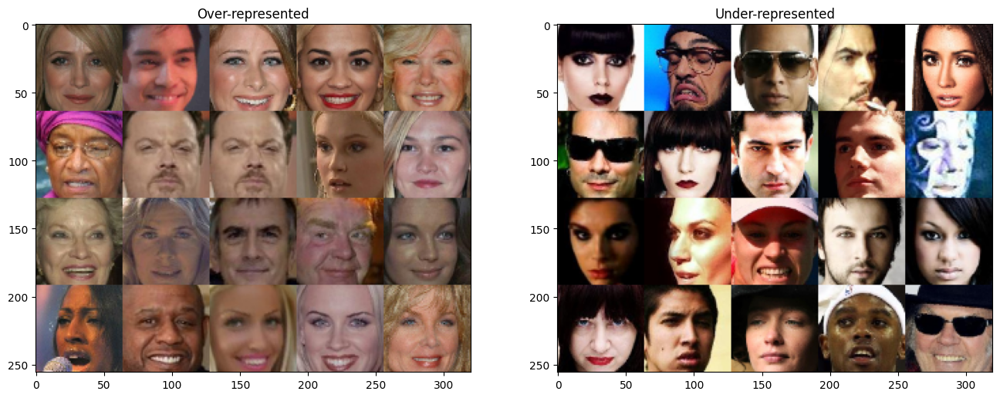

In [8]:
### Analyzing representation bias scores ###

# Sort according to lowest to highest representation scores
indices = np.argsort(out.bias, axis=None) # sort the score values themselves
sorted_images = test_imgs[indices] # sort images from lowest to highest representations
sorted_biases = out.bias.numpy()[indices] # order the representation bias scores
sorted_preds = out.y_hat.numpy()[indices] # order the prediction values


# Visualize the 20 images with the lowest and highest representation in the test dataset
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
ax[0].imshow(mdl.util.create_grid_of_images(sorted_images[-20:], (4, 5)))
ax[0].set_title("Over-represented")

ax[1].imshow(mdl.util.create_grid_of_images(sorted_images[:20], (4, 5)))
ax[1].set_title("Under-represented");

We can also quantify how the representation density relates to the classification accuracy by plotting the two against each other:

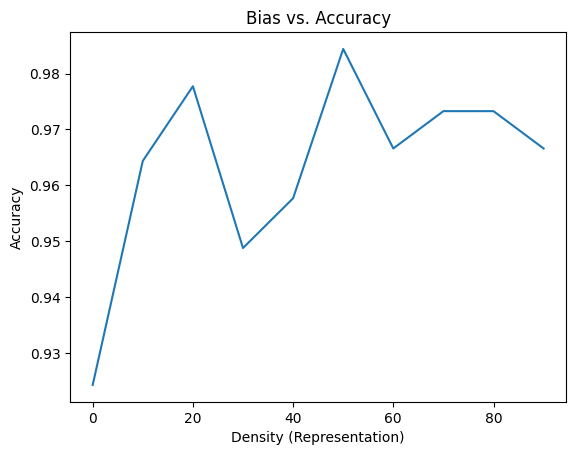

<Figure size 640x480 with 0 Axes>

In [9]:
# Plot the representation density vs. the accuracy
plt.xlabel("Density (Representation)")
plt.ylabel("Accuracy")
averaged_imgs = mdl.lab3.plot_accuracy_vs_risk(sorted_images, sorted_biases, sorted_preds, "Bias vs. Accuracy")

These representations scores relate back to data examples, so we can visualize what the average face looks like for a given *percentile* of representation density:

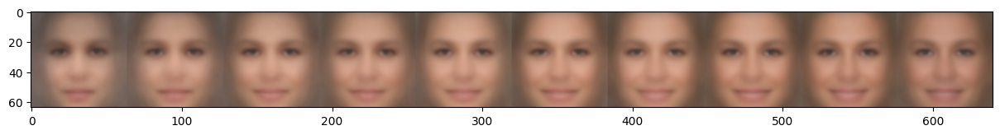

In [10]:
fig, ax = plt.subplots(figsize=(15,5))
ax.imshow(mdl.util.create_grid_of_images(averaged_imgs, (1,10)))

#### **TODO: Scoring representation densities with Capsa**

Write short answers to the questions below to complete the `TODO`s:

1. How does accuracy relate to the representation score? From this relationship, what can you determine about the bias underlying the dataset?
2. What does the average face in the 10th percentile of representation density look like (i.e., the face for which 10% of the data have lower probability of occuring)? What about the 90th percentile? What changes across these faces?
3. What could be potential limitations of the `HistogramVAEWrapper` approach as it is implemented now?

# 3.4 Analyzing epistemic uncertainty with Capsa

Recall that *epistemic* uncertainty, or a model's uncertainty in its prediction, can arise from out-of-distribution data, missing data, or samples that are harder to learn. This does not necessarily correlate with representation bias! Imagine the scenario of training an object detector for self-driving cars: even if the model is presented with many cluttered scenes, these samples still may be harder to learn than scenes with very few objects in them.

We will now use our VAE-wrapped facial detection classifier to analyze and estimate the epistemic uncertainty of the model trained on the facial detection task.

While most methods of estimating epistemic uncertainty are *sampling-based*, we can also use ***reconstruction-based*** methods -- like using VAEs -- to estimate epistemic uncertainty. If a model is unable to provide a good reconstruction for a given data point, it has not learned that area of the underlying data distribution well, and therefore has high epistemic uncertainty.



Since we've already used the `HistogramVAEWrapper` to calculate the histograms for representation bias quantification, we can use the exact same VAE wrapper to shed insight into epistemic uncertainty! Capsa helps us do exactly that. When we called the model, we returned the classification prediction, uncertainty, and bias for every sample:
`predictions, uncertainty, bias = wrapped_model.predict(test_imgs, batch_size=512)`.

Let's analyze these estimated uncertainties:

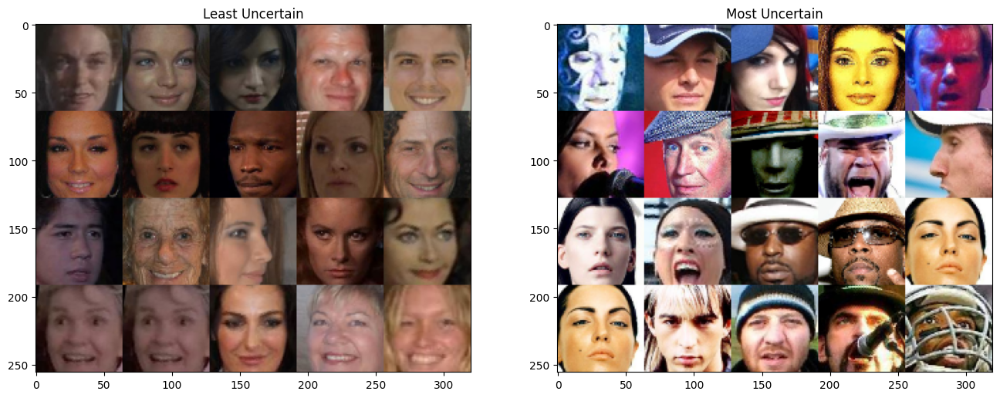

In [11]:
### Analyzing epistemic uncertainty estimates ###

# Sort according to epistemic uncertainty estimates
epistemic_indices = np.argsort(out.epistemic, axis=None) # sort the uncertainty values
epistemic_images = test_imgs[epistemic_indices] # sort images from lowest to highest uncertainty
sorted_epistemic = out.epistemic.numpy()[epistemic_indices] # order the uncertainty scores
sorted_epistemic_preds = out.y_hat.numpy()[epistemic_indices] # order the prediction values


# Visualize the 20 images with the LEAST and MOST epistemic uncertainty
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
ax[0].imshow(mdl.util.create_grid_of_images(epistemic_images[:20], (4, 5)))
ax[0].set_title("Least Uncertain");

ax[1].imshow(mdl.util.create_grid_of_images(epistemic_images[-20:], (4, 5)))
ax[1].set_title("Most Uncertain");

We quantify how the epistemic uncertainty relates to the classification accuracy by plotting the two against each other:

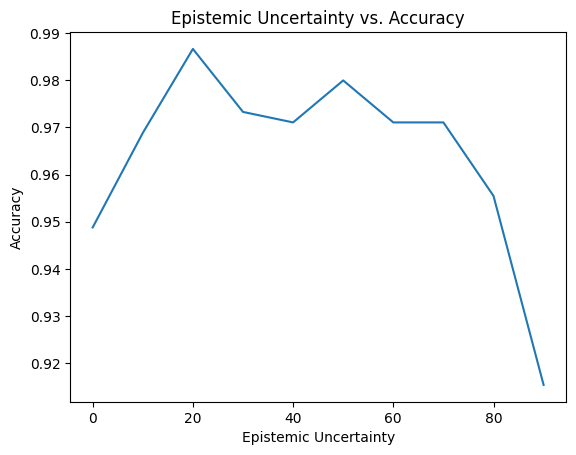

<Figure size 640x480 with 0 Axes>

In [12]:
# Plot epistemic uncertainty vs. classification accuracy
plt.xlabel("Epistemic Uncertainty")
plt.ylabel("Accuracy")
_ = mdl.lab3.plot_accuracy_vs_risk(epistemic_images, sorted_epistemic, sorted_epistemic_preds, "Epistemic Uncertainty vs. Accuracy")

#### **TODO: Estimating epistemic uncertainties with Capsa**

Write short answers to the questions below to complete the `TODO`s:

1. How does accuracy relate to the epistemic uncertainty?
2. How do the results for epistemic uncertainty compare to the results for representation bias? Was this expected or unexpted? Why?
3. What may be instances in the facial detection task that could have high representation density but also high uncertainty?

# 3.4 Resampling based on risk metrics

Finally, we will use the risk metrics just computed to actually *mitigate* the issues of bias and uncertainty in the facial detection classifier.

Specifically, we will use the latent variables learned via the VAE to adaptively re-sample the face (CelebA) data during training, following the approach of [recent work](http://introtodeeplearning.com/AAAI_MitigatingAlgorithmicBias.pdf). We will alter the probability that a given image is used during training based on how often its latent features appear in the dataset. So, faces with rarer features (like dark skin, sunglasses, or hats) should become more likely to be sampled during training, while the sampling probability for faces with features that are over-represented in the training dataset should decrease (relative to uniform random sampling across the training data).

Note that we want to debias and amplify only the *positive* samples in the dataset -- the faces -- so we are going to only adjust probabilities and calculate scores for these samples. We focus on using the representation bias scores to implement this adaptive resampling to achieve model debiasing.

We re-define the wrapped model with `HistogramVAEWrapper`, and then define the adaptive resampling operation for training. At each training epoch, we compute the predictions, uncertainties, and representation bias scores, then recompute the data sampling probabilities according to the *inverse* of the representation bias score. That is, samples with higher representation densities will end up with lower re-sampling probabilities; samples with lower representations will end up with higher re-sampling probabilities.

Let's do all this below!

In [13]:
### Define the standard CNN classifier and wrap with HistogramVAE ###

classifier = make_standard_classifier()
# Wrap with HistogramVAE
wrapper = capsa.HistogramVAEWrapper(classifier, latent_dim=32, num_bins=5,
                          queue_size=2000, decoder=make_face_decoder_network())

# Build the wrapped model for the classification task
wrapper.compile(optimizer=tf.keras.optimizers.Adam(5e-4),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=[tf.keras.metrics.BinaryAccuracy()])

# Load training data
train_imgs = train_loader.get_all_faces()

In [16]:
### Debiasing via resampling based on risk metrics ###

# The training loop -- outer loop iterates over the number of epochs
num_epochs = 6
for i in range(num_epochs):
  print("Starting epoch {}/{}".format(i+1, num_epochs))

  # Get a batch of training data and compute the training step
  for step, data in enumerate(train_loader):
    # metrics = wrapper.train_step(data)
    if step % 100 == 0:
        print(step)

  # After the epoch is done, recompute data sampling proabilities
  #  according to the inverse of the bias
  out = wrapper(train_imgs)

  # Increase the probability of sampling under-represented datapoints by setting
  #   the probability to the **inverse** of the biases
  inverse_bias = 1.0 / (np.mean(out.bias.numpy(),axis=-1) + 1e-7)

  # Normalize the inverse biases in order to convert them to probabilities
  p_faces = inverse_bias / np.sum(inverse_bias)

  # Update the training data loader to sample according to this new distribution
  train_loader.p_pos = p_faces

Starting epoch 1/6
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
Starting epoch 2/6
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
Starting epoch 3/6
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
Starting epoch 4/6
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
Starting epoch 5/6
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
Starting epoch 6/6
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300


That's it! We should have a debiased model (we hope!). Let's see how the model does.

### Evaluation

Let's run the same analyses as before, and plot the classification accuracy vs. the representation bias and classification accuracy vs. epistemic uncertainty. We want the model to do better across the data samples, achieving higher accuracies on the under-represented and more uncertain samples compared to previously.


141/141 [==============================] - 5s 20ms/step


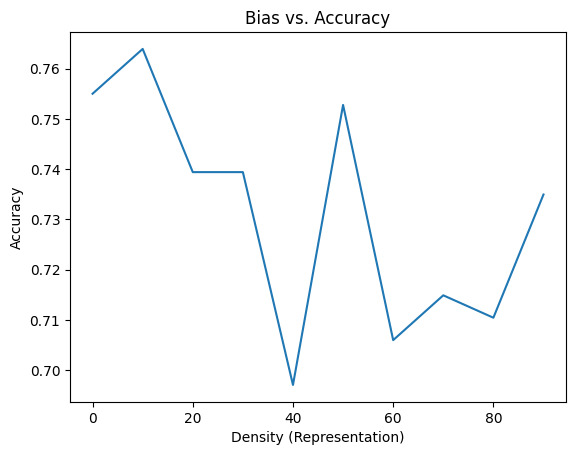

<Figure size 640x480 with 0 Axes>

In [17]:
### Evaluation of debiased model ###

# Get classification predictions, uncertainties, and representation bias scores
out = wrapper.predict(test_imgs)

# Sort according to lowest to highest representation scores
indices = np.argsort(out.bias, axis=None)
bias_images = test_imgs[indices] # sort the images
sorted_bias = out.bias.numpy()[indices] # sort the representation bias scores
sorted_bias_preds = out.y_hat.numpy()[indices] # sort the predictions

# Plot the representation bias vs. the accuracy
plt.xlabel("Density (Representation)")
plt.ylabel("Accuracy")
_ = mdl.lab3.plot_accuracy_vs_risk(bias_images, sorted_bias, sorted_bias_preds, "Bias vs. Accuracy")

# 3.5 Competition!

Now, you are well equipped to submit to the competition to dig in deeper into deep learning models, uncover their deficiencies with Capsa, address those deficiencies, and submit your findings!

**Below are some potential areas to start investigating -- the goal of the competition is to develop creative and innovative solutions to address bias and uncertainty, and to improve the overall performance of deep learning models.**

We encourage you to identify other questions that could be solved with Capsa and use those as the basis of your submission. But, to help get you started, here are some interesting questions that you might look into solving with these new tools and knowledge that you've built up:

1. In this lab, you learned how to build a wrapper that can estimate the bias within the training data, and take the results from this wrapper to adaptively re-sample during training to encourage learning on under-represented data.
  * Can we apply a similar approach to mitigate epistemic uncertainty in the model?
  * Can this approach be combined with your original bias mitigation approach to achieve robustness across both bias *and* uncertainty?

2. In this lab, you focused on the `HistogramVAEWrapper`.
  * How can you use other methods of uncertainty in Capsa to strengthen your uncertainty estimates? Checkout [Capsa documentation](https://themisai.io/capsa/api_documentation/index.html) for a list of all wrappers, and ask for help if you run into trouble applying them to your model!
  * Can you combine uncertainty estimates from different wrappers to achieve greater robustness in your estimates?

3. So far in this part of the lab, we focused only on bias and epistemic uncertainty. What about aleatoric uncetainty?
  * We've curated a dataset (available at [this URL](https://www.dropbox.com/s/wsdyma8a340k8lw/train_face_2023_perturbed_large.h5?dl=0)) of faces with greater amounts of aleatoric uncertainty -- can you use Capsa to wrap your model, estimate aleatoric uncertainty, and remove it from the dataset?
  * Does removing aleatoric uncertainty help improve your training accuracy on this new dataset?
  * Can you develop an approach to incorporate this aleatoric uncertainty estimation into the predictive training pipeline in order to improve accuracy? You may find some surprising results!!

4. How can the performance of the classifier above be improved even further? We purposely did not optimize hyperparameters to leave this up to you!

5. Are there other applications that you think Capsa and bias/uncertainty estimation would be helpful in?
  * Try integrating Capsa into another domain or dataset and submit your findings!
  * Are there applications where you may *not* want to debias your model?


**To enter the competition, please upload the following to the [lab submission site](https://www.dropbox.com/request/TTYz3Ikx5wIgOITmm5i2):**

* Written short-answer responses to `TODO`s from Lab 2, Part 2 on Facial Detection.
* Description of the wrappers, algorithms, and approach you used. What was your strategy? What wrappers did you implement? What debiasing or mitigation strategies did you try? How and why did these modifications affect performance? Describe *any* modifications or implementations you made to the template code, and what their effects were. Written text, visual diagram, and plots welcome!
* Jupyter notebook with the code you used to generate your results (along with all plots/visuals generated).

**Name your file in the following format: `[FirstName]_[LastName]_Face`, followed by the file format (.zip, .ipynb, .pdf, etc).** ZIP files are preferred over individual files. If you submit individual files, you must name the individual files according to the above nomenclature (e.g., `[FirstName]_[LastName]_Face_TODO.pdf`, `[FirstName]_[LastName]_Face_Report.pdf`, etc.). **Submit your files [here](https://www.dropbox.com/request/TTYz3Ikx5wIgOITmm5i2).**

We encourage you to think about and maybe even address some questions raised by this lab and dig into any questions that you may have about the risks inherrent to neural networks and their data.

<img src="https://i.ibb.co/BjLSRMM/ezgif-2-253dfd3f9097.gif" />